In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import layers

%run C:\Projects\Stock_price_prediction\Experiments_YHdata\data_processing_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\feature_engineering.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_entropy\training_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_entropy\simulation_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_entropy\CNN_Class.ipynb

import random
import math
import gc

In [2]:
# Check if GPU is connected
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [3]:
# For importing processed data
processed_data_path = 'C:/Projects/Stock_price_prediction/Experiments_YHdata/YH_processed_20180103-20241206.csv'

# Prepare data

In [4]:
basic_factors = ['cshtrd', 'prccd', 'prchd', 'prcld', 'prcod', 'dol_vol', 'Mom_2day', 'Mom_3day', 'Mom_5day',
                 'MA_10day', 'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD', 'MACD_Signal_Line']

TA_factors = [# Momentum indicators
              'momentum_stoch_rsi', 'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'momentum_kama', 'momentum_wr',
              # Volume indicators
              'volume_adi', 'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt',
              # Volatility indicators
              'volatility_atr', 'volatility_bbh', 'volatility_dcw', 'volatility_ui',
              # Trend indicators
              'trend_adx', 'trend_aroon_up', 'trend_aroon_down', 'trend_ichimoku_a',
              # Other indicators
              'others_dr'
]

# Remove factors that have low variance
basic_factors.remove('dol_vol')

# Remove factors that have high correlation with the prcod (and prcod since it shouldn't affect the return)
basic_factors.remove('prccd')
basic_factors.remove('prcld')
basic_factors.remove('prchd')
basic_factors.remove('prcod')
basic_factors.remove('MA_10day')
TA_factors.remove('trend_ichimoku_a')
TA_factors.remove('volatility_bbh')
TA_factors.remove('momentum_kama')

# Remove factors that have high correlation with momentum_stoch
TA_factors.remove('momentum_wr')

factors = basic_factors + TA_factors
print(f'There are {len(basic_factors)} basic factors')
print(f'There are {len(TA_factors)} TA factors')
print(f'There are {len(factors)} factors')

data = pd.read_csv(processed_data_path)
all_days = list(data['datadate'].unique())
num_of_tokens = data.sector.nunique()
num_to_tic_dict, tic_to_num_dict = num_tic_dicts(data)

data = remove_dead_stocks(data)

# 1. Use fixed_size objective labeling
# data = assign_class_labels(data, 'fixed_size')
# data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'DistinctRank', 'rank', 'sector']]
# 2. Use fixed_threshold objective labeling
data = assign_class_labels(data, 'fixed_thres')
data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector']]

data

There are 12 basic factors
There are 16 TA factors
There are 28 factors
EXPRQ is dead after 2024-08-14
IDEX is dead after 2024-08-13
SAVE is dead after 2024-11-21
SRNE is dead after 2023-09-28
VTNR is dead after 2024-10-07
ZOM is dead after 2020-09-24


,datadate,tic,cshtrd,Mom_2day,Mom_3day,Mom_5day,MA_50day,open/MA10,open/MA50,STD_10day,...,volatility_ui,trend_adx,trend_aroon_up,trend_aroon_down,others_dr,ret_d,TBill1y,rel_ret_d,rank,sector
0,2018-01-03,A,1698900.0,0.000000,0.000000,0.000000,67.620003,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,-0.011648,0.000071,-0.012974,-1,0
1,2018-01-04,A,2230700.0,0.000000,0.000000,0.000000,68.580002,1.013998,1.013998,1.357644,...,0.000000,0.000000,4.0,0.0,2.839394,0.014550,0.000072,0.012388,1,0
2,2018-01-05,A,1632500.0,0.016415,0.000000,0.000000,68.630002,1.001457,1.001457,0.963898,...,0.000000,0.000000,8.0,0.0,-1.164794,0.013624,0.000071,0.010738,1,0
3,2018-01-08,A,1613400.0,0.002732,0.031204,0.000000,68.905003,1.011973,1.011973,0.960156,...,0.000000,0.000000,12.0,0.0,1.454969,0.010894,0.000070,0.013818,1,0
4,2018-01-09,A,2666100.0,0.028372,0.016393,0.000000,69.260002,1.020502,1.020502,1.149586,...,0.000000,0.000000,16.0,0.0,1.362393,-0.007418,0.000070,-0.010233,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750931,2024-11-29,ZWS,429100.0,0.001502,-0.003984,0.023018,37.296400,1.014662,1.072490,0.558605,...,2.369220,42.423606,36.0,12.0,0.225508,0.005238,0.000167,0.004944,0,2
3750932,2024-12-02,ZWS,1118400.0,0.004510,0.003756,0.011863,37.401800,1.013705,1.071874,0.552304,...,2.304960,42.155556,32.0,8.0,0.225000,0.003722,0.000167,0.005939,0,2
3750933,2024-12-03,ZWS,663000.0,0.007500,0.009772,0.003486,37.514600,1.015037,1.074248,0.520022,...,2.295787,42.199615,100.0,4.0,0.523819,0.007911,0.000166,-0.004699,0,2
3750934,2024-12-04,ZWS,851300.0,0.008980,0.011250,0.012769,37.637200,1.014624,1.074735,0.462531,...,2.261093,42.325318,100.0,0.0,0.372212,0.000000,0.000164,0.000000,0,2


In [5]:
data.columns

Index(['datadate', 'tic', 'cshtrd', 'Mom_2day', 'Mom_3day', 'Mom_5day',
       'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD',
       'MACD_Signal_Line', 'momentum_stoch_rsi', 'momentum_stoch',
       'momentum_ao', 'momentum_pvo', 'volume_adi', 'volume_em', 'volume_fi',
       'volume_cmf', 'volume_vpt', 'volatility_atr', 'volatility_dcw',
       'volatility_ui', 'trend_adx', 'trend_aroon_up', 'trend_aroon_down',
       'others_dr', 'ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector'],
      dtype='object')

# First Training

## Set parameters

In [6]:
# Whether to save the model after every training
save = True

# Set Seed
seed = 120

all_days = list(data['datadate'].unique())
num_of_ts = len(all_days)
batch_size = 4096 # Only for model.predict()
print(f'There are {num_of_ts} days in the dataset')

tickers = list(data.tic.unique())
nt = len(tickers)
print(f'There are {nt} tickers')
assert len(tickers) * num_of_ts == data.shape[0]

seq_length = 20 # Length of time-series
train_length = 200 # Length of training data
ftd = train_length # First train day
ltd = ftd+train_length-1 # Last train day
num_stocks = 10 # Choose the top {num_stocks} each day
num_of_models = 3

num_iters = math.floor((num_of_ts - 2*train_length) / seq_length)
print(f'There are {num_iters} iterations')

There are 1743 days in the dataset
There are 2152 tickers
There are 67 iterations


In [7]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
data_train, x_train, y_train, data_test, x_test, y_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)

Standardization data are from 2018-01-03 to 2018-10-17
Training data are from 2018-10-18 to 2019-08-06
Testing data are from 2019-07-11 to 2019-09-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)


In [8]:
model_params = {
    # For training and validation
    'num_models': 3,
    'train_patience': 20,
    'plateau_patience': 5,
    'retrain_patience': 20,
    'validation_split': 0.2,
    'learning_rate': 0.005,
    'retrain_learning_rate': 0.005,
    'min_learning_rate': 0.0005,
    'epochs': 500,
    'batch_size': 1024,
    # Model inputs
    'target': keras.layers.Input(shape=1),
    'ret_d': keras.layers.Input(shape=1),
    'sector_input': keras.layers.Input(shape=1),
    # Categorical input dimension
    'embedding_dim': len(factors),
    # Convolution parameters
    'num_of_tokens': num_of_tokens,
    'filter_dims': [64, 128],
    'kernel_sizes': [4, 5],
    'strides': [2, 2],
    'paddings': ["valid", "valid"],
    # Dense layer parameters
    'layer_dims': [32, 8],
    'output_dim': 5,
    'activation': "leaky_relu",
    # Regularization parameter
    'dropout_conv': 0.4,
    'dropout_dense': 0.4
}

In [9]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_entropy\CNN_Class.ipynb
CNN_model = CNN(x_train.shape[1:], seed, **model_params)

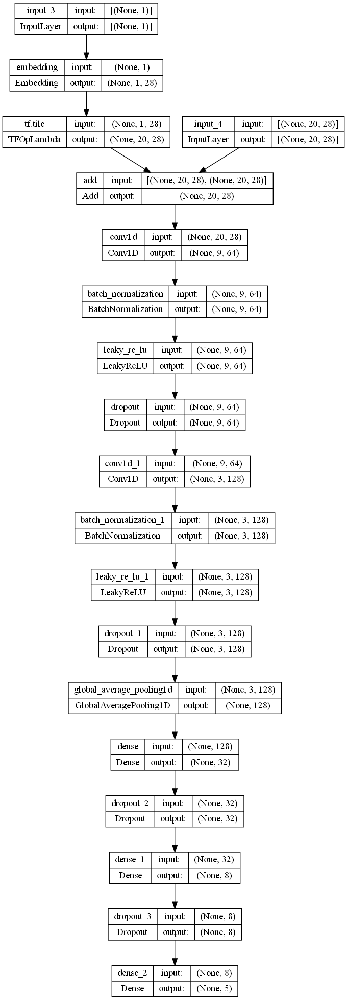

In [10]:
keras.utils.plot_model(CNN_model.model_dict[0], "pic.png", show_shapes=True)

In [11]:
# Save previous weights to compare with next trained weights
old_weights = {}
for i in range(num_of_models):
    old_weights[i] = CNN_model.model_dict[i].get_weights()

In [12]:
# %run C:\Projects\Stock_price_prediction\Experiments\Baseline\CNN_MSE\CNN_Class.ipynb
gc.collect()
CNN_model.compile_model()
CNN_model.train_model(x_train, y_train, sector_train) 
CNN_model.evaluate_model(x_train, y_train, sector_train, x_test, y_test, sector_test, batch_size)

if save:
    for i in range(model_params['num_models']):
        CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

gc.collect()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 28)        336         ['input_3[0][0]']                
                                                                                                  
 input_4 (InputLayer)           [(None, 20, 28)]     0           []                               
                                                                                                  
 tf.tile (TFOpLambda)           (None, 20, 28)       0           ['embedding[0][0]']              
                                                                                              

2900

In [13]:
# Save trained weights to compare with old weights
new_weights = {}
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([x_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))
    new_weights[i] = CNN_model.model_dict[i].get_weights()
    print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
    x = old_weights[i][-1]
    y = new_weights[i][-1]
    print(np.corrcoef(x.reshape(40, ), y.reshape(40, ))[0, 1])
    
# Now set the new weights to old weights
old_weights = new_weights.copy()

[0.06007227 0.17444761 0.5022797  0.20207027 0.06113041]
[0.05114223 0.05280508 0.1797301  0.04934794 0.04949221]
0.28707125771330805
0.575644209170191
[0.06157406 0.17518397 0.5013759  0.20208333 0.05978352]
[0.05705852 0.05420671 0.17958094 0.04964315 0.04716784]
0.12483516068549806
0.39737445834808777
[0.05954468 0.17292109 0.5040056  0.20144063 0.06208571]
[0.05163639 0.05336494 0.18461433 0.05118214 0.0565367 ]
0.30507130799914306
0.6030915121772198


In [14]:
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([x_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))

[0.06007227 0.17444761 0.5022797  0.20207027 0.06113041]
[0.05114223 0.05280508 0.1797301  0.04934794 0.04949221]
[0.06157406 0.17518397 0.5013759  0.20208333 0.05978352]
[0.05705852 0.05420671 0.17958094 0.04964315 0.04716784]
[0.05954468 0.17292109 0.5040056  0.20144063 0.06208571]
[0.05163639 0.05336494 0.18461433 0.05118214 0.0565367 ]


## Simulating

Testing data from 2019-07-11 to 2019-08-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-08 are ['AEP', 'FBIN', 'AWK', 'SNA', 'PSMT', 'MMC', 'PNW', 'MPW', 'CPAY', 'LII']
position on 2019-08-09 market open will be {'PSMT': 0.0999661647316706, 'PNW': 0.10016445732637272, 'FBIN': 0.10103389251602474, 'MMC': 0.10192327084748641, 'MPW': 0.10173766515297603, 'SNA': 0.1007502569843703, 'CPAY': 0.10102564102564103, 'AWK': 0.10161235708157262, 'AEP': 0.10106957549145044, 'LII': 0.10068671395269722}
Total asset on 2019-08-09 will be 1.009969995110262
It should be the same as 1.009969995110262
top_stocks by model 1 to buy on 2019-08-08 are ['SXT', 'PDI', 'SAP', 'SNA', 'CXW', 'CALM', 'BC', 'SFBS', 'WTFC', 'RYTM']
position on 2019-08-09 market open will be {'WTFC': 0.09959301076579621, 'SXT': 0.10075746096624585, 'BC': 0.10131105713656519, 'RYTM': 0.09954484079541912, 'PDI': 0.0998447228699507, 'SNA': 0.1007502569843703, 'SAP': 0.09881612691916791, 'CALM': 0.10196230866

position on 2019-08-14 market open will be {'TRV': 0.09821509962975246, 'TGT': 0.09918620745265194, 'PNW': 0.10078376045535303, 'EXC': 0.09841263442522885, 'CUZ': 0.09904586221260435, 'PEP': 0.09982690225304827, 'IEX': 0.09888944679317206, 'IHF': 0.09991805786402522, 'SAVE': 0.09701479787319095, 'LII': 0.09813143123903999}
Total asset on 2019-08-14 will be 0.9894242001980665
It should be the same as 0.9894242001980671
top_stocks by model 1 to buy on 2019-08-13 are ['UMC', 'PTC', 'SAP', 'WIT', 'RELX', 'GEO', 'PDI', 'CXW', 'ROL', 'IWM']
position on 2019-08-14 market open will be {'ROL': 0.09630046582133789, 'RELX': 0.09572853094457004, 'UMC': 0.09719848941609803, 'PDI': 0.0968422675263278, 'SAP': 0.09573448955028852, 'GEO': 0.09628933657085648, 'IWM': 0.09646539470789985, 'WIT': 0.09399866232700094, 'CXW': 0.09655529020309653, 'PTC': 0.0968547783925084}
Total asset on 2019-08-14 will be 0.9619677054599841
It should be the same as 0.9619677054599844
top_stocks by model 2 to buy on 2019-08

top_stocks by model 0 to buy on 2019-08-16 are ['LII', 'CHRW', 'TRV', 'COF', 'HYS', 'UAA', 'CUZ', 'BBD', 'IT', 'NSP']
position on 2019-08-19 market open will be {'CUZ': 0.10157877794373589, 'NSP': 0.10183460607540547, 'BBD': 0.09842505397361222, 'HYS': 0.09873834212200197, 'CHRW': 0.09957296454512131, 'TRV': 0.09978306150306167, 'COF': 0.10101190923640746, 'LII': 0.10059318348118598, 'IT': 0.10080646864705253, 'UAA': 0.10008127799011854}
Total asset on 2019-08-19 will be 1.0024256455177025
It should be the same as 1.002425645517703
top_stocks by model 1 to buy on 2019-08-16 are ['CALX', 'AWI', 'EPI', 'FMS', 'ZION', 'SLM', 'LYG', 'FBP', 'MOS', 'OLLI']
position on 2019-08-19 market open will be {'SLM': 0.09841546335715036, 'LYG': 0.09808740833068615, 'ZION': 0.09773597326137905, 'MOS': 0.09737513018980204, 'AWI': 0.09634397890059618, 'FBP': 0.09836773206473164, 'CALX': 0.09807530753347249, 'FMS': 0.09821903023823624, 'OLLI': 0.09747298914364104, 'EPI': 0.09498357956370664}
Total asset on

position on 2019-08-22 market open will be {'EWH': 0.09824479012348752, 'BCPC': 0.09965632587493532, 'TBF': 0.10091566935184586, 'HEFA': 0.10054637270202471, 'VPL': 0.10024905415604402, 'IJJ': 0.10076417025121664, 'COF': 0.10061760027086625, 'DLTR': 0.10095736100741978, 'FNDF': 0.10052765145780371, 'EPP': 0.09985152098164023}
Total asset on 2019-08-22 will be 1.002330516177284
It should be the same as 1.0023305161772842
top_stocks by model 1 to buy on 2019-08-21 are ['UNG', 'HCC', 'TSE', 'LAZ', 'TXT', 'CRI', 'TRN', 'APH', 'SLM', 'TPR']
position on 2019-08-22 market open will be {'SLM': 0.10080418598420197, 'TXT': 0.09756702954586585, 'APH': 0.09906519277121459, 'LAZ': 0.09746676384307632, 'HCC': 0.09885604653427829, 'TSE': 0.09632726148816591, 'UNG': 0.09676196738684403, 'TPR': 0.1001271993876118, 'CRI': 0.09804275715596147, 'TRN': 0.09732223387139341}
Total asset on 2019-08-22 will be 0.982340637968613
It should be the same as 0.9823406379686136
top_stocks by model 2 to buy on 2019-08

top_stocks by model 1 to buy on 2019-08-26 are ['ADM', 'KLIC', 'TBF', 'TMV', 'BMO', 'ENR', 'PRKS', 'RAMP', 'DBA', 'MOS']
position on 2019-08-27 market open will be {'TBF': 0.0949106107737723, 'KLIC': 0.09391475533080265, 'DBA': 0.09638758611140763, 'MOS': 0.09519128351191185, 'BMO': 0.09447213907405218, 'TMV': 0.09475314196947315, 'PRKS': 0.0953528103713834, 'ADM': 0.09637403502644362, 'ENR': 0.09619608321773924, 'RAMP': 0.09709467995406232}
Total asset on 2019-08-27 will be 0.9546471253410478
It should be the same as 0.9546471253410483
top_stocks by model 2 to buy on 2019-08-26 are ['NKTR', 'APPS', 'SHV', 'DXC', 'FCEL', 'GUSH', 'CARS', 'WKHS', 'AXSM', 'MRIN']
position on 2019-08-27 market open will be {'AXSM': 0.09932991694651017, 'GUSH': 0.08342696629213486, 'MRIN': 0.13095237698774861, 'WKHS': 0.1277611917524196, 'CARS': 0.10768046558212288, 'FCEL': 0.10001666754985947, 'DXC': 0.10385854572566104, 'SHV': 0.10525366288429774, 'NKTR': 0.10802512152544548, 'APPS': 0.10285833744463917}


position on 2019-08-30 market open will be {'TBF': 0.09491061077377229, 'APH': 0.0979082347506371, 'RUN': 0.09767637265137447, 'MDYV': 0.09692011210178161, 'BAP': 0.09632368891118195, 'COWZ': 0.09641730433642731, 'XRT': 0.09642701491230683, 'ITT': 0.09839718187499537, 'ROG': 0.0984345353103475, 'TJX': 0.09727264267276356}
Total asset on 2019-08-30 will be 0.9706876982955873
It should be the same as 0.9706876982955881
top_stocks by model 2 to buy on 2019-08-29 are ['ICUI', 'DXC', 'CLB', 'MYGN', 'FLR', 'WKHS', 'CARS', 'GUSH', 'AXSM', 'MRIN']
position on 2019-08-30 market open will be {'AXSM': 0.10063066551879922, 'GUSH': 0.09494382022471914, 'MRIN': 0.12999998940361907, 'WKHS': 0.1289552261580283, 'CARS': 0.11299038862705249, 'CLB': 0.11227771704206485, 'FLR': 0.10506939949532366, 'DXC': 0.09975908563638773, 'ICUI': 0.09501630811452426, 'MYGN': 0.09757544038211641}
Total asset on 2019-08-30 will be 1.0772180406026355
It should be the same as 1.0772180406026353
top_stocks by return weight

top_stocks by model 2 to buy on 2019-09-04 are ['DXC', 'GGAL', 'APPS', 'WKHS', 'ENPH', 'CARS', 'GUSH', 'AXSM', 'PCG', 'MRIN']
position on 2019-09-05 market open will be {'AXSM': 0.09940874449776553, 'GUSH': 0.09382022471910116, 'MRIN': 0.11285714155962687, 'WKHS': 0.11134328130465841, 'CARS': 0.11237296420496992, 'ENPH': 0.08974392494381825, 'APPS': 0.09687351027951581, 'GGAL': 0.09639153508964095, 'PCG': 0.09498417740125589, 'DXC': 0.09696485660517823}
Total asset on 2019-09-05 will be 1.0047603606055315
It should be the same as 1.004760360605531
top_stocks by return weighted ensemble to buy on 2019-09-04 are ['IHF', 'TXT', 'XLE', 'WCC', 'ENOV', 'RY', 'BVN', 'AGNC', 'AEG', 'CACI']
position on 2019-09-05 market open will be {'TXT': 0.10250008129585546, 'CACI': 0.10230171425065523, 'WCC': 0.10259982952973674, 'ENOV': 0.10302380598929439, 'RY': 0.1016266133910596, 'XLE': 0.10174694738858032, 'BVN': 0.09869597984543843, 'AEG': 0.10354967670868148, 'IHF': 0.10058998015804287, 'AGNC': 0.102

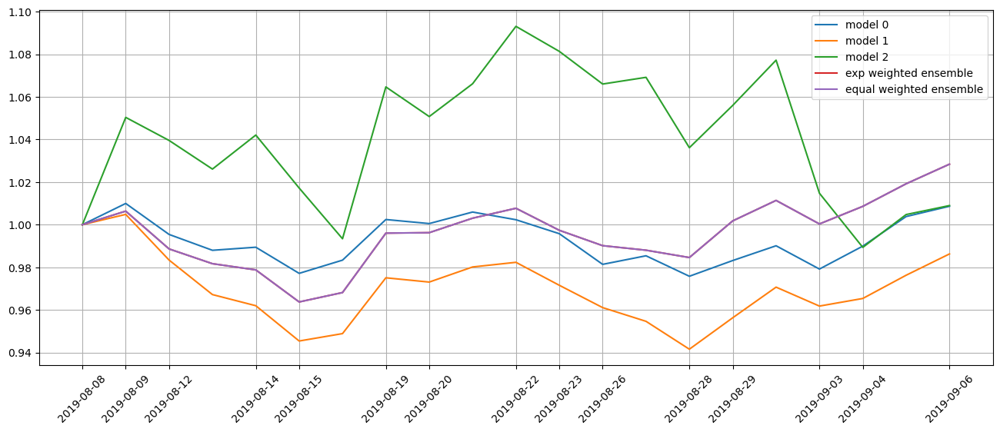

In [15]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_entropy\simulation_functions.ipynb
ftd = train_length
ltd = ftd+train_length-1
first_run = True
total_dict = {}
total_asset_dict = {}
position_dict_all = {}
num_iter = 0
for i in range(num_of_models):
    total_dict[i] = 1
    total_asset_dict[i] = [1]
    position_dict_all[i] = {}
total_dict['ensemble_weighted'] = 1
total_asset_dict['ensemble_weighted'] = [1]
position_dict_all['ensemble_weighted'] = {}
total_dict['ensemble_equal'] = 1
total_asset_dict['ensemble_equal'] = [1]
position_dict_all['ensemble_equal'] = {}

return_dict = {}
total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, position_dict_all, return_dict)

In [16]:
# pd.DataFrame(CNN_model.model_dict[0].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test0.csv')
# pd.DataFrame(CNN_model.model_dict[1].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test1.csv')
# pd.DataFrame(CNN_model.model_dict[2].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test2.csv')

# Retraining

Running 67 iterations; first iteration already completed.
Standardization data are from 2018-02-01 to 2018-11-14
Training data are from 2018-11-15 to 2019-09-04
Testing data are from 2019-08-08 to 2019-10-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 2 out of 67 iterations
Restoring model weights from the end of the best epoch: 35.
Epoch 55: early stopping
Restoring model weights from the end of the best epoch: 35.
Epoch 55: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1651611328125
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2312365770339966
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1535929441452026
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2316219806671143
96/96 [=====================

top_stocks by model 2 to buy on 2019-09-10 are ['HLNE', 'SR', 'TGT', 'AFL', 'EXC', 'CMS', 'VLUE', 'RPV', 'AWR', 'RY']
position on 2019-09-11 market open will be {'TGT': 0.10042517921224492, 'EXC': 0.10197509176628913, 'RY': 0.1018756138689292, 'RPV': 0.10405039649801798, 'AFL': 0.10128340070735262, 'AWR': 0.10044388651448062, 'VLUE': 0.10336582483513629, 'HLNE': 0.10044460669204133, 'SR': 0.1003527993260519, 'CMS': 0.10058631014924624}
Total asset on 2019-09-11 will be 1.01480310956979
It should be the same as 1.0148031095697903
top_stocks by return weighted ensemble to buy on 2019-09-10 are ['IJH', 'BBY', 'ELV', 'NLY', 'RCI', 'BCO', 'IHF', 'JBLU', 'AGNC', 'TDC']
position on 2019-09-11 market open will be {'AGNC': 0.10805458118146022, 'TDC': 0.10951663698574177, 'BCO': 0.10751204283312892, 'NLY': 0.10684420235049331, 'JBLU': 0.10429101521603075, 'RCI': 0.10435588162827121, 'IJH': 0.10518607816710956, 'IHF': 0.10535806997723803, 'BBY': 0.10405422753148379, 'ELV': 0.10498717831405632}
To

position on 2019-09-16 market open will be {'VAW': 0.10842495656950421, 'MMM': 0.10852311101523404, 'IJJ': 0.10769292623418675, 'IWO': 0.10718469271507226, 'IJS': 0.10762708330771877, 'ATGE': 0.10569905363906208, 'FXO': 0.10712705267666502, 'UWM': 0.10704649391507597, 'TNA': 0.10643950198400615, 'COMM': 0.10428662656366283}
Total asset on 2019-09-16 will be 1.0700514986201872
It should be the same as 1.070051498620188
Testing data from 2019-08-16 to 2019-09-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-09-16 are ['KW', 'NEE', 'DEI', 'SO', 'CQQQ', 'SCHR', 'JBGS', 'AAT', 'REXR', 'FXL']
position on 2019-09-17 market open will be {'FXL': 0.0990699778122705, 'SO': 0.09884540370297608, 'KW': 0.1000667696628437, 'SCHR': 0.09936580097028762, 'CQQQ': 0.09819471182764727, 'AAT': 0.0986880047740367, 'NEE': 0.0991985648768512, 'JBGS': 0.1004621265457443, 'REXR': 0.10038578671563259, 'DEI': 0.09923398772611242}
Total asset on 2019-09-17 will be 0.9935111346144027
It sho

top_stocks by model 0 to buy on 2019-09-19 are ['LPG', 'PMT', 'ACGL', 'ALLY', 'KIM', 'TXN', 'AAT', 'JCI', 'BEP', 'GXC']
position on 2019-09-20 market open will be {'PMT': 0.10056643611995071, 'BEP': 0.10124011949608995, 'ALLY': 0.09917898009511578, 'LPG': 0.09868155353386296, 'GXC': 0.09992309239750662, 'AAT': 0.10032537237363127, 'JCI': 0.10047961778873035, 'ACGL': 0.10036412449362976, 'KIM': 0.09957823234542046, 'TXN': 0.0991441393613741}
Total asset on 2019-09-20 will be 0.9994816680053124
It should be the same as 0.999481668005312
top_stocks by model 1 to buy on 2019-09-19 are ['KSS', 'COMM', 'CFG', 'TTMI', 'ENR', 'EWBC', 'MODG', 'ERY', 'KOLD', 'DRIP']
position on 2019-09-20 market open will be {'KOLD': 0.10871744695253413, 'MODG': 0.10193564058220357, 'EWBC': 0.10279761693817176, 'DRIP': 0.10906134529749205, 'KSS': 0.09953223665029395, 'CFG': 0.10210813730469015, 'TTMI': 0.10178125527319425, 'ENR': 0.10078162171215477, 'ERY': 0.10510900908624567, 'COMM': 0.10244540180860733}
Total

position on 2019-09-25 market open will be {'SPYG': 0.09819439953943808, 'XHB': 0.09936614997577813, 'KIE': 0.0998810746992815, 'SSO': 0.09769626421951075, 'AGQ': 0.10115428523095397, 'OGE': 0.10005131959990053, 'GXC': 0.09866007743947251, 'XAR': 0.09910053870020782, 'EQR': 0.10025041290520062, 'IVW': 0.09875958678918918}
Total asset on 2019-09-25 will be 0.9931141090989335
It should be the same as 0.993114109098933
top_stocks by model 1 to buy on 2019-09-24 are ['RL', 'SLYV', 'EWH', 'SPMD', 'SSNC', 'CHKP', 'FOXF', 'HUM', 'MO', 'KOLD']
position on 2019-09-25 market open will be {'FOXF': 0.10142156131061454, 'HUM': 0.10401397695511543, 'SSNC': 0.10363355585871249, 'KOLD': 0.11227162921501327, 'MO': 0.10604769885722921, 'EWH': 0.10360975572673814, 'SLYV': 0.10344256654508685, 'CHKP': 0.10256469313965663, 'SPMD': 0.1032147308602658, 'RL': 0.10234226463143696}
Total asset on 2019-09-25 will be 1.0425624330998684
It should be the same as 1.0425624330998693
top_stocks by model 2 to buy on 20

top_stocks by model 0 to buy on 2019-09-27 are ['ELS', 'AZN', 'REXR', 'KO', 'DOC', 'BEP', 'MCHI', 'APD', 'IGM', 'SIGI']
position on 2019-09-30 market open will be {'BEP': 0.10319875605848024, 'APD': 0.09816748914135479, 'ELS': 0.09819146500527272, 'AZN': 0.09884828547997489, 'DOC': 0.10050052169655287, 'MCHI': 0.0994091099071622, 'SIGI': 0.09835953218474226, 'KO': 0.09966097163373817, 'REXR': 0.09946567902953449, 'IGM': 0.09916202535605412}
Total asset on 2019-09-30 will be 0.9949638354928665
It should be the same as 0.9949638354928668
top_stocks by model 1 to buy on 2019-09-27 are ['DBA', 'WIX', 'TTD', 'BL', 'DECK', 'PI', 'KOLD', 'CP', 'SAP', 'DELL']
position on 2019-09-30 market open will be {'KOLD': 0.1253914939317102, 'DELL': 0.10083672269313598, 'DBA': 0.10607179089924401, 'CP': 0.10570408459945466, 'TTD': 0.10097349899802655, 'PI': 0.10110956351246134, 'SAP': 0.10454718248144972, 'DECK': 0.10765540333305547, 'WIX': 0.10423375758094541, 'BL': 0.10507383177309525}
Total asset on 20

position on 2019-10-03 market open will be {'LPG': 0.09826929683629786, 'O': 0.0999579688833789, 'ICVT': 0.09894397389094754, 'BEP': 0.10025540258733405, 'ROIC': 0.09929964263833753, 'XAR': 0.09910440806351051, 'DOC': 0.10001412358136995, 'IRT': 0.10077592081414093, 'WELL': 0.09954691400634069, 'PMT': 0.1004245619777021}
Total asset on 2019-10-03 will be 0.9965922132793598
It should be the same as 0.99659221327936
top_stocks by model 1 to buy on 2019-10-02 are ['OI', 'IHF', 'CNC', 'IJR', 'TSCO', 'HUM', 'DCI', 'FN', 'DELL', 'AEO']
position on 2019-10-03 market open will be {'IJR': 0.10421721304813097, 'DELL': 0.10364040775153684, 'FN': 0.10440931864884923, 'OI': 0.1017548199044098, 'CNC': 0.1051962491690389, 'TSCO': 0.1057003882334546, 'IHF': 0.10452089627955843, 'AEO': 0.10315264989135467, 'HUM': 0.10572301224912936, 'DCI': 0.10399778916692357}
Total asset on 2019-10-03 will be 1.0423127443423859
It should be the same as 1.0423127443423863
top_stocks by model 2 to buy on 2019-10-02 are

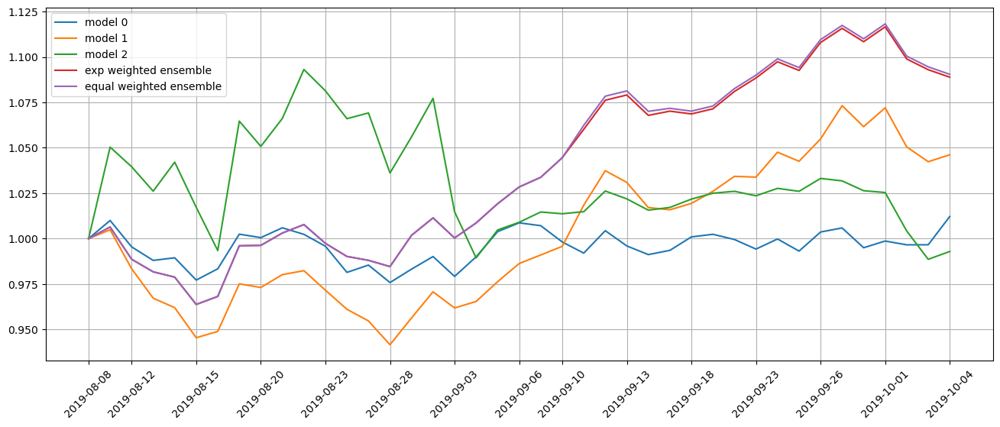

Standardization data are from 2018-03-02 to 2018-12-14
Training data are from 2018-12-17 to 2019-10-02
Testing data are from 2019-09-06 to 2019-10-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 3 out of 67 iterations
Restoring model weights from the end of the best epoch: 44.
Epoch 64: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 65.
Epoch 85: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1567089557647705
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1310615539550781
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1543370485305786
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1340206861495972
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.153606

top_stocks by model 2 to buy on 2019-10-08 are ['PDBC', 'MGV', 'SJNK', 'ARI', 'TWO', 'NYMT', 'RWT', 'SPIP', 'TIP', 'TBF']
position on 2019-10-09 market open will be {'NYMT': 0.09908658662897364, 'RWT': 0.09973214762409495, 'SJNK': 0.09928777268016083, 'SPIP': 0.09880091327645492, 'MGV': 0.09907459859352508, 'ARI': 0.09925064102494512, 'TIP': 0.09890256878978772, 'TWO': 0.09925064102494512, 'PDBC': 0.100854562151509, 'TBF': 0.10016912854675449}
Total asset on 2019-10-09 will be 0.9944095603411491
It should be the same as 0.9944095603411509
top_stocks by return weighted ensemble to buy on 2019-10-08 are ['VNLA', 'ADSK', 'SAIC', 'PPLT', 'DBO', 'ALTR', 'DBC', 'VNQI', 'USO', 'GSG']
position on 2019-10-09 market open will be {'VNQI': 0.1094055025422673, 'DBO': 0.11029260935264641, 'USO': 0.10909789099518534, 'PPLT': 0.10670220368292992, 'SAIC': 0.10671424793263314, 'GSG': 0.10907645372459716, 'VNLA': 0.1068510555457123, 'ALTR': 0.10790782063367961, 'DBC': 0.10826268571380974, 'ADSK': 0.10767

position on 2019-10-14 market open will be {'USO': 0.1087372880237141, 'DBC': 0.10882324236541924, 'GSG': 0.10945415812391689, 'KOLD': 0.10191496979559989, 'ERY': 0.11075364116936201, 'SPIP': 0.10929983079209754, 'MNRO': 0.10967799588735111, 'CENN': 0.12724045881905338, 'SPAB': 0.10934299699330917, 'ULTA': 0.11019452852694647}
Total asset on 2019-10-14 will be 1.1054391104967685
It should be the same as 1.1054391104967698
top_stocks by equal weighted ensemble to buy on 2019-10-11 are ['ULTA', 'MNRO', 'GSG', 'DBC', 'ERY', 'CENN', 'SPIP', 'USO', 'KOLD', 'SPAB']
position on 2019-10-14 market open will be {'USO': 0.10889455697499789, 'DBC': 0.10898063563421569, 'GSG': 0.10961246389900708, 'KOLD': 0.10206237148927078, 'ERY': 0.11091382641321111, 'SPIP': 0.10945791336042886, 'MNRO': 0.10983662540355121, 'CENN': 0.12742448928259575, 'SPAB': 0.10950114199379526, 'ULTA': 0.11035390511480901}
Total asset on 2019-10-14 will be 1.1070379295658812
It should be the same as 1.1070379295658825
Testing

position on 2019-10-17 market open will be {'IGLB': 0.10946149848170651, 'SPLB': 0.1102200508949353, 'CNP': 0.11205629437453818, 'TLT': 0.11019962209259807, 'SCHZ': 0.11021210423504557, 'DOG': 0.10997812535043126, 'VGSH': 0.1102763042041639, 'BLV': 0.11018532057893202, 'ERY': 0.11282915241483024, 'EXR': 0.11044800353453789}
Total asset on 2019-10-17 will be 1.1058664761617174
It should be the same as 1.105866476161719
Testing data from 2019-09-19 to 2019-10-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-10-17 are ['HPP', 'CNP', 'URTH', 'PTLC', 'GL', 'SPYV', 'VONV', 'SPTM', 'SPYD', 'ARI']
position on 2019-10-18 market open will be {'ARI': 0.10136261818721301, 'HPP': 0.10325604557526394, 'PTLC': 0.10232699413303341, 'CNP': 0.10256212193002874, 'SPTM': 0.10218604917891076, 'SPYD': 0.10194721955870939, 'SPYV': 0.10223618084612561, 'GL': 0.10188609910833214, 'VONV': 0.10246310312113834, 'URTH': 0.10208353226549474}
Total asset on 2019-10-18 will be 1.022309963904

Testing data from 2019-09-24 to 2019-10-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-10-22 are ['EVRG', 'ICVT', 'SHYG', 'UHAL', 'BIL', 'ALLY', 'DFS', 'ARI', 'THS', 'SBAC']
position on 2019-10-23 market open will be {'ARI': 0.10168440141898574, 'SBAC': 0.10343034320617311, 'UHAL': 0.10216579094531976, 'THS': 0.10457495051295472, 'ICVT': 0.10236652955772706, 'ALLY': 0.10284138400328378, 'BIL': 0.1031990777682771, 'DFS': 0.10628239437443217, 'EVRG': 0.10452876620842823, 'SHYG': 0.10303248602239168}
Total asset on 2019-10-23 will be 1.0341061240179734
It should be the same as 1.0341061240179734
top_stocks by model 1 to buy on 2019-10-22 are ['PSLV', 'DOG', 'DXD', 'SPLB', 'SLV', 'BAND', 'CRM', 'AGQ', 'USFR', 'ERY']
position on 2019-10-23 market open will be {'SPLB': 0.10605223775820008, 'CRM': 0.10369417819947935, 'AGQ': 0.10604388526041765, 'DOG': 0.10594005120875738, 'USFR': 0.10583942579469945, 'BAND': 0.09778891835800034, 'PSLV': 0.10650092156520713, 'ERY':

top_stocks by model 0 to buy on 2019-10-25 are ['AMH', 'IYZ', 'VHT', 'CNP', 'XLV', 'SLF', 'CEF', 'USO', 'ICVT', 'ALLY']
position on 2019-10-28 market open will be {'CNP': 0.10355714015312963, 'AMH': 0.1052944169072112, 'ICVT': 0.1039357748715262, 'ALLY': 0.10530537034470125, 'IYZ': 0.10436276358621067, 'USO': 0.10434494032419331, 'VHT': 0.10393738310497312, 'CEF': 0.10153921996138655, 'XLV': 0.10385185231350529, 'SLF': 0.10407931920230852}
Total asset on 2019-10-28 will be 1.0402081807691463
It should be the same as 1.0402081807691457
top_stocks by model 1 to buy on 2019-10-25 are ['SONY', 'AGQ', 'PRGS', 'FDN', 'SIL', 'VHT', 'IYH', 'UNH', 'FHLC', 'IHF']
position on 2019-10-28 market open will be {'UNH': 0.10858729367472912, 'FDN': 0.10979484254383447, 'IYH': 0.10877685052175376, 'AGQ': 0.10433761894737983, 'SONY': 0.10913941088821251, 'VHT': 0.10876197929447952, 'IHF': 0.10882295390344214, 'PRGS': 0.11030720440910032, 'FHLC': 0.10882103585936229, 'SIL': 0.10686922179680979}
Total asset

position on 2019-10-31 market open will be {'OMFL': 0.1035457775089767, 'XYLD': 0.10477933241761096, 'AQN': 0.10564231083604006, 'PCY': 0.10465036850666348, 'RY': 0.10433395763237441, 'SHYG': 0.10430863207299718, 'SLF': 0.10421339771180416, 'ONEQ': 0.10513586842863232, 'HTGC': 0.10637263013695111, 'AMH': 0.10431948511591416}
Total asset on 2019-10-31 will be 1.0473017603679653
It should be the same as 1.0473017603679644
top_stocks by model 1 to buy on 2019-10-30 are ['SNV', 'XBI', 'IHI', 'IHF', 'FHLC', 'VBK', 'VHT', 'WBS', 'IBB', 'FBT']
position on 2019-10-31 market open will be {'FBT': 0.1099350513858397, 'IHI': 0.11048998373341401, 'SNV': 0.10734030702892568, 'IBB': 0.10900952654156162, 'IHF': 0.11042009444838909, 'VHT': 0.10958549691593891, 'XBI': 0.10823917915152571, 'VBK': 0.10921975943074942, 'FHLC': 0.10964389294938057, 'WBS': 0.10721393089309034}
Total asset on 2019-10-31 will be 1.0910972224788138
It should be the same as 1.0910972224788151
top_stocks by model 2 to buy on 2019

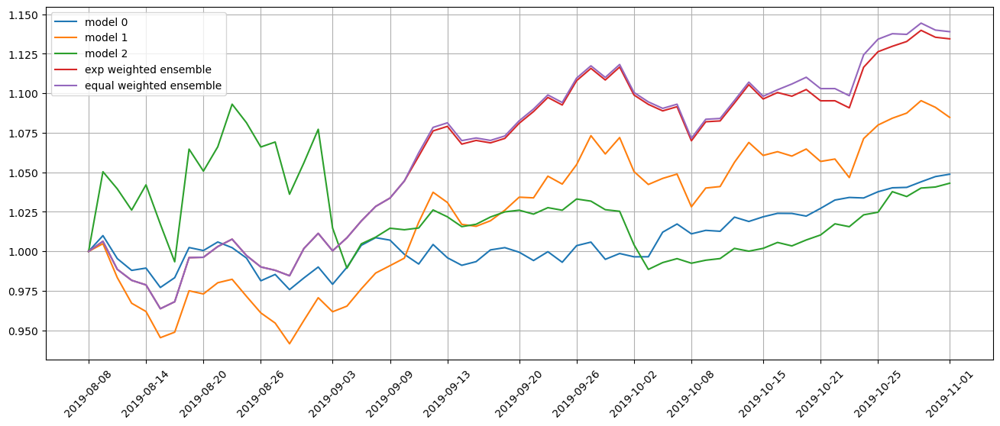

Standardization data are from 2018-04-02 to 2019-01-15
Training data are from 2019-01-16 to 2019-10-30
Testing data are from 2019-10-04 to 2019-11-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 4 out of 67 iterations
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 31.
Epoch 51: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 1.1521204710006714
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.0609855651855469
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.149957299232483
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.0687451362609863
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.1500951

position on 2019-11-06 market open will be {'BXMT': 0.10319072421203855, 'FCEL': 0.2520859418282473, 'ENPH': 0.09953339480435214, 'HYD': 0.10607685566373456, 'BKLN': 0.10652614440344771, 'AKR': 0.10578983811590187, 'FCNCA': 0.1055602334961192, 'FTSL': 0.1056719507139115, 'JBGS': 0.10380420905002977, 'UUP': 0.10597521510872768}
Total asset on 2019-11-06 will be 1.1942145073965076
It should be the same as 1.1942145073965102
top_stocks by return weighted ensemble to buy on 2019-11-05 are ['CHEF', 'NYCB', 'XLE', 'TKO', 'ATGE', 'GEO', 'JEF', 'EQC', 'WDC', 'AMBA']
position on 2019-11-06 market open will be {'WDC': 0.11238950861575032, 'CHEF': 0.11664574363735929, 'JEF': 0.11475731464758171, 'NYCB': 0.11578715904792831, 'ATGE': 0.11634973178213673, 'XLE': 0.11430361531366766, 'EQC': 0.11492884097968377, 'AMBA': 0.11964086859715235, 'GEO': 0.11030707416635127, 'TKO': 0.11263646154085057}
Total asset on 2019-11-06 will be 1.1477463183284593
It should be the same as 1.147746318328462
top_stocks 

position on 2019-11-11 market open will be {'SPTL': 0.11516230926345467, 'SHV': 0.11512223698385017, 'BND': 0.11520163207677352, 'UPBD': 0.11570106681083281, 'TLT': 0.11532858842991064, 'BWX': 0.11553818584127543, 'SMPL': 0.11852031683874092, 'TRI': 0.11699686483734384, 'BLV': 0.11529552379573942, 'AGG': 0.11522526589682319}
Total asset on 2019-11-11 will be 1.158091990774742
It should be the same as 1.1580919907747445
top_stocks by equal weighted ensemble to buy on 2019-11-08 are ['TRI', 'BND', 'AGG', 'SPTL', 'SMPL', 'BLV', 'TLT', 'BWX', 'SHV', 'UPBD']
position on 2019-11-11 market open will be {'SPTL': 0.11539814535693659, 'SHV': 0.1153579910149808, 'BND': 0.11543754869780597, 'UPBD': 0.11593800620344204, 'TLT': 0.11556476503956749, 'BWX': 0.11577479167673553, 'SMPL': 0.11876302965598345, 'TRI': 0.11723645784072614, 'BLV': 0.11553163269370999, 'AGG': 0.11546123091657073}
Total asset on 2019-11-11 will be 1.1604635990964567
It should be the same as 1.1604635990964587
Testing data from

position on 2019-11-14 market open will be {'EHTH': 0.11336288414477205, 'AMLP': 0.11313805634806436, 'TXT': 0.11706427726953214, 'ALLY': 0.1161657484802926, 'GSG': 0.11817519221031539, 'DBO': 0.11914559153371615, 'SPIP': 0.11716268994218637, 'GEO': 0.11568537640395123, 'FXN': 0.1161792146656016, 'DBC': 0.11802304508015281}
Total asset on 2019-11-14 will be 1.1641020760785827
It should be the same as 1.1641020760785847
Testing data from 2019-10-17 to 2019-11-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-14 are ['EGP', 'SPTI', 'NDSN', 'WKHS', 'VGIT', 'IEF', 'AXSM', 'APPS', 'ENPH', 'FCEL']
position on 2019-11-15 market open will be {'AXSM': 0.11448607460489751, 'FCEL': 0.36271231983338176, 'ENPH': 0.10056236522793756, 'NDSN': 0.10116925391443268, 'APPS': 0.11228044014261641, 'EGP': 0.10481888785625663, 'SPTI': 0.1019940362280895, 'VGIT': 0.10198471250992057, 'IEF': 0.10200075971221893, 'WKHS': 0.11456190179537389}
Total asset on 2019-11-15 will be 1.316570

Testing data from 2019-10-22 to 2019-11-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-19 are ['FAST', 'MUSA', 'SIL', 'WKHS', 'LPG', 'STIP', 'AXSM', 'APPS', 'ENPH', 'FCEL']
position on 2019-11-20 market open will be {'AXSM': 0.13157678124444014, 'FCEL': 0.292791882678955, 'ENPH': 0.10282947220435545, 'APPS': 0.11378664956133795, 'WKHS': 0.09936491611179395, 'STIP': 0.10287521146318651, 'FAST': 0.10186143829926454, 'SIL': 0.10235601464217564, 'MUSA': 0.10174822755888213, 'LPG': 0.10474580866673062}
Total asset on 2019-11-20 will be 1.253936402431122
It should be the same as 1.253936402431122
top_stocks by model 1 to buy on 2019-11-19 are ['AMCX', 'IBM', 'JBT', 'WK', 'TXT', 'MANH', 'EHTH', 'WRB', 'EXPO', 'FCFS']
position on 2019-11-20 market open will be {'EHTH': 0.11580911242664405, 'IBM': 0.11105357869955232, 'EXPO': 0.11057979283358244, 'TXT': 0.11083680324302378, 'FCFS': 0.1109963910766959, 'AMCX': 0.10973983386891129, 'WK': 0.11084930262689091, 'MANH':

top_stocks by model 0 to buy on 2019-11-22 are ['PLXS', 'TWO', 'VGIT', 'IEF', 'WU', 'WKHS', 'AXSM', 'APPS', 'ENPH', 'FCEL']
position on 2019-11-25 market open will be {'AXSM': 0.1451628060676072, 'FCEL': 0.34523222443671997, 'ENPH': 0.10423292036076895, 'APPS': 0.11556669386969909, 'WKHS': 0.10715824286566016, 'WU': 0.10191353928226038, 'VGIT': 0.10350182732236453, 'IEF': 0.1035144802934262, 'PLXS': 0.10141068297908584, 'TWO': 0.10327357992343289}
Total asset on 2019-11-25 will be 1.3309669974010252
It should be the same as 1.3309669974010254
top_stocks by model 1 to buy on 2019-11-22 are ['DLTR', 'FCFS', 'PRO', 'TXT', 'MCY', 'FTI', 'TRIP', 'PCY', 'EXPO', 'TXN']
position on 2019-11-25 market open will be {'EXPO': 0.10866018797127489, 'FCFS': 0.1097060576070117, 'TXT': 0.11245214200186097, 'FTI': 0.10942015483190679, 'PCY': 0.11291279944234796, 'PRO': 0.1133203762321615, 'DLTR': 0.11372926858565117, 'MCY': 0.11354391395979867, 'TRIP': 0.11260340394696403, 'TXN': 0.11342453890169933}
Tot

position on 2019-11-29 market open will be {'AXSM': 0.16861385568695997, 'FCEL': 0.3059019611724239, 'ENPH': 0.12436699362813805, 'APPS': 0.11775754274616575, 'STIP': 0.10255270363495585, 'XELA': 0.10125638153253654, 'TLT': 0.10243686754306308, 'VGLT': 0.1023985573610629, 'SOXL': 0.10153544185111724, 'WKHS': 0.10089361650537486}
Total asset on 2019-11-29 will be 1.3277139216617981
It should be the same as 1.3277139216617981
top_stocks by model 1 to buy on 2019-11-27 are ['FCFS', 'NKE', 'EXPO', 'AXS', 'PUK', 'DRIP', 'NYCB', 'HAS', 'MXL', 'AMCX']
position on 2019-11-29 market open will be {'EXPO': 0.11322145053117545, 'FCFS': 0.11218960312760566, 'NYCB': 0.11135556094385869, 'PUK': 0.11631099988915525, 'AMCX': 0.11346267150435412, 'NKE': 0.11310859494508012, 'DRIP': 0.1142577470771203, 'AXS': 0.11317012072461413, 'MXL': 0.11106871265851699, 'HAS': 0.11336402639867696}
Total asset on 2019-11-29 will be 1.1315094878001577
It should be the same as 1.1315094878001577
top_stocks by model 2 to

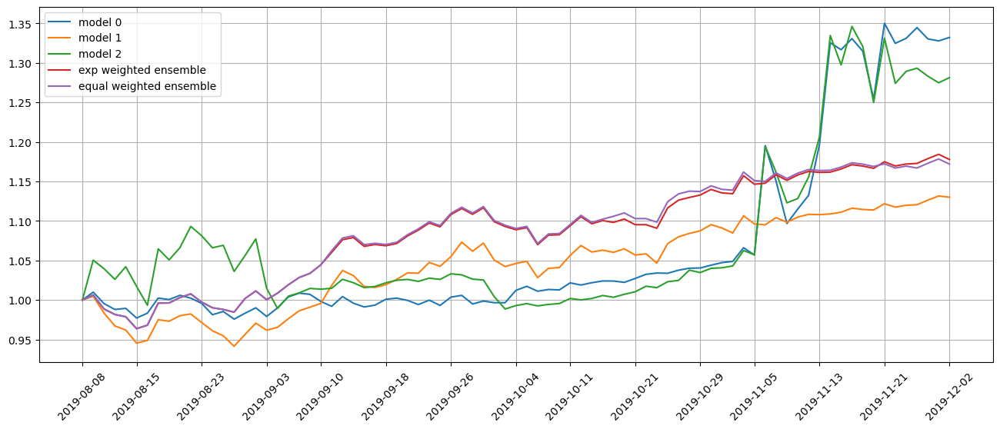

Standardization data are from 2018-04-30 to 2019-02-13
Training data are from 2019-02-14 to 2019-11-27
Testing data are from 2019-11-01 to 2019-12-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 5 out of 67 iterations
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1441729068756104
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.0404834747314453
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1385207176208496
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.0460792779922485
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.146366

position on 2019-12-05 market open will be {'FCEL': 0.2694711906300955, 'APPS': 0.10556861287623902, 'XELA': 0.09322999250892208, 'TOON': 0.12903761824262666, 'ARWR': 0.09769349930878532, 'WKHS': 0.1167353560726518, 'CENN': 0.12479241342528677, 'ROKU': 0.11347008453977885, 'AXSM': 0.09963816581368463, 'KRYS': 0.1086035239452767}
Total asset on 2019-12-05 will be 1.2582404573633443
It should be the same as 1.2582404573633477
top_stocks by return weighted ensemble to buy on 2019-12-04 are ['MOS', 'NYCB', 'ANET', 'ALRM', 'HOG', 'MPC', 'GBX', 'ENLC', 'PBI', 'FCEL']
position on 2019-12-05 market open will be {'NYCB': 0.11606860038830856, 'GBX': 0.114505914590368, 'MPC': 0.11279831938720364, 'MOS': 0.11360211970797511, 'ALRM': 0.11470977632973527, 'ENLC': 0.11640472807043664, 'ANET': 0.11413931449732659, 'PBI': 0.11385335579541389, 'FCEL': 0.1286128562282344, 'HOG': 0.11377774916797001}
Total asset on 2019-12-05 will be 1.1584727341629686
It should be the same as 1.1584727341629724
top_stock

position on 2019-12-10 market open will be {'PUK': 0.11663607377430225, 'ETSY': 0.11498080348894214, 'W': 0.12744568899958614, 'TOON': 0.12135661261106931, 'CHRW': 0.11594580435350606, 'SEE': 0.11672537917239191, 'NYCB': 0.11643503214381644, 'FIX': 0.11658106046200203, 'ROL': 0.11730149789828777, 'SQM': 0.11739570899652418}
Total asset on 2019-12-10 will be 1.1808036619004243
It should be the same as 1.1808036619004283
top_stocks by equal weighted ensemble to buy on 2019-12-09 are ['SVC', 'FIX', 'ETSY', 'SEE', 'SQM', 'CHRW', 'W', 'PUK', 'NYCB', 'ROL']
position on 2019-12-10 market open will be {'PUK': 0.11604787059647673, 'ETSY': 0.11440903024520183, 'W': 0.1268119307304763, 'CHRW': 0.11537273723307555, 'SEE': 0.11614845896991924, 'NYCB': 0.11585954699400927, 'FIX': 0.11600485356095712, 'SVC': 0.11600907916204774, 'ROL': 0.11672173020425543, 'SQM': 0.11681547566009037}
Total asset on 2019-12-10 will be 1.170200713356506
It should be the same as 1.1702007133565095
Testing data from 2019

position on 2019-12-13 market open will be {'RUN': 0.12333544600048485, 'AGQ': 0.11982672129784128, 'FCEL': 0.16740407701379192, 'SIVR': 0.11674543486661675, 'MATX': 0.11988232130318764, 'UNG': 0.1187031934595245, 'AXL': 0.12339916417238558, 'BALL': 0.11725200424428707, 'DDD': 0.11965337634172828, 'FIX': 0.11927582715171724}
Total asset on 2019-12-13 will be 1.2454775658515609
It should be the same as 1.245477565851565
Testing data from 2019-11-14 to 2019-12-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-13 are ['FNDA', 'EWG', 'EWS', 'IYR', 'BWX', 'IAT', 'TFLO', 'VNQ', 'KSA', 'TOON']
position on 2019-12-16 market open will be {'TOON': 0.09939805205400858, 'FNDA': 0.13567906534255894, 'TFLO': 0.13637602095716708, 'KSA': 0.13560663197845502, 'BWX': 0.13641682801538604, 'VNQ': 0.1366837949436511, 'EWS': 0.13260288592100902, 'IAT': 0.1357658891284366, 'IYR': 0.13520904567424555, 'EWG': 0.1373860593320917}
Total asset on 2019-12-16 will be 1.3211242733470094
I

Testing data from 2019-11-19 to 2019-12-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-18 are ['MINT', 'SPHB', 'UUP', 'REET', 'HYLB', 'IAT', 'FALN', 'FTSM', 'KSA', 'TOON']
position on 2019-12-19 market open will be {'TOON': 0.090754740939828, 'IAT': 0.13560706402318465, 'REET': 0.13581526690334264, 'FALN': 0.13706215432859878, 'HYLB': 0.13549150602997415, 'MINT': 0.13529027706195948, 'KSA': 0.13649200791439933, 'UUP': 0.13540237964802754, 'FTSM': 0.13527285889943577, 'SPHB': 0.1363072368097466}
Total asset on 2019-12-19 will be 1.3134954925584965
It should be the same as 1.3134954925584972
top_stocks by model 1 to buy on 2019-12-18 are ['SSD', 'ROL', 'SAVE', 'UAL', 'ALRM', 'SITE', 'ATI', 'HOG', 'GLW', 'FL']
position on 2019-12-19 market open will be {'GLW': 0.11718999185537993, 'FL': 0.12772227191330635, 'ROL': 0.11897774731128243, 'ALRM': 0.11872103367404765, 'SSD': 0.11960442834246084, 'UAL': 0.11908162687344025, 'SAVE': 0.11696667675890811, 'SITE': 0.1

top_stocks by model 0 to buy on 2019-12-23 are ['ACWX', 'REET', 'IYR', 'RWR', 'FALN', 'EFAV', 'UUP', 'SCHO', 'EZU', 'TOON']
position on 2019-12-24 market open will be {'TOON': 0.09118690598035564, 'REET': 0.13672339429639047, 'UUP': 0.13312203094100372, 'FALN': 0.13626290502092217, 'SCHO': 0.13560354410249204, 'EZU': 0.13550038770674908, 'EFAV': 0.13603216861788725, 'IYR': 0.13483712689129349, 'RWR': 0.13505124585764905, 'ACWX': 0.13565819153093206}
Total asset on 2019-12-24 will be 1.3099779009456742
It should be the same as 1.3099779009456751
top_stocks by model 1 to buy on 2019-12-23 are ['BWA', 'TEX', 'AOS', 'LZB', 'HPE', 'MMYT', 'MVIS', 'FL', 'AUPH', 'SMCI']
position on 2019-12-24 market open will be {'MVIS': 0.12312813340189595, 'HPE': 0.11961917584033055, 'BWA': 0.11951941227574688, 'AOS': 0.11801253617829145, 'AUPH': 0.12140798149479193, 'FL': 0.12029922030850387, 'SMCI': 0.11599710244573497, 'TEX': 0.120565074628512, 'MMYT': 0.12256715938551498, 'LZB': 0.12083730280647512}
Tot

position on 2019-12-30 market open will be {'TOON': 0.10371971276291257, 'FALN': 0.13656426741247366, 'ITCI': 0.12155646490734939, 'VGSH': 0.1368742405950198, 'VNQI': 0.138428427306007, 'FLOT': 0.13679284759361005, 'ICSH': 0.13683244370937417, 'FTSM': 0.13682803009047861, 'VGIT': 0.13670154638705265, 'SCHR': 0.13673055631183334}
Total asset on 2019-12-30 will be 1.32102853707611
It should be the same as 1.3210285370761112
top_stocks by model 1 to buy on 2019-12-27 are ['RILY', 'TD', 'HPE', 'SMCI', 'DLB', 'PI', 'ROL', 'AUPH', 'MVIS', 'ITCI']
position on 2019-12-30 market open will be {'AUPH': 0.12881386419776195, 'MVIS': 0.12493339687806687, 'ROL': 0.12032406042332623, 'HPE': 0.1197725104459332, 'RILY': 0.11919779692008453, 'TD': 0.12078225334027767, 'SMCI': 0.12385852242437062, 'PI': 0.11865762906329982, 'ITCI': 0.11919529810954353, 'DLB': 0.12071879420985886}
Total asset on 2019-12-30 will be 1.2162541260125213
It should be the same as 1.2162541260125233
top_stocks by model 2 to buy o

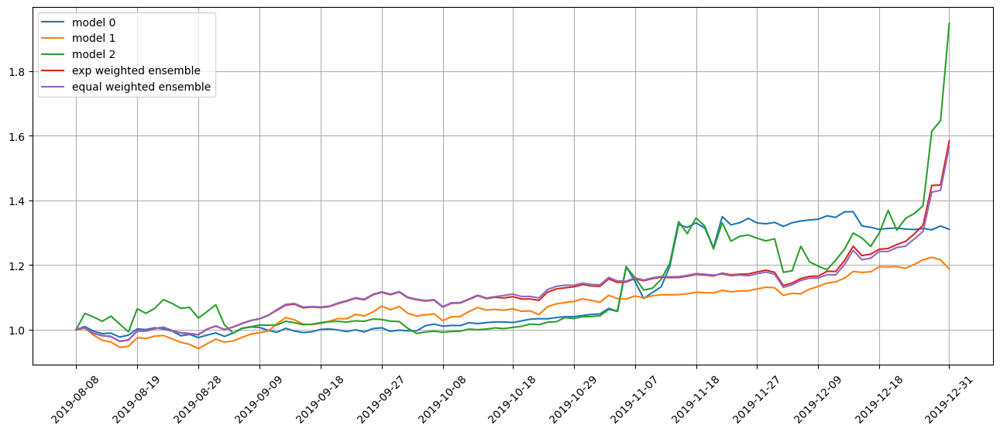

Standardization data are from 2018-05-29 to 2019-03-14
Training data are from 2019-03-15 to 2019-12-27
Testing data are from 2019-12-02 to 2020-01-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 6 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1372822523117065
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1865653991699219
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1362197399139404
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1798450946807861
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.1348683

top_stocks by model 2 to buy on 2020-01-03 are ['SRNE', 'KRYS', 'ARWR', 'ENPH', 'TOON', 'CENN', 'AUPH', 'ITCI', 'AXSM', 'FCEL']
position on 2020-01-06 market open will be {'FCEL': 1.0039975241952561, 'TOON': 0.10626626905647657, 'ARWR': 0.09015925799986774, 'CENN': 0.051671858683907806, 'AXSM': 0.20182943218767507, 'KRYS': 0.10456734120657252, 'SRNE': 0.0963229921445075, 'ENPH': 0.1436810804464984, 'ITCI': 0.07516634805182042, 'AUPH': 0.12394863221816893}
Total asset on 2020-01-06 will be 1.9976107361907471
It should be the same as 1.9976107361907511
top_stocks by return weighted ensemble to buy on 2020-01-03 are ['AXON', 'CM', 'TD', 'ROL', 'CVLT', 'VNLA', 'UNG', 'AUPH', 'AXSM', 'ITCI']
position on 2020-01-06 market open will be {'AUPH': 0.1660917219248387, 'ITCI': 0.14111807118701067, 'AXSM': 0.14689319961645006, 'TD': 0.1598840764902784, 'AXON': 0.1639088200329757, 'VNLA': 0.1600452597966885, 'UNG': 0.16124148543108063, 'CM': 0.1594793084261438, 'CVLT': 0.16024200741147895, 'ROL': 0.

position on 2020-01-09 market open will be {'AUPH': 0.17138385711655296, 'ITCI': 0.1252773283966742, 'AXSM': 0.15695799562842624, 'SGMO': 0.16645930940100775, 'MIDD': 0.16375987875807538, 'CTSH': 0.1661768875660736, 'SAGE': 0.16636061006572492, 'TD': 0.1627387593890882, 'CHKP': 0.16129929841498886, 'DY': 0.1645762637187132}
Total asset on 2020-01-09 will be 1.6049901884553206
It should be the same as 1.6049901884553253
top_stocks by equal weighted ensemble to buy on 2020-01-08 are ['UPS', 'SAGE', 'ROL', 'AXON', 'CHKP', 'MIDD', 'DY', 'TD', 'CTSH', 'SGMO']
position on 2020-01-09 market open will be {'SGMO': 0.16576948492394977, 'MIDD': 0.16308124099889054, 'CTSH': 0.16216299570172965, 'SAGE': 0.1623422805069612, 'AXON': 0.1596076910363588, 'TD': 0.158807913217321, 'CHKP': 0.15740322146280208, 'DY': 0.16060103385564328, 'ROL': 0.15957657794631716, 'UPS': 0.16156681128092157}
Total asset on 2020-01-09 will be 1.6109192509308905
It should be the same as 1.6109192509308954
Testing data from 

position on 2020-01-14 market open will be {'ITCI': 0.15897550614107864, 'BA': 0.15849018484131205, 'APLS': 0.16804724307355645, 'NUE': 0.16062866592309108, 'SPIP': 0.15962201178886468, 'SGMO': 0.15735447990270998, 'TSCO': 0.15808999183463487, 'UUUU': 0.16784746290142025, 'CM': 0.15989910732443818, 'ATI': 0.16059157414158906}
Total asset on 2020-01-14 will be 1.6095462278726904
It should be the same as 1.6095462278726953
Testing data from 2019-12-13 to 2020-01-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-01-14 are ['SBSW', 'GLPG', 'QGEN', 'TNK', 'ENPH', 'AUPH', 'CENN', 'ITCI', 'AXSM', 'FCEL']
position on 2020-01-15 market open will be {'AXSM': 0.12147437998118507, 'AUPH': 0.1361056087291715, 'TNK': 0.13042973724111948, 'FCEL': 0.12815468693207632, 'CENN': 0.10778648258322106, 'ENPH': 0.16234254927189418, 'SBSW': 0.09758863514233257, 'ITCI': 0.1323555357318174, 'GLPG': 0.13340765517801872, 'QGEN': 0.1297305202921719}
Total asset on 2020-01-15 will be 1.2793

Testing data from 2019-12-18 to 2020-01-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-01-17 are ['APPS', 'SBSW', 'GLPG', 'QGEN', 'TNK', 'ENPH', 'AUPH', 'CENN', 'AXSM', 'FCEL']
position on 2020-01-21 market open will be {'AXSM': 0.1210443825932778, 'AUPH': 0.13753901156062592, 'TNK': 0.12787228836958378, 'FCEL': 0.16174863598877617, 'CENN': 0.10433731514055798, 'ENPH': 0.17116905136509594, 'GLPG': 0.14718240227553592, 'QGEN': 0.1337753226553556, 'SBSW': 0.11963364914594142, 'APPS': 0.11459779894572916}
Total asset on 2020-01-21 will be 1.3388998580404776
It should be the same as 1.3388998580404796
top_stocks by model 1 to buy on 2020-01-17 are ['SPDN', 'DXC', 'SGMO', 'SPR', 'SCHW', 'RCKT', 'BK', 'TSCO', 'CRS', 'ITCI']
position on 2020-01-21 market open will be {'SPR': 0.12230899611815431, 'SPDN': 0.1277355081295364, 'BK': 0.12594993573599142, 'SGMO': 0.11889558649302541, 'TSCO': 0.13080185946492592, 'SCHW': 0.12466779145575486, 'CRS': 0.12260730099194228, 'I

top_stocks by model 0 to buy on 2020-01-23 are ['ACMR', 'TNK', 'QGEN', 'ESGE', 'ENPH', 'AUPH', 'ESGU', 'CENN', 'AXSM', 'FCEL']
position on 2020-01-24 market open will be {'AXSM': 0.11795376931948122, 'AUPH': 0.1304402305027151, 'TNK': 0.11711938917580489, 'FCEL': 0.11633459272001939, 'CENN': 0.09312752095190299, 'ENPH': 0.17485127233686013, 'QGEN': 0.12969341824730585, 'ESGU': 0.11575829664542561, 'ESGE': 0.1344286593272913, 'ACMR': 0.11978264269740539}
Total asset on 2020-01-24 will be 1.2494897919242096
It should be the same as 1.2494897919242118
top_stocks by model 1 to buy on 2020-01-23 are ['TCBI', 'PSQ', 'SCHW', 'QID', 'AIR', 'UNG', 'GNW', 'PRTA', 'SPDN', 'ITCI']
position on 2020-01-24 market open will be {'TCBI': 0.12368542683175471, 'SPDN': 0.12521489480419673, 'ITCI': 0.12272340848676472, 'PRTA': 0.1199319300953896, 'AIR': 0.12385907388796084, 'GNW': 0.12367968758128416, 'QID': 0.12124251619986808, 'UNG': 0.12004361906540918, 'PSQ': 0.12233760430839002, 'SCHW': 0.1233685601903

position on 2020-01-29 market open will be {'AXSM': 0.11842407736063816, 'AUPH': 0.12668605605153124, 'TNK': 0.10671524056875499, 'FCEL': 0.12131147699158218, 'CENN': 0.06898334885326149, 'ENPH': 0.1763674736816945, 'ACMR': 0.10821663514650412, 'SHOP': 0.1249324905394097, 'ESGU': 0.12196912542988174, 'SBSW': 0.13080998393438958}
Total asset on 2020-01-29 will be 1.2044159085576454
It should be the same as 1.2044159085576478
top_stocks by model 1 to buy on 2020-01-28 are ['CARG', 'ATSG', 'HLF', 'TCBI', 'UUP', 'INDB', 'ENR', 'TGI', 'IMAX', 'AIR']
position on 2020-01-29 market open will be {'AIR': 0.12060462342497329, 'IMAX': 0.1175201872748814, 'CARG': 0.1178121210395231, 'HLF': 0.11732027907049088, 'UUP': 0.11855599944857889, 'INDB': 0.11585575467647585, 'ATSG': 0.11730772757404778, 'TGI': 0.11780799718780931, 'TCBI': 0.120526547812249, 'ENR': 0.11883589536610586}
Total asset on 2020-01-29 will be 1.182147132875133
It should be the same as 1.1821471328751354
top_stocks by model 2 to buy

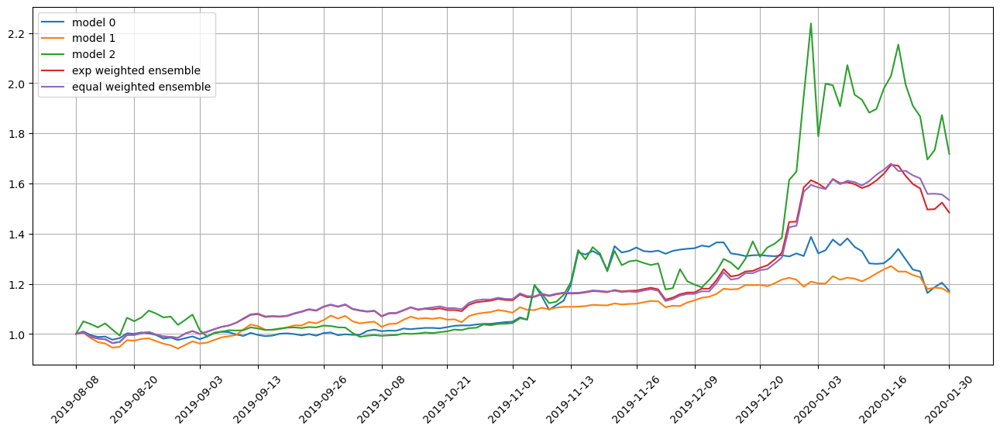

Standardization data are from 2018-06-26 to 2019-04-11
Training data are from 2019-04-12 to 2020-01-28
Testing data are from 2019-12-31 to 2020-02-26
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 7 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1470438241958618
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 1.4843840599060059
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.143764853477478
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4682965278625488
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.1440013647

position on 2020-02-04 market open will be {'ESGE': 0.17565251123437933, 'TNK': 0.16017402847864964, 'TMF': 0.1690199452093582, 'ARWR': 0.1736191852128322, 'WKHS': 0.1862806936085533, 'BRZU': 0.17973542090867273, 'TQQQ': 0.1722494243520586, 'ESGU': 0.1746991393413832, 'SCO': 0.17356800621708413, 'LPG': 0.17482382554733414}
Total asset on 2020-02-04 will be 1.7398221801102989
It should be the same as 1.7398221801103058
top_stocks by return weighted ensemble to buy on 2020-02-03 are ['FSM', 'EDIT', 'ASX', 'OLED', 'HDB', 'BMI', 'WAFD', 'RYTM', 'UMC', 'PRTA']
position on 2020-02-04 market open will be {'PRTA': 0.15115644498355846, 'BMI': 0.14612303423326384, 'RYTM': 0.1441716252540061, 'UMC': 0.14721352006253516, 'WAFD': 0.1468723724394979, 'ASX': 0.14730259025344394, 'HDB': 0.146970409839354, 'FSM': 0.1392251968985467, 'OLED': 0.14496064459523994, 'EDIT': 0.1490098691351566}
Total asset on 2020-02-04 will be 1.4630057076945984
It should be the same as 1.4630057076946028
top_stocks by equa

position on 2020-02-07 market open will be {'RAMP': 0.15491509777737744, 'SBH': 0.14528067286342636, 'GPC': 0.14239601046765593, 'UPBD': 0.14712274438122694, 'GEN': 0.15758749530762534, 'QSR': 0.1465847584372275, 'INCY': 0.145888653477921, 'SFM': 0.1439494633649214, 'WTI': 0.1400775435325329, 'XRAY': 0.14937598477532382}
Total asset on 2020-02-07 will be 1.4731784243852337
It should be the same as 1.4731784243852386
top_stocks by equal weighted ensemble to buy on 2020-02-06 are ['INCY', 'QSR', 'INGN', 'SBH', 'XRAY', 'RAMP', 'SFM', 'GEN', 'WTI', 'UPBD']
position on 2020-02-07 market open will be {'RAMP': 0.16054972558108813, 'INGN': 0.15313282965391387, 'SBH': 0.15052066076247037, 'UPBD': 0.15242917217397603, 'GEN': 0.1632713660674261, 'QSR': 0.1518717821359505, 'INCY': 0.15115057004097798, 'SFM': 0.1491414371577132, 'WTI': 0.14512986479847512, 'XRAY': 0.15476368251379932}
Total asset on 2020-02-07 will be 1.5319610908857864
It should be the same as 1.5319610908857904
Testing data from 

position on 2020-02-12 market open will be {'KODK': 0.14757799358600687, 'LYG': 0.1531195952754864, 'SBH': 0.15717772890592596, 'CARG': 0.16089397022510224, 'BRC': 0.15526136745297892, 'AYI': 0.15695014664320225, 'MXL': 0.15939595054012193, 'LKQ': 0.1575062218382087, 'SHOO': 0.15752213622869823, 'FNKO': 0.1613753768922869}
Total asset on 2020-02-12 will be 1.5667804875880138
It should be the same as 1.5667804875880185
Testing data from 2020-01-14 to 2020-02-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-12 are ['SIVR', 'VXRT', 'AUPH', 'GLPG', 'WKHS', 'ESGU', 'ARWR', 'ITCI', 'TNK', 'FCEL']
position on 2020-02-13 market open will be {'TNK': 0.0874762711069064, 'FCEL': 0.12193358554789269, 'ESGU': 0.12498173218383098, 'ARWR': 0.12718517184305594, 'WKHS': 0.15506423514962125, 'ITCI': 0.12268362464136648, 'GLPG': 0.1398111895881952, 'AUPH': 0.13645933741661315, 'VXRT': 0.10499198196939666, 'SIVR': 0.09624199179986632}
Total asset on 2020-02-13 will be 1.216829

Testing data from 2020-01-17 to 2020-02-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-18 are ['GNRC', 'SILJ', 'AUPH', 'CENN', 'WKHS', 'GLPG', 'ARWR', 'ITCI', 'TNK', 'FCEL']
position on 2020-02-19 market open will be {'TNK': 0.0877668910527329, 'FCEL': 0.16237075245562624, 'ARWR': 0.12362628962981856, 'WKHS': 0.15552710640053818, 'ITCI': 0.1374169953798411, 'GLPG': 0.14772058789961323, 'AUPH': 0.14177406786162525, 'CENN': 0.07973278859112004, 'GNRC': 0.11196396602068781, 'SILJ': 0.11828155223588042}
Total asset on 2020-02-19 will be 1.2661809975274818
It should be the same as 1.2661809975274838
top_stocks by model 1 to buy on 2020-02-18 are ['SEE', 'NSP', 'WFC', 'LAZ', 'BBD', 'AYI', 'FSLR', 'LYG', 'TDW', 'WTI']
position on 2020-02-19 market open will be {'BBD': 0.11637694477470635, 'LYG': 0.11527137065649468, 'TDW': 0.11924253527271747, 'NSP': 0.11779007886625138, 'LAZ': 0.11951723718597708, 'SEE': 0.1192957786990276, 'WTI': 0.11848778231242661, 'FSLR': 0

top_stocks by model 0 to buy on 2020-02-21 are ['SIVR', 'SIL', 'AUPH', 'WKHS', 'ARWR', 'ITCI', 'GLPG', 'ZOM', 'TNK', 'FCEL']
position on 2020-02-24 market open will be {'TNK': 0.07846708604497195, 'FCEL': 0.13997478114413334, 'ARWR': 0.1115924012929775, 'WKHS': 0.16247028110873019, 'ITCI': 0.13379032349652478, 'GLPG': 0.13674931284855113, 'AUPH': 0.14148679216934165, 'ZOM': 0.14808693264467274, 'SIL': 0.09768967167427733, 'SIVR': 0.09742408041503835}
Total asset on 2020-02-24 will be 1.247731662839217
It should be the same as 1.247731662839219
top_stocks by model 1 to buy on 2020-02-21 are ['TBT', 'PICK', 'OXM', 'LYG', 'WOR', 'STLD', 'ECH', 'MSM', 'PRTA', 'FLR']
position on 2020-02-24 market open will be {'PRTA': 0.11736833435451459, 'FLR': 0.12417616790780824, 'MSM': 0.11878964964787124, 'PICK': 0.11562017064170677, 'STLD': 0.11946117846099229, 'WOR': 0.11791130058178259, 'LYG': 0.11499383164713389, 'TBT': 0.11774002532463601, 'ECH': 0.1200246908877459, 'OXM': 0.11922252653652536}
Tot

position on 2020-02-27 market open will be {'TNK': 0.07649087706508918, 'FCEL': 0.125666244796295, 'ARWR': 0.10577149944025466, 'WKHS': 0.16200740985781328, 'ITCI': 0.12098362489814567, 'GLPG': 0.11538736811225493, 'AUPH': 0.13028275249732596, 'ZOM': 0.08726551697598568, 'ENPH': 0.08722753691892042, 'EWH': 0.08831541136086235}
Total asset on 2020-02-27 will be 1.0993982419229453
It should be the same as 1.099398241922947
top_stocks by model 1 to buy on 2020-02-26 are ['HCC', 'DBC', 'GSG', 'DEM', 'EXPD', 'FANG', 'EDIT', 'PFE', 'NGVT', 'AXSM']
position on 2020-02-27 market open will be {'PFE': 0.11753321569828686, 'AXSM': 0.10901678164610745, 'EXPD': 0.1127151401182811, 'EDIT': 0.11042843486711312, 'HCC': 0.10706721265505668, 'GSG': 0.10950100374044475, 'DEM': 0.11173478994324539, 'FANG': 0.10238714530675892, 'NGVT': 0.10633497242871708, 'DBC': 0.1109053197619828}
Total asset on 2020-02-27 will be 1.0976240161659907
It should be the same as 1.097624016165994
top_stocks by model 2 to buy 

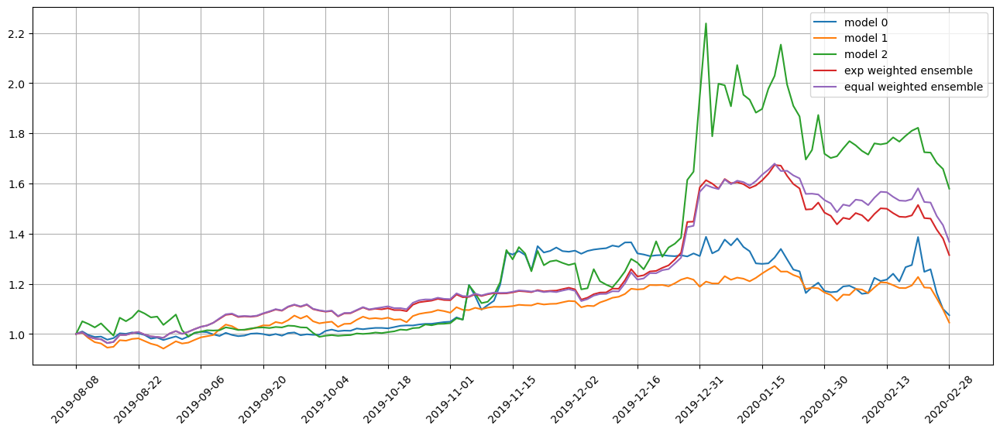

Standardization data are from 2018-07-25 to 2019-05-10
Training data are from 2019-05-13 to 2020-02-26
Testing data are from 2020-01-30 to 2020-03-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 8 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.179033637046814
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 2.0434110164642334
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1738535165786743
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.9740408658981323
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.1756052970

position on 2020-03-04 market open will be {'ITCI': 0.18219419564994743, 'CEIX': 0.16121054985249783, 'VXRT': 0.09192287930652027, 'SEDG': 0.17659436985255278, 'AR': 0.17321335741378296, 'ZOM': 0.17022336283803746, 'FCEL': 0.17390147520597102, 'CENN': 0.20034067753145138, 'ENPH': 0.18021117539503437, 'CODX': 0.13276077027569785}
Total asset on 2020-03-04 will be 1.6425728133214867
It should be the same as 1.6425728133214934
top_stocks by return weighted ensemble to buy on 2020-03-03 are ['USO', 'DBC', 'TXRH', 'CBRL', 'PRGO', 'NTNX', 'ATSG', 'DY', 'HI', 'SRLN']
position on 2020-03-04 market open will be {'NTNX': 0.1314389008579283, 'USO': 0.1423722849818205, 'ATSG': 0.13182680046364043, 'TXRH': 0.13794638153323072, 'DY': 0.12572969021684824, 'CBRL': 0.13760528842032504, 'HI': 0.13963184310562463, 'DBC': 0.1417311219573615, 'PRGO': 0.14157880995566266, 'SRLN': 0.1413188720851949}
Total asset on 2020-03-04 will be 1.371179993577631
It should be the same as 1.3711799935776372
top_stocks by

position on 2020-03-09 market open will be {'MEOH': 0.11457111253461207, 'CLS': 0.12835506174940822, 'MYGN': 0.12310688431135729, 'SAVE': 0.1388547361607248, 'MXL': 0.12666166609542362, 'GT': 0.12805900559049924, 'TTMI': 0.1294504276100936, 'LABD': 0.16144212134414934, 'ALSN': 0.12974608558584314, 'RAMP': 0.129107570843768}
Total asset on 2020-03-09 will be 1.309354671825872
It should be the same as 1.3093546718258793
Testing data from 2020-02-07 to 2020-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-09 are ['BLDP', 'SEDG', 'TNK', 'AXSM', 'SBSW', 'ITCI', 'ZOM', 'CODX', 'ENPH', 'FCEL']
position on 2020-03-10 market open will be {'TNK': 0.0917193034693841, 'FCEL': 0.10327028139534161, 'ITCI': 0.11186026628230147, 'ZOM': 0.11846954926811999, 'ENPH': 0.08427884679465353, 'BLDP': 0.1257619001135179, 'CODX': 0.0616804694314888, 'SBSW': 0.09497675416646456, 'AXSM': 0.10106789393728953, 'SEDG': 0.10056352291663168}
Total asset on 2020-03-10 will be 0.993648787

Testing data from 2020-02-12 to 2020-03-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-12 are ['AXSM', 'ITCI', 'TMF', 'GUSH', 'ZOM', 'DRIP', 'ENPH', 'CODX', 'FCEL', 'FTSM']
position on 2020-03-13 market open will be {'FCEL': 0.07838587585860682, 'ITCI': 0.09429355543290224, 'ZOM': 0.10048755974868057, 'ENPH': 0.06478176857911586, 'CODX': 0.08140991549427774, 'AXSM': 0.11304669736202795, 'GUSH': 0.13103500871445461, 'DRIP': 0.0760716035546939, 'TMF': 0.09127989596642921, 'FTSM': 0.09939962304603883}
Total asset on 2020-03-13 will be 0.930191503757226
It should be the same as 0.9301915037572277
top_stocks by model 1 to buy on 2020-03-12 are ['ENLC', 'FIXD', 'TX', 'TRGP', 'OXY', 'OVV', 'MINT', 'NEAR', 'GSY', 'JPST']
position on 2020-03-13 market open will be {'TRGP': 0.08198216025628884, 'GSY': 0.08882717937963035, 'NEAR': 0.08919715493719642, 'OVV': 0.09818166471369054, 'JPST': 0.08917017654673293, 'TX': 0.08310281812052017, 'MINT': 0.08302931238497827, 'EN

top_stocks by model 0 to buy on 2020-03-17 are ['GUSH', 'FLRN', 'INO', 'GSY', 'JPST', 'ENPH', 'BIL', 'CODX', 'DRIP', 'FCEL']
position on 2020-03-18 market open will be {'FCEL': 0.08211853510700914, 'ENPH': 0.04735770668542263, 'CODX': 0.07815628613403909, 'GUSH': 0.07913631622493426, 'INO': 0.08189603843938222, 'DRIP': 0.07152240962971518, 'BIL': 0.09558425239401308, 'FLRN': 0.09639069038430378, 'JPST': 0.09503775210365628, 'GSY': 0.09484439423792868}
Total asset on 2020-03-18 will be 0.8220443813404023
It should be the same as 0.8220443813404044
top_stocks by model 1 to buy on 2020-03-17 are ['CPRI', 'NSP', 'PZA', 'GRPN', 'VTEB', 'TFI', 'MUB', 'SUB', 'BIL', 'DRIP']
position on 2020-03-18 market open will be {'NSP': 0.07164748662351696, 'CPRI': 0.06410169827547985, 'TFI': 0.08202980888553542, 'SUB': 0.08202066702629651, 'BIL': 0.08327346128622155, 'DRIP': 0.12386090516346057, 'VTEB': 0.08238824630704396, 'PZA': 0.082606680599541, 'MUB': 0.08244589990726205, 'GRPN': 0.07185829507739681}

position on 2020-03-23 market open will be {'FCEL': 0.07714165874598587, 'ENPH': 0.04710751611821097, 'CODX': 0.06915688956852278, 'GUSH': 0.08005650064229562, 'INO': 0.08745834096491573, 'ITM': 0.09511823462716665, 'FPE': 0.08503673163126818, 'NEAR': 0.09054322103195625, 'FLRN': 0.08880521660164988, 'FLOT': 0.08990669172144249}
Total asset on 2020-03-23 will be 0.8103310016534123
It should be the same as 0.8103310016534143
top_stocks by model 1 to buy on 2020-03-20 are ['LNW', 'HIMX', 'KAR', 'VSAT', 'NSP', 'DAN', 'CAL', 'PLCE', 'DBI', 'BKD']
position on 2020-03-23 market open will be {'NSP': 0.06189652888084038, 'CAL': 0.11573018896120152, 'BKD': 0.08755506329510865, 'DBI': 0.13517158567197882, 'HIMX': 0.10236003070156977, 'PLCE': 0.08024724804518395, 'LNW': 0.11953243052571447, 'VSAT': 0.07716922179643987, 'DAN': 0.08612815118716093, 'KAR': 0.07909322938585447}
Total asset on 2020-03-23 will be 0.9448836784510501
It should be the same as 0.9448836784510528
top_stocks by model 2 to bu

Testing data from 2020-02-26 to 2020-03-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-25 are ['VET', 'ERY', 'ESGU', 'TMF', 'JETS', 'INO', 'ENPH', 'GUSH', 'CODX', 'FCEL']
position on 2020-03-26 market open will be {'FCEL': 0.09953762214693931, 'ENPH': 0.06728368788559574, 'CODX': 0.0641726138784448, 'GUSH': 0.08557764224891437, 'INO': 0.07952909943346995, 'ERY': 0.04616226576588608, 'TMF': 0.1009252165293174, 'JETS': 0.11864406724500627, 'ESGU': 0.08148573760875023, 'VET': 0.09864946543831346}
Total asset on 2020-03-26 will be 0.8419674181806357
It should be the same as 0.8419674181806376
top_stocks by model 1 to buy on 2020-03-25 are ['AVNS', 'DORM', 'PRGO', 'MCY', 'CARS', 'FLO', 'KFY', 'PBI', 'AVA', 'SRLN']
position on 2020-03-26 market open will be {'CARS': 0.09631864920327936, 'AVA': 0.08978211633664317, 'PBI': 0.09021651653854677, 'AVNS': 0.09135796503577319, 'FLO': 0.08530786563433393, 'KFY': 0.09153317077304357, 'MCY': 0.0893598427646291, 'PRGO': 0

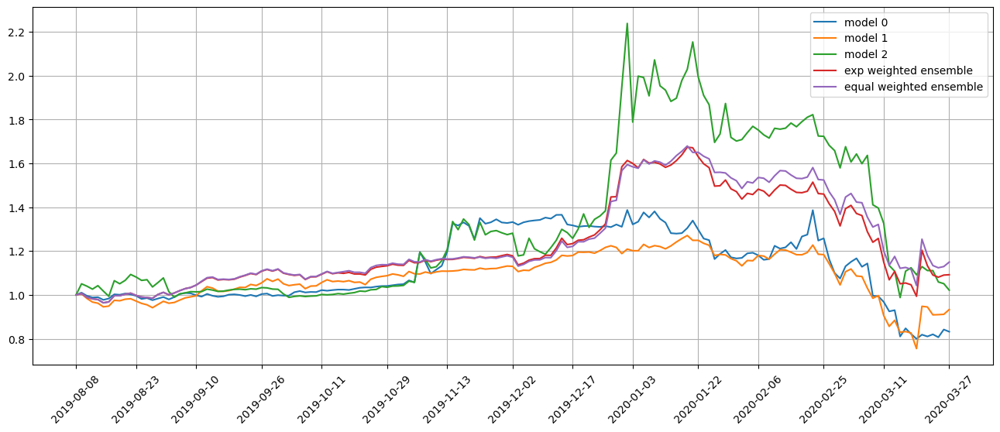

Standardization data are from 2018-08-22 to 2019-06-10
Training data are from 2019-06-11 to 2020-03-25
Testing data are from 2020-02-28 to 2020-04-23
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 9 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2775063514709473
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.921744465827942
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2669610977172852
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.7937601804733276
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2727047204

position on 2020-04-01 market open will be {'FBND': 0.10362937446135981, 'AGQ': 0.09446793079747545, 'GLPG': 0.10611841375933131, 'BAC-PL': 0.09928051753858953, 'PFSI': 0.08903022532014492, 'SIVR': 0.0974935767272132, 'NLY': 0.08279612869890746, 'SCHP': 0.0980539120597125, 'SIL': 0.09581402989193669, 'VWOB': 0.09511459812064099}
Total asset on 2020-04-01 will be 0.961798707375303
It should be the same as 0.9617987073753118
top_stocks by return weighted ensemble to buy on 2020-03-31 are ['CNK', 'BJRI', 'MPLX', 'AHT', 'PLCE', 'FNB', 'FLR', 'DXC', 'CAL', 'DBI']
position on 2020-04-01 market open will be {'CAL': 0.09395286213365428, 'PLCE': 0.10234991249045737, 'AHT': 0.0968343665304394, 'FLR': 0.11589930751372973, 'DBI': 0.09326036606156154, 'BJRI': 0.10748661867232853, 'MPLX': 0.1099465446640261, 'DXC': 0.08684143481210174, 'CNK': 0.10029996657448811, 'FNB': 0.10167674482733215}
Total asset on 2020-04-01 will be 1.0085481242801144
It should be the same as 1.008548124280119
top_stocks by 

position on 2020-04-06 market open will be {'CODX': 0.15193336560867154, 'ERY': 0.09081177818876532, 'GDOT': 0.11012564299899781, 'BKR': 0.10970849845071637, 'OPK': 0.10916335657598929, 'DBRG': 0.10138212489490461, 'FTSM': 0.1040529728155117, 'TCBI': 0.10747270117477212, 'HWC': 0.10989600469176229, 'FNB': 0.10881478596407743}
Total asset on 2020-04-06 will be 1.1033612313641605
It should be the same as 1.1033612313641685
Testing data from 2020-03-09 to 2020-04-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-06 are ['BEP', 'VET', 'WES', 'ZOM', 'AXSM', 'FCEL', 'CODX', 'JDST', 'ENPH', 'GUSH']
position on 2020-04-07 market open will be {'FCEL': 0.09269441220644518, 'ENPH': 0.06756962093629218, 'CODX': 0.06832617695350977, 'GUSH': 0.09777015378995035, 'JDST': 0.08013837207592711, 'ZOM': 0.0966386140936365, 'BEP': 0.0888630133142254, 'AXSM': 0.07732983292919424, 'WES': 0.10358261751641107, 'VET': 0.08745233477443988}
Total asset on 2020-04-07 will be 0.860365148

Testing data from 2020-03-12 to 2020-04-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-09 are ['TMF', 'ZOM', 'JNUG', 'CODX', 'AXSM', 'FCEL', 'ENPH', 'JDST', 'MFA', 'GUSH']
position on 2020-04-13 market open will be {'FCEL': 0.0926944122064452, 'ENPH': 0.06833806728826038, 'CODX': 0.06091898451820613, 'GUSH': 0.12371950003471054, 'JDST': 0.06643595612512093, 'AXSM': 0.08041960629723033, 'TMF': 0.09355210128293412, 'JNUG': 0.09360793740937655, 'MFA': 0.07945889579886328, 'ZOM': 0.08717335375521906}
Total asset on 2020-04-13 will be 0.8463188147163645
It should be the same as 0.8463188147163665
top_stocks by model 1 to buy on 2020-04-09 are ['AEHR', 'GDOT', 'KODK', 'VXRT', 'ADNT', 'ROG', 'DBRG', 'KOLD', 'GVI', 'UNIT']
position on 2020-04-13 market open will be {'DBRG': 0.16671652642956794, 'GDOT': 0.10949298100304841, 'VXRT': 0.11176879561978627, 'KOLD': 0.10660082158273364, 'KODK': 0.11831179505600131, 'ADNT': 0.11586298422127969, 'GVI': 0.10954752832143085

top_stocks by model 0 to buy on 2020-04-15 are ['CODX', 'JNUG', 'NYMT', 'DRIP', 'ENPH', 'FCEL', 'MFA', 'JDST', 'ERY', 'GUSH']
position on 2020-04-16 market open will be {'FCEL': 0.09580496289853707, 'ENPH': 0.07150119867907252, 'CODX': 0.07061063829527477, 'GUSH': 0.10701806115444977, 'JDST': 0.05647056270635279, 'JNUG': 0.07761492827634814, 'MFA': 0.07505962760072202, 'ERY': 0.08348862071812993, 'NYMT': 0.08548493053745254, 'DRIP': 0.07919522278482762}
Total asset on 2020-04-16 will be 0.8022487536511651
It should be the same as 0.8022487536511671
top_stocks by model 1 to buy on 2020-04-15 are ['CNH', 'ATHM', 'BOKF', 'GSG', 'YANG', 'AVNS', 'HCC', 'CBT', 'DBRG', 'ERIE']
position on 2020-04-16 market open will be {'YANG': 0.11239044073896667, 'ATHM': 0.11883302954255097, 'HCC': 0.10682419197261096, 'GSG': 0.11409263306389897, 'BOKF': 0.11390177935397022, 'DBRG': 0.11372811152950468, 'AVNS': 0.11091000318137177, 'CNH': 0.1089665439213999, 'ERIE': 0.11208975156489277, 'CBT': 0.11275407838

position on 2020-04-21 market open will be {'FCEL': 0.0995376221469394, 'GUSH': 0.11405751538654677, 'JDST': 0.06020758523839085, 'MFA': 0.07328306482741997, 'NYMT': 0.08050523045664619, 'DRIP': 0.06530405867565534, 'IVR': 0.06534539107538165, 'NEAR': 0.08390981770171874, 'ERY': 0.08398858227585865, 'ZOM': 0.09303260995612467}
Total asset on 2020-04-21 will be 0.8191714777406802
It should be the same as 0.8191714777406822
top_stocks by model 1 to buy on 2020-04-20 are ['NYMT', 'RITM', 'TWO', 'NEAR', 'ARI', 'DRIP', 'PMT', 'ERY', 'RWT', 'IVR']
position on 2020-04-21 market open will be {'RWT': 0.10954363500743186, 'IVR': 0.12100398829272602, 'RITM': 0.108725128708595, 'DRIP': 0.0995319735699209, 'ARI': 0.1026558917187813, 'NEAR': 0.11280950339161382, 'TWO': 0.10734360695483229, 'NYMT': 0.10960347035777164, 'ERY': 0.11291539555938329, 'PMT': 0.10932241058997878}
Total asset on 2020-04-21 will be 1.0934550041510331
It should be the same as 1.093455004151035
top_stocks by model 2 to buy on 

top_stocks by model 1 to buy on 2020-04-23 are ['BBD', 'CBRL', 'AER', 'HOG', 'JBLU', 'MHK', 'WBA', 'CMPR', 'DDS', 'ESGU']
position on 2020-04-24 market open will be {'MHK': 0.11181242177035224, 'WBA': 0.11084718122173841, 'CMPR': 0.11241744937633816, 'DDS': 0.12412981236472831, 'BBD': 0.0998328430872301, 'ESGU': 0.1095829173858521, 'CBRL': 0.10388997396287503, 'JBLU': 0.1116231652163319, 'HOG': 0.11025944755862764, 'AER': 0.10865544789978424}
Total asset on 2020-04-24 will be 1.1030506598438556
It should be the same as 1.103050659843858
top_stocks by model 2 to buy on 2020-04-23 are ['BNDX', 'VTEB', 'SIVR', 'SLV', 'NUGT', 'AGQ', 'MINT', 'ESGU', 'GSY', 'LMBS']
position on 2020-04-24 market open will be {'LMBS': 0.1043782431339705, 'SIVR': 0.11045764263854556, 'AGQ': 0.11700561524288577, 'MINT': 0.1066349357784066, 'GSY': 0.1064967069403205, 'NUGT': 0.11114639763745658, 'BNDX': 0.1063021843477999, 'VTEB': 0.10509931287244659, 'SLV': 0.10602111313546558, 'ESGU': 0.10594971465764855}
Total

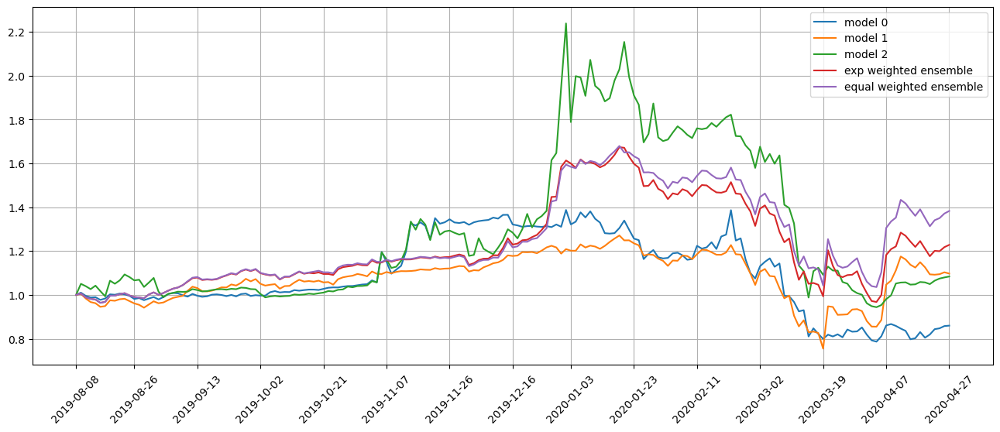

Standardization data are from 2018-09-20 to 2019-07-09
Training data are from 2019-07-10 to 2020-04-23
Testing data are from 2020-03-27 to 2020-05-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 10 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3293806314468384
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.821943998336792
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3110421895980835
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.7914683818817139
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.32444703

top_stocks by model 2 to buy on 2020-04-29 are ['NAT', 'JDST', 'DRIP', 'ZOM', 'CODX', 'INO', 'CENN', 'UCO', 'GUSH', 'MFA']
position on 2020-04-30 market open will be {'UCO': 0.12146843139062594, 'GUSH': 0.1530335639215844, 'INO': 0.09059548102362146, 'MFA': 0.1280137302178035, 'JDST': 0.10736797523877858, 'CODX': 0.08674053884354094, 'CENN': 0.1262657738676167, 'DRIP': 0.11099968637301967, 'NAT': 0.12080731803463061, 'ZOM': 0.12407834939669274}
Total asset on 2020-04-30 will be 1.1693708483079057
It should be the same as 1.1693708483079146
top_stocks by return weighted ensemble to buy on 2020-04-29 are ['SSB', 'GOGO', 'WBA', 'CMPR', 'CEIX', 'TXT', 'CC', 'UCO', 'GUSH', 'MFA']
position on 2020-04-30 market open will be {'MFA': 0.14140331612125426, 'GUSH': 0.17748951945133326, 'WBA': 0.13400566314042003, 'SSB': 0.14535991069501392, 'TXT': 0.13850762619565923, 'CEIX': 0.15573237381896018, 'UCO': 0.15862620656822357, 'CMPR': 0.15895477576071482, 'CC': 0.14515257888098748, 'GOGO': 0.15423614

position on 2020-05-05 market open will be {'UCO': 0.13816070940668052, 'GUSH': 0.15449311711862093, 'INO': 0.0778983883484584, 'MFA': 0.12056319462955467, 'CODX': 0.10518827819448562, 'CENN': 0.10514782190381593, 'CCL': 0.09568693524496072, 'NNDM': 0.10067601194013436, 'DRIP': 0.10301034669748196, 'MAC': 0.11519145828949319}
Total asset on 2020-05-05 will be 1.1160162617736775
It should be the same as 1.1160162617736864
top_stocks by return weighted ensemble to buy on 2020-05-04 are ['BDC', 'CODX', 'SON', 'MTN', 'PR', 'OI', 'RITM', 'UCO', 'MFA', 'GUSH']
position on 2020-05-05 market open will be {'MFA': 0.13317349235730866, 'GUSH': 0.17918232061806563, 'UCO': 0.17980086612451956, 'PR': 0.13417986030482937, 'OI': 0.148951210898107, 'MTN': 0.15685910336921166, 'RITM': 0.18583294392685396, 'BDC': 0.14903105724261922, 'SON': 0.15064887262977386, 'CODX': 0.15304711448320213}
Total asset on 2020-05-05 will be 1.570706841954487
It should be the same as 1.5707068419544912
top_stocks by equal 

position on 2020-05-08 market open will be {'MFA': 0.12045467867784554, 'GUSH': 0.1541712794348976, 'MVIS': 0.051967334260149246, 'ESGU': 0.15651935919688217, 'PINC': 0.158251176738435, 'CENN': 0.15938672549120103, 'INO': 0.1623525272146129, 'MDRX': 0.16043063760222617, 'ARCT': 0.1537921263703033, 'CODX': 0.16804268726872668}
Total asset on 2020-05-08 will be 1.4453685322552752
It should be the same as 1.4453685322552796
top_stocks by equal weighted ensemble to buy on 2020-05-07 are ['CODX', 'INO', 'UCO', 'PINC', 'MDRX', 'CENN', 'ESGU', 'MFA', 'GUSH', 'MVIS']
position on 2020-05-08 market open will be {'MFA': 0.13561422416090382, 'GUSH': 0.17357414986241618, 'UCO': 0.18163434999119207, 'MVIS': 0.054893533822515966, 'ESGU': 0.1653327202611817, 'MDRX': 0.1624271106085913, 'PINC': 0.16368359025333193, 'INO': 0.16437291710362395, 'CENN': 0.16137020757275386, 'CODX': 0.17013388813947866}
Total asset on 2020-05-08 will be 1.5330366917759792
It should be the same as 1.5330366917759894
Testing

position on 2020-05-13 market open will be {'MFA': 0.1305602727423175, 'GUSH': 0.17152537311835284, 'TOON': 0.15834742712464062, 'PR': 0.17620804664838183, 'SM': 0.16091529344693103, 'NTRS': 0.14938509261324318, 'ATUS': 0.15313659647359498, 'CBOE': 0.1548395357486889, 'ZOM': 0.1706761737565327, 'ARCT': 0.1489537807421994}
Total asset on 2020-05-13 will be 1.5745475924148722
It should be the same as 1.574547592414883
Testing data from 2020-04-15 to 2020-05-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-13 are ['ARCT', 'JETS', 'INO', 'ZOM', 'MVIS', 'UCO', 'CENN', 'GUSH', 'MFA', 'TOON']
position on 2020-05-14 market open will be {'GUSH': 0.13894864560231573, 'MFA': 0.06262370936584337, 'UCO': 0.07595998433541092, 'INO': 0.0807152702784293, 'ZOM': 0.11523557858296105, 'CENN': 0.09711135251639236, 'TOON': 0.1603385168496275, 'JETS': 0.06260876291289784, 'ARCT': 0.07475060810733258, 'MVIS': 0.08360147556400262}
Total asset on 2020-05-14 will be 0.95189390411521

Testing data from 2020-04-20 to 2020-05-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-18 are ['CODX', 'JETS', 'ZOM', 'MVIS', 'XELA', 'UCO', 'CENN', 'GUSH', 'MFA', 'TOON']
position on 2020-05-19 market open will be {'GUSH': 0.17529612753937385, 'MFA': 0.0701740892396195, 'UCO': 0.1022136571811862, 'CENN': 0.10166344716559823, 'TOON': 0.18086185189952306, 'JETS': 0.0730876625253548, 'MVIS': 0.09509667977767193, 'XELA': 0.11483958003112955, 'ZOM': 0.07370413685784614, 'CODX': 0.07856691239447604}
Total asset on 2020-05-19 will be 1.0655041446117766
It should be the same as 1.0655041446117792
top_stocks by model 1 to buy on 2020-05-18 are ['TRUP', 'TEVA', 'XRX', 'CDP', 'ERIC', 'SAP', 'ROG', 'FDX', 'BUD', 'KALU']
position on 2020-05-19 market open will be {'TRUP': 0.1427672768974261, 'ERIC': 0.1364329830384671, 'BUD': 0.1403879778006382, 'TEVA': 0.13573405204820588, 'SAP': 0.13595110133929939, 'FDX': 0.14122921332034763, 'CDP': 0.1384612555251804, 'KALU': 0.1

top_stocks by model 0 to buy on 2020-05-21 are ['CODX', 'ZOM', 'JETS', 'XELA', 'UCO', 'NNDM', 'CENN', 'GUSH', 'MFA', 'TOON']
position on 2020-05-22 market open will be {'GUSH': 0.16853274530614937, 'MFA': 0.07417134356679154, 'UCO': 0.10563185321643082, 'CENN': 0.09984260930591589, 'TOON': 0.1706001843745753, 'XELA': 0.11879956554944437, 'ZOM': 0.07337063330153279, 'NNDM': 0.08050186084437555, 'CODX': 0.09233998957201314, 'JETS': 0.0969440295739518}
Total asset on 2020-05-22 will be 1.0807348146111775
It should be the same as 1.0807348146111806
top_stocks by model 1 to buy on 2020-05-21 are ['NAT', 'NTCT', 'WSO', 'BCE', 'ORCL', 'TJX', 'HUBB', 'ROST', 'IVZ', 'FIX']
position on 2020-05-22 market open will be {'HUBB': 0.1400153123894788, 'NTCT': 0.14111439378937649, 'ROST': 0.13726437099536928, 'FIX': 0.13942617115286116, 'BCE': 0.1365572388609765, 'ORCL': 0.13839774749541092, 'WSO': 0.1404267336838063, 'TJX': 0.14013297767181357, 'NAT': 0.13393969882374174, 'IVZ': 0.139508309214264}
Tota

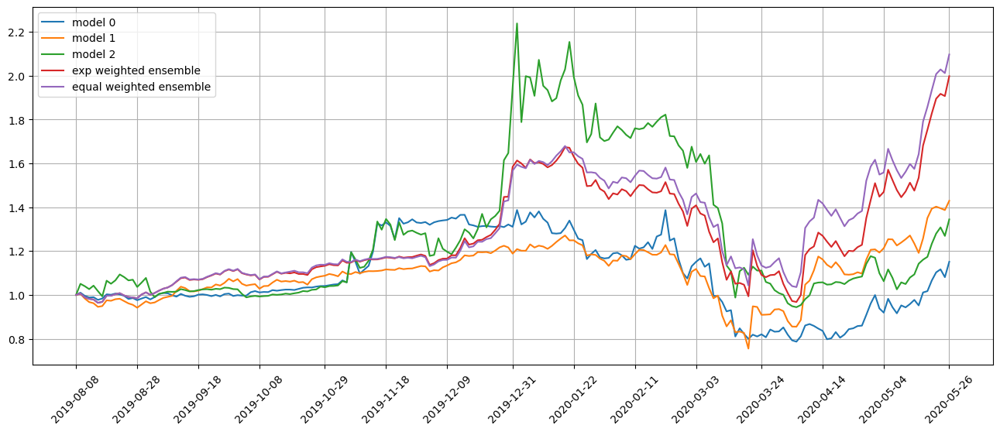

Standardization data are from 2018-10-18 to 2019-08-06
Training data are from 2019-08-07 to 2020-05-21
Testing data are from 2020-04-27 to 2020-06-19
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 11 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3040684461593628
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.6059925556182861
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.306663155555725
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.619802474975586
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.3097870349

top_stocks by model 2 to buy on 2020-05-28 are ['BSCO', 'BSV', 'STIP', 'UAL', 'D', 'MVIS', 'JETS', 'GUSH', 'TOON', 'NNDM']
position on 2020-05-29 market open will be {'GUSH': 0.13373105710272812, 'TOON': 0.270473711172366, 'STIP': 0.11322447542686906, 'D': 0.11447405834492287, 'JETS': 0.11399782682780438, 'BSCO': 0.14034512067105465, 'BSV': 0.14038578714557515, 'NNDM': 0.12365847238157499, 'MVIS': 0.11700012013601271, 'UAL': 0.1104809837235174}
Total asset on 2020-05-29 will be 1.3777716129324165
It should be the same as 1.3777716129324253
top_stocks by return weighted ensemble to buy on 2020-05-28 are ['VDC', 'FALN', 'BSV', 'UAL', 'ZOM', 'JETS', 'MVIS', 'GUSH', 'TOON', 'NNDM']
position on 2020-05-29 market open will be {'GUSH': 0.15510232169097538, 'TOON': 0.40628326883278176, 'JETS': 0.19832426493011457, 'MVIS': 0.17374243168358044, 'ZOM': 0.14427408702623032, 'BSV': 0.18671321200053262, 'NNDM': 0.1878222314660631, 'VDC': 0.1846274447642258, 'FALN': 0.1854802476100147, 'UAL': 0.16780

position on 2020-06-03 market open will be {'GUSH': 0.1772779233414289, 'TOON': 1.0005483296290447, 'JETS': 0.21895532838487386, 'MVIS': 0.19131189786575442, 'NNDM': 0.20554130926858868, 'UAL': 0.19033832544080112, 'VDC': 0.1824500817441975, 'FHLC': 0.18371911753055972, 'BSV': 0.18217910826542436, 'VIG': 0.1845619044166219}
Total asset on 2020-06-03 will be 2.7168833258872866
It should be the same as 2.716883325887295
top_stocks by equal weighted ensemble to buy on 2020-06-02 are ['BSV', 'VIG', 'FHLC', 'VDC', 'UAL', 'JETS', 'MVIS', 'NNDM', 'GUSH', 'TOON']
position on 2020-06-03 market open will be {'GUSH': 0.19958882708991724, 'TOON': 1.0179477710166025, 'NNDM': 0.21738559796368967, 'JETS': 0.2372182523020799, 'MVIS': 0.19726836265266295, 'UAL': 0.1826670179799147, 'VDC': 0.1839694320765283, 'FHLC': 0.19160627612620465, 'BSV': 0.1900001534512285, 'VIG': 0.1924852442977098}
Total asset on 2020-06-03 will be 2.8101369349565286
It should be the same as 2.810136934956538
Testing data from 

position on 2020-06-08 market open will be {'GUSH': 0.2885914388175901, 'TOON': 1.30379576233773, 'NNDM': 0.2038926942192983, 'JETS': 0.3054275029257523, 'MVIS': 0.20934600575573512, 'UAL': 0.2724263270260158, 'VDC': 0.18549560602863768, 'SAVA': 0.17335070417564968, 'USMV': 0.22073878932494007, 'XLP': 0.22045803826752491}
Total asset on 2020-06-08 will be 3.3835228688788646
It should be the same as 3.3835228688788734
Testing data from 2020-05-08 to 2020-06-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-06-08 are ['CENN', 'NCLH', 'ZOM', 'MFA', 'UAL', 'MVIS', 'GUSH', 'JETS', 'NNDM', 'TOON']
position on 2020-06-09 market open will be {'GUSH': 0.2800137232626141, 'MFA': 0.1478985477638973, 'TOON': 0.5695224314224497, 'ZOM': 0.06803458633967945, 'NNDM': 0.07054008880496133, 'JETS': 0.1425850554957323, 'MVIS': 0.10817836057710814, 'UAL': 0.16846425726460681, 'CENN': 0.15504904691472107, 'NCLH': 0.13926558293488775}
Total asset on 2020-06-09 will be 1.8495516807806

position on 2020-06-12 market open will be {'GUSH': 0.20580042043618157, 'MFA': 0.11592048137916745, 'TOON': 0.5566953500744795, 'NNDM': 0.06515535410161323, 'JETS': 0.12525389188601166, 'MVIS': 0.11666294258741283, 'UAL': 0.1404243112718609, 'CENN': 0.19958441145405587, 'UCO': 0.1301383479956405, 'NCLH': 0.07091035081536858}
Total asset on 2020-06-12 will be 1.7265458620017875
It should be the same as 1.7265458620017922
top_stocks by model 1 to buy on 2020-06-11 are ['ACWV', 'NCLH', 'XELA', 'UAL', 'SAVA', 'CENN', 'GUSH', 'JETS', 'NNDM', 'TOON']
position on 2020-06-12 market open will be {'TOON': 0.4337370925968557, 'GUSH': 0.16110168743080075, 'JETS': 0.16029567854227808, 'NNDM': 0.13067424260414093, 'SAVA': 0.15754226760988319, 'CENN': 0.18563037714160743, 'NCLH': 0.15678348482994525, 'ACWV': 0.13354533886653058, 'XELA': 0.1347643399356514, 'UAL': 0.15135140939488403}
Total asset on 2020-06-12 will be 1.805425918952574
It should be the same as 1.8054259189525774
top_stocks by model 2

top_stocks by model 1 to buy on 2020-06-16 are ['ZOM', 'XELA', 'NCLH', 'UAL', 'SAVA', 'CENN', 'JETS', 'GUSH', 'NNDM', 'TOON']
position on 2020-06-17 market open will be {'TOON': 0.340793402666199, 'GUSH': 0.16315462536084735, 'JETS': 0.16162118004074325, 'NNDM': 0.12311457025038222, 'SAVA': 0.16663125069937432, 'NCLH': 0.15189900976293977, 'UAL': 0.15772665638707986, 'CENN': 0.1415638031146306, 'XELA': 0.12783867055145925, 'ZOM': 0.15281007533438548}
Total asset on 2020-06-17 will be 1.6871532441680372
It should be the same as 1.6871532441680412
top_stocks by model 2 to buy on 2020-06-16 are ['VMBS', 'STIP', 'TOTL', 'ZOM', 'AAL', 'NCLH', 'UAL', 'NNDM', 'JETS', 'GUSH']
position on 2020-06-17 market open will be {'GUSH': 0.16529376623483258, 'JETS': 0.1399342557335136, 'UAL': 0.15930289831721078, 'NCLH': 0.16387919065616607, 'NNDM': 0.10870242575871332, 'STIP': 0.1925079744926129, 'TOTL': 0.19243135633689057, 'ZOM': 0.214479688525507, 'AAL': 0.19199235144026136, 'VMBS': 0.210089429661875

position on 2020-06-22 market open will be {'TOON': 0.29382188729385655, 'GUSH': 0.142265073074903, 'JETS': 0.15234275382374546, 'NNDM': 0.12257459457325917, 'SAVA': 0.162995663242194, 'NCLH': 0.14036846820392648, 'UAL': 0.14194995646385217, 'CENN': 0.12192753365034317, 'XELA': 0.12175111481091358, 'ZOM': 0.14355567924876866}
Total asset on 2020-06-22 will be 1.5435527243857583
It should be the same as 1.5435527243857623
top_stocks by model 2 to buy on 2020-06-19 are ['STIP', 'TOTL', 'BSCO', 'DFEN', 'NCLH', 'ZOM', 'UAL', 'CENN', 'JETS', 'GUSH']
position on 2020-06-22 market open will be {'GUSH': 0.1441303283937881, 'JETS': 0.13190084286815398, 'UAL': 0.14336853388433254, 'NCLH': 0.15143924242037837, 'TOTL': 0.19258701721274263, 'DFEN': 0.15999267880289236, 'BSCO': 0.1743608187215283, 'STIP': 0.17474099599883944, 'CENN': 0.18188626039460234, 'ZOM': 0.18301027476050466}
Total asset on 2020-06-22 will be 1.6374169934577523
It should be the same as 1.637416993457763
top_stocks by return we

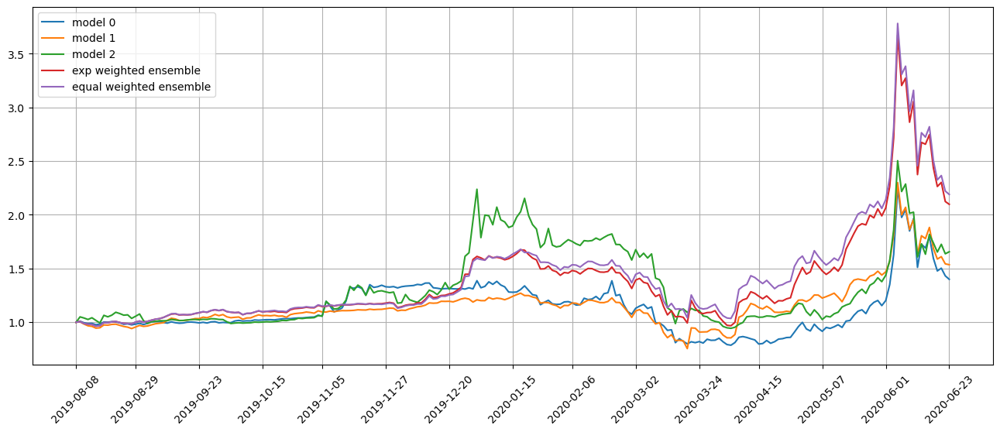

Standardization data are from 2018-11-15 to 2019-09-04
Training data are from 2019-09-05 to 2020-06-19
Testing data are from 2020-05-26 to 2020-07-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 12 out of 67 iterations
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3062572479248047
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 1.4714000225067139
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3315167427062988
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4685992002487183
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.302290

position on 2020-06-26 market open will be {'GUSH': 0.12303986960452852, 'JETS': 0.12631571779897346, 'CENN': 0.1619037498893277, 'IVR': 0.1518246797404902, 'MFA': 0.1730372316965163, 'MVIS': 0.15702318081080865, 'SAVA': 0.20405852855725168, 'NNDM': 0.15284832294837897, 'NCLH': 0.15913720590355146, 'UAL': 0.1572900451818466}
Total asset on 2020-06-26 will be 1.5664785321316623
It should be the same as 1.5664785321316737
top_stocks by return weighted ensemble to buy on 2020-06-25 are ['IVR', 'UAL', 'XELA', 'SAVA', 'MVIS', 'CENN', 'JETS', 'MFA', 'GUSH', 'NNDM']
position on 2020-06-26 market open will be {'GUSH': 0.14270259915434363, 'JETS': 0.21975394249788524, 'NNDM': 0.15521912560569937, 'UAL': 0.21355031634821606, 'CENN': 0.15095592193982535, 'XELA': 0.17535776039003445, 'MFA': 0.23886744438725274, 'SAVA': 0.28169047056521573, 'MVIS': 0.21676101462151687, 'IVR': 0.20958479795914423}
Total asset on 2020-06-26 will be 2.0044433934691255
It should be the same as 2.0044433934691335
top_st

position on 2020-07-01 market open will be {'GUSH': 0.1643784825717548, 'NNDM': 0.16866123425293564, 'JETS': 0.24486113244286944, 'CENN': 0.13749373213060917, 'XELA': 0.14699059301155953, 'MFA': 0.2595338154146161, 'MVIS': 0.21402045161390715, 'TOON': 0.19963537748819632, 'ZOM': 0.23439193881550463, 'UAL': 0.2702709576609457}
Total asset on 2020-07-01 will be 2.040237715402892
It should be the same as 2.0402377154028986
Testing data from 2020-06-03 to 2020-06-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-01 are ['IVR', 'INO', 'XELA', 'MVIS', 'CENN', 'GUSH', 'MFA', 'JETS', 'TOON', 'NNDM']
position on 2020-07-02 market open will be {'GUSH': 0.15569609501978657, 'MFA': 0.11325564516105278, 'NNDM': 0.057347482362648396, 'JETS': 0.1173823723101826, 'CENN': 0.11415898712049281, 'XELA': 0.10678696439632802, 'MVIS': 0.21014156824526553, 'TOON': 0.17589274146618822, 'INO': 0.11281198320975866, 'IVR': 0.052877627245290215}
Total asset on 2020-07-02 will be 1.21635

Testing data from 2020-06-08 to 2020-07-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-07 are ['UAL', 'XELA', 'MVIS', 'ZOM', 'CENN', 'GUSH', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-07-08 market open will be {'GUSH': 0.1463101560436573, 'MFA': 0.10526112591759089, 'NNDM': 0.05519358206219905, 'JETS': 0.11116801405716244, 'CENN': 0.10584571504615338, 'XELA': 0.11478308974967627, 'MVIS': 0.20733968334075026, 'TOON': 0.1630390437089574, 'UAL': 0.04659951416106736, 'ZOM': 0.12318537503343403}
Total asset on 2020-07-08 will be 1.1787252991206447
It should be the same as 1.1787252991206483
top_stocks by model 1 to buy on 2020-07-07 are ['ZOM', 'XELA', 'IDEX', 'MVIS', 'INO', 'MFA', 'CENN', 'JETS', 'GUSH', 'TOON']
position on 2020-07-08 market open will be {'GUSH': 0.1145323851960071, 'JETS': 0.14226905030390102, 'CENN': 0.09767902291033262, 'XELA': 0.1083584921817131, 'MFA': 0.17236269960981426, 'MVIS': 0.1607973666342873, 'TOON': 0.14043790198778527, 'IN

Testing data from 2020-06-11 to 2020-07-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-10 are ['XELA', 'MVIS', 'INO', 'ZOM', 'JETS', 'GUSH', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-13 market open will be {'GUSH': 0.14276743243461654, 'MFA': 0.1079259727248234, 'NNDM': 0.05169350129546773, 'JETS': 0.11241088834175599, 'CENN': 0.09484383188932412, 'XELA': 0.13670794958950208, 'MVIS': 0.21434439560203855, 'TOON': 0.1589799778636701, 'ZOM': 0.11291992711398123, 'INO': 0.04796888727395553}
Total asset on 2020-07-13 will be 1.1805627641291319
It should be the same as 1.180562764129135
top_stocks by model 1 to buy on 2020-07-10 are ['XELA', 'IDEX', 'MVIS', 'ZOM', 'MFA', 'GUSH', 'CENN', 'JETS', 'INO', 'TOON']
position on 2020-07-13 market open will be {'GUSH': 0.11175912190379537, 'JETS': 0.1438596386184979, 'CENN': 0.08752600730205663, 'XELA': 0.1290561816995684, 'MFA': 0.17672632564684518, 'MVIS': 0.16622970485096622, 'TOON': 0.13694152051758962, 'IN

top_stocks by model 0 to buy on 2020-07-15 are ['INO', 'XELA', 'MVIS', 'ZOM', 'GUSH', 'JETS', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-16 market open will be {'GUSH': 0.15040499732360516, 'MFA': 0.11458806327011016, 'NNDM': 0.049001133943793684, 'JETS': 0.11641569816436433, 'CENN': 0.094678886094734, 'XELA': 0.13412855431422846, 'MVIS': 0.27458498785132346, 'TOON': 0.15221487242266288, 'ZOM': 0.10812938543142361, 'INO': 0.04833677359300053}
Total asset on 2020-07-16 will be 1.2424833524092433
It should be the same as 1.2424833524092462
top_stocks by model 1 to buy on 2020-07-15 are ['IDEX', 'XELA', 'ZOM', 'MVIS', 'MFA', 'GUSH', 'CENN', 'JETS', 'INO', 'TOON']
position on 2020-07-16 market open will be {'GUSH': 0.11773784920119588, 'JETS': 0.14898485826861466, 'CENN': 0.08737378815892265, 'XELA': 0.12662115940335014, 'MFA': 0.18763534739082358, 'MVIS': 0.21294786532126872, 'TOON': 0.1311142217721603, 'INO': 0.10021237211173709, 'IDEX': 0.13775445996510957, 'ZOM': 0.149599949778

position on 2020-07-21 market open will be {'GUSH': 0.14953082344345375, 'MFA': 0.11325564516105278, 'NNDM': 0.06030908644948988, 'JETS': 0.11261802527588995, 'CENN': 0.08742127113276836, 'XELA': 0.13154915903895484, 'MVIS': 0.3418302923618966, 'TOON': 0.13597862194492844, 'ZOM': 0.11223556255964365, 'INO': 0.04998706193554515}
Total asset on 2020-07-21 will be 1.2947155493036204
It should be the same as 1.2947155493036233
top_stocks by model 1 to buy on 2020-07-20 are ['NYMT', 'XELA', 'ZOM', 'MVIS', 'MFA', 'GUSH', 'CENN', 'JETS', 'INO', 'TOON']
position on 2020-07-21 market open will be {'GUSH': 0.11705354113757852, 'JETS': 0.14412472543462967, 'CENN': 0.08067614586102616, 'XELA': 0.12418613710713186, 'MFA': 0.18545354304202785, 'MVIS': 0.26509836400825004, 'TOON': 0.11712870700606796, 'INO': 0.10830563854310032, 'ZOM': 0.15528095767227384, 'NYMT': 0.14584145559483577}
Total asset on 2020-07-21 will be 1.4431492154069165
It should be the same as 1.4431492154069219
top_stocks by model 

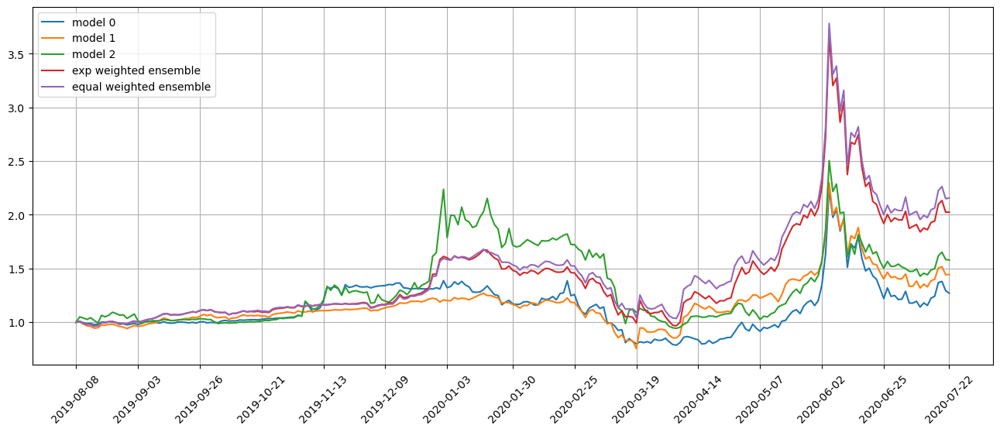

Standardization data are from 2018-12-17 to 2019-10-02
Training data are from 2019-10-03 to 2020-07-20
Testing data are from 2020-06-23 to 2020-08-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 13 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3299461603164673
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3761932849884033
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.334944725036621
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3610363006591797
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3380743

position on 2020-07-27 market open will be {'GUSH': 0.1640926004067173, 'NNDM': 0.18290374276801616, 'JETS': 0.2298637487405652, 'MFA': 0.2678388895875403, 'MVIS': 0.31947979681282507, 'TOON': 0.1538856034804847, 'ZOM': 0.26877190119622435, 'INO': 0.2341407576092649, 'NYMT': 0.14600842008298845, 'TSLA': 0.11862351951941182}
Total asset on 2020-07-27 will be 2.0856089802040314
It should be the same as 2.0856089802040385
Testing data from 2020-06-26 to 2020-07-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-27 are ['WKHS', 'BLDP', 'ALT', 'TSLA', 'MVIS', 'JETS', 'INO', 'MFA', 'TOON', 'NNDM']
position on 2020-07-28 market open will be {'MFA': 0.11325564516105278, 'NNDM': 0.06165527012532694, 'JETS': 0.10854417200356158, 'MVIS': 0.2857925274693847, 'TOON': 0.11500679249712308, 'INO': 0.040013118189680084, 'TSLA': 0.12230071879073882, 'BLDP': 0.10981816913047535, 'ALT': 0.11485845185095939, 'WKHS': 0.11500664589349642}
Total asset on 2020-07-28 will be 1.1862515

Testing data from 2020-07-01 to 2020-07-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-30 are ['WKHS', 'BLDP', 'TSLA', 'JETS', 'MVIS', 'INO', 'ALT', 'MFA', 'TOON', 'NNDM']
position on 2020-07-31 market open will be {'MFA': 0.11858532818639995, 'NNDM': 0.06327069053633137, 'JETS': 0.10730129771896803, 'MVIS': 0.2857925274693847, 'TOON': 0.10553564746039586, 'INO': 0.04044336666540696, 'TSLA': 0.12319520105627381, 'BLDP': 0.10424364153056256, 'ALT': 0.1314058538071419, 'WKHS': 0.2896481831631844}
Total asset on 2020-07-31 will be 1.3694217375940478
It should be the same as 1.3694217375940494
top_stocks by model 1 to buy on 2020-07-30 are ['TSLA', 'WKHS', 'CENN', 'GUSH', 'ALT', 'JETS', 'MVIS', 'INO', 'NYMT', 'TOON']
position on 2020-07-31 market open will be {'GUSH': 0.11510864823357823, 'JETS': 0.1373205580069475, 'CENN': 0.07610957156700583, 'MVIS': 0.22163960646795497, 'TOON': 0.0909058626516359, 'INO': 0.08762756765295912, 'NYMT': 0.15706003235077412, 'T

top_stocks by model 0 to buy on 2020-08-04 are ['HXL', 'VXRT', 'INO', 'MVIS', 'JETS', 'TSLA', 'ALT', 'MFA', 'TOON', 'NNDM']
position on 2020-08-05 market open will be {'MFA': 0.11991774629545733, 'NNDM': 0.0713478054295738, 'JETS': 0.11102991398777487, 'MVIS': 0.420283136490531, 'TOON': 0.11297726602618673, 'INO': 0.039582869713953195, 'TSLA': 0.12140541759825535, 'ALT': 0.13398530539036502, 'VXRT': 0.1837948934199362, 'HXL': 0.18261395116432644}
Total asset on 2020-08-05 will be 1.4969383055163588
It should be the same as 1.4969383055163599
top_stocks by model 1 to buy on 2020-08-04 are ['XELA', 'GUSH', 'CENN', 'ALT', 'TSLA', 'JETS', 'MVIS', 'INO', 'NYMT', 'TOON']
position on 2020-08-05 market open will be {'JETS': 0.14209231452351226, 'CENN': 0.06408425925941892, 'MVIS': 0.3259406038419177, 'INO': 0.08576315177847221, 'NYMT': 0.15174596226772208, 'TSLA': 0.16216523594228546, 'ALT': 0.1839369836439214, 'XELA': 0.10005857446619656, 'TOON': 0.13693591324943832, 'GUSH': 0.138460869277624

position on 2020-08-10 market open will be {'MFA': 0.1261356974710583, 'NNDM': 0.05896290277365289, 'JETS': 0.11607044799089532, 'MVIS': 0.24376422050055216, 'TOON': 0.11094772665183578, 'INO': 0.0383703506041493, 'TSLA': 0.11774696382150478, 'ALT': 0.1330119249823599, 'VXRT': 0.18903056357760512, 'GUSH': 0.20707626897157058}
Total asset on 2020-08-10 will be 1.3411170673451829
It should be the same as 1.3411170673451842
top_stocks by model 1 to buy on 2020-08-07 are ['CENN', 'ALT', 'GUSH', 'TSLA', 'INO', 'NYMT', 'JETS', 'MVIS', 'TOON', 'KODK']
position on 2020-08-10 market open will be {'JETS': 0.14854301881764248, 'CENN': 0.06339927311531586, 'MVIS': 0.18904555126444955, 'INO': 0.08313601884950841, 'NYMT': 0.16355498969094912, 'TSLA': 0.15727851810359794, 'ALT': 0.18260071280687007, 'TOON': 0.13447597739262598, 'GUSH': 0.13194147730277128, 'KODK': 0.06986567088798507}
Total asset on 2020-08-10 will be 1.3238412082317104
It should be the same as 1.3238412082317155
top_stocks by model 

top_stocks by model 1 to buy on 2020-08-12 are ['TSLA', 'CENN', 'XELA', 'ALT', 'JETS', 'INO', 'NYMT', 'MVIS', 'TOON', 'KODK']
position on 2020-08-13 market open will be {'JETS': 0.1532264158712386, 'CENN': 0.05403779581257416, 'MVIS': 0.1434138713891988, 'INO': 0.05707656259236011, 'NYMT': 0.16296453902366048, 'TSLA': 0.17498321657440047, 'ALT': 0.14632109593769582, 'TOON': 0.12627622248283424, 'XELA': 0.05260969193372369, 'KODK': 0.12327357002485735}
Total asset on 2020-08-13 will be 1.194182981642538
It should be the same as 1.1941829816425438
top_stocks by model 2 to buy on 2020-08-12 are ['INO', 'TSLA', 'GUSH', 'MVIS', 'NYMT', 'ALT', 'MFA', 'TOON', 'NNDM', 'KODK']
position on 2020-08-13 market open will be {'MFA': 0.20306847424516797, 'NNDM': 0.13260812893599744, 'MVIS': 0.14829720735987267, 'TOON': 0.13506258162815504, 'NYMT': 0.1543931454343289, 'ALT': 0.10430088256380807, 'TSLA': 0.1264282836676659, 'KODK': 0.08612271276767332, 'GUSH': 0.08674264294090393, 'INO': 0.1499792942835

position on 2020-08-18 market open will be {'JETS': 0.1494266808651354, 'CENN': 0.047187934371543644, 'MVIS': 0.1618838342776231, 'INO': 0.06271218697752617, 'NYMT': 0.16237408835637188, 'TSLA': 0.2062640455324984, 'ALT': 0.17745608665093285, 'TOON': 0.12545625168379249, 'GUSH': 0.05169152580127315, 'XELA': 0.11561278487285168}
Total asset on 2020-08-18 will be 1.2600654193895433
It should be the same as 1.2600654193895486
top_stocks by model 2 to buy on 2020-08-17 are ['INO', 'FULT', 'GUSH', 'JETS', 'NYMT', 'MVIS', 'ALT', 'MFA', 'TOON', 'NNDM']
position on 2020-08-18 market open will be {'MFA': 0.19806326999499949, 'NNDM': 0.13260812893599747, 'MVIS': 0.1673960845456126, 'TOON': 0.13418555687400283, 'NYMT': 0.1538337505114049, 'ALT': 0.12649458600209662, 'GUSH': 0.08522877441097752, 'JETS': 0.1462600819568614, 'INO': 0.10731504547247872, 'FULT': 0.10334929827768176}
Total asset on 2020-08-18 will be 1.3547345769821006
It should be the same as 1.3547345769821133
top_stocks by return we

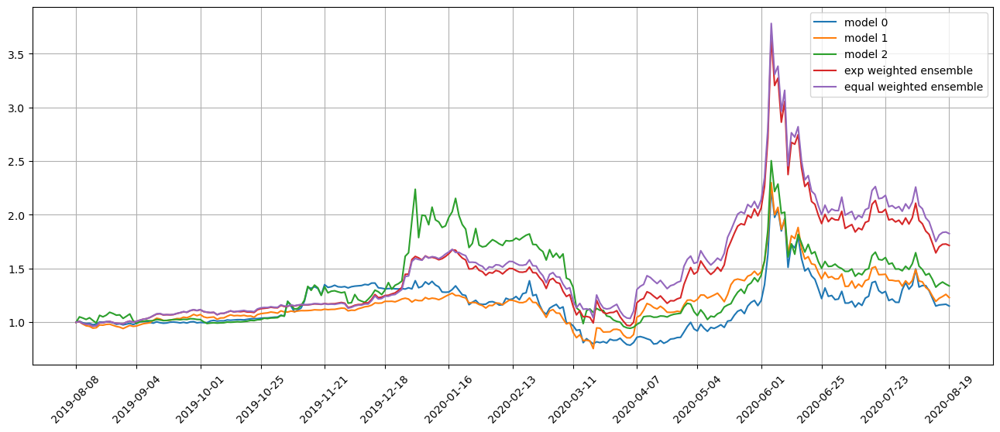

Standardization data are from 2019-01-16 to 2019-10-30
Training data are from 2019-10-31 to 2020-08-17
Testing data are from 2020-07-22 to 2020-09-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 14 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3485227823257446
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4108142852783203
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.318993330001831
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4159207344055176
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.330615

position on 2020-08-24 market open will be {'MFA': 0.1916280073876399, 'MVIS': 0.15391452024016966, 'TOON': 0.10234937512650748, 'NYMT': 0.14432402348466952, 'ALT': 0.11011125727909302, 'JETS': 0.14703852251347974, 'INO': 0.09622099010839158, 'KODK': 0.09616834941110562, 'SVC': 0.08843102598052027, 'EPR': 0.08856035038633739}
Total asset on 2020-08-24 will be 1.218746421917902
It should be the same as 1.2187464219179143
top_stocks by return weighted ensemble to buy on 2020-08-21 are ['SKYW', 'NYMT', 'AER', 'MAR', 'DAL', 'TNL', 'KODK', 'OKE', 'TOON', 'MFA']
position on 2020-08-24 market open will be {'MFA': 0.2645308870751465, 'TOON': 0.09229640030842513, 'NYMT': 0.15262761993423837, 'KODK': 0.14282942171863516, 'MAR': 0.16692535961131438, 'OKE': 0.16101316734827356, 'TNL': 0.16204470966516074, 'DAL': 0.163692180695956, 'SKYW': 0.16240882769762735, 'AER': 0.16183475613004883}
Total asset on 2020-08-24 will be 1.6302033301848162
It should be the same as 1.630203330184826
top_stocks by eq

position on 2020-08-27 market open will be {'MFA': 0.2854871969560778, 'TOON': 0.09898587149811186, 'NYMT': 0.15527880100445668, 'KODK': 0.13195647291518103, 'INO': 0.1646414711513556, 'MVIS': 0.20258898150077703, 'FULT': 0.17827965117953817, 'JETS': 0.18492662230031445, 'POR': 0.17680759406943783, 'MARA': 0.1795014044174064}
Total asset on 2020-08-27 will be 1.7584540669926485
It should be the same as 1.758454066992657
Testing data from 2020-07-30 to 2020-08-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-08-27 are ['TOON', 'LNC', 'INO', 'FULT', 'GM', 'SYY', 'AGO', 'OKE', 'NYMT', 'KODK']
position on 2020-08-28 market open will be {'KODK': 0.09144230664095196, 'FULT': 0.1302762557301746, 'NYMT': 0.12984546495617535, 'TOON': 0.10292697007816509, 'INO': 0.11059412419489197, 'OKE': 0.11070272150494684, 'AGO': 0.113410079483376, 'GM': 0.10854578860339932, 'LNC': 0.11251610623717691, 'SYY': 0.11208400696016207}
Total asset on 2020-08-28 will be 1.12234382438942
It

Testing data from 2020-08-04 to 2020-08-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-01 are ['REM', 'SDOW', 'YANG', 'PSEC', 'FAZ', 'INO', 'FULT', 'TOON', 'NYMT', 'KODK']
position on 2020-09-02 market open will be {'KODK': 0.11422486093143626, 'FULT': 0.12615277763994892, 'NYMT': 0.126068145941604, 'TOON': 0.1285359270683315, 'PSEC': 0.11016525312968829, 'REM': 0.10970183088143587, 'YANG': 0.10355334351597785, 'INO': 0.10275654437983606, 'FAZ': 0.10451038822360735, 'SDOW': 0.10171488631368487}
Total asset on 2020-09-02 will be 1.127383958025551
It should be the same as 1.127383958025551
top_stocks by model 1 to buy on 2020-09-01 are ['YANG', 'DXD', 'GRPN', 'INO', 'NYMT', 'MVIS', 'TOON', 'MFA', 'CODX', 'KODK']
position on 2020-09-02 market open will be {'TOON': 0.10577683520835496, 'MFA': 0.1000453516253502, 'CODX': 0.10432876317439993, 'KODK': 0.15933926490855438, 'MVIS': 0.12087452828664497, 'NYMT': 0.12560657118840504, 'YANG': 0.12136247054763795, 'GRP

top_stocks by model 0 to buy on 2020-09-04 are ['AMLP', 'INO', 'SPYD', 'FULT', 'TOON', 'REM', 'GEVO', 'CIM', 'NYMT', 'KODK']
position on 2020-09-08 market open will be {'KODK': 0.0920664855989817, 'FULT': 0.13182256001400922, 'NYMT': 0.1204021561624484, 'TOON': 0.09714925007563799, 'CIM': 0.1034146931935584, 'INO': 0.10830810552766508, 'SPYD': 0.10369340194831657, 'AMLP': 0.1028291307623755, 'REM': 0.1041180210575106, 'GEVO': 0.09654614299794445}
Total asset on 2020-09-08 will be 1.0603499473384477
It should be the same as 1.060349947338448
top_stocks by model 1 to buy on 2020-09-04 are ['VLO', 'ARI', 'H', 'MVIS', 'NYMT', 'BXMT', 'TOON', 'CODX', 'MFA', 'KODK']
position on 2020-09-08 market open will be {'TOON': 0.07994761037046931, 'MFA': 0.09892544206875398, 'CODX': 0.08962606015681088, 'KODK': 0.12842918799315797, 'NYMT': 0.11842889763256895, 'BXMT': 0.11908940292477575, 'VLO': 0.11630191483878799, 'H': 0.12148612212627961, 'MVIS': 0.11572067152783552, 'ARI': 0.12004436690058483}
Tot

position on 2020-09-11 market open will be {'KODK': 0.09768410366204909, 'NYMT': 0.11756916690151989, 'TOON': 0.10512047249515176, 'INO': 0.10395454609764022, 'MLKN': 0.10655060119572193, 'ALL': 0.10606357127960692, 'CIM': 0.1053131973313717, 'FULT': 0.10379521778878545, 'COF': 0.1038807654994729, 'OKE': 0.10440929829790498}
Total asset on 2020-09-11 will be 1.0543409405492246
It should be the same as 1.0543409405492248
top_stocks by model 1 to buy on 2020-09-10 are ['FNF', 'SRNE', 'ALL', 'MVIS', 'NYMT', 'MLKN', 'CODX', 'TOON', 'MFA', 'KODK']
position on 2020-09-11 market open will be {'TOON': 0.08650741586228182, 'MFA': 0.10191186755301068, 'CODX': 0.11832654516635087, 'KODK': 0.1362655480062681, 'NYMT': 0.11564233794069767, 'MVIS': 0.12977247390179247, 'SRNE': 0.11663364989010805, 'ALL': 0.117795174820627, 'MLKN': 0.11833607471131995, 'FNF': 0.1168026280533954}
Total asset on 2020-09-11 will be 1.1579937159058462
It should be the same as 1.157993715905852
top_stocks by model 2 to buy

top_stocks by model 1 to buy on 2020-09-15 are ['JETS', 'URBN', 'MVIS', 'CENN', 'BXMT', 'NYMT', 'TOON', 'GEVO', 'MFA', 'KODK']
position on 2020-09-16 market open will be {'TOON': 0.08445747713483391, 'MFA': 0.10452498985173535, 'KODK': 0.2054866883334986, 'NYMT': 0.12446645470442737, 'JETS': 0.12053394989583942, 'MVIS': 0.13012464666135304, 'BXMT': 0.1259902457541827, 'CENN': 0.12394449087037354, 'URBN': 0.12319340821223229, 'GEVO': 0.12001045848556915}
Total asset on 2020-09-16 will be 1.2627328099040394
It should be the same as 1.2627328099040456
top_stocks by model 2 to buy on 2020-09-15 are ['TSLA', 'MVIS', 'INO', 'GEVO', 'CODX', 'JETS', 'NYMT', 'TOON', 'MFA', 'KODK']
position on 2020-09-16 market open will be {'MFA': 0.20020835753078622, 'MVIS': 0.1898653628522611, 'TOON': 0.09033406824615929, 'NYMT': 0.14991798605093679, 'JETS': 0.15966652888123817, 'INO': 0.10426961344774835, 'KODK': 0.13291788993086717, 'CODX': 0.08979520131453395, 'TSLA': 0.07366494036446268, 'GEVO': 0.0648029

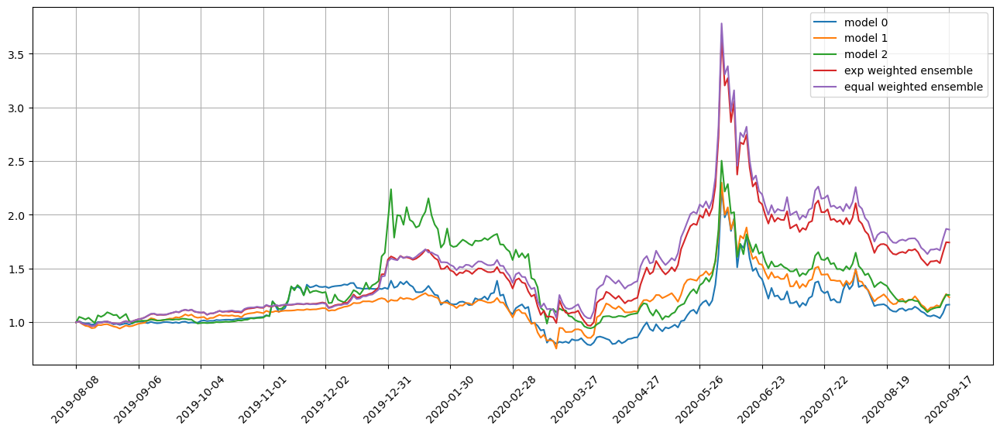

Standardization data are from 2019-02-14 to 2019-11-27
Training data are from 2019-11-29 to 2020-09-15
Testing data are from 2020-08-19 to 2020-10-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 15 out of 67 iterations
Restoring model weights from the end of the best epoch: 28.
Epoch 48: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3386387825012207
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4480499029159546
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3493592739105225
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4494208097457886
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3549149

position on 2020-09-22 market open will be {'MFA': 0.20092338670938173, 'TOON': 0.10085842384404023, 'INO': 0.1299382086983277, 'KODK': 0.14094366184033744, 'TSLA': 0.07194502230124952, 'ALT': 0.1416945028306089, 'GEVO': 0.14411816622315654, 'SAVA': 0.14790407863481378, 'NYMT': 0.12325879660206202, 'ARCT': 0.11908009915392592}
Total asset on 2020-09-22 will be 1.3206643468378916
It should be the same as 1.3206643468379036
top_stocks by return weighted ensemble to buy on 2020-09-21 are ['MAR', 'MFA', 'TJX', 'DRH', 'GRFS', 'ROST', 'URBN', 'TSLA', 'SAVA', 'KODK']
position on 2020-09-22 market open will be {'KODK': 0.2093298038162805, 'GRFS': 0.17119626757876213, 'TSLA': 0.17281197263874618, 'MAR': 0.16946340378415833, 'DRH': 0.16476840467230539, 'ROST': 0.17344451377271033, 'MFA': 0.17267440998450698, 'SAVA': 0.20184559563364443, 'URBN': 0.1771970300801082, 'TJX': 0.17078222134975854}
Total asset on 2020-09-22 will be 1.7835136233109687
It should be the same as 1.7835136233109812
top_stoc

position on 2020-09-25 market open will be {'KODK': 0.18841773598112688, 'TSLA': 0.15827822601792035, 'GRFS': 0.18146095902341391, 'TOON': 0.19450786819116275, 'OPK': 0.1654082712687491, 'AGQ': 0.17462431465871617, 'NFLX': 0.16676520611592335, 'INO': 0.1757185761298105, 'MFA': 0.1654082712687491, 'NVDA': 0.17054976760914603}
Total asset on 2020-09-25 will be 1.7411391962647063
It should be the same as 1.741139196264718
top_stocks by equal weighted ensemble to buy on 2020-09-24 are ['AGQ', 'NFLX', 'NVDA', 'MFA', 'INO', 'GRFS', 'OPK', 'TOON', 'TSLA', 'KODK']
position on 2020-09-25 market open will be {'KODK': 0.19269494918424065, 'GRFS': 0.19775538159607384, 'TOON': 0.21352935479810226, 'OPK': 0.18158402418751188, 'AGQ': 0.1917013310972608, 'NFLX': 0.18307365761527336, 'INO': 0.1929026035603036, 'MFA': 0.18158402418751188, 'NVDA': 0.18722832231525022, 'TSLA': 0.1963932417544311}
Total asset on 2020-09-25 will be 1.9184468902959488
It should be the same as 1.9184468902959597
Testing data 

position on 2020-09-30 market open will be {'KODK': 0.18927306664446752, 'MFA': 0.18295446829680015, 'TSLA': 0.2102940630963735, 'TOON': 0.20392782061512515, 'SAVA': 0.20217095347055755, 'MLKN': 0.19459382440058015, 'H': 0.1907685854060615, 'QID': 0.1942092400320493, 'PSQ': 0.19346090466733554, 'GRFS': 0.19254018294421013}
Total asset on 2020-09-30 will be 1.9541931095735499
It should be the same as 1.9541931095735607
Testing data from 2020-09-01 to 2020-09-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-30 are ['TWM', 'INO', 'QID', 'W', 'SPXU', 'SPXS', 'SDS', 'PSQ', 'TSLA', 'KODK']
position on 2020-10-01 market open will be {'KODK': 0.13856786261699489, 'INO': 0.11621851322850382, 'QID': 0.11377114105890206, 'PSQ': 0.11582688537519487, 'TSLA': 0.12512856974740122, 'SPXU': 0.11176587336016128, 'TWM': 0.11547731847163113, 'SDS': 0.11338832132543505, 'W': 0.11646990142225648, 'SPXS': 0.1116747140586997}
Total asset on 2020-10-01 will be 1.1782891006651792
It

Testing data from 2020-09-04 to 2020-10-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-05 are ['CWH', 'SRLN', 'MGM', 'HAE', 'FOXF', 'TSLA', 'IHG', 'INO', 'TOON', 'KODK']
position on 2020-10-06 market open will be {'KODK': 0.13997226899296178, 'MGM': 0.11927229200245283, 'TOON': 0.11875216545831309, 'HAE': 0.12235503787692541, 'FOXF': 0.12199595271192816, 'INO': 0.11956670347395018, 'CWH': 0.12137347309566948, 'IHG': 0.12182279344563655, 'TSLA': 0.11838232715166674, 'SRLN': 0.11855120955796532}
Total asset on 2020-10-06 will be 1.2220442237674676
It should be the same as 1.2220442237674694
top_stocks by model 1 to buy on 2020-10-05 are ['SPDN', 'ASML', 'WGO', 'CZR', 'POR', 'CMG', 'TSLA', 'REGN', 'TOON', 'KODK']
position on 2020-10-06 market open will be {'KODK': 0.19525590372404514, 'ASML': 0.11167600624064959, 'TOON': 0.11520091858583274, 'REGN': 0.11595269103011568, 'POR': 0.11519103881461698, 'SPDN': 0.11339406914934473, 'TSLA': 0.11484214017964997, 'CM

top_stocks by model 0 to buy on 2020-10-08 are ['CCL', 'SWBI', 'INO', 'MGM', 'IMAX', 'AIR', 'TSLA', 'TOON', 'AMC', 'KODK']
position on 2020-10-09 market open will be {'KODK': 0.13841181415708742, 'INO': 0.12519810545422783, 'TSLA': 0.12015334982588825, 'SWBI': 0.1202499115940026, 'TOON': 0.1250572726335065, 'CCL': 0.12165225109871765, 'AIR': 0.1310848987081597, 'IMAX': 0.12886336768805354, 'AMC': 0.12626848572793117, 'MGM': 0.12551640856050125}
Total asset on 2020-10-09 will be 1.262455865448074
It should be the same as 1.262455865448076
top_stocks by model 1 to buy on 2020-10-08 are ['TSLA', 'CZR', 'PRO', 'FI', 'CMG', 'CACI', 'INTU', 'EFX', 'ASML', 'AIR']
position on 2020-10-09 market open will be {'ASML': 0.11513789534718925, 'TSLA': 0.11656020096716695, 'CACI': 0.12753592098817718, 'AIR': 0.13434963643155873, 'EFX': 0.12877945444772798, 'INTU': 0.12827096739080923, 'PRO': 0.1297454772951203, 'FI': 0.12885411072166017, 'CMG': 0.12812809851936524, 'CZR': 0.12481446728836484}
Total ass

position on 2020-10-14 market open will be {'KODK': 0.15058331127946664, 'TSLA': 0.1241541392943659, 'TOON': 0.11501801861528996, 'INO': 0.12179954673714777, 'IMAX': 0.10944192742735409, 'WKHS': 0.1111080030855371, 'WGO': 0.12319546934759092, 'MGM': 0.11719845269147532, 'SWBI': 0.11914466757846212, 'SAVA': 0.11799351297615174}
Total asset on 2020-10-14 will be 1.2096370490328392
It should be the same as 1.2096370490328419
top_stocks by model 1 to buy on 2020-10-13 are ['PTGX', 'JKHY', 'RNG', 'CTLT', 'CHDN', 'INO', 'MGM', 'WGO', 'TSLA', 'KODK']
position on 2020-10-14 market open will be {'TSLA': 0.12188512383094445, 'PTGX': 0.12470527521615316, 'CHDN': 0.12799531614638301, 'INO': 0.13025600595663384, 'RNG': 0.1254921824981098, 'CTLT': 0.12650001326258092, 'JKHY': 0.12448443774238951, 'KODK': 0.1294027066363762, 'WGO': 0.13174884651911373, 'MGM': 0.12533546109850296}
Total asset on 2020-10-14 will be 1.2678053689071824
It should be the same as 1.2678053689071875
top_stocks by model 2 to 

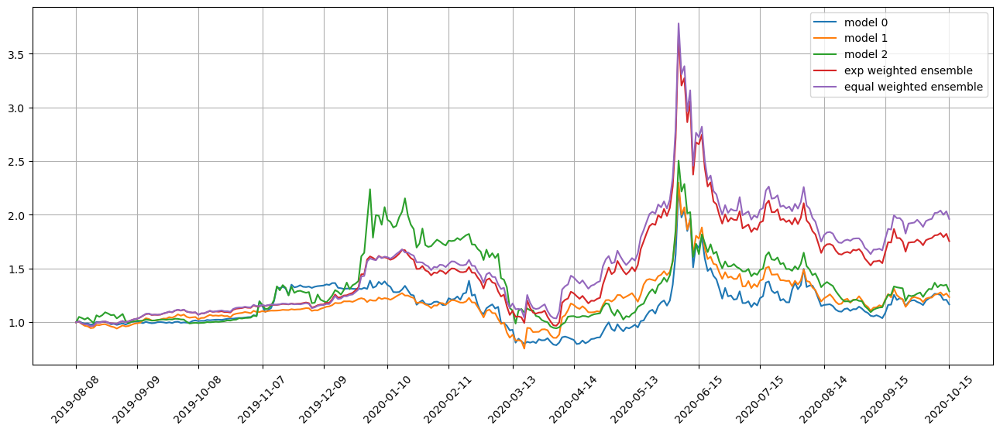

Standardization data are from 2019-03-15 to 2019-12-27
Training data are from 2019-12-30 to 2020-10-13
Testing data are from 2020-09-17 to 2020-11-10
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 16 out of 67 iterations
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3550738096237183
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.47976553440094
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3584446907043457
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4828836917877197
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3656442

position on 2020-10-20 market open will be {'KODK': 0.12742658715007923, 'LUV': 0.13615047101977476, 'BXMT': 0.13020611273841207, 'ALL': 0.1325639690184769, 'AGQ': 0.13012489424611162, 'CHDN': 0.12859084641519217, 'ASML': 0.13056461010506093, 'TSLA': 0.12807869988088258, 'SLV': 0.1313429636620318, 'W': 0.13268579019288046}
Total asset on 2020-10-20 will be 1.3077349444288884
It should be the same as 1.3077349444289024
top_stocks by return weighted ensemble to buy on 2020-10-19 are ['TNL', 'CACC', 'ASML', 'LUV', 'ALL', 'CHDN', 'HXL', 'AGQ', 'ACN', 'KODK']
position on 2020-10-20 market open will be {'KODK': 0.189254217896801, 'LUV': 0.18421904903239847, 'CACC': 0.18026572433222637, 'AGQ': 0.17565599401836965, 'CHDN': 0.17358517814433538, 'ALL': 0.17894850853764852, 'TNL': 0.18054529574077624, 'ASML': 0.17624956780559056, 'ACN': 0.1759564775583217, 'HXL': 0.17079869962777963}
Total asset on 2020-10-20 will be 1.7854787126942349
It should be the same as 1.7854787126942477
top_stocks by equ

position on 2020-10-23 market open will be {'KODK': 0.17858905851448018, 'HCC': 0.17806387731640866, 'VNO': 0.18461261307775215, 'DFS': 0.1822678526443125, 'SYF': 0.18398118989771503, 'SLG': 0.1773677347696193, 'VFC': 0.18145771166885022, 'PSX': 0.18441644248034555, 'JBLU': 0.19067866925175106, 'OKE': 0.19249733162570087}
Total asset on 2020-10-23 will be 1.8339324812469224
It should be the same as 1.8339324812469358
top_stocks by equal weighted ensemble to buy on 2020-10-22 are ['DFS', 'HCC', 'VFC', 'VNO', 'PSX', 'JBLU', 'SYF', 'SLG', 'OKE', 'KODK']
position on 2020-10-23 market open will be {'KODK': 0.18264315392663555, 'HCC': 0.20111466639699274, 'VNO': 0.20851115145512916, 'DFS': 0.20586285625085182, 'SYF': 0.2077979890545215, 'SLG': 0.20032840655489403, 'VFC': 0.20494784061449617, 'PSX': 0.2082895861110015, 'JBLU': 0.2153624729144019, 'OKE': 0.21741656542400026}
Total asset on 2020-10-23 will be 2.052274688702911
It should be the same as 2.0522746887029246
Testing data from 2020-0

Testing data from 2020-09-30 to 2020-10-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-28 are ['ATI', 'JBL', 'RL', 'KOS', 'CPRI', 'SHOO', 'LYB', 'BLMN', 'RTX', 'KODK']
position on 2020-10-29 market open will be {'CPRI': 0.1260445730608039, 'JBL': 0.12250484255107415, 'KOS': 0.11849426146283532, 'BLMN': 0.12289509579315509, 'RTX': 0.12021157390946312, 'KODK': 0.12450227368539021, 'LYB': 0.1226983620504765, 'SHOO': 0.12436915520604322, 'ATI': 0.12377280946858905, 'RL': 0.12817848444785648}
Total asset on 2020-10-29 will be 1.2336714316356847
It should be the same as 1.233671431635687
top_stocks by model 1 to buy on 2020-10-28 are ['ALT', 'CAL', 'LYB', 'PAA', 'ATI', 'OKE', 'KOS', 'PAGP', 'RTX', 'KODK']
position on 2020-10-29 market open will be {'KODK': 0.09494331558741326, 'CAL': 0.13152516809122552, 'KOS': 0.1269314518715209, 'PAGP': 0.12518696905710205, 'RTX': 0.12877104274686357, 'ALT': 0.13479973304602264, 'PAA': 0.12590738180080738, 'LYB': 0.1314348985

top_stocks by model 0 to buy on 2020-11-02 are ['SPXU', 'SSD', 'YANG', 'CINF', 'KODK', 'IART', 'PSQ', 'TNL', 'SDS', 'WMB']
position on 2020-11-03 market open will be {'CINF': 0.13260269903314778, 'KODK': 0.12336998450861271, 'YANG': 0.129187252932193, 'SSD': 0.13492297165351463, 'WMB': 0.12684225240483485, 'SPXU': 0.12573029973088015, 'TNL': 0.1349267828777806, 'PSQ': 0.12982024831298591, 'SDS': 0.1272487837519255, 'IART': 0.13157350527853576}
Total asset on 2020-11-03 will be 1.2962247804844087
It should be the same as 1.296224780484411
top_stocks by model 1 to buy on 2020-11-02 are ['DBO', 'QID', 'PSQ', 'ALT', 'BNO', 'SDS', 'WMB', 'CINF', 'TNL', 'KODK']
position on 2020-11-03 market open will be {'KODK': 0.09232057448122816, 'ALT': 0.13222215798099093, 'WMB': 0.13079025918798878, 'DBO': 0.14324882144581247, 'BNO': 0.1428133693600254, 'CINF': 0.13685543160415004, 'TNL': 0.13912642332827066, 'QID': 0.13374416527268546, 'PSQ': 0.1338609461972728, 'SDS': 0.13120944395683323}
Total asset 

position on 2020-11-06 market open will be {'ALT': 0.14148724586290895, 'CACC': 0.13817755413454838, 'WING': 0.13532341701344983, 'UAA': 0.1394905851066297, 'RWT': 0.1363165299996902, 'KODK': 0.13537953920558704, 'MRIN': 0.14133493782434858, 'TSLA': 0.13765195868037666, 'VRTX': 0.13460022730090163, 'GME': 0.13818882604052532}
Total asset on 2020-11-06 will be 1.3779508211689637
It should be the same as 1.3779508211689664
top_stocks by model 1 to buy on 2020-11-05 are ['RUN', 'VTNR', 'NYMT', 'WING', 'TSLA', 'CACC', 'RWT', 'ALT', 'KODK', 'MRIN']
position on 2020-11-06 market open will be {'KODK': 0.09363194503432071, 'ALT': 0.1435554864512844, 'RUN': 0.14385227626584704, 'WING': 0.13685577120553707, 'CACC': 0.1397422275591737, 'RWT': 0.13786012984963378, 'VTNR': 0.13028347013527963, 'MRIN': 0.14293536433768445, 'TSLA': 0.13921068044921828, 'NYMT': 0.14485286245482576}
Total asset on 2020-11-06 will be 1.3527802137427976
It should be the same as 1.3527802137428049
top_stocks by model 2 to

top_stocks by model 1 to buy on 2020-11-10 are ['SDOW', 'WGO', 'TWM', 'ANGI', 'SDS', 'SPXS', 'THO', 'SPXU', 'ALT', 'KODK']
position on 2020-11-11 market open will be {'KODK': 0.08563258153390213, 'ALT': 0.1121527251973972, 'SPXU': 0.13138899307151938, 'SDOW': 0.12227033720858953, 'SDS': 0.13424525537758114, 'SPXS': 0.1323521168567282, 'TWM': 0.145896458483899, 'WGO': 0.15061577139270185, 'ANGI': 0.145790516155757, 'THO': 0.14913332842001387}
Total asset on 2020-11-11 will be 1.3094780836980817
It should be the same as 1.3094780836980893
top_stocks by model 2 to buy on 2020-11-10 are ['WGO', 'DUST', 'SPDN', 'LABU', 'TWLO', 'BLDP', 'ANGI', 'AIV', 'THO', 'KODK']
position on 2020-11-11 market open will be {'KODK': 0.09194426776665215, 'SPDN': 0.152225558041883, 'LABU': 0.1565514731731571, 'DUST': 0.16400014998824064, 'TWLO': 0.14745742384792976, 'AIV': 0.15513827764757032, 'THO': 0.15560372722727894, 'WGO': 0.15715048846700985, 'ANGI': 0.1521158814636916, 'BLDP': 0.1417306554485579}
Total 

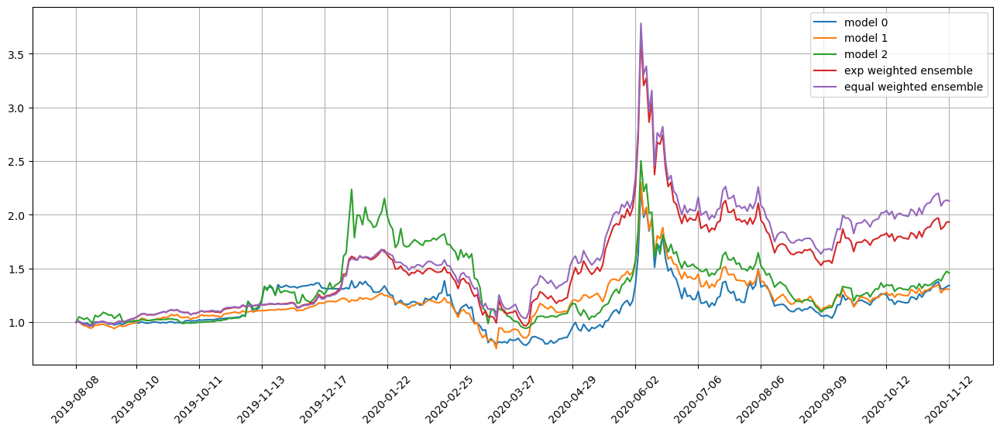

Standardization data are from 2019-04-12 to 2020-01-28
Training data are from 2020-01-29 to 2020-11-10
Testing data are from 2020-10-15 to 2020-12-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 17 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.380068063735962
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3781780004501343
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3685554265975952
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3863717317581177
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.38879036

position on 2020-11-17 market open will be {'MTH': 0.1939683243525781, 'SSB': 0.20066357762760798, 'LULU': 0.20707734808383668, 'NFLX': 0.20276124975398743, 'HOLX': 0.208308057897651, 'WTM': 0.2037660093548426, 'SAP': 0.19748139349760738, 'IBP': 0.19837582556799707, 'EBAY': 0.20237585349445114, 'SFNC': 0.2014162426219}
Total asset on 2020-11-17 will be 2.016193882252445
It should be the same as 2.0161938822524594
top_stocks by equal weighted ensemble to buy on 2020-11-16 are ['IBP', 'HOLX', 'EBAY', 'NFLX', 'LULU', 'MTH', 'WTM', 'SSB', 'SFNC', 'SAP']
position on 2020-11-17 market open will be {'SSB': 0.22564781828491848, 'LULU': 0.23286015511025948, 'NFLX': 0.2280066675807933, 'HOLX': 0.23424409826383172, 'WTM': 0.22913652788984523, 'SAP': 0.22206942645713948, 'IBP': 0.22307522256460272, 'EBAY': 0.22757328636548915, 'MTH': 0.22554308965208425, 'SFNC': 0.22649419616709004}
Total asset on 2020-11-17 will be 2.2746504883360394
It should be the same as 2.2746504883360537
Testing data from 2

position on 2020-11-20 market open will be {'MTH': 0.230632032527048, 'HSBC': 0.2294342315711272, 'PAGP': 0.2283635672693995, 'KAR': 0.22935725240217142, 'CINF': 0.22618569581025164, 'RS': 0.22726377499180034, 'ASH': 0.2284503514413353, 'BSX': 0.22614425775706243, 'COF': 0.22696982558863546, 'ALSN': 0.22672193336554267}
Total asset on 2020-11-20 will be 2.2795229227243587
It should be the same as 2.2795229227243743
Testing data from 2020-10-23 to 2020-11-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-20 are ['HXL', 'USFD', 'MODG', 'RGA', 'AGO', 'PARR', 'SPG', 'EPR', 'SLG', 'BFH']
position on 2020-11-23 market open will be {'MODG': 0.1531993860886196, 'BFH': 0.15015630825180118, 'PARR': 0.14923254532410218, 'SLG': 0.15422939973256317, 'SPG': 0.1571503191932713, 'USFD': 0.1482549291351424, 'EPR': 0.1556068026027599, 'RGA': 0.1482447545935849, 'AGO': 0.1532929717447982, 'HXL': 0.1486561277704642}
Total asset on 2020-11-23 will be 1.518023544437103
It should 

position on 2020-11-25 market open will be {'SAP': 0.22842573374172032, 'DXCM': 0.22802548460436387, 'MODG': 0.24025290620330678, 'CLS': 0.25019209373812396, 'SEDG': 0.23712567343496563, 'CHDN': 0.23481409120274893, 'AAPL': 0.24234482451900377, 'CACC': 0.24825471098568, 'KALU': 0.23760425197347879, 'AIV': 0.23928410838741632}
Total asset on 2020-11-25 will be 2.3863238787907926
It should be the same as 2.3863238787908085
Testing data from 2020-10-28 to 2020-11-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-25 are ['VLY', 'ABG', 'CBU', 'ALT', 'DDD', 'BAX', 'CBSH', 'MLM', 'VMC', 'BLNK']
position on 2020-11-27 market open will be {'ALT': 0.1576340461433209, 'BLNK': 0.13232027878030841, 'CBSH': 0.1584069543661646, 'BAX': 0.15679928457554457, 'VMC': 0.15774887770716242, 'CBU': 0.15502623094681423, 'MLM': 0.15754286169549864, 'DDD': 0.1656009924756133, 'VLY': 0.15843074913282232, 'ABG': 0.15201677206824846}
Total asset on 2020-11-27 will be 1.5515270478914946
I

Testing data from 2020-11-02 to 2020-11-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-01 are ['POOL', 'PRTA', 'AHT', 'ALT', 'NFG', 'LRN', 'QRTEA', 'PARR', 'FNKO', 'BLNK']
position on 2020-12-02 market open will be {'BLNK': 0.10221055853362777, 'AHT': 0.12464620504004964, 'PRTA': 0.14787269537361555, 'NFG': 0.14989513773298374, 'LRN': 0.15120551484003894, 'PARR': 0.15454394375084257, 'ALT': 0.14390726637260576, 'POOL': 0.15460118987870664, 'QRTEA': 0.1477788089734409, 'FNKO': 0.15360636202984246}
Total asset on 2020-12-02 will be 1.4302676825257512
It should be the same as 1.4302676825257539
top_stocks by model 1 to buy on 2020-12-01 are ['KALU', 'BEN', 'DGX', 'ERY', 'BVN', 'LRN', 'NFG', 'FNKO', 'QRTEA', 'BLNK']
position on 2020-12-02 market open will be {'BLNK': 0.10760976285719151, 'LRN': 0.1415621798328927, 'NFG': 0.14033537378766284, 'DGX': 0.14329171778454527, 'BVN': 0.14533985278572537, 'BEN': 0.14164062422640508, 'KALU': 0.15315973571762787, 'ERY':

top_stocks by model 0 to buy on 2020-12-04 are ['SWBI', 'SH', 'AWI', 'GLNG', 'DRH', 'SDS', 'QID', 'PSQ', 'OXM', 'BLNK']
position on 2020-12-07 market open will be {'BLNK': 0.12191135797807384, 'DRH': 0.1514042801761817, 'AWI': 0.1524329451649011, 'GLNG': 0.1606068427421579, 'QID': 0.14844171409982326, 'PSQ': 0.1493170631087006, 'SH': 0.1491677154551066, 'SDS': 0.14820513490769804, 'OXM': 0.15341767506053353, 'SWBI': 0.15861510806700713}
Total asset on 2020-12-07 will be 1.4935198367601812
It should be the same as 1.4935198367601836
top_stocks by model 1 to buy on 2020-12-04 are ['SNN', 'NYCB', 'VRE', 'ASB', 'AWI', 'FNKO', 'PSQ', 'KMT', 'OXM', 'QID']
position on 2020-12-07 market open will be {'AWI': 0.1426273607227431, 'NYCB': 0.14141439845280693, 'FNKO': 0.16365442345533976, 'QID': 0.1388928743738055, 'PSQ': 0.13971191463253949, 'KMT': 0.14447597645735666, 'ASB': 0.13932859272474732, 'SNN': 0.13905238152475585, 'OXM': 0.14354874570213122, 'VRE': 0.14038046722187475}
Total asset on 202

position on 2020-12-10 market open will be {'BLNK': 0.13308190547822168, 'LGIH': 0.14493380620715882, 'ZTO': 0.14543571582868553, 'ZOM': 0.14595792864243717, 'CXW': 0.14131550096549336, 'BTU': 0.13091984260370054, 'CENN': 0.12555520743435455, 'MHO': 0.14349186763799943, 'BC': 0.14167408215042457, 'W': 0.14338803454918664}
Total asset on 2020-12-10 will be 1.3957538914976593
It should be the same as 1.3957538914976624
top_stocks by model 1 to buy on 2020-12-09 are ['LEN', 'LPSN', 'PHM', 'W', 'SHW', 'LGIH', 'AGIO', 'WTS', 'MHO', 'CXW']
position on 2020-12-10 market open will be {'W': 0.14783349744194768, 'LPSN': 0.13702747193657075, 'LEN': 0.13969227642884113, 'LGIH': 0.14119119206874572, 'PHM': 0.1395130043823986, 'SHW': 0.14114094507735897, 'WTS': 0.14043241648268814, 'AGIO': 0.12939797141019968, 'MHO': 0.1397864885644541, 'CXW': 0.1376663220352552}
Total asset on 2020-12-10 will be 1.3936815858284524
It should be the same as 1.39368158582846
top_stocks by model 2 to buy on 2020-12-09 

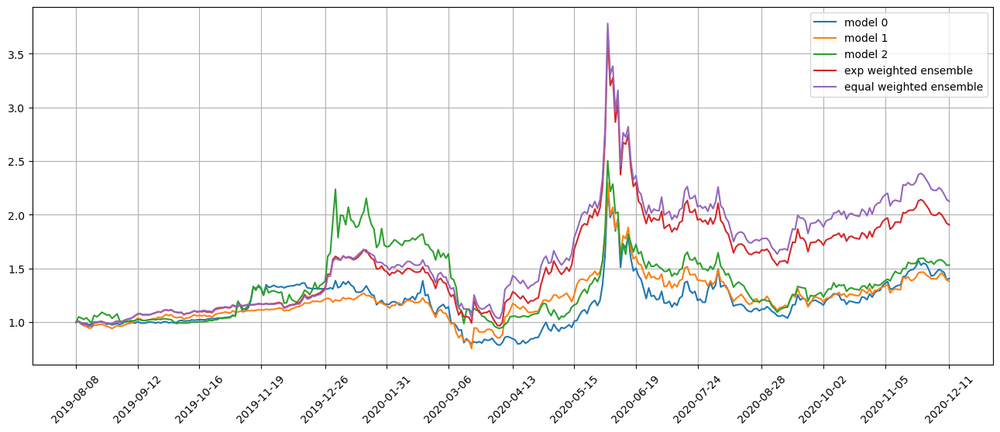

Standardization data are from 2019-05-13 to 2020-02-26
Training data are from 2020-02-27 to 2020-12-09
Testing data are from 2020-11-12 to 2021-01-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 18 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.366434097290039
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.362951397895813
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3593374490737915
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3606973886489868
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.3678461313

Testing data from 2020-11-17 to 2020-12-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-16 are ['AGQ', 'BVN', 'HL', 'WPM', 'CASY', 'CYRX', 'SWBI', 'NEM', 'AZN', 'ENB']
position on 2020-12-17 market open will be {'AZN': 0.13728469590525516, 'SWBI': 0.1529459518402349, 'CASY': 0.13652007356700527, 'NEM': 0.1402239040749644, 'AGQ': 0.1466258484443958, 'HL': 0.14807567325730936, 'WPM': 0.13915818388842854, 'BVN': 0.14172876945489382, 'ENB': 0.13547724863643268, 'CYRX': 0.14118621039240617}
Total asset on 2020-12-17 will be 1.4192265594613234
It should be the same as 1.4192265594613263
top_stocks by model 1 to buy on 2020-12-16 are ['AZN', 'ENB', 'GSK', 'HSBC', 'SLG', 'KNDI', 'MFA', 'JETS', 'KODK', 'MRIN']
position on 2020-12-17 market open will be {'MFA': 0.14112550540989863, 'KODK': 0.12859636778380415, 'MRIN': 0.13823061745178716, 'JETS': 0.13539025379509792, 'GSK': 0.1365332629737304, 'AZN': 0.13643853623995625, 'KNDI': 0.1379688999606372, 'ENB': 0.13629583

Testing data from 2020-11-20 to 2020-12-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-21 are ['ABM', 'WAFD', 'HMC', 'TRP', 'CXW', 'HBI', 'INDB', 'DGX', 'AIV', 'MLKN']
position on 2020-12-22 market open will be {'DGX': 0.1431535790557236, 'MLKN': 0.13906884129612126, 'ABM': 0.13998396508270788, 'INDB': 0.13812715152278235, 'HMC': 0.1428447762016793, 'WAFD': 0.1382407036638594, 'AIV': 0.15565038254714975, 'CXW': 0.1398654589608144, 'HBI': 0.14420488613143662, 'TRP': 0.13894945509410841}
Total asset on 2020-12-22 will be 1.4200891995563802
It should be the same as 1.420089199556383
top_stocks by model 1 to buy on 2020-12-21 are ['ABM', 'HBI', 'DGX', 'DPST', 'KODK', 'MFA', 'JETS', 'KNDI', 'AIV', 'MRIN']
position on 2020-12-22 market open will be {'MFA': 0.140401785577226, 'KODK': 0.13166816312953616, 'MRIN': 0.14902987943375784, 'JETS': 0.1307746840152723, 'KNDI': 0.1365960763881212, 'DPST': 0.13173758675416622, 'ABM': 0.13301890249370787, 'HBI': 0.137029806

top_stocks by model 1 to buy on 2020-12-24 are ['ODFL', 'TREX', 'MMS', 'JKHY', 'DPST', 'KODK', 'MFA', 'JETS', 'KNDI', 'MRIN']
position on 2020-12-28 market open will be {'MFA': 0.14546782440593442, 'KODK': 0.12287166735484312, 'MRIN': 0.14830992329474632, 'JETS': 0.1330824689051851, 'KNDI': 0.12389744197700069, 'DPST': 0.13716615427081172, 'MMS': 0.13702820046063077, 'TREX': 0.137929285280311, 'ODFL': 0.13865692797677237, 'JKHY': 0.1394277418803866}
Total asset on 2020-12-28 will be 1.3638376358066144
It should be the same as 1.3638376358066224
top_stocks by model 2 to buy on 2020-12-24 are ['FSK', 'JETS', 'PRG', 'AMLP', 'FIS', 'ERY', 'JKHY', 'FNV', 'PGRE', 'DXCM']
position on 2020-12-28 market open will be {'FNV': 0.1513019561725992, 'DXCM': 0.147516065730828, 'FSK': 0.14867127578100264, 'FIS': 0.15468812327078071, 'PGRE': 0.14756511195762909, 'JKHY': 0.15082097610708237, 'PRG': 0.14644211491650247, 'JETS': 0.14902048016055977, 'AMLP': 0.14755186742106743, 'ERY': 0.14857649348732727}


position on 2020-12-31 market open will be {'DXCM': 0.15148425045778252, 'COLM': 0.14735120197781318, 'FNV': 0.1478523741162744, 'QSR': 0.14799855191322062, 'BJRI': 0.14688303965559998, 'SEIC': 0.14821452319996195, 'CBRL': 0.1446572110403511, 'AGO': 0.14660372700978708, 'SAVA': 0.15071313108015497, 'CAKE': 0.14431159764912557}
Total asset on 2020-12-31 will be 1.4760696081000546
It should be the same as 1.4760696081000715
top_stocks by return weighted ensemble to buy on 2020-12-30 are ['BP', 'SEIC', 'CYRX', 'DIN', 'AGO', 'QSR', 'PARR', 'DXCM', 'HMC', 'BJRI']
position on 2020-12-31 market open will be {'DXCM': 0.1909387502319837, 'CYRX': 0.19440798043821722, 'DIN': 0.1898697494059442, 'PARR': 0.19402075748260655, 'BP': 0.18462531283024103, 'HMC': 0.19013022631820298, 'QSR': 0.19018061001982636, 'BJRI': 0.18874715814549128, 'AGO': 0.18838823673254326, 'SEIC': 0.19045813672889386}
Total asset on 2020-12-31 will be 1.9017669183339345
It should be the same as 1.9017669183339507
top_stocks b

top_stocks by model 2 to buy on 2021-01-05 are ['CRI', 'ALSN', 'AWI', 'BWA', 'PBH', 'FCN', 'ZBH', 'MMS', 'CBRL', 'IFF']
position on 2021-01-06 market open will be {'CBRL': 0.14453435735275996, 'IFF': 0.1473672660438823, 'BWA': 0.14838232008871138, 'AWI': 0.15133684246288678, 'ZBH': 0.14654029030600005, 'MMS': 0.14779460059260002, 'PBH': 0.1462739796752737, 'CRI': 0.14684572542019178, 'FCN': 0.14539419151491315, 'ALSN': 0.14666764837588075}
Total asset on 2021-01-06 will be 1.471137221833083
It should be the same as 1.4711372218330996
top_stocks by return weighted ensemble to buy on 2021-01-05 are ['WSO', 'PBH', 'RHI', 'DHI', 'CRI', 'ZBH', 'MTH', 'CBRL', 'MMS', 'IFF']
position on 2021-01-06 market open will be {'CBRL': 0.18604562384931328, 'RHI': 0.18944525179258379, 'DHI': 0.17940756060284604, 'ZBH': 0.18701637957620745, 'MMS': 0.18861714458203138, 'IFF': 0.19184490565746493, 'PBH': 0.18667651093054627, 'CRI': 0.1874061793311575, 'WSO': 0.1854929688522788, 'MTH': 0.17857834500189368}
T

position on 2021-01-11 market open will be {'UVXY': 0.15770461197728078, 'FIS': 0.15183163376533504, 'FNV': 0.14737765871823047, 'VIXY': 0.1551156203144305, 'CHTR': 0.15309742023525308, 'SAP': 0.14764564684693693, 'WEN': 0.15009027602294595, 'CCOI': 0.14788453786566605, 'CBRL': 0.1491103073557912, 'ERY': 0.16032982806759935}
Total asset on 2021-01-11 will be 1.5201875411694525
It should be the same as 1.5201875411694694
top_stocks by return weighted ensemble to buy on 2021-01-08 are ['CWH', 'DEO', 'FNV', 'WEN', 'CHTR', 'ERY', 'JETS', 'CBRL', 'AZN', 'FIS']
position on 2021-01-11 market open will be {'CBRL': 0.19161225252248454, 'DEO': 0.18414823899164748, 'FIS': 0.1914515604672521, 'AZN': 0.18921839814744623, 'FNV': 0.1858353364176031, 'CHTR': 0.19304764943023253, 'CWH': 0.17960257809146207, 'WEN': 0.18925580159379235, 'JETS': 0.18387253059346106, 'ERY': 0.2021673284529739}
Total asset on 2021-01-11 will be 1.8902116747083404
It should be the same as 1.8902116747083553
top_stocks by equ

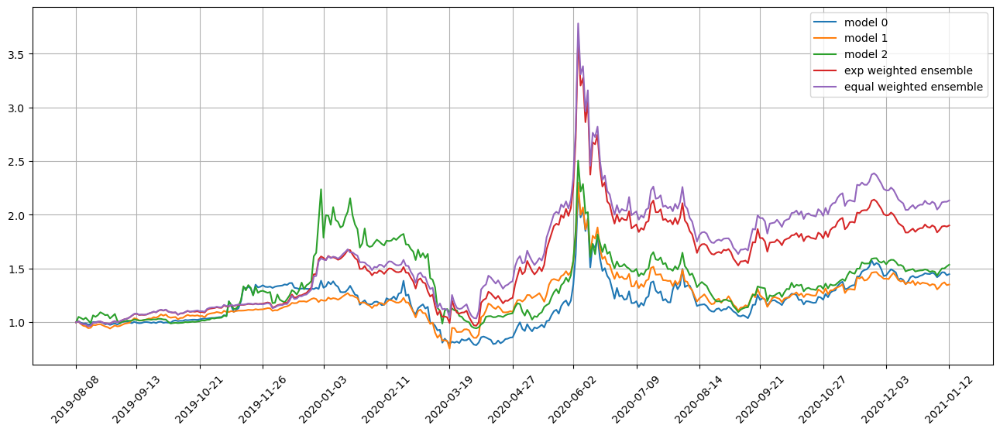

Standardization data are from 2019-06-11 to 2020-03-25
Training data are from 2020-03-26 to 2021-01-08
Testing data are from 2020-12-11 to 2021-02-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 19 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3377445936203003
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3487573862075806
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.33640718460083
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3513922691345215
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.3374649

top_stocks by model 2 to buy on 2021-01-14 are ['FCFS', 'CVBF', 'ANF', 'CLDX', 'KNDI', 'ARCT', 'MRIN', 'PACB', 'WDFC', 'KODK']
position on 2021-01-15 market open will be {'KODK': 0.15796005824677398, 'PACB': 0.16864775339902863, 'FCFS': 0.1609706231705581, 'CVBF': 0.15949995695033287, 'WDFC': 0.15395127051815338, 'MRIN': 0.15052185829951054, 'CLDX': 0.1624124781858057, 'KNDI': 0.15542503583533837, 'ARCT': 0.15341893661480044, 'ANF': 0.1571074415862286}
Total asset on 2021-01-15 will be 1.5799154128065136
It should be the same as 1.5799154128065305
top_stocks by return weighted ensemble to buy on 2021-01-14 are ['MLCO', 'YANG', 'CLDX', 'KOLD', 'PACB', 'FCFS', 'CVBF', 'ANF', 'ARCT', 'WDFC']
position on 2021-01-15 market open will be {'PACB': 0.21187859912822038, 'YANG': 0.19853976566529538, 'FCFS': 0.19497627191982214, 'CVBF': 0.19319492193676274, 'KOLD': 0.18733557252616234, 'WDFC': 0.1864740546549597, 'CLDX': 0.19672272422263767, 'MLCO': 0.1891115618185807, 'ARCT': 0.1858292632150812, 

top_stocks by model 2 to buy on 2021-01-20 are ['BLNK', 'PACB', 'MVIS', 'ARCT', 'KNDI', 'MRIN', 'KODK', 'MED', 'GME', 'APPS']
position on 2021-01-21 market open will be {'KODK': 0.17540582859124393, 'APPS': 0.17267756951357888, 'BLNK': 0.1412602188208304, 'PACB': 0.15958142404005737, 'MVIS': 0.15991887201431612, 'MRIN': 0.17943287113293746, 'MED': 0.16284959064716129, 'KNDI': 0.16309493438939507, 'ARCT': 0.16870122924932518, 'GME': 0.17226424549435837}
Total asset on 2021-01-21 will be 1.6551867838931875
It should be the same as 1.6551867838932042
top_stocks by return weighted ensemble to buy on 2021-01-20 are ['GLNG', 'INTC', 'CMC', 'TMHC', 'YANG', 'UNG', 'ARCT', 'MED', 'APPS', 'GME']
position on 2021-01-21 market open will be {'ARCT': 0.2049955064282186, 'APPS': 0.21118019805885327, 'CMC': 0.1944320422231273, 'YANG': 0.19459091482668042, 'INTC': 0.198685591295399, 'GLNG': 0.19276715176429185, 'UNG': 0.19577825188655756, 'TMHC': 0.21976166442449652, 'MED': 0.1945038217052234, 'GME': 0

position on 2021-01-26 market open will be {'ARCT': 0.20520383429497963, 'ZION': 0.2219178091279492, 'FATE': 0.2181542447114648, 'CLDX': 0.23148414600270165, 'TSLA': 0.2298111776760912, 'MED': 0.23275564753337072, 'PRGS': 0.22339311343254759, 'AUB': 0.2292394738342351, 'PLUG': 0.22431187649715098, 'ONB': 0.22166605951941795}
Total asset on 2021-01-26 will be 2.2379373826298936
It should be the same as 2.2379373826299087
top_stocks by equal weighted ensemble to buy on 2021-01-25 are ['AUB', 'ZION', 'ONB', 'TSLA', 'PRGS', 'FATE', 'MED', 'ARCT', 'CLDX', 'PLUG']
position on 2021-01-26 market open will be {'ARCT': 0.2303548493092414, 'ZION': 0.2518185490163912, 'FATE': 0.2475478898285908, 'CLDX': 0.26267383404587363, 'TSLA': 0.26077545347780245, 'MED': 0.2641166550244306, 'PRGS': 0.2534926327269392, 'AUB': 0.26012671946006394, 'PLUG': 0.2545351879987646, 'ONB': 0.25153287919392453}
Total asset on 2021-01-26 will be 2.536974650082001
It should be the same as 2.5369746500820227
Testing data f

position on 2021-01-29 market open will be {'LABU': 0.21839951953031014, 'NTLA': 0.23004391083062617, 'ROKU': 0.214566604024321, 'MVIS': 0.20214619311813098, 'TWLO': 0.22919265207994452, 'APPS': 0.22091550473663385, 'SFIX': 0.20942764589525328, 'DQ': 0.20524806843893798, 'ACMR': 0.22090502772665555, 'PACB': 0.2402243579785089}
Total asset on 2021-01-29 will be 2.191069484359307
It should be the same as 2.191069484359322
top_stocks by equal weighted ensemble to buy on 2021-01-28 are ['ROKU', 'BLNK', 'MVIS', 'ACMR', 'SFIX', 'NTLA', 'LABU', 'TWLO', 'PACB', 'APPS']
position on 2021-01-29 market open will be {'LABU': 0.24758364152014434, 'NTLA': 0.2607840405302604, 'ROKU': 0.24323854414697857, 'MVIS': 0.22915842818360863, 'TWLO': 0.25981903043397947, 'APPS': 0.2504358308506524, 'SFIX': 0.23741288129776356, 'BLNK': 0.2351325257971438, 'ACMR': 0.2504239538268922, 'PACB': 0.2723248725915982}
Total asset on 2021-01-29 will be 2.486313749179
It should be the same as 2.486313749179022
Testing dat

Testing data from 2021-01-05 to 2021-02-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-03 are ['CHRW', 'TMV', 'SNAP', 'TTD', 'SEDG', 'TTEK', 'RYAAY', 'PLUG', 'PACB', 'APPS']
position on 2021-02-04 market open will be {'APPS': 0.1678214915200584, 'CHRW': 0.1216667800673354, 'SEDG': 0.11981642052228571, 'TTEK': 0.11490517871807776, 'TTD': 0.12070746686875823, 'TMV': 0.12354497716860444, 'RYAAY': 0.12163327720556961, 'PLUG': 0.12484752461817719, 'SNAP': 0.1201275346052579, 'PACB': 0.11639459707318214}
Total asset on 2021-02-04 will be 1.2514652483673017
It should be the same as 1.2514652483673068
top_stocks by model 1 to buy on 2021-02-03 are ['KODK', 'FCEL', 'SEDG', 'MVIS', 'CELH', 'RIOT', 'BLNK', 'APPS', 'PACB', 'PLUG']
position on 2021-02-04 market open will be {'BLNK': 0.13591189015147712, 'KODK': 0.27787250864956864, 'APPS': 0.27034171313071215, 'SEDG': 0.18632542731614157, 'MVIS': 0.21311282503175544, 'FCEL': 0.20113328162543634, 'RIOT': 0.198755828497

position on 2021-02-08 market open will be {'LABU': 0.21097018050603764, 'TTD': 0.19431399100697924, 'TQQQ': 0.19740637372161812, 'APPS': 0.22803462358188276, 'TWLO': 0.19562771126019826, 'TECL': 0.19351200905542199, 'RH': 0.19364113263169563, 'PLUG': 0.18602597004709237, 'SNAP': 0.218087853304951, 'PACB': 0.20455843361375278}
Total asset on 2021-02-08 will be 2.022178278729606
It should be the same as 2.02217827872963
Testing data from 2021-01-08 to 2021-02-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-08 are ['TSLA', 'EDU', 'CBOE', 'HRB', 'EXPRQ', 'VRNT', 'SAVA', 'IRBT', 'FIZZ', 'GME']
position on 2021-02-09 market open will be {'EDU': 0.12271513705238918, 'CBOE': 0.12345515819405593, 'IRBT': 0.12526991000209795, 'FIZZ': 0.12664523527470198, 'HRB': 0.12198429549486965, 'TSLA': 0.11938032104958292, 'EXPRQ': 0.11632014716886929, 'VRNT': 0.11968390995034851, 'SAVA': 0.13464548637338114, 'GME': 0.09491935238838918}
Total asset on 2021-02-09 will be 1.20501

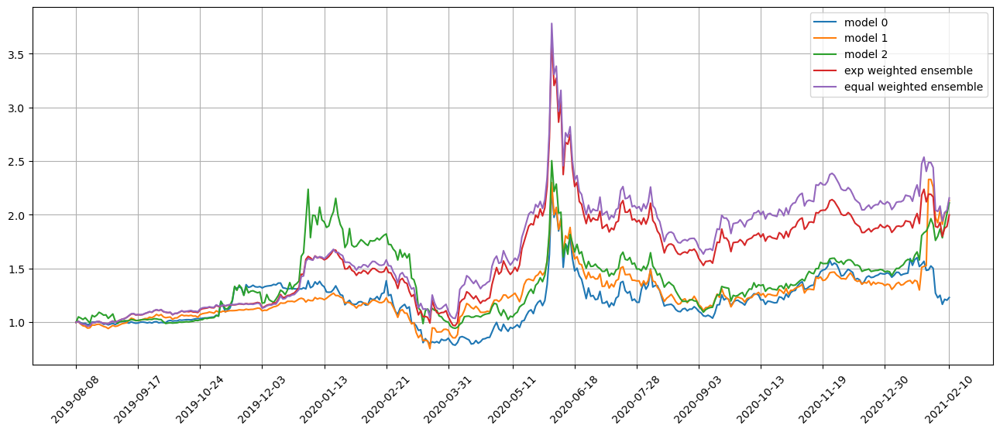

Standardization data are from 2019-07-10 to 2020-04-23
Training data are from 2020-04-24 to 2021-02-08
Testing data are from 2021-01-12 to 2021-03-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 20 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3438308238983154
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3715981245040894
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.334398627281189
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3719403743743896
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.32629919

Testing data from 2021-01-15 to 2021-02-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-16 are ['IGT', 'SANM', 'IP', 'BRO', 'IT', 'HUBG', 'CBOE', 'WAFD', 'TDC', 'PLUG']
position on 2021-02-17 market open will be {'CBOE': 0.13555509519447198, 'IP': 0.12349159547649871, 'IGT': 0.1213367825890538, 'BRO': 0.12428112105718145, 'SANM': 0.12628211581740847, 'TDC': 0.11981767140300574, 'WAFD': 0.1260126254920692, 'PLUG': 0.11037537080556105, 'HUBG': 0.12220046766018942, 'IT': 0.12278667709371847}
Total asset on 2021-02-17 will be 1.2321395225891538
It should be the same as 1.232139522589158
top_stocks by model 1 to buy on 2021-02-16 are ['DQ', 'CHRW', 'BRO', 'FWRD', 'WAFD', 'HUBG', 'IT', 'CBOE', 'FCEL', 'PLUG']
position on 2021-02-17 market open will be {'FCEL': 0.18657302517032406, 'DQ': 0.2095290173282726, 'CHRW': 0.20706304908762946, 'BRO': 0.21174310584305636, 'FWRD': 0.21740419355870166, 'CBOE': 0.22830248543651444, 'WAFD': 0.21469314462372904, 'PLUG': 0.1880

top_stocks by model 0 to buy on 2021-02-19 are ['MNRO', 'LITE', 'WCC', 'SKX', 'UNG', 'TSLA', 'ENPH', 'CELH', 'KAR', 'BRKR']
position on 2021-02-22 market open will be {'LITE': 0.11843868024798788, 'BRKR': 0.12263736651616156, 'WCC': 0.12380453179370529, 'KAR': 0.12076981121094027, 'SKX': 0.12091864699328246, 'UNG': 0.1179547521936801, 'TSLA': 0.11712011024107513, 'CELH': 0.12305313951164482, 'MNRO': 0.1212515204276236, 'ENPH': 0.12063137488821798}
Total asset on 2021-02-22 will be 1.2065799340243144
It should be the same as 1.206579934024319
top_stocks by model 1 to buy on 2021-02-19 are ['PACB', 'LABU', 'WCC', 'SATS', 'FCEL', 'DQ', 'ENPH', 'TSLA', 'BRKR', 'CELH']
position on 2021-02-22 market open will be {'LABU': 0.2044845241228889, 'SATS': 0.19759777126176725, 'BRKR': 0.20299515744479935, 'WCC': 0.2049271045014729, 'ENPH': 0.19967474542099994, 'FCEL': 0.19935360573972533, 'DQ': 0.1810237835097365, 'TSLA': 0.19386273444811927, 'CELH': 0.20368336453108163, 'PACB': 0.19186157162269543}

Testing data from 2021-01-26 to 2021-02-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-24 are ['SPDN', 'VIXY', 'SIRI', 'UVXY', 'FIZZ', 'NOK', 'TSLA', 'CENN', 'IRBT', 'GME']
position on 2021-02-25 market open will be {'UVXY': 0.09881734895743804, 'VIXY': 0.1022106909744733, 'SPDN': 0.10950745534605476, 'IRBT': 0.11397064934291078, 'FIZZ': 0.1227676107955549, 'NOK': 0.11940017389975445, 'SIRI': 0.11218934725193949, 'TSLA': 0.11291460046497723, 'CENN': 0.1273990597639382, 'GME': 0.41988284240055385}
Total asset on 2021-02-25 will be 1.4390597791975908
It should be the same as 1.439059779197595
top_stocks by model 1 to buy on 2021-02-24 are ['PBI', 'PACB', 'BGS', 'SFIX', 'DQ', 'APPN', 'FIZZ', 'TSLA', 'IRBT', 'GME']
position on 2021-02-25 market open will be {'APPN': 0.18467954413554458, 'IRBT': 0.1869019858032751, 'FIZZ': 0.20132824005393865, 'PBI': 0.19218916573301714, 'GME': 0.6885714655645115, 'TSLA': 0.18517015718310784, 'DQ': 0.19522245714197012, 'SFIX':

Testing data from 2021-01-29 to 2021-02-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-01 are ['SE', 'VSH', 'NOK', 'NTNX', 'BABA', 'FIS', 'QYLD', 'FXI', 'YINN', 'MARA']
position on 2021-03-02 market open will be {'MARA': 0.19834632045158043, 'SE': 0.14978462612384613, 'FIS': 0.13755417665452616, 'QYLD': 0.14094393146992926, 'BABA': 0.13780132684128615, 'FXI': 0.13882676205580707, 'YINN': 0.13830212570358902, 'NOK': 0.1405000857426377, 'NTNX': 0.1380198363219961, 'VSH': 0.13763233104030814}
Total asset on 2021-03-02 will be 1.4577115224055017
It should be the same as 1.4577115224055062
top_stocks by model 1 to buy on 2021-03-01 are ['MCHI', 'JD', 'SONY', 'GOOG', 'ROCK', 'WCC', 'FXI', 'BABA', 'YINN', 'SE']
position on 2021-03-02 market open will be {'WCC': 0.23334795598602667, 'SE': 0.24231036667234307, 'SONY': 0.22472004874159104, 'GOOG': 0.22718693469928083, 'FXI': 0.22458355365431787, 'BABA': 0.2229246812502578, 'MCHI': 0.22513583575498838, 'YINN': 0.223

top_stocks by model 0 to buy on 2021-03-04 are ['AVXL', 'XRT', 'ROKU', 'RH', 'SAVA', 'MARA', 'FCEL', 'TSLA', 'APPS', 'PLUG']
position on 2021-03-05 market open will be {'MARA': 0.11902331639353533, 'APPS': 0.1294705170000157, 'XRT': 0.1403761134828177, 'FCEL': 0.13116665301696626, 'TSLA': 0.1351758977537588, 'RH': 0.1414222408469758, 'SAVA': 0.1333754478841644, 'AVXL': 0.13408433582203896, 'PLUG': 0.13756397378759214, 'ROKU': 0.13869564259067507}
Total asset on 2021-03-05 will be 1.340354138578535
It should be the same as 1.3403541385785402
top_stocks by model 1 to buy on 2021-03-04 are ['M', 'ROKU', 'PACB', 'RH', 'LABU', 'FCEL', 'SAVA', 'TSLA', 'APPS', 'PLUG']
position on 2021-03-05 market open will be {'M': 0.21313823221109876, 'LABU': 0.2067075824539231, 'APPS': 0.19894203995175208, 'FCEL': 0.2015482916843202, 'TSLA': 0.20770882417530606, 'RH': 0.2173068412837338, 'SAVA': 0.20494228567536377, 'PLUG': 0.21137829834393582, 'ROKU': 0.213117200029445, 'PACB': 0.21603574189056454}
Total 

Testing data from 2021-02-08 to 2021-03-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-09 are ['YINN', 'VRRM', 'BABA', 'FCEL', 'EWZ', 'PLUG', 'MED', 'APPS', 'GME', 'MARA']
position on 2021-03-10 market open will be {'MARA': 0.14473822921813112, 'FCEL': 0.18097318347033678, 'PLUG': 0.16131706048442132, 'EWZ': 0.14878633659134535, 'BABA': 0.149540033394325, 'APPS': 0.16216821958513444, 'YINN': 0.15092292107100316, 'MED': 0.147735641625542, 'VRRM': 0.14141250770527494, 'GME': 0.17921387214443107}
Total asset on 2021-03-10 will be 1.5668080052899398
It should be the same as 1.5668080052899453
top_stocks by model 1 to buy on 2021-03-09 are ['SBS', 'ALT', 'RGLD', 'TSLA', 'YINN', 'MARA', 'PLUG', 'APPS', 'RIOT', 'GME']
position on 2021-03-10 market open will be {'TSLA': 0.2521636067276205, 'PLUG': 0.24519584973503306, 'MARA': 0.2723582902153415, 'RGLD': 0.22105288305907198, 'ALT': 0.2421941005022362, 'APPS': 0.24787194104444266, 'YINN': 0.23068365361394158, 'RIOT

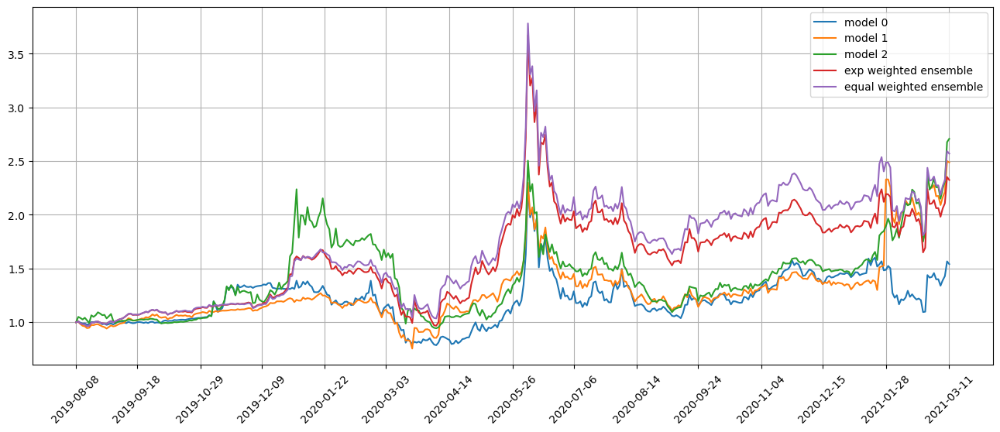

Standardization data are from 2019-08-07 to 2020-05-21
Training data are from 2020-05-22 to 2021-03-09
Testing data are from 2021-02-10 to 2021-04-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 21 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.350172758102417
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3265236616134644
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3427141904830933
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3194936513900757
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.337125182

position on 2021-03-16 market open will be {'KODK': 0.2387630992696007, 'RIOT': 0.24819987630128498, 'BLNK': 0.24248329936578714, 'GEVO': 0.25628420226113724, 'MARA': 0.26241491880719225, 'KNDI': 0.24517029237071714, 'GME': 0.17629182008747618, 'TSLA': 0.24403039887957917, 'DQ': 0.23870350135707674, 'MVIS': 0.2294118232280528}
Total asset on 2021-03-16 will be 2.381753231927887
It should be the same as 2.381753231927904
top_stocks by equal weighted ensemble to buy on 2021-03-15 are ['KNDI', 'GME', 'MARA', 'BLNK', 'MVIS', 'RIOT', 'DQ', 'TSLA', 'GEVO', 'KODK']
position on 2021-03-16 market open will be {'MARA': 0.27434415751367025, 'KODK': 0.26404951777099317, 'RIOT': 0.2744857050719253, 'BLNK': 0.2681637089689406, 'GEVO': 0.2834262087667284, 'KNDI': 0.2742174490234754, 'GME': 0.19645807840864096, 'TSLA': 0.2719453643021415, 'DQ': 0.26600911581011677, 'MVIS': 0.2556545501274103}
Total asset on 2021-03-16 will be 2.628753855764018
It should be the same as 2.6287538557640424
Testing data f

position on 2021-03-19 market open will be {'KODK': 0.20084044471811624, 'BLNK': 0.22002967500404338, 'GEVO': 0.22279849801755766, 'MARA': 0.2421986900683806, 'WKHS': 0.20445362691948424, 'MSTR': 0.2261296323716486, 'KNDI': 0.21503099865745873, 'GME': 0.1903564432268385, 'CLDX': 0.2190973556095347, 'RIOT': 0.2121604884602134}
Total asset on 2021-03-19 will be 2.15309585305326
It should be the same as 2.1530958530532764
top_stocks by equal weighted ensemble to buy on 2021-03-18 are ['CLDX', 'MSTR', 'RIOT', 'WKHS', 'KNDI', 'GME', 'BLNK', 'MARA', 'GEVO', 'KODK']
position on 2021-03-19 market open will be {'KODK': 0.2221106307421869, 'BLNK': 0.2433321135378776, 'GEVO': 0.24639417121658996, 'MARA': 0.2670635924258188, 'WKHS': 0.22544349878271258, 'MSTR': 0.24934483319481138, 'KNDI': 0.23710677777885103, 'GME': 0.20989905253082863, 'CLDX': 0.24159060011249164, 'RIOT': 0.23394157170298477}
Total asset on 2021-03-19 will be 2.376226842025129
It should be the same as 2.376226842025153
Testing d

position on 2021-03-24 market open will be {'KODK': 0.20458280364723053, 'BLNK': 0.23458463690323608, 'GEVO': 0.24441919825219888, 'MOG-A': 0.22177615919910595, 'LGF-A': 0.2059425723745902, 'BRK-B': 0.2186400762928253, 'APPS': 0.2151369580180966, 'RIOT': 0.21701387471001307, 'PLUG': 0.21238614722384916, 'PACB': 0.2097832226048106}
Total asset on 2021-03-24 will be 2.1842656492259405
It should be the same as 2.184265649225956
top_stocks by equal weighted ensemble to buy on 2021-03-23 are ['BLNK', 'PACB', 'GEVO', 'RIOT', 'KODK', 'BRK-B', 'MOG-A', 'APPS', 'PLUG', 'LGF-A']
position on 2021-03-24 market open will be {'KODK': 0.2262493275239823, 'BLNK': 0.2594285316293407, 'GEVO': 0.27030463094965756, 'RIOT': 0.20837398385914518, 'MOG-A': 0.2453175244565075, 'LGF-A': 0.22780321481617247, 'BRK-B': 0.241848548810805, 'APPS': 0.23797357728032925, 'PLUG': 0.23493077007900523, 'PACB': 0.23205154705433303}
Total asset on 2021-03-24 will be 2.3842816564592524
It should be the same as 2.384281656459

position on 2021-03-29 market open will be {'KODK': 0.20433330670706623, 'BLNK': 0.21378747334474657, 'GEVO': 0.2230621709199241, 'RIOT': 0.20563620670625113, 'WKHS': 0.19430721512884913, 'GME': 0.24478043587275192, 'PLUG': 0.17775474756680418, 'PACB': 0.18033771233219548, 'APPS': 0.17943713967948882, 'MVIS': 0.1731261225529812}
Total asset on 2021-03-29 will be 1.9965625308110426
It should be the same as 1.9965625308110588
top_stocks by equal weighted ensemble to buy on 2021-03-26 are ['MSTR', 'WKHS', 'PACB', 'BLNK', 'MVIS', 'PLUG', 'GEVO', 'RIOT', 'KODK', 'APPS']
position on 2021-03-29 market open will be {'KODK': 0.2259734073883447, 'BLNK': 0.2364288259569709, 'GEVO': 0.24668576863232178, 'RIOT': 0.19744929062403002, 'WKHS': 0.21493277352978646, 'APPS': 0.2060688594783401, 'PACB': 0.20109148041519476, 'PLUG': 0.19821126084372748, 'MSTR': 0.21276332162487835, 'MVIS': 0.19304996072364}
Total asset on 2021-03-29 will be 2.1326549492172084
It should be the same as 2.1326549492172346
Tes

position on 2021-04-01 market open will be {'KODK': 0.1995929838106324, 'BLNK': 0.2682011293150164, 'GEVO': 0.26551252753687526, 'RIOT': 0.21857081506563983, 'GME': 0.26185751164457777, 'APPS': 0.19915900860629693, 'CLDX': 0.18740648423578363, 'CELH': 0.18828728741368372, 'PLUG': 0.18363892125228135, 'PACB': 0.20220734549506666}
Total asset on 2021-04-01 will be 2.1744340143758385
It should be the same as 2.174434014375854
top_stocks by equal weighted ensemble to buy on 2021-03-31 are ['PACB', 'CELH', 'RIOT', 'CLDX', 'APPS', 'BLNK', 'GEVO', 'KODK', 'PLUG', 'GME']
position on 2021-04-01 market open will be {'KODK': 0.22073105637719115, 'BLNK': 0.2966052085850205, 'GEVO': 0.29363186804300134, 'RIOT': 0.20986893834058806, 'GME': 0.21353083487053653, 'APPS': 0.23038467015354455, 'CLDX': 0.2167894957774526, 'CELH': 0.21780839796536142, 'PLUG': 0.2124312256629797, 'PACB': 0.23391094844520047}
Total asset on 2021-04-01 will be 2.3456926442208483
It should be the same as 2.3456926442208763
Tes

position on 2021-04-07 market open will be {'KODK': 0.20732722240236304, 'BLNK': 0.25882261032990517, 'GEVO': 0.23360883556226233, 'APPS': 0.19838179337514794, 'PLUG': 0.19382310279465936, 'KNDI': 0.19789852475604902, 'MVIS': 0.20222062417204648, 'DQ': 0.20763687506204337, 'SE': 0.21540027178686255, 'MARA': 0.1823623708978377}
Total asset on 2021-04-07 will be 2.097482231139162
It should be the same as 2.097482231139177
top_stocks by equal weighted ensemble to buy on 2021-04-06 are ['SE', 'RIOT', 'KNDI', 'MARA', 'APPS', 'PLUG', 'DQ', 'BLNK', 'GEVO', 'KODK']
position on 2021-04-07 market open will be {'KODK': 0.22928439638961196, 'BLNK': 0.28623344920092697, 'GEVO': 0.2583493871789937, 'APPS': 0.22948559721720282, 'KNDI': 0.21090285765700226, 'PLUG': 0.19375972432739283, 'RIOT': 0.20173730759173075, 'DQ': 0.22100896113321564, 'SE': 0.2292723307514716, 'MARA': 0.19410674587487523}
Total asset on 2021-04-07 will be 2.254140757322396
It should be the same as 2.2541407573224235
Testing data

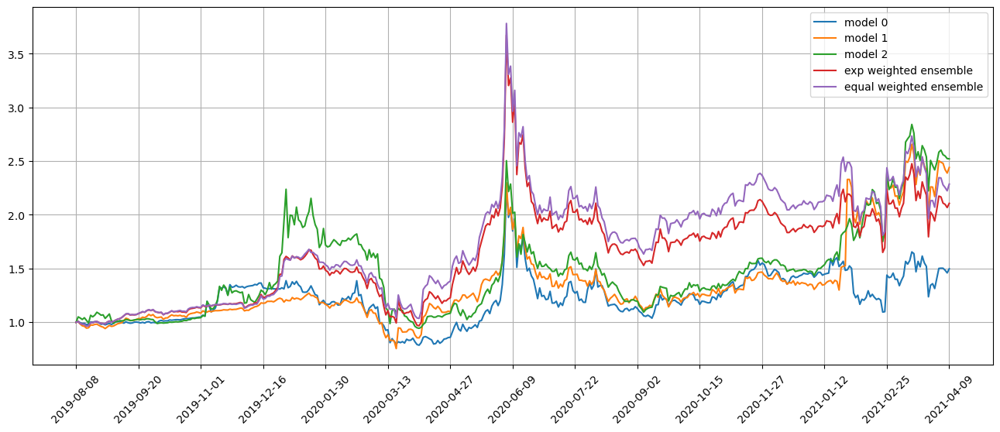

Standardization data are from 2019-09-05 to 2020-06-19
Training data are from 2020-06-22 to 2021-04-07
Testing data are from 2021-03-11 to 2021-05-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 22 out of 67 iterations
Restoring model weights from the end of the best epoch: 71.
Epoch 91: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 46.
Epoch 66: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3327436447143555
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2256039381027222
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 1.349265217781067
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2190452814102173
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.344122

position on 2021-04-14 market open will be {'MARA': 0.2519104558244973, 'APPS': 0.2613241063414976, 'RIOT': 0.3036335603662808, 'PLUG': 0.23629270618757275, 'BLNK': 0.2312119477965614, 'GME': 0.22979565341112537, 'PRG': 0.24937133748133372, 'MSTR': 0.29509200075155595, 'LGF-A': 0.24099295376763274, 'COLB': 0.24458499337942588}
Total asset on 2021-04-14 will be 2.5442097153074617
It should be the same as 2.5442097153074834
top_stocks by return weighted ensemble to buy on 2021-04-13 are ['CUBI', 'DPST', 'MUFG', 'ABCB', 'TCOM', 'COLB', 'RIOT', 'LGF-A', 'PRG', 'GME']
position on 2021-04-14 market open will be {'RIOT': 0.24649322788282665, 'GME': 0.1932798240438477, 'DPST': 0.20502708909544082, 'ABCB': 0.20629451884790795, 'LGF-A': 0.20767408138777682, 'CUBI': 0.20222301310626695, 'MUFG': 0.21424075243925847, 'PRG': 0.21489409804824258, 'TCOM': 0.21749239951782054, 'COLB': 0.21076949772682432}
Total asset on 2021-04-14 will be 2.1183885020961983
It should be the same as 2.118388502096213
to

position on 2021-04-19 market open will be {'MARA': 0.17311429428532615, 'APPS': 0.21858238501691674, 'RIOT': 0.201516744561855, 'PLUG': 0.2090462349797672, 'BLNK': 0.20354908202220914, 'GME': 0.2749800929393165, 'MSTR': 0.21773660992855404, 'MVIS': 0.2212118287651628, 'VUZI': 0.24460010056067882, 'HIG': 0.24877599272983314}
Total asset on 2021-04-19 will be 2.2131133657895985
It should be the same as 2.2131133657896194
top_stocks by return weighted ensemble to buy on 2021-04-16 are ['ARKQ', 'IONS', 'PLUG', 'MSTR', 'VUZI', 'MVIS', 'HIG', 'RIOT', 'APPS', 'GME']
position on 2021-04-19 market open will be {'RIOT': 0.16359361850373028, 'GME': 0.23128420050567786, 'APPS': 0.18296033833359485, 'MVIS': 0.18726050894801738, 'PLUG': 0.1998331973354838, 'VUZI': 0.20625638079774095, 'IONS': 0.21148652353626363, 'ARKQ': 0.20943868908225788, 'HIG': 0.20977765655943154, 'MSTR': 0.19575602509554113}
Total asset on 2021-04-19 will be 1.9976471386977235
It should be the same as 1.9976471386977392
top_s

position on 2021-04-22 market open will be {'RIOT': 0.16452613604652294, 'ARKQ': 0.210688920002391, 'RYAAY': 0.20069418332821462, 'HDB': 0.20898437821485322, 'GME': 0.1948070851625881, 'WAL': 0.2066859661893668, 'URI': 0.2055912070574395, 'APPS': 0.21532903640571704, 'MVIS': 0.2702865379731439, 'BLNK': 0.21869139026543932}
Total asset on 2021-04-22 will be 2.0962848406456613
It should be the same as 2.0962848406456764
top_stocks by equal weighted ensemble to buy on 2021-04-21 are ['ABCB', 'HDB', 'BLNK', 'URI', 'ARKQ', 'MVIS', 'RYAAY', 'APPS', 'RIOT', 'GME']
position on 2021-04-22 market open will be {'RIOT': 0.1787665119759959, 'ARKQ': 0.22943440638414125, 'RYAAY': 0.21946797885200797, 'HDB': 0.22853367415960107, 'GME': 0.21303017624962547, 'ABCB': 0.22098638265444787, 'URI': 0.2216734454136215, 'APPS': 0.2321730101244774, 'MVIS': 0.2914295264810955, 'BLNK': 0.23579838192637645}
Total asset on 2021-04-22 will be 2.271293494221362
It should be the same as 2.27129349422139
Testing data f

Testing data from 2021-03-29 to 2021-04-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-04-27 are ['CNI', 'ARKK', 'DBI', 'NAIL', 'RIOT', 'ARKQ', 'PACB', 'MVIS', 'APPS', 'GME']
position on 2021-04-28 market open will be {'APPS': 0.14738647487435297, 'MVIS': 0.1581640463714499, 'PACB': 0.14511114930359728, 'CNI': 0.14272127373403698, 'NAIL': 0.14639776190961426, 'DBI': 0.15116519652197502, 'ARKQ': 0.1439565139044504, 'ARKK': 0.1425165323517771, 'RIOT': 0.14003217321985115, 'GME': 0.13610040090260384}
Total asset on 2021-04-28 will be 1.4535515230937015
It should be the same as 1.453551523093709
top_stocks by model 1 to buy on 2021-04-27 are ['SYNA', 'ODP', 'EWBC', 'INTC', 'CNI', 'OLED', 'XBI', 'ARKK', 'ARKQ', 'GME']
position on 2021-04-28 market open will be {'ARKQ': 0.24765354583501303, 'ARKK': 0.25789736733365903, 'XBI': 0.2629694060050905, 'ODP': 0.2718125602147072, 'CNI': 0.2648340204729664, 'INTC': 0.26456706416370196, 'EWBC': 0.27212670658865484, 'OLED': 

Testing data from 2021-04-01 to 2021-04-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-04-30 are ['TS', 'APPS', 'ARKQ', 'LRN', 'NYCB', 'CRS', 'SNDR', 'MLKN', 'MVIS', 'BLNK']
position on 2021-05-03 market open will be {'ARKQ': 0.14120434624437941, 'SNDR': 0.14743638028917594, 'BLNK': 0.14570285294453195, 'LRN': 0.14493761619027015, 'MLKN': 0.14288334185303456, 'TS': 0.14484196589493556, 'NYCB': 0.14265855447487544, 'APPS': 0.1476017256555949, 'MVIS': 0.15165601857614505, 'CRS': 0.1415740573834157}
Total asset on 2021-05-03 will be 1.4504968595063512
It should be the same as 1.4504968595063585
top_stocks by model 1 to buy on 2021-04-30 are ['MVIS', 'PRG', 'AZPN', 'WBS', 'TSLA', 'FORM', 'ARKK', 'SNDR', 'ARKQ', 'MLKN']
position on 2021-05-03 market open will be {'ARKQ': 0.24291889325651678, 'ARKK': 0.2494791611895511, 'MVIS': 0.17516571765358022, 'AZPN': 0.2689234267365077, 'MLKN': 0.2657852797146984, 'FORM': 0.2693938290722665, 'PRG': 0.26924519453753243, 'TSLA

Testing data from 2021-04-07 to 2021-05-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-05 are ['SONY', 'ARKK', 'SABR', 'BCS', 'ARKQ', 'RIOT', 'SNDR', 'BLNK', 'TECL', 'GME']
position on 2021-05-06 market open will be {'ARKQ': 0.13507530874740847, 'BLNK': 0.13411285840515258, 'ARKK': 0.1380129178082356, 'SNDR': 0.14744186130448653, 'SONY': 0.14545657351983207, 'SABR': 0.1379498462438325, 'TECL': 0.1407059409975399, 'RIOT': 0.1380174909819772, 'BCS': 0.14650646145315077, 'GME': 0.14386311878758157}
Total asset on 2021-05-06 will be 1.4071423782491892
It should be the same as 1.4071423782491974
top_stocks by model 1 to buy on 2021-05-05 are ['PSTG', 'TQQQ', 'AAPL', 'BABA', 'BCS', 'SONY', 'CAKE', 'TECL', 'ARKK', 'ARKQ']
position on 2021-05-06 market open will be {'ARKQ': 0.23237489057465077, 'SONY': 0.25314489964785253, 'ARKK': 0.24431895067707107, 'AAPL': 0.2565928535989589, 'TQQQ': 0.25116815019668987, 'BABA': 0.2582093034808274, 'PSTG': 0.25243172565448185,

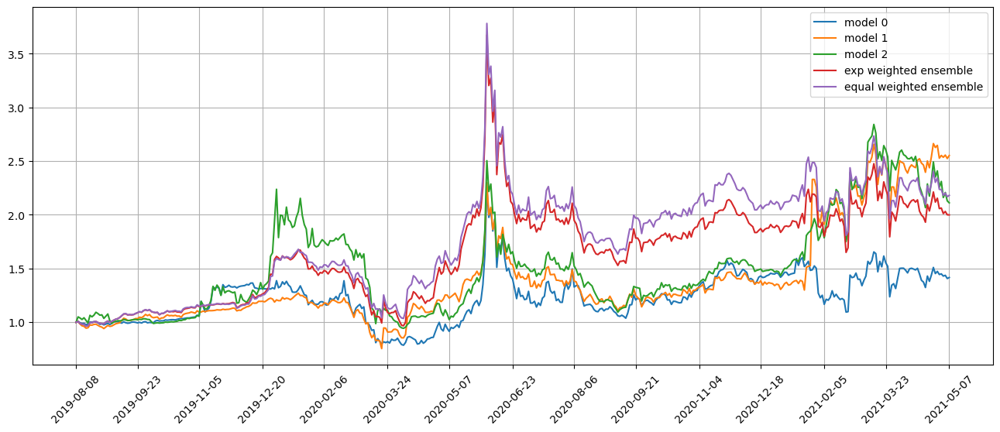

Standardization data are from 2019-10-03 to 2020-07-20
Training data are from 2020-07-21 to 2021-05-05
Testing data are from 2021-04-09 to 2021-06-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 23 out of 67 iterations
Restoring model weights from the end of the best epoch: 33.
Epoch 53: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3355399370193481
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2890748977661133
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3507648706436157
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2954055070877075
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3464117

position on 2021-05-12 market open will be {'MKTX': 0.1989844497293301, 'NVDA': 0.1880948002142979, 'CYBR': 0.19899754915401122, 'VIRT': 0.20712717091201463, 'SCO': 0.1809577016396244, 'TQQQ': 0.19092373940410245, 'RNG': 0.19614395063819903, 'RGR': 0.19633593990506282, 'TECL': 0.1910903497585327, 'ANGI': 0.20060447755061497}
Total asset on 2021-05-12 will be 1.9492601289057743
It should be the same as 1.9492601289057903
top_stocks by equal weighted ensemble to buy on 2021-05-11 are ['CYBR', 'ANGI', 'RNG', 'MKTX', 'RGR', 'TQQQ', 'VIRT', 'TECL', 'NVDA', 'SCO']
position on 2021-05-12 market open will be {'MKTX': 0.21727894883698262, 'NVDA': 0.2053881121256323, 'CYBR': 0.21707016442220287, 'VIRT': 0.22593810445062182, 'SCO': 0.19754372468288178, 'TQQQ': 0.208423218633606, 'RNG': 0.21412189827791606, 'RGR': 0.2143314846869595, 'TECL': 0.20860509997762547, 'ANGI': 0.2189912632861083}
Total asset on 2021-05-12 will be 2.1276920193805076
It should be the same as 2.1276920193805364
Testing data

position on 2021-05-17 market open will be {'TREE': 0.21645072388693365, 'MRCY': 0.19396072308707812, 'FLR': 0.20251017564287455, 'NAIL': 0.19433869776490134, 'HCC': 0.20199910445748673, 'BABA': 0.19869022676589404, 'KMPR': 0.1966628959317919, 'PAAS': 0.20363153393495387, 'BGC': 0.20096141372774112, 'GES': 0.20540950382642875}
Total asset on 2021-05-17 will be 2.0146149990260676
It should be the same as 2.014614999026084
top_stocks by equal weighted ensemble to buy on 2021-05-14 are ['PAAS', 'GES', 'BABA', 'NAIL', 'KMPR', 'HCC', 'FLR', 'BGC', 'TREE', 'MRCY']
position on 2021-05-17 market open will be {'TREE': 0.23561232502996493, 'MRCY': 0.21113136565397453, 'FLR': 0.22043767037881712, 'NAIL': 0.21154280106543982, 'HCC': 0.2198813559064851, 'BABA': 0.21627955521875364, 'KMPR': 0.21407275210509316, 'PAAS': 0.22165829847210294, 'BGC': 0.21875180216276505, 'GES': 0.22359366561914237}
Total asset on 2021-05-17 will be 2.1929615916125083
It should be the same as 2.1929615916125385
Testing d

position on 2021-05-20 market open will be {'TECL': 0.21786183326897743, 'NVDA': 0.2215500005288347, 'HRTX': 0.21607247403321192, 'TQQQ': 0.23023534370725143, 'IBB': 0.21631630857148032, 'UWM': 0.21908720697414658, 'XBI': 0.21584391773206385, 'YEXT': 0.21691362857765667, 'GWRE': 0.2225268596514253, 'TREE': 0.22836262414733152}
Total asset on 2021-05-20 will be 2.2047701971923495
It should be the same as 2.2047701971923797
Testing data from 2021-04-22 to 2021-05-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-20 are ['AIN', 'DPST', 'BCS', 'CRS', 'HXL', 'ZTO', 'UWM', 'MIDD', 'HOG', 'TECL']
position on 2021-05-21 market open will be {'TECL': 0.14295596545373032, 'UWM': 0.14417230274035228, 'MIDD': 0.1367354066452258, 'AIN': 0.14248582399107765, 'DPST': 0.1418299540744526, 'ZTO': 0.1385687074598571, 'CRS': 0.14141092238266845, 'BCS': 0.14046191412396994, 'HXL': 0.1436282907145402, 'HOG': 0.1394366670233406}
Total asset on 2021-05-21 will be 1.4116859546092069


Testing data from 2021-04-27 to 2021-05-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-25 are ['KOS', 'MNRO', 'SHOO', 'AIV', 'AYI', 'MSCI', 'VFC', 'QD', 'RL', 'ECH']
position on 2021-05-26 market open will be {'AYI': 0.1409933979510337, 'ECH': 0.1375912479596795, 'MNRO': 0.13750197675145348, 'MSCI': 0.14268221766776293, 'KOS': 0.13485002370184948, 'VFC': 0.14342739882941646, 'AIV': 0.14051953626570607, 'QD': 0.14998959331023737, 'SHOO': 0.1368747135475686, 'RL': 0.14355623156169142}
Total asset on 2021-05-26 will be 1.4079863375463897
It should be the same as 1.4079863375463988
top_stocks by model 1 to buy on 2021-05-25 are ['KSS', 'EXEL', 'AZPN', 'EDU', 'ATHM', 'IOVA', 'IONS', 'VFC', 'GDS', 'TAL']
position on 2021-05-26 market open will be {'AZPN': 0.2706812022134884, 'IOVA': 0.27926959503588794, 'ATHM': 0.2773359691685039, 'EDU': 0.28300172428525705, 'IONS': 0.27168237127015804, 'VFC': 0.2787535879479935, 'EXEL': 0.2608945260056908, 'GDS': 0.28169552426

top_stocks by model 0 to buy on 2021-05-28 are ['MNRO', 'GNW', 'ECH', 'AIN', 'UA', 'DINO', 'FAS', 'ATI', 'AYI', 'MRCY']
position on 2021-06-01 market open will be {'AYI': 0.1495700682258007, 'MNRO': 0.13827087724569084, 'GNW': 0.14503186290890563, 'MRCY': 0.1474097370850905, 'DINO': 0.15309859635775078, 'AIN': 0.15020151801713646, 'UA': 0.14617239140630517, 'FAS': 0.15031411924179466, 'ECH': 0.15458950091265636, 'ATI': 0.14996675970232082}
Total asset on 2021-06-01 will be 1.4846254311034428
It should be the same as 1.484625431103452
top_stocks by model 1 to buy on 2021-05-28 are ['ATI', 'GGB', 'XME', 'DBA', 'EDU', 'TAL', 'AGQ', 'TNA', 'UA', 'URTY']
position on 2021-06-01 market open will be {'TAL': 0.2885522600498757, 'URTY': 0.2953815273206835, 'ATI': 0.30411404437284956, 'DBA': 0.2942632184523471, 'UA': 0.2878228577667762, 'EDU': 0.31596702354007183, 'AGQ': 0.30820046822489755, 'GGB': 0.30087802106607486, 'XME': 0.2940738900608035, 'TNA': 0.2910382516030665}
Total asset on 2021-06-0

position on 2021-06-04 market open will be {'NAIL': 0.13807072290849343, 'FAS': 0.14965569567350767, 'ZION': 0.14685557673936775, 'ONB': 0.15142491818193185, 'R': 0.14979561733709915, 'PPBI': 0.14604648426394062, 'NGVT': 0.14890419969404242, 'SHOO': 0.14762013567588753, 'HWC': 0.14654858603773077, 'COLB': 0.14639049242237698}
Total asset on 2021-06-04 will be 1.4713124289343686
It should be the same as 1.471312428934378
top_stocks by model 1 to buy on 2021-06-03 are ['NAIL', 'CAKE', 'PKX', 'OII', 'DBI', 'HI', 'R', 'CMC', 'VALE', 'AMC']
position on 2021-06-04 market open will be {'NAIL': 0.2749647280718257, 'DBI': 0.2814213686371411, 'CMC': 0.2997049566730999, 'R': 0.29600904510945397, 'PKX': 0.2928731356657434, 'OII': 0.300660586608806, 'AMC': 0.24378106065808391, 'HI': 0.29267779227631757, 'VALE': 0.29405885124376996, 'CAKE': 0.2845553272675517}
Total asset on 2021-06-04 will be 2.8607068522117762
It should be the same as 2.860706852211793
top_stocks by model 2 to buy on 2021-06-03 ar

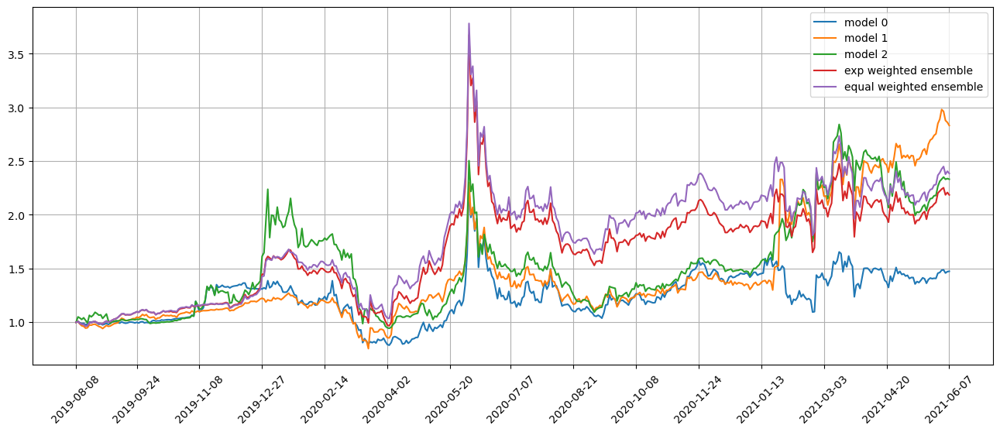

Standardization data are from 2019-10-31 to 2020-08-17
Training data are from 2020-08-18 to 2021-06-03
Testing data are from 2021-05-07 to 2021-07-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 24 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.327669382095337
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.171095609664917
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.325605869293213
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1762338876724243
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.33157408237

position on 2021-06-10 market open will be {'NAIL': 0.22996782451619147, 'ABG': 0.2405972558630235, 'GES': 0.23708177002127273, 'VTNR': 0.23866304976639932, 'EAT': 0.237318114251389, 'BJRI': 0.23801447196133715, 'KSS': 0.24255874362366583, 'PETS': 0.24215861729711324, 'SMG': 0.23858643419684408, 'CAKE': 0.2232426025231668}
Total asset on 2021-06-10 will be 2.368188884020372
It should be the same as 2.368188884020403
Testing data from 2021-05-12 to 2021-06-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-10 are ['JWN', 'KALU', 'R', 'SNDR', 'ODFL', 'M', 'PKX', 'WERN', 'MCY', 'UPS']
position on 2021-06-11 market open will be {'SNDR': 0.14226174561496427, 'MCY': 0.1500827833299183, 'M': 0.14306317258948684, 'R': 0.1450617351528293, 'WERN': 0.1442392277523161, 'JWN': 0.14478338033842236, 'PKX': 0.15283052138749936, 'ODFL': 0.1462784357820122, 'KALU': 0.14804308609755418, 'UPS': 0.1472658285800912}
Total asset on 2021-06-11 will be 1.463909916625084
It should be 

Testing data from 2021-05-17 to 2021-06-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-15 are ['OC', 'GFI', 'DBI', 'ZION', 'TEX', 'JWN', 'SNDR', 'VYX', 'EWBC', 'HL']
position on 2021-06-16 market open will be {'TEX': 0.14274058517095853, 'ZION': 0.14653085635265767, 'GFI': 0.14017328131250006, 'JWN': 0.14234121585834483, 'HL': 0.14319525957093793, 'EWBC': 0.14741207590301694, 'OC': 0.14738480445424554, 'DBI': 0.14417372549313373, 'VYX': 0.14993885740741167, 'SNDR': 0.14703444189378426}
Total asset on 2021-06-16 will be 1.4509251034169812
It should be the same as 1.4509251034169912
top_stocks by model 1 to buy on 2021-06-15 are ['IRWD', 'GEVO', 'SNDR', 'PETS', 'GRFS', 'IRTC', 'JWN', 'GFI', 'RIOT', 'GME']
position on 2021-06-16 market open will be {'RIOT': 0.3286545222438266, 'GME': 0.2773365125618018, 'GEVO': 0.2641119449655268, 'GFI': 0.27583154131795484, 'JWN': 0.28009758062057816, 'IRWD': 0.2879258061449831, 'SNDR': 0.2893328625444049, 'PETS': 0.2770499

top_stocks by model 0 to buy on 2021-06-18 are ['BAP', 'NEM', 'MTZ', 'BFH', 'PLCE', 'TEX', 'IGT', 'WCC', 'BVN', 'GME']
position on 2021-06-21 market open will be {'NEM': 0.13298044344263785, 'BVN': 0.13959532702264685, 'MTZ': 0.13404993499323203, 'PLCE': 0.13982454673333775, 'BFH': 0.14337460490176945, 'WCC': 0.14314096321332193, 'BAP': 0.14090996498513103, 'IGT': 0.14120669404178066, 'TEX': 0.14226562847339325, 'GME': 0.14105515272196611}
Total asset on 2021-06-21 will be 1.3984032605292067
It should be the same as 1.398403260529217
top_stocks by model 1 to buy on 2021-06-18 are ['PLCE', 'TEX', 'WCC', 'NEM', 'SAGE', 'CHRS', 'BAP', 'BVN', 'CARG', 'GME']
position on 2021-06-21 market open will be {'CARG': 0.28379814033201345, 'GME': 0.2755487051881616, 'PLCE': 0.2771007858303014, 'WCC': 0.2836731769748748, 'NEM': 0.28285161098590805, 'BAP': 0.2792518405453228, 'SAGE': 0.28797755108862994, 'BVN': 0.27452111065407253, 'TEX': 0.28193846050365756, 'CHRS': 0.2789991829891128}
Total asset on 

top_stocks by model 1 to buy on 2021-06-23 are ['PHYS', 'GOLD', 'FSM', 'CMP', 'RIOT', 'SSRM', 'NEM', 'AGI', 'NG', 'KGC']
position on 2021-06-24 market open will be {'NEM': 0.2820465291556483, 'NG': 0.28059807749251464, 'CMP': 0.28973053068046706, 'SSRM': 0.28299536737385894, 'AGI': 0.2768323928686609, 'KGC': 0.28275152570607676, 'PHYS': 0.28494340642451793, 'RIOT': 0.2778932591639385, 'FSM': 0.28200079226801944, 'GOLD': 0.2816005695689855}
Total asset on 2021-06-24 will be 2.8213924507026715
It should be the same as 2.8213924507026875
top_stocks by model 2 to buy on 2021-06-23 are ['BCS', 'NG', 'TNA', 'BOOT', 'WCC', 'EXTR', 'FAS', 'SAN', 'KGC', 'NEM']
position on 2021-06-24 market open will be {'NEM': 0.2358380652936644, 'NG': 0.23796874424105469, 'KGC': 0.24198687303530497, 'WCC': 0.23899810486001521, 'EXTR': 0.23804905926553036, 'FAS': 0.23920040527459524, 'BOOT': 0.24180338302271798, 'BCS': 0.23520771109827707, 'SAN': 0.2362779384085273, 'TNA': 0.24223464889830412}
Total asset on 20

position on 2021-06-29 market open will be {'NG': 0.2732080299759988, 'BWA': 0.2782905092032037, 'CLS': 0.2792103752012735, 'GNTX': 0.27935970720122694, 'QURE': 0.28217373634010096, 'NEU': 0.2737865008763846, 'SNDR': 0.2788069686579828, 'BJRI': 0.28296293163150305, 'PRG': 0.27836483669189305, 'CUK': 0.2795677211791876}
Total asset on 2021-06-29 will be 2.7857313169587394
It should be the same as 2.785731316958755
top_stocks by model 2 to buy on 2021-06-28 are ['DPST', 'CVI', 'ATI', 'MEOH', 'EXPRQ', 'FAS', 'NEU', 'RRR', 'BWA', 'GME']
position on 2021-06-29 market open will be {'GME': 0.23085015060638098, 'BWA': 0.2404035776773836, 'DPST': 0.23146576223636098, 'FAS': 0.24208740189782402, 'MEOH': 0.241224229200345, 'NEU': 0.23651275251501558, 'CVI': 0.22817691879715463, 'EXPRQ': 0.23917846873513576, 'ATI': 0.2374404463080829, 'RRR': 0.23054397004890317}
Total asset on 2021-06-29 will be 2.3578836780225596
It should be the same as 2.357883678022587
top_stocks by return weighted ensemble to

position on 2021-07-02 market open will be {'WW': 0.28232369377409994, 'SATS': 0.28286635306156666, 'NTLA': 0.3002259558246387, 'OI': 0.285308878367537, 'ATI': 0.2885464228943083, 'IAG': 0.285308878367537, 'CRS': 0.2813443251792067, 'CIB': 0.2776350466077874, 'BMA': 0.28057895662000726, 'GME': 0.27381096922012516}
Total asset on 2021-07-02 will be 2.837949479916799
It should be the same as 2.837949479916815
top_stocks by model 2 to buy on 2021-07-01 are ['AIV', 'CRS', 'BFH', 'ARCH', 'DBA', 'OI', 'WW', 'ATI', 'SATS', 'GME']
position on 2021-07-02 market open will be {'WW': 0.24088838434519363, 'GME': 0.2325921060156177, 'ARCH': 0.2471156931057886, 'BFH': 0.2454617987653726, 'SATS': 0.2390061225424609, 'DBA': 0.23736113912147797, 'OI': 0.24106991873551586, 'CRS': 0.23772009478190506, 'AIV': 0.2442985392932448, 'ATI': 0.24380546135317657}
Total asset on 2021-07-02 will be 2.409319258059725
It should be the same as 2.409319258059754
top_stocks by return weighted ensemble to buy on 2021-07-

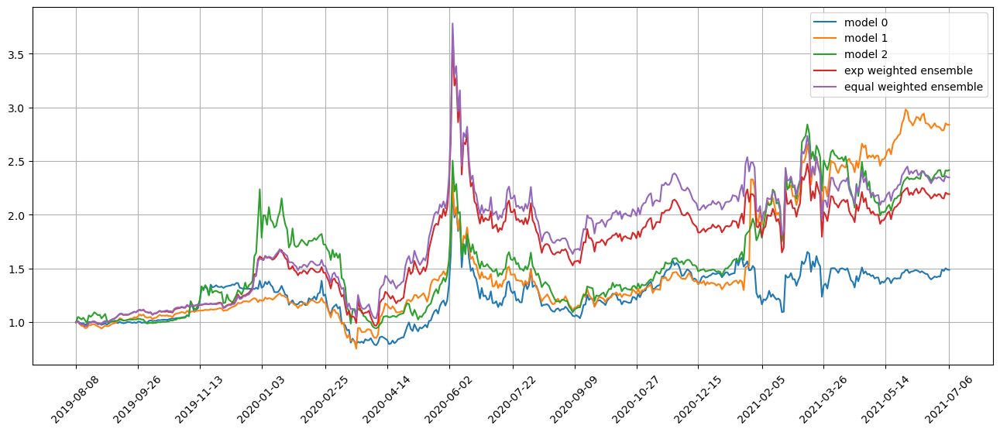

Standardization data are from 2019-11-29 to 2020-09-15
Training data are from 2020-09-16 to 2021-07-01
Testing data are from 2021-06-07 to 2021-07-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 25 out of 67 iterations
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2792224884033203
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2795218229293823
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2912955284118652
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2763170003890991
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.297505

position on 2021-07-09 market open will be {'BZUN': 0.19741282310787123, 'NOV': 0.22711926884950845, 'YPF': 0.2150631151347335, 'SATS': 0.21161174937589705, 'ITUB': 0.21669614971833623, 'TDW': 0.2266946475054786, 'CRS': 0.21930072616992632, 'CIB': 0.21907670949761182, 'BMA': 0.21297741104663512, 'GME': 0.22510020294327454}
Total asset on 2021-07-09 will be 2.1710528033492547
It should be the same as 2.171052803349273
top_stocks by equal weighted ensemble to buy on 2021-07-08 are ['ITUB', 'SATS', 'TDW', 'YPF', 'CRS', 'NOV', 'BZUN', 'CIB', 'BMA', 'GME']
position on 2021-07-09 market open will be {'BMA': 0.21930947556883143, 'BZUN': 0.21246271245630532, 'NOV': 0.2400889462452266, 'YPF': 0.22734432419790593, 'SATS': 0.22369586771799818, 'ITUB': 0.2290706134482424, 'TDW': 0.23964007684036373, 'CRS': 0.23182392459989, 'CIB': 0.23158711542438587, 'GME': 0.23795458129995825}
Total asset on 2021-07-09 will be 2.2929776377990754
It should be the same as 2.292977637799108
Testing data from 2021-0

Testing data from 2021-06-15 to 2021-07-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-07-14 are ['BBVA', 'YANG', 'TRGP', 'BZUN', 'NBR', 'PAGP', 'CLB', 'PAA', 'GLNG', 'MRIN']
position on 2021-07-15 market open will be {'MRIN': 0.10509712643218636, 'YANG': 0.14454743812266074, 'BBVA': 0.14266714806698594, 'NBR': 0.1316750934624744, 'PAGP': 0.14120084589853393, 'CLB': 0.1386718428127686, 'TRGP': 0.13636672028775118, 'GLNG': 0.13874697914673295, 'BZUN': 0.1430078769651606, 'PAA': 0.14049470356377924}
Total asset on 2021-07-15 will be 1.3624757747590217
It should be the same as 1.3624757747590341
top_stocks by model 1 to buy on 2021-07-14 are ['ACMR', 'TLH', 'CLB', 'PPBI', 'XME', 'BZUN', 'SBS', 'MRIN', 'YANG', 'GME']
position on 2021-07-15 market open will be {'GME': 0.2450345652447898, 'ACMR': 0.24328312213786277, 'YANG': 0.2760708440038539, 'TLH': 0.2787619490882521, 'CLB': 0.26484905704384887, 'PPBI': 0.2708156885474032, 'MRIN': 0.23591156211901188, 'BZUN': 0

Testing data from 2021-06-18 to 2021-07-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-07-19 are ['MRIN', 'TNK', 'INSW', 'IGT', 'KAR', 'DHT', 'YEXT', 'CARG', 'STNG', 'TREE']
position on 2021-07-20 market open will be {'MRIN': 0.07242713068841777, 'IGT': 0.12120189532064493, 'STNG': 0.1382047607434933, 'CARG': 0.13178189893627076, 'TNK': 0.13312496993434939, 'KAR': 0.1336012927075836, 'INSW': 0.12580519781733512, 'DHT': 0.13476775437227617, 'YEXT': 0.1347502945326614, 'TREE': 0.1365579400635561}
Total asset on 2021-07-20 will be 1.2622231351165765
It should be the same as 1.2622231351165887
top_stocks by model 1 to buy on 2021-07-19 are ['TNA', 'URTY', 'STNG', 'MLCO', 'INSW', 'YEXT', 'CARG', 'GKOS', 'TREE', 'ACMR']
position on 2021-07-20 market open will be {'GKOS': 0.2341663596275086, 'STNG': 0.26417993726110084, 'TREE': 0.2610320212156214, 'URTY': 0.26072740471990064, 'CARG': 0.2519025654821504, 'YEXT': 0.2575766866788583, 'MLCO': 0.2534940615927989, 'INSW'

top_stocks by model 0 to buy on 2021-07-22 are ['XOM', 'TREE', 'GNW', 'DINO', 'DK', 'ARCH', 'XOP', 'NTNX', 'MOMO', 'MRIN']
position on 2021-07-23 market open will be {'XOP': 0.12932298319445598, 'NTNX': 0.13257137672547353, 'ARCH': 0.13298257242395112, 'DINO': 0.1287633024275775, 'GNW': 0.12729648270561283, 'MRIN': 0.11112965956680684, 'DK': 0.1262140911682533, 'XOM': 0.13006373172836633, 'MOMO': 0.12589957798586124, 'TREE': 0.13274656672185178}
Total asset on 2021-07-23 will be 1.2769903446481983
It should be the same as 1.2769903446482105
top_stocks by model 1 to buy on 2021-07-22 are ['URTY', 'CTRA', 'XOP', 'SE', 'BZUN', 'MLCO', 'ARCH', 'CWEB', 'MOMO', 'MRIN']
position on 2021-07-23 market open will be {'URTY': 0.28830268438970363, 'MRIN': 0.25857867385896455, 'XOP': 0.264936522885341, 'ARCH': 0.2775108576991819, 'CWEB': 0.2392290297779118, 'SE': 0.27388617936452686, 'CTRA': 0.26452863761774864, 'BZUN': 0.2544226202493558, 'MLCO': 0.2749552666742524, 'MOMO': 0.2627299144089103}
Tota

position on 2021-07-28 market open will be {'ET': 0.12422173723960368, 'DBO': 0.1262234113766759, 'HXL': 0.12644342125684388, 'GLNG': 0.1250108553214416, 'DHT': 0.1261250276657235, 'XOM': 0.12610328936859416, 'SNN': 0.1287545031802759, 'WWD': 0.12712269090601747, 'SHOP': 0.12572401351206672, 'SU': 0.12230304953682566}
Total asset on 2021-07-28 will be 1.2580319993640563
It should be the same as 1.2580319993640685
top_stocks by model 1 to buy on 2021-07-27 are ['EC', 'GDS', 'FCG', 'SHOP', 'AXTA', 'HXL', 'IEO', 'SNN', 'GLNG', 'XOP']
position on 2021-07-28 market open will be {'AXTA': 0.2587840317484593, 'XOP': 0.2517203715185284, 'GDS': 0.2697274625380826, 'GLNG': 0.25256760974338166, 'EC': 0.2546277652715209, 'FCG': 0.250583436003637, 'SNN': 0.2601311464378189, 'HXL': 0.25546191642718125, 'SHOP': 0.2540084498937186, 'IEO': 0.2548685223409781}
Total asset on 2021-07-28 will be 2.5624807119232917
It should be the same as 2.562480711923307
top_stocks by model 2 to buy on 2021-07-27 are ['F

position on 2021-08-02 market open will be {'AEHR': 0.12995817519753378, 'FRO': 0.12862131445177083, 'PRLB': 0.1306705021188344, 'RGNX': 0.12889506782033464, 'BAP': 0.11613321488916929, 'BCO': 0.1286959679188782, 'NBIX': 0.13069013649595226, 'RDY': 0.12722581341390454, 'RGR': 0.1261319718178111, 'MRK': 0.12778454877323264}
Total asset on 2021-08-02 will be 1.2748067128974088
It should be the same as 1.2748067128974219
top_stocks by model 1 to buy on 2021-07-30 are ['JD', 'ASND', 'BZUN', 'ENTA', 'RGNX', 'CQQQ', 'MRK', 'PRLB', 'NBIX', 'RDY']
position on 2021-08-02 market open will be {'BZUN': 0.2559402165850285, 'PRLB': 0.26936453423995055, 'RGNX': 0.2657046490697374, 'CQQQ': 0.2664240669297556, 'NBIX': 0.2694050085992105, 'RDY': 0.26226364342251707, 'ASND': 0.2685168153450737, 'MRK': 0.2634154220365759, 'ENTA': 0.2644388795546117, 'JD': 0.26821738996530475}
Total asset on 2021-08-02 will be 2.653690625747751
It should be the same as 2.6536906257477657
top_stocks by model 2 to buy on 202

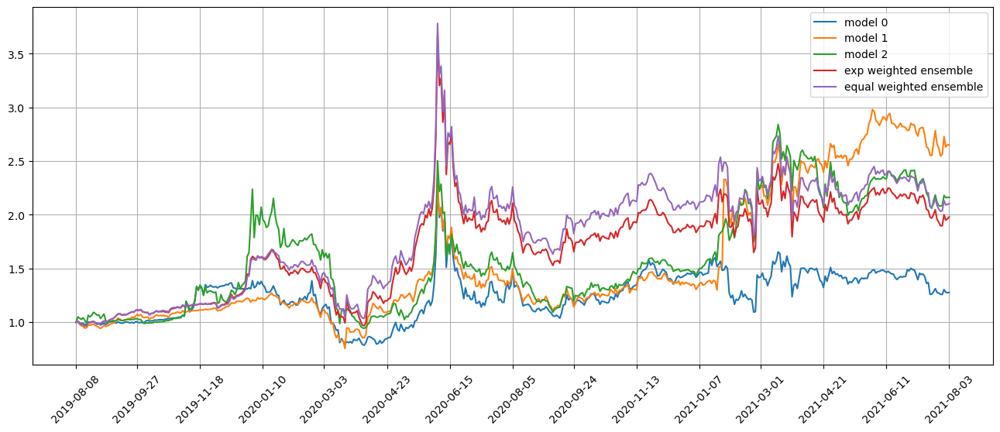

Standardization data are from 2019-12-30 to 2020-10-13
Training data are from 2020-10-14 to 2021-07-30
Testing data are from 2021-07-06 to 2021-08-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 26 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
Restoring model weights from the end of the best epoch: 48.
Epoch 68: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2561297416687012
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1957266330718994
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2572194337844849
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.203066349029541
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.251251

position on 2021-08-06 market open will be {'GDOT': 0.20236860019167424, 'TLH': 0.19446362689155305, 'UE': 0.20329317259140692, 'BAP': 0.20184022699655, 'HCC': 0.19847808888998342, 'BCO': 0.20355759553286484, 'ESRT': 0.205349004012088, 'BLV': 0.19448712784369915, 'NGVT': 0.2027147196018623, 'SGRY': 0.2033726489038254}
Total asset on 2021-08-06 will be 2.00992481145549
It should be the same as 2.009924811455507
top_stocks by equal weighted ensemble to buy on 2021-08-05 are ['NGVT', 'TLH', 'GDOT', 'BLV', 'BCO', 'SGRY', 'BAP', 'ESRT', 'HCC', 'UE']
position on 2021-08-06 market open will be {'GDOT': 0.21483638922013973, 'TLH': 0.20644439600048453, 'UE': 0.21581792388383278, 'BAP': 0.21427546331911712, 'HCC': 0.2107061862168885, 'BCO': 0.21609863773922333, 'ESRT': 0.218000413651742, 'BLV': 0.20646934482998439, 'NGVT': 0.21520383280700736, 'SGRY': 0.2159022966767085}
Total asset on 2021-08-06 will be 2.1337548843450937
It should be the same as 2.133754884345128
Testing data from 2021-07-09 t

position on 2021-08-11 market open will be {'TRUP': 0.20032242440145498, 'APPN': 0.19045053074819654, 'AMZN': 0.19529791528447069, 'ETSY': 0.20083408628109437, 'AMED': 0.18808986281507034, 'NTES': 0.196940544336383, 'BAND': 0.1932135124805822, 'HI': 0.20349173787461636, 'MTCH': 0.19520536163134894, 'BDX': 0.19644649145315737}
Total asset on 2021-08-11 will be 1.9602924673063566
It should be the same as 1.9602924673063749
top_stocks by equal weighted ensemble to buy on 2021-08-10 are ['BDX', 'NTES', 'AMZN', 'MTCH', 'HI', 'APPN', 'BAND', 'TRUP', 'ETSY', 'AMED']
position on 2021-08-11 market open will be {'TRUP': 0.2126641499593848, 'APPN': 0.20218405578853768, 'AMZN': 0.2073300843223533, 'ETSY': 0.21320733497237201, 'AMED': 0.19967794874218642, 'NTES': 0.2090739146102868, 'BAND': 0.2051172629081438, 'HI': 0.21602872263635067, 'MTCH': 0.20723182850288838, 'BDX': 0.20854942347176303}
Total asset on 2021-08-11 will be 2.081064725914232
It should be the same as 2.081064725914267
Testing data

position on 2021-08-16 market open will be {'UE': 0.20928198923974173, 'PINC': 0.2064186792244023, 'ELME': 0.2111683012324674, 'DBO': 0.200849415922571, 'RBA': 0.20701007521740966, 'AAT': 0.20844940534096948, 'EAT': 0.20760611169095905, 'WU': 0.20859707694005158, 'CIB': 0.21673441876766633, 'FHB': 0.2041493948811608}
Total asset on 2021-08-16 will be 2.0802648684573626
It should be the same as 2.0802648684573994
Testing data from 2021-07-19 to 2021-08-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-08-16 are ['DUST', 'RRC', 'MTCH', 'BLDP', 'DBO', 'BOIL', 'AMED', 'WIX', 'TRUP', 'UNG']
position on 2021-08-17 market open will be {'DBO': 0.12275658619761828, 'TRUP': 0.12013768268063113, 'AMED': 0.12859435335078093, 'DUST': 0.12933538128015326, 'UNG': 0.1243243404796681, 'RRC': 0.12615670947439148, 'WIX': 0.12340469526894213, 'MTCH': 0.12552320242269277, 'BOIL': 0.12247089048233974, 'BLDP': 0.12452070628711384}
Total asset on 2021-08-17 will be 1.2472245479243182


position on 2021-08-20 market open will be {'DBO': 0.11702417765411412, 'COMT': 0.11989105538277292, 'HSBC': 0.12313225855151246, 'BCO': 0.12486551944279405, 'CBOE': 0.1297289883870691, 'EAT': 0.12435504054437306, 'PPC': 0.12363599171081813, 'CRS': 0.12135611488157208, 'FCG': 0.12206751745593879, 'CME': 0.12560021653407435}
Total asset on 2021-08-20 will be 1.231656880545025
It should be the same as 1.231656880545039
top_stocks by model 1 to buy on 2021-08-19 are ['STNG', 'CRK', 'CARG', 'CTRA', 'DBO', 'FND', 'BAP', 'HSBC', 'FRO', 'BCO']
position on 2021-08-20 market open will be {'DBO': 0.23372970690863568, 'STNG': 0.23717184426588617, 'HSBC': 0.246143123334147, 'BAP': 0.24924195234738308, 'CARG': 0.2395161682981215, 'CRK': 0.24283525704448344, 'BCO': 0.24960793632752273, 'CTRA': 0.24158728860443165, 'FND': 0.2501546764424347, 'FRO': 0.2396721166003634}
Total asset on 2021-08-20 will be 2.429660070173394
It should be the same as 2.429660070173409
top_stocks by model 2 to buy on 2021-08

Testing data from 2021-07-27 to 2021-08-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-08-24 are ['RGLD', 'TECL', 'ASR', 'WW', 'TQQQ', 'PRO', 'PCRX', 'CPRI', 'IRBT', 'SOXL']
position on 2021-08-25 market open will be {'TQQQ': 0.12965978358804156, 'SOXL': 0.13213706357649185, 'TECL': 0.12813936974006418, 'CPRI': 0.1336238399308158, 'WW': 0.1332072725979848, 'RGLD': 0.12608490112918674, 'PCRX': 0.12808229324058173, 'IRBT': 0.13175496935005826, 'PRO': 0.1329438002025518, 'ASR': 0.13147083199281154}
Total asset on 2021-08-25 will be 1.3071041253485738
It should be the same as 1.3071041253485882
top_stocks by model 1 to buy on 2021-08-24 are ['CNNE', 'DEA', 'QLD', 'NAIL', 'FAS', 'GOOS', 'BVN', 'TQQQ', 'WW', 'CPRI']
position on 2021-08-25 market open will be {'NAIL': 0.2529626554248744, 'TQQQ': 0.2588794365587556, 'DEA': 0.25362495143353153, 'CPRI': 0.2663982309420717, 'WW': 0.2655677444017066, 'QLD': 0.2574174309505477, 'FAS': 0.2620211292276315, 'GOOS': 0.262743

top_stocks by model 0 to buy on 2021-08-27 are ['FCG', 'HSBC', 'RDFN', 'HGV', 'TRUP', 'MNRO', 'CRK', 'DBO', 'NAIL', 'WKC']
position on 2021-08-30 market open will be {'WKC': 0.13549398819407268, 'NAIL': 0.1420409381724599, 'TRUP': 0.14025607223842557, 'HSBC': 0.13638859501259493, 'CRK': 0.1478683072828906, 'DBO': 0.1359175749770634, 'FCG': 0.14148775381852377, 'HGV': 0.14346536320635472, 'MNRO': 0.13799298161883428, 'RDFN': 0.13782089662326844}
Total asset on 2021-08-30 will be 1.3987324711444737
It should be the same as 1.3987324711444882
top_stocks by model 1 to buy on 2021-08-27 are ['LAZ', 'IRBT', 'DBO', 'KEX', 'MNRO', 'CRK', 'HSBC', 'NMIH', 'NAIL', 'WKC']
position on 2021-08-30 market open will be {'WKC': 0.2791641762753704, 'LAZ': 0.27158906196374083, 'KEX': 0.2776027110321287, 'HSBC': 0.26936855456377073, 'NAIL': 0.2805319770385799, 'CRK': 0.2920410771509561, 'DBO': 0.2684382862658241, 'IRBT': 0.27149784915160113, 'MNRO': 0.2725372308086155, 'NMIH': 0.27583923500032265}
Total as

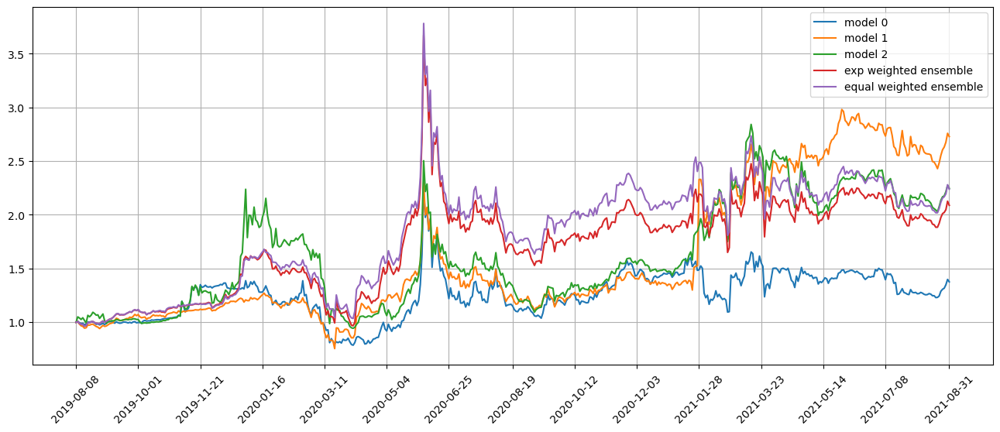

Standardization data are from 2020-01-29 to 2020-11-10
Training data are from 2020-11-11 to 2021-08-27
Testing data are from 2021-08-03 to 2021-09-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 27 out of 67 iterations
Restoring model weights from the end of the best epoch: 28.
Epoch 48: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 23.
Epoch 43: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2294464111328125
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1945714950561523
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2351447343826294
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1973797082901
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.22956931

Testing data from 2021-08-06 to 2021-09-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-09-03 are ['WOR', 'DUST', 'ABG', 'BGC', 'TGI', 'CAR', 'CVNA', 'HXL', 'FIVE', 'CACC']
position on 2021-09-07 market open will be {'CACC': 0.15917108936757535, 'DUST': 0.13619425981649227, 'TGI': 0.13884807127050705, 'CVNA': 0.14799751313642828, 'FIVE': 0.14765765880220244, 'CAR': 0.13914516498751514, 'BGC': 0.14195728295315516, 'WOR': 0.14101120719006985, 'HXL': 0.13962046826096913, 'ABG': 0.14261053750659328}
Total asset on 2021-09-07 will be 1.4342132532914926
It should be the same as 1.434213253291508
top_stocks by model 1 to buy on 2021-09-03 are ['ATI', 'CBT', 'FIVE', 'TGI', 'BGC', 'ABG', 'CACC', 'HXL', 'CVNA', 'CAR']
position on 2021-09-07 market open will be {'CVNA': 0.27517178860411223, 'CACC': 0.2838559924060413, 'HXL': 0.27072827605466654, 'TGI': 0.26923057512111315, 'FIVE': 0.2863126296000503, 'CAR': 0.2698066487501024, 'BGC': 0.27525942983859636, 'ABG': 0.276526

position on 2021-09-10 market open will be {'CBOE': 0.14211949877464042, 'ABBV': 0.13972146653324313, 'MPC': 0.14608536381520665, 'UCO': 0.14907552524065695, 'PBR-A': 0.14972524579422924, 'LNG': 0.14019861248959553, 'DUST': 0.14708491191147588, 'GGB': 0.1461369219107721, 'EBAY': 0.14255846998322227, 'ADSK': 0.14170488034844997}
Total asset on 2021-09-10 will be 1.4444108968014768
It should be the same as 1.4444108968014922
top_stocks by model 1 to buy on 2021-09-09 are ['TTD', 'LIN', 'GGB', 'WFC', 'AXS', 'FSLR', 'ADSK', 'PLCE', 'UCO', 'JKHY']
position on 2021-09-10 market open will be {'JKHY': 0.27519706180260656, 'PLCE': 0.2814649964670746, 'UCO': 0.2886937177384355, 'TTD': 0.2813184041250432, 'AXS': 0.27353281088436715, 'GGB': 0.2830029357076932, 'LIN': 0.27570697981852316, 'FSLR': 0.28898179168731153, 'ADSK': 0.27442002074742383, 'WFC': 0.28273884167481583}
Total asset on 2021-09-10 will be 2.805057560653276
It should be the same as 2.8050575606532946
top_stocks by model 2 to buy on

Testing data from 2021-08-16 to 2021-09-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-09-14 are ['VLO', 'BOH', 'UA', 'SNBR', 'UAA', 'BBVA', 'GPI', 'SLB', 'XRT', 'PARR']
position on 2021-09-15 market open will be {'UA': 0.1397093136996931, 'BBVA': 0.13924235702369664, 'BOH': 0.13822933672124985, 'PARR': 0.13977809454362602, 'SLB': 0.14022752294536484, 'VLO': 0.1384847001535474, 'GPI': 0.1413736156216232, 'XRT': 0.13948394722056148, 'SNBR': 0.13945846715320454, 'UAA': 0.13758041087166406}
Total asset on 2021-09-15 will be 1.3935677659542165
It should be the same as 1.3935677659542312
top_stocks by model 1 to buy on 2021-09-14 are ['PBR-A', 'SAN', 'VLO', 'CVNA', 'TROX', 'DINO', 'SYF', 'GPI', 'ITUB', 'SLB']
position on 2021-09-15 market open will be {'DINO': 0.27460143707052453, 'PBR-A': 0.27746518876123605, 'ITUB': 0.27471857337846134, 'SYF': 0.27492788483399627, 'SLB': 0.27761551819564295, 'VLO': 0.27416516378367717, 'GPI': 0.27988449582240793, 'CVNA': 0.2845

Testing data from 2021-08-19 to 2021-09-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-09-17 are ['AMRC', 'MGM', 'TRUP', 'TECL', 'LAD', 'TQQQ', 'TNA', 'URTY', 'ROL', 'DE']
position on 2021-09-20 market open will be {'TRUP': 0.13905019775686958, 'URTY': 0.133586734570362, 'LAD': 0.13668755677996822, 'TQQQ': 0.1306368556184203, 'TECL': 0.1301344179339066, 'AMRC': 0.13909858275342482, 'ROL': 0.1386938284574115, 'MGM': 0.1397197803434365, 'TNA': 0.13372762343627292, 'DE': 0.13732912684300436}
Total asset on 2021-09-20 will be 1.3586647044930622
It should be the same as 1.3586647044930769
top_stocks by model 1 to buy on 2021-09-17 are ['ROL', 'TECL', 'CYRX', 'MGM', 'COPX', 'TRUP', 'URTY', 'AMRC', 'TQQQ', 'TNA']
position on 2021-09-20 market open will be {'TRUP': 0.27104948892058006, 'URTY': 0.260399601841465, 'TQQQ': 0.2546494253210445, 'TECL': 0.25367002737843963, 'COPX': 0.2565111305527401, 'AMRC': 0.27114380542497407, 'ROL': 0.2703548209658175, 'MGM': 0.272354

position on 2021-09-23 market open will be {'SATS': 0.13929579319593718, 'OIH': 0.13810888026529125, 'HAL': 0.138648260760352, 'SAIA': 0.13760671642373867, 'PTGX': 0.13361405028534562, 'TS': 0.13802046438777762, 'SLB': 0.13727573729655862, 'VLO': 0.14089989053436958, 'TGI': 0.1431840834657157, 'TDW': 0.14062676479222616}
Total asset on 2021-09-23 will be 1.387280641407298
It should be the same as 1.3872806414073122
top_stocks by model 1 to buy on 2021-09-22 are ['KOS', 'OIH', 'VLO', 'QD', 'TEX', 'TS', 'DK', 'ZION', 'TDW', 'PTGX']
position on 2021-09-23 market open will be {'ZION': 0.2754339348634723, 'OIH': 0.2683980341161865, 'PTGX': 0.259662871482281, 'KOS': 0.28006553220680547, 'TEX': 0.26800471705814904, 'TS': 0.2682262084691773, 'VLO': 0.27382202762029556, 'TDW': 0.27329124051872034, 'DK': 0.2794932358943612, 'QD': 0.2854238950517425}
Total asset on 2021-09-23 will be 2.7318216972811715
It should be the same as 2.731821697281191
top_stocks by model 2 to buy on 2021-09-22 are ['APA

top_stocks by model 1 to buy on 2021-09-27 are ['NAIL', 'SQ', 'DHT', 'PIPR', 'BFH', 'UA', 'ADBE', 'FAS', 'GNW', 'EXK']
position on 2021-09-28 market open will be {'BFH': 0.2792901265057616, 'NAIL': 0.2794478020511489, 'UA': 0.2709442098567782, 'ADBE': 0.26606020066416197, 'GNW': 0.2864791363870559, 'FAS': 0.2792665627684621, 'DHT': 0.28054523247090907, 'SQ': 0.26880544225213143, 'PIPR': 0.28260096098434756, 'EXK': 0.27024141489235687}
Total asset on 2021-09-28 will be 2.7636810888330934
It should be the same as 2.7636810888331134
top_stocks by model 2 to buy on 2021-09-27 are ['BDC', 'EXK', 'FRO', 'UAA', 'LPSN', 'CDNA', 'FAS', 'GNW', 'UA', 'BFH']
position on 2021-09-28 market open will be {'FAS': 0.25185978914805646, 'LPSN': 0.2296487212449196, 'BFH': 0.24396613611201176, 'UA': 0.2366757923299397, 'GNW': 0.2502458961062279, 'FRO': 0.24054500047077976, 'CDNA': 0.22896875428057803, 'EXK': 0.2360618853003788, 'BDC': 0.2428522123656161, 'UAA': 0.23455855773886566}
Total asset on 2021-09-28

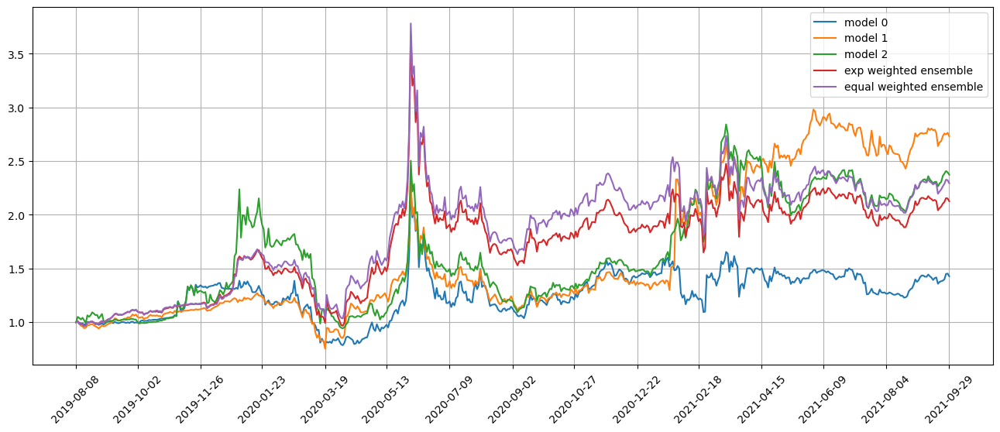

Standardization data are from 2020-02-27 to 2020-12-09
Training data are from 2020-12-10 to 2021-09-27
Testing data are from 2021-08-31 to 2021-10-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 28 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 26.
Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 26.
Epoch 46: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2214305400848389
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2014877796173096
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.215281367301941
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2003214359283447
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2120888

position on 2021-10-04 market open will be {'SOXL': 0.22373148513496596, 'GOLF': 0.2325317807167983, 'NAVI': 0.2404044967586871, 'ASML': 0.2258372891000383, 'GRMN': 0.23199923540941514, 'DECK': 0.23574939150243082, 'SVXY': 0.23520929157981751, 'DDS': 0.235657266851187, 'HBI': 0.23629426127112277, 'GME': 0.22922678373329708}
Total asset on 2021-10-04 will be 2.3266412820577314
It should be the same as 2.32664128205776
top_stocks by return weighted ensemble to buy on 2021-10-01 are ['ADBE', 'BOTZ', 'ZBRA', 'NAVI', 'DDS', 'HBI', 'GOLF', 'SVXY', 'ASML', 'GME']
position on 2021-10-04 market open will be {'NAVI': 0.21507507027412615, 'ASML': 0.20204268837976183, 'BOTZ': 0.20444001076480067, 'ADBE': 0.20734183423441865, 'GOLF': 0.21418551578050393, 'ZBRA': 0.20494473657597326, 'SVXY': 0.20972579468098973, 'DDS': 0.2101252345549605, 'HBI': 0.2106932145018031, 'GME': 0.20439145519180768}
Total asset on 2021-10-04 will be 2.0829655549391273
It should be the same as 2.0829655549391455
top_stocks 

position on 2021-10-07 market open will be {'GME': 0.20659182889963568, 'EQIX': 0.2082799822158466, 'BOTZ': 0.21350534778147742, 'LULU': 0.21167573490862893, 'BRK-B': 0.21166437490612836, 'ISRG': 0.2147024458144402, 'SMFG': 0.20756339052753597, 'PRGO': 0.21036745528172765, 'APAM': 0.21151108061602697, 'BRK-A': 0.21154533794279487}
Total asset on 2021-10-07 will be 2.107406978894223
It should be the same as 2.1074069788942427
top_stocks by equal weighted ensemble to buy on 2021-10-06 are ['EQIX', 'SMFG', 'BRK-A', 'APAM', 'LULU', 'BRK-B', 'ISRG', 'BOTZ', 'PRGO', 'GME']
position on 2021-10-07 market open will be {'GME': 0.22491399608878423, 'EQIX': 0.2252156940725255, 'BOTZ': 0.23086594581600145, 'LULU': 0.22888756302251928, 'BRK-B': 0.2288752793127714, 'ISRG': 0.23216038257126853, 'SMFG': 0.22444083470902593, 'PRGO': 0.22747290424888753, 'APAM': 0.2287095203205954, 'BRK-A': 0.22874656318733189}
Total asset on 2021-10-07 will be 2.2802886833496725
It should be the same as 2.28028868334971

position on 2021-10-12 market open will be {'NOW': 0.21305043766355752, 'RVTY': 0.2125409138504863, 'ACHC': 0.2068276723413744, 'TSCO': 0.20985290284445726, 'EBAY': 0.21303767902924892, 'RYAAY': 0.20610184903064616, 'MELI': 0.2077482169947424, 'CMG': 0.20934738919706503, 'INFY': 0.2117568072544765, 'GME': 0.22073663379302105}
Total asset on 2021-10-12 will be 2.111000501999054
It should be the same as 2.1110005019990754
top_stocks by equal weighted ensemble to buy on 2021-10-11 are ['NOW', 'ACHC', 'RVTY', 'EBAY', 'CMG', 'TSCO', 'RYAAY', 'MELI', 'INFY', 'GME']
position on 2021-10-12 market open will be {'NOW': 0.2305281649202579, 'RVTY': 0.2299768419992697, 'ACHC': 0.22379491111339342, 'TSCO': 0.22706831831210472, 'EBAY': 0.23051435962332303, 'RYAAY': 0.22300954442880225, 'MELI': 0.2247909732289907, 'CMG': 0.22652133453327059, 'INFY': 0.22912841072326617, 'GME': 0.23884490300525785}
Total asset on 2021-10-12 will be 2.284177761887899
It should be the same as 2.2841777618879364
Testing d

Testing data from 2021-09-17 to 2021-10-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-15 are ['SYF', 'BLMN', 'COF', 'GTLS', 'MATX', 'ODFL', 'KRYS', 'DE', 'DFS', 'XENE']
position on 2021-10-18 market open will be {'DFS': 0.142047038315961, 'SYF': 0.1454304583701206, 'COF': 0.14520228270734342, 'XENE': 0.1517468140265805, 'GTLS': 0.13940867895315456, 'BLMN': 0.13989645929320624, 'KRYS': 0.1457898099216501, 'MATX': 0.14645693711604169, 'ODFL': 0.148956810481531, 'DE': 0.14593566953899612}
Total asset on 2021-10-18 will be 1.45087095872457
It should be the same as 1.4508709587245852
top_stocks by model 1 to buy on 2021-10-15 are ['SYNA', 'SYF', 'BAC', 'AB', 'COF', 'ODFL', 'DE', 'DFS', 'KRYS', 'XENE']
position on 2021-10-18 market open will be {'SYF': 0.27681441589122463, 'DFS': 0.28012585119828226, 'XENE': 0.28726592345046986, 'KRYS': 0.27598895334616624, 'BAC': 0.28131327523643934, 'AB': 0.2785269203641044, 'ODFL': 0.28198427750659955, 'COF': 0.276994165699

top_stocks by model 0 to buy on 2021-10-20 are ['ZION', 'PBR', 'ASND', 'PBR-A', 'BCC', 'CUBI', 'LNG', 'GGB', 'ITUB', 'ULTA']
position on 2021-10-21 market open will be {'ZION': 0.15043226748089575, 'PBR-A': 0.1438193411563268, 'LNG': 0.14133940374937637, 'ITUB': 0.1467480227702924, 'GGB': 0.14241892058045164, 'CUBI': 0.14913858815869036, 'BCC': 0.1492388717039777, 'ASND': 0.13791392301011937, 'PBR': 0.1444331293148884, 'ULTA': 0.14211559806107826}
Total asset on 2021-10-21 will be 1.4475980659860828
It should be the same as 1.447598065986097
top_stocks by model 1 to buy on 2021-10-20 are ['HWC', 'LPG', 'ULTA', 'GGB', 'MEOH', 'CUBI', 'STNG', 'ITUB', 'INSW', 'ZION']
position on 2021-10-21 market open will be {'STNG': 0.27416646061638217, 'ZION': 0.2867837465071553, 'LPG': 0.27634813280488324, 'ITUB': 0.27976011042927607, 'GGB': 0.27150711945995143, 'MEOH': 0.2727641158819098, 'INSW': 0.28199054208498636, 'CUBI': 0.28431747906989807, 'ULTA': 0.2709288660708178, 'HWC': 0.2850838292639157}


Testing data from 2021-09-27 to 2021-10-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-25 are ['GT', 'EXTR', 'PBR-A', 'TFIN', 'PYPL', 'CMG', 'XOP', 'ALLY', 'TCOM', 'WAL']
position on 2021-10-26 market open will be {'ALLY': 0.14840467847450528, 'WAL': 0.14196085017709492, 'PYPL': 0.1439595209073305, 'PBR-A': 0.15290946842871755, 'EXTR': 0.14592922905679126, 'XOP': 0.14895051138135706, 'GT': 0.15085317574294296, 'CMG': 0.14631552061713932, 'TFIN': 0.14816065063949083, 'TCOM': 0.14406496128684956}
Total asset on 2021-10-26 will be 1.4715085667122045
It should be the same as 1.4715085667122194
top_stocks by model 1 to buy on 2021-10-25 are ['TCOM', 'FULT', 'PZZA', 'FCFS', 'AUB', 'CMG', 'PBR-A', 'WDFC', 'ALLY', 'COOP']
position on 2021-10-26 market open will be {'FCFS': 0.28793704968331746, 'ALLY': 0.2815732350321845, 'COOP': 0.28150560398238667, 'PBR-A': 0.29012032595671994, 'WDFC': 0.290540730059652, 'FULT': 0.277348962019968, 'CMG': 0.2776094048993461, 'AUB

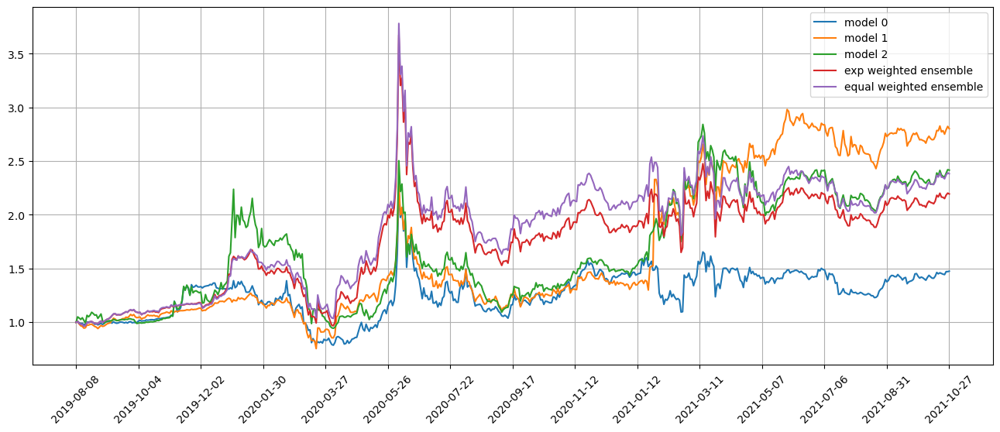

Standardization data are from 2020-03-26 to 2021-01-08
Training data are from 2021-01-11 to 2021-10-25
Testing data are from 2021-09-29 to 2021-11-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 29 out of 67 iterations
Restoring model weights from the end of the best epoch: 69.
Epoch 89: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1994014978408813
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.217090368270874
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2053202390670776
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2183952331542969
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2106583

position on 2021-11-01 market open will be {'ALLY': 0.22341305693973723, 'EXTR': 0.2203182083705926, 'PKX': 0.21916981871928132, 'SLM': 0.2255249925581584, 'POWI': 0.22267498213159403, 'GRMN': 0.22071971523488942, 'AGCO': 0.2165767482037282, 'THRM': 0.2159141855654032, 'FCNCA': 0.2196268175616478, 'VC': 0.22462265465998404}
Total asset on 2021-11-01 will be 2.208561179944993
It should be the same as 2.208561179945016
top_stocks by equal weighted ensemble to buy on 2021-10-29 are ['POWI', 'PKX', 'EXTR', 'VC', 'THRM', 'AGCO', 'FCNCA', 'ALLY', 'GRMN', 'SLM']
position on 2021-11-01 market open will be {'ALLY': 0.24255079761635967, 'EXTR': 0.2391908418499858, 'PKX': 0.23794408022505958, 'SLM': 0.2448436433245701, 'POWI': 0.24174949873138016, 'GRMN': 0.23962674211256493, 'AGCO': 0.235128885220622, 'THRM': 0.23440956693816425, 'FCNCA': 0.23844022595281641, 'VC': 0.24386401044223285}
Total asset on 2021-11-01 will be 2.3977482924137186
It should be the same as 2.3977482924137554
Testing data f

position on 2021-11-04 market open will be {'MOS': 0.2553702506335193, 'NTR': 0.24539153732983252, 'FALN': 0.24549572545533246, 'EL': 0.24971110947495007, 'ZBRA': 0.24404826209592503, 'CAR': 0.22415184161949872, 'LPX': 0.2572799223230466, 'VALE': 0.23824164125967492, 'SAVA': 0.3242536910707462, 'IT': 0.23794546282209872}
Total asset on 2021-11-04 will be 2.5218894440845867
It should be the same as 2.5218894440846245
Testing data from 2021-10-07 to 2021-11-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-11-04 are ['TRN', 'XENE', 'ALLY', 'VC', 'NTR', 'WING', 'DFS', 'SLM', 'SAVA', 'CAR']
position on 2021-11-05 market open will be {'NTR': 0.1478120461103021, 'CAR': 0.13076171400498937, 'SAVA': 0.2377522370812442, 'XENE': 0.15677297509419183, 'ALLY': 0.15305613544798266, 'WING': 0.16632439588642797, 'DFS': 0.15318295749470995, 'SLM': 0.15379934260060624, 'TRN': 0.15236548614983667, 'VC': 0.15564809705869095}
Total asset on 2021-11-05 will be 1.607475386928968
It s

position on 2021-11-09 market open will be {'LOGI': 0.2592101577613336, 'FN': 0.2578288895342594, 'IMO': 0.2611540612260516, 'ATGE': 0.26975544380910343, 'WELL': 0.26337838059950075, 'NTRA': 0.26238463269167667, 'UI': 0.251612450197467, 'BCRX': 0.25997228226093394, 'SHY': 0.2614286624568028, 'PTEN': 0.2567605391253797}
Total asset on 2021-11-09 will be 2.6034854996624714
It should be the same as 2.603485499662509
Testing data from 2021-10-12 to 2021-11-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-11-09 are ['ZLAB', 'WST', 'CACC', 'RH', 'VSAT', 'MCHP', 'VRNS', 'UPBD', 'GME', 'CAR']
position on 2021-11-10 market open will be {'WST': 0.16322190239458598, 'VSAT': 0.16138644876202007, 'VRNS': 0.16445332559332565, 'UPBD': 0.17072057750177103, 'CACC': 0.1632750653806166, 'MCHP': 0.15909089001134627, 'ZLAB': 0.16389534469061717, 'RH': 0.16213621358304714, 'CAR': 0.13855075354002266, 'GME': 0.14961027403990904}
Total asset on 2021-11-10 will be 1.5963407954972475
I

position on 2021-11-15 market open will be {'SPTS': 0.15968802754323635, 'PARR': 0.1655328124469488, 'TPIC': 0.15623817924765387, 'IMO': 0.16130476362853946, 'ATGE': 0.1587278014521008, 'SHY': 0.15970664751792266, 'BCRX': 0.15852336411798215, 'MCY': 0.15774788807468126, 'CX': 0.15896326593455065, 'PTC': 0.16128768285960385}
Total asset on 2021-11-15 will be 1.597720432823206
It should be the same as 1.5977204328232197
top_stocks by model 1 to buy on 2021-11-12 are ['PTC', 'ATGE', 'NBR', 'SHY', 'DBO', 'BCRX', 'IMO', 'PARR', 'WK', 'MCY']
position on 2021-11-15 market open will be {'WK': 0.3108630658473483, 'PARR': 0.3109573718152555, 'NBR': 0.28086869533624764, 'IMO': 0.30301488035966856, 'DBO': 0.29651102846593413, 'ATGE': 0.2981739948952866, 'SHY': 0.3000127807863753, 'BCRX': 0.29778995444325346, 'MCY': 0.2963332040336764, 'PTC': 0.30298279372416537}
Total asset on 2021-11-15 will be 2.997507769707194
It should be the same as 2.9975077697072114
top_stocks by model 2 to buy on 2021-11-1

Testing data from 2021-10-20 to 2021-11-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-11-17 are ['IQV', 'CAR', 'AXON', 'MS', 'GS', 'CMP', 'NOVT', 'FCFS', 'GNRC', 'GME']
position on 2021-11-18 market open will be {'CAR': 0.1624927380391077, 'GNRC': 0.15259004674753732, 'FCFS': 0.15595090457126237, 'AXON': 0.14936642223285712, 'MS': 0.152056232180904, 'IQV': 0.15503533811172712, 'CMP': 0.15130685568661173, 'GS': 0.15235337051477077, 'NOVT': 0.15388915066228662, 'GME': 0.15905031050093116}
Total asset on 2021-11-18 will be 1.544091369247982
It should be the same as 1.5440913692479958
top_stocks by model 1 to buy on 2021-11-17 are ['MS', 'AXON', 'IQV', 'PICK', 'CMP', 'NOVT', 'GNRC', 'ERJ', 'FCFS', 'GME']
position on 2021-11-18 market open will be {'GNRC': 0.28265504033079397, 'FCFS': 0.28888063252346696, 'ERJ': 0.2911788989542825, 'AXON': 0.2766836566355271, 'MS': 0.2816662118909512, 'PICK': 0.28472453625597954, 'IQV': 0.2871846537878838, 'CMP': 0.2802780804385

Testing data from 2021-10-25 to 2021-11-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-11-22 are ['EQNR', 'VSAT', 'ROKU', 'MNRO', 'CLM', 'MEOH', 'PPBI', 'TPIC', 'MMS', 'CAR']
position on 2021-11-23 market open will be {'CLM': 0.1552184381214223, 'ROKU': 0.1460935642036406, 'VSAT': 0.153659387125032, 'TPIC': 0.14654736727233603, 'MMS': 0.1549304026588603, 'PPBI': 0.15464357725508365, 'MEOH': 0.15700663486316627, 'EQNR': 0.15704039951998858, 'CAR': 0.16075133632293304, 'MNRO': 0.1576636047538167}
Total asset on 2021-11-23 will be 1.543554712096266
It should be the same as 1.5435547120962791
top_stocks by model 1 to buy on 2021-11-22 are ['KRNT', 'VRNS', 'PRTA', 'SIGI', 'PLCE', 'PPBI', 'CAR', 'MMS', 'TSE', 'VSAT']
position on 2021-11-23 market open will be {'PRTA': 0.28313035020640764, 'PLCE': 0.2686156187378636, 'VSAT': 0.2764211068340792, 'VRNS': 0.26867632218226467, 'MMS': 0.2787075634394166, 'PPBI': 0.27819158718138587, 'TSE': 0.28177848932519856, 'SIGI': 0

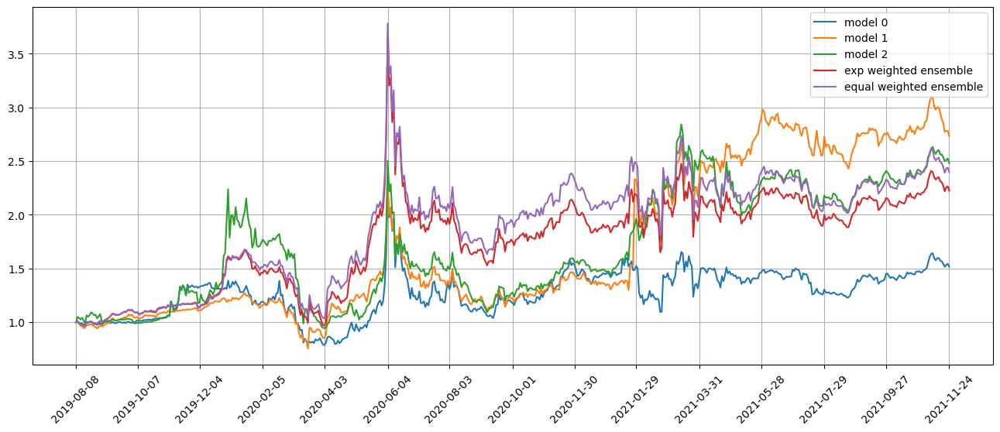

Standardization data are from 2020-04-24 to 2021-02-08
Training data are from 2021-02-09 to 2021-11-22
Testing data are from 2021-10-27 to 2021-12-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 30 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.18702232837677
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4016138315200806
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.184106707572937
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.404449224472046
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.180966854

position on 2021-11-30 market open will be {'PRTA': 0.22848958097149963, 'UCO': 0.20481895719999338, 'RHP': 0.2241411070908574, 'DPST': 0.2107609528091891, 'MMS': 0.22822173142445665, 'BNO': 0.21581901187924432, 'KFY': 0.22574787267434057, 'UFPI': 0.2237953279950333, 'SQM': 0.2280753609661065, 'IPG': 0.22594685716116514}
Total asset on 2021-11-30 will be 2.2158167601718466
It should be the same as 2.2158167601718857
Testing data from 2021-11-01 to 2021-11-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-11-30 are ['RVNC', 'BNO', 'USO', 'DBC', 'CX', 'CMP', 'COMT', 'PDBC', 'WWD', 'DBO']
position on 2021-12-01 market open will be {'BNO': 0.13997566912973508, 'WWD': 0.14235455798056432, 'USO': 0.14357101047534365, 'DBO': 0.1439055201575441, 'COMT': 0.14244351089919244, 'PDBC': 0.1420233941581537, 'RVNC': 0.1510560141256209, 'CMP': 0.14154087752005784, 'DBC': 0.14248500579697018, 'CX': 0.14608907936185686}
Total asset on 2021-12-01 will be 1.4354446396050262
It sho

top_stocks by model 0 to buy on 2021-12-03 are ['GUSH', 'KRYS', 'OVV', 'DDS', 'FAS', 'DPST', 'MTDR', 'SM', 'UCO', 'CAR']
position on 2021-12-06 market open will be {'GUSH': 0.12913813914533295, 'UCO': 0.13176569434098945, 'DPST': 0.12785737989593685, 'SM': 0.1331652536989243, 'KRYS': 0.12996629549202643, 'FAS': 0.13110370268011814, 'MTDR': 0.13265631033629985, 'OVV': 0.12876676822460137, 'CAR': 0.13269148319585175, 'DDS': 0.12456390171127814}
Total asset on 2021-12-06 will be 1.3016749287213463
It should be the same as 1.3016749287213591
top_stocks by model 1 to buy on 2021-12-03 are ['SIG', 'AR', 'EVRI', 'FAS', 'OVV', 'DPST', 'SM', 'MTDR', 'UCO', 'CAR']
position on 2021-12-06 market open will be {'UCO': 0.23723098633953613, 'DPST': 0.23019445611547415, 'SM': 0.23975075332884363, 'AR': 0.22968955626869153, 'FAS': 0.2360391364013372, 'MTDR': 0.238834451581942, 'SIG': 0.22652227891168106, 'EVRI': 0.23838517790763855, 'OVV': 0.23183171907116015, 'CAR': 0.2388977768063535}
Total asset on 2

position on 2021-12-09 market open will be {'GNRC': 0.13851354645775923, 'PRTA': 0.13426034150110394, 'NOW': 0.1364535691328949, 'HUBS': 0.13742943384098794, 'TRUP': 0.1341974396046068, 'AVAV': 0.14803780311226153, 'MDB': 0.14296250640161556, 'SKYY': 0.1361482783740586, 'TTD': 0.13819716155700884, 'TAL': 0.1538462459000197}
Total asset on 2021-12-09 will be 1.4000463258823042
It should be the same as 1.4000463258823168
top_stocks by model 1 to buy on 2021-12-08 are ['NOW', 'RGEN', 'ETSY', 'FTNT', 'TTD', 'MDB', 'TRUP', 'GNRC', 'EPAM', 'HUBS']
position on 2021-12-09 market open will be {'HUBS': 0.2506963552238214, 'GNRC': 0.2525293617453773, 'NOW': 0.24877373803664077, 'ETSY': 0.25412530783853293, 'TRUP': 0.24466050171886852, 'MDB': 0.26064043133953724, 'TTD': 0.25195254829214053, 'FTNT': 0.25092337089608374, 'EPAM': 0.26899846627461504, 'RGEN': 0.2517143411982093}
Total asset on 2021-12-09 will be 2.53501442256381
It should be the same as 2.535014422563827
top_stocks by model 2 to buy o

Testing data from 2021-11-12 to 2021-12-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-13 are ['TECL', 'F', 'SOXL', 'DIOD', 'MTDR', 'GUSH', 'AMBA', 'SM', 'UCO', 'CAR']
position on 2021-12-14 market open will be {'DIOD': 0.1360174213202025, 'GUSH': 0.13010110160613883, 'UCO': 0.1390412158533454, 'SM': 0.1323790520642257, 'SOXL': 0.12625462897250966, 'AMBA': 0.13278262606667496, 'MTDR': 0.1367372678346778, 'TECL': 0.13099493268359666, 'F': 0.13342688023398896, 'CAR': 0.13707029368552653}
Total asset on 2021-12-14 will be 1.3348054203208737
It should be the same as 1.3348054203208872
top_stocks by model 1 to buy on 2021-12-13 are ['F', 'GUSH', 'UCTT', 'ON', 'SOXL', 'AMBA', 'MARA', 'SM', 'UCO', 'CAR']
position on 2021-12-14 market open will be {'GUSH': 0.2352815643119748, 'UCO': 0.2514493295287397, 'ON': 0.24309872753942793, 'MARA': 0.23492738562381585, 'SM': 0.23940112779443012, 'UCTT': 0.2382417184833494, 'SOXL': 0.22832540416305283, 'AMBA': 0.2401309719036

Testing data from 2021-11-17 to 2021-12-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-16 are ['SLM', 'APLS', 'IGLB', 'JD', 'PDBC', 'CVNA', 'PRTA', 'AXON', 'ABM', 'ORCL']
position on 2021-12-17 market open will be {'PRTA': 0.13105750886017675, 'APLS': 0.14134054305004276, 'ABM': 0.14068670195842436, 'AXON': 0.1326790203772416, 'SLM': 0.13629967822851577, 'IGLB': 0.13898508401942303, 'CVNA': 0.12239260773868195, 'ORCL': 0.13050317078419196, 'PDBC': 0.13850585068665608, 'JD': 0.13229096080528857}
Total asset on 2021-12-17 will be 1.3447411265086293
It should be the same as 1.3447411265086426
top_stocks by model 1 to buy on 2021-12-16 are ['ALB', 'QCLN', 'QLD', 'FND', 'ALTR', 'SQM', 'LIT', 'CAR', 'ORCL', 'AXON']
position on 2021-12-17 market open will be {'CAR': 0.22206294539413965, 'QCLN': 0.23212901428060168, 'QLD': 0.23055602237281597, 'AXON': 0.2378770527294124, 'ALB': 0.23294511356308162, 'FND': 0.238520641310938, 'ORCL': 0.2339760238636165, 'ALTR': 0.2

Testing data from 2021-11-22 to 2021-12-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-21 are ['MPWR', 'LULU', 'AMBA', 'TER', 'RL', 'ODFL', 'NXPI', 'CLM', 'BOOT', 'ON']
position on 2021-12-22 market open will be {'LULU': 0.14093909127568108, 'MPWR': 0.13756220723425022, 'ON': 0.14211962852981222, 'NXPI': 0.13850500209573688, 'AMBA': 0.14214124952416118, 'ODFL': 0.1386697109976643, 'CLM': 0.13667958163265354, 'BOOT': 0.1420779456750056, 'TER': 0.13903144482312496, 'RL': 0.13918707350715234}
Total asset on 2021-12-22 will be 1.396912935295229
It should be the same as 1.3969129352952423
top_stocks by model 1 to buy on 2021-12-21 are ['LULU', 'RL', 'AEO', 'SOXL', 'CLM', 'NVO', 'NXPI', 'ODFL', 'ON', 'BOOT']
position on 2021-12-22 market open will be {'LULU': 0.24539493352281877, 'ON': 0.24745041620244002, 'NXPI': 0.2411568392716457, 'SOXL': 0.2446257425246818, 'ODFL': 0.24144362081446155, 'CLM': 0.23797852352450266, 'BOOT': 0.24737784044441768, 'AEO': 0.243553

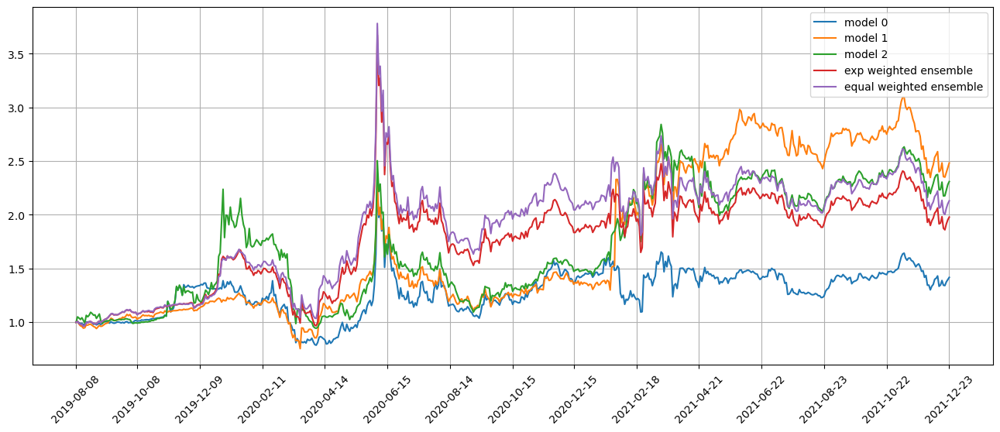

Standardization data are from 2020-05-22 to 2021-03-09
Training data are from 2021-03-10 to 2021-12-21
Testing data are from 2021-11-24 to 2022-01-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 31 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 1.2073631286621094
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.316899061203003
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2016863822937012
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3113000392913818
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.19377851

position on 2021-12-29 market open will be {'NAIL': 0.2265404972892069, 'PNR': 0.22493386797097997, 'AMG': 0.22335557364586955, 'ADP': 0.2250086326653105, 'CINF': 0.2254406032412441, 'MC': 0.22346418554156142, 'EVR': 0.22299569344049364, 'NTAP': 0.22402213537972146, 'AEO': 0.2319126231756341, 'RL': 0.22441051995391892}
Total asset on 2021-12-29 will be 2.252084332303902
It should be the same as 2.2520843323039403
Testing data from 2021-11-30 to 2021-12-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-29 are ['FCG', 'XOP', 'CROX', 'SM', 'VTLE', 'ORCL', 'GUSH', 'CAR', 'HRI', 'MTDR']
position on 2021-12-30 market open will be {'GUSH': 0.14972752336373626, 'SM': 0.1518209387331636, 'HRI': 0.1552925568489726, 'XOP': 0.1498443475043847, 'MTDR': 0.1496464268177541, 'VTLE': 0.15184333466154892, 'CROX': 0.15251007824722, 'ORCL': 0.14990006740944892, 'CAR': 0.14747597642178265, 'FCG': 0.1493910516426652}
Total asset on 2021-12-30 will be 1.5074523016506634
It should 

position on 2022-01-03 market open will be {'BX': 0.23088301241998385, 'WK': 0.22700477409508962, 'KKR': 0.22856471253792165, 'SM': 0.22824309768397097, 'NTLA': 0.22287091775735582, 'ALB': 0.23081776953595937, 'SOXL': 0.2293281356822565, 'CAR': 0.23277141807566165, 'LSCC': 0.23003468570197672, 'SYNA': 0.23031106342748547}
Total asset on 2022-01-03 will be 2.290829586917623
It should be the same as 2.2908295869176616
Testing data from 2021-12-03 to 2021-12-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-03 are ['USO', 'BDC', 'CTRA', 'DVN', 'WWD', 'EQNR', 'CINF', 'CEIX', 'AEHR', 'UCO']
position on 2022-01-04 market open will be {'AEHR': 0.1501059349754993, 'CEIX': 0.15943155258483815, 'UCO': 0.16166617749969245, 'USO': 0.15761116859481714, 'CTRA': 0.1607906895186621, 'CINF': 0.15365823012453797, 'DVN': 0.16121406495619975, 'EQNR': 0.15676595868934717, 'BDC': 0.15193025896229337, 'WWD': 0.15624923764068538}
Total asset on 2022-01-04 will be 1.5694232735465599

position on 2022-01-06 market open will be {'AEHR': 0.20573815317835656, 'ICLR': 0.23065868345203708, 'LH': 0.23272274344336025, 'SPIP': 0.2323512051319076, 'SCHP': 0.2326523502710937, 'TM': 0.23642529247505678, 'MEDP': 0.2190340032571902, 'RGEN': 0.21711638457572488, 'NTLA': 0.21639039627417747, 'ZTS': 0.22349851549173305}
Total asset on 2022-01-06 will be 2.246587727550598
It should be the same as 2.246587727550638
Testing data from 2021-12-08 to 2022-01-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-06 are ['ARCB', 'AR', 'KKR', 'GNRC', 'QTEC', 'FDS', 'TAL', 'CAR', 'FTNT', 'AEHR']
position on 2022-01-07 market open will be {'AEHR': 0.12843391462327555, 'GNRC': 0.1553148683727516, 'KKR': 0.15356682957773218, 'FDS': 0.1539255632663533, 'AR': 0.15825078442810567, 'FTNT': 0.16202775643523276, 'QTEC': 0.15552674205142347, 'CAR': 0.15079977349793994, 'ARCB': 0.15563515715377227, 'TAL': 0.15551763670000343}
Total asset on 2022-01-07 will be 1.528999026106577
I

Testing data from 2021-12-13 to 2022-01-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-11 are ['BIO', 'TREX', 'FTNT', 'CPRI', 'PRTA', 'WK', 'AMN', 'DXCM', 'RGEN', 'AEHR']
position on 2022-01-12 market open will be {'AEHR': 0.09742821376785286, 'PRTA': 0.14513854157827924, 'CPRI': 0.15681741249382444, 'WK': 0.16164753979838414, 'BIO': 0.1550461923910023, 'TREX': 0.15712660245400115, 'FTNT': 0.15777128755212205, 'DXCM': 0.1614155828360043, 'AMN': 0.15150027092113097, 'RGEN': 0.15275506490680474}
Total asset on 2022-01-12 will be 1.4966467086993924
It should be the same as 1.4966467086994062
top_stocks by model 1 to buy on 2022-01-11 are ['TREX', 'TVTX', 'SHOP', 'BIO', 'STLD', 'CPRI', 'RGEN', 'DHR', 'DXCM', 'AMN']
position on 2022-01-12 market open will be {'TVTX': 0.2640283648741492, 'CPRI': 0.26722484479050196, 'DHR': 0.26348390461760485, 'BIO': 0.26420659567173715, 'STLD': 0.2762552788076571, 'TREX': 0.2677517202044312, 'DXCM': 0.2750603608627856, 'AMN': 

Testing data from 2021-12-16 to 2022-01-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-14 are ['NKE', 'EWT', 'NAIL', 'XENE', 'USO', 'WM', 'AEHR', 'EQNR', 'UCO', 'CAR']
position on 2022-01-18 market open will be {'XENE': 0.1535770464190035, 'NAIL': 0.13478716518206002, 'UCO': 0.1497179057269477, 'NKE': 0.14334063792838764, 'USO': 0.1467229309521808, 'AEHR': 0.13886434738363307, 'WM': 0.14339255220932337, 'EQNR': 0.14519739534813564, 'CAR': 0.14434061176416368, 'EWT': 0.14351020806399084}
Total asset on 2022-01-18 will be 1.4434508009778135
It should be the same as 1.4434508009778262
top_stocks by model 1 to buy on 2022-01-14 are ['PNFP', 'APH', 'LEN', 'XHB', 'BLD', 'NOVT', 'USO', 'NSP', 'EQNR', 'UCO']
position on 2022-01-18 market open will be {'NSP': 0.2554915200691464, 'LEN': 0.2555884728876959, 'APH': 0.25986907783085156, 'UCO': 0.27213528027019185, 'PNFP': 0.26781299200695474, 'USO': 0.26669145379014614, 'XHB': 0.2552655550784592, 'EQNR': 0.26391855861

top_stocks by model 0 to buy on 2022-01-20 are ['SONY', 'GS', 'SKY', 'AX', 'FN', 'AEHR', 'EVR', 'PIPR', 'EPAM', 'SYNA']
position on 2022-01-21 market open will be {'AX': 0.14282149926304247, 'EPAM': 0.13956766326106518, 'FN': 0.1441980691798428, 'SONY': 0.14111715813574058, 'EVR': 0.14229353547257687, 'SKY': 0.135446780221324, 'GS': 0.1432174723039196, 'PIPR': 0.14000336485343068, 'AEHR': 0.13677705757672468, 'SYNA': 0.13380857134789823}
Total asset on 2022-01-21 will be 1.3992511716155522
It should be the same as 1.3992511716155651
top_stocks by model 1 to buy on 2022-01-20 are ['SFBS', 'SF', 'AX', 'PRGS', 'DFS', 'SYF', 'PIPR', 'TFIN', 'SLM', 'EVR']
position on 2022-01-21 market open will be {'AX': 0.2512376481298026, 'SF': 0.2494756505916581, 'DFS': 0.25174787418732275, 'SYF': 0.24850418591184517, 'SLM': 0.24122848363920335, 'EVR': 0.25030890573668446, 'PIPR': 0.24628026100785022, 'PRGS': 0.2596616425566342, 'TFIN': 0.23840403258428675, 'SFBS': 0.25115352139583386}
Total asset on 202

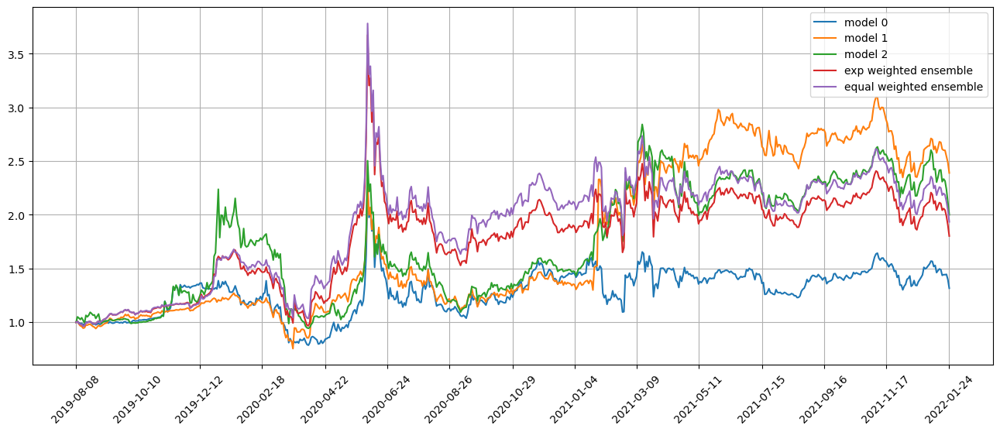

Standardization data are from 2020-06-22 to 2021-04-07
Training data are from 2021-04-08 to 2022-01-20
Testing data are from 2021-12-23 to 2022-02-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 32 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.218918800354004
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.375687599182129
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2117592096328735
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.381178617477417
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.20902514457

position on 2022-01-27 market open will be {'ALLY': 0.18777926912289986, 'SYF': 0.18589665319313337, 'LPLA': 0.1893521018679115, 'IYG': 0.18834765324018277, 'FAS': 0.1885610362298071, 'XLF': 0.18775247238555576, 'COF': 0.191249914866155, 'RJF': 0.19200360071860195, 'IYF': 0.187489519875356, 'IVZ': 0.18829742643672354}
Total asset on 2022-01-27 will be 1.8867296479363023
It should be the same as 1.8867296479363271
top_stocks by equal weighted ensemble to buy on 2022-01-26 are ['SYF', 'IVZ', 'XLF', 'LPLA', 'IYF', 'IYG', 'COF', 'RJF', 'ALLY', 'FAS']
position on 2022-01-27 market open will be {'ALLY': 0.20156424082113, 'SYF': 0.19954342109798587, 'LPLA': 0.20325253601829255, 'IYG': 0.20217435030568626, 'FAS': 0.20240339784915934, 'XLF': 0.2015354769216619, 'COF': 0.20528966843444368, 'RJF': 0.20609868274883356, 'IYF': 0.20125322093388437, 'IVZ': 0.20212043632702703}
Total asset on 2022-01-27 will be 2.0252354314580616
It should be the same as 2.0252354314581043
Testing data from 2021-12-29

position on 2022-02-01 market open will be {'GNRC': 0.21039155397804932, 'AX': 0.20185217638484967, 'DAN': 0.2106597245538152, 'RSPT': 0.20594931056052307, 'MTSI': 0.200542397539959, 'STM': 0.20525512333058057, 'EVR': 0.20676542083229113, 'HTH': 0.2059960440748545, 'OXM': 0.20574221257335207, 'PGX': 0.2015483153424273}
Total asset on 2022-02-01 will be 2.0547022791706597
It should be the same as 2.054702279170702
Testing data from 2022-01-03 to 2022-01-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-01 are ['COF', 'LPG', 'MC', 'RWT', 'BANC', 'HTH', 'EWT', 'ALLY', 'SYF', 'TFIN']
position on 2022-02-02 market open will be {'HTH': 0.13829309199766499, 'ALLY': 0.13969779540701718, 'LPG': 0.14046532853627183, 'SYF': 0.13721214156535022, 'RWT': 0.13490242856391335, 'MC': 0.13878452580586956, 'BANC': 0.13986397183860597, 'COF': 0.13897150866231678, 'EWT': 0.13735863744954002, 'TFIN': 0.13672779661611}
Total asset on 2022-02-02 will be 1.382277226442647
It should 

top_stocks by model 0 to buy on 2022-02-04 are ['OTEX', 'QTEC', 'CLH', 'FELE', 'SMCI', 'SUM', 'ETN', 'KFY', 'RSPT', 'STM']
position on 2022-02-07 market open will be {'SUM': 0.13491393509638794, 'FELE': 0.13317760896196926, 'CLH': 0.1354876321600242, 'SMCI': 0.1314968676954596, 'RSPT': 0.13593632337387992, 'STM': 0.13467907929312672, 'QTEC': 0.13685964031801615, 'KFY': 0.1344866434514831, 'ETN': 0.1326054843784237, 'OTEX': 0.13121135776630982}
Total asset on 2022-02-07 will be 1.3408545724950682
It should be the same as 1.3408545724950807
top_stocks by model 1 to buy on 2022-02-04 are ['FTEC', 'GIB', 'MTSI', 'PI', 'PH', 'IVW', 'QLD', 'UMC', 'META', 'STM']
position on 2022-02-07 market open will be {'UMC': 0.25573473836767924, 'QLD': 0.2574614183780991, 'FTEC': 0.25450065673250705, 'PI': 0.2621608487540678, 'MTSI': 0.25776400665940447, 'STM': 0.25219610160790434, 'PH': 0.24556574660021321, 'GIB': 0.2554852471462327, 'META': 0.25415789816307605, 'IVW': 0.25359964738284}
Total asset on 20

Testing data from 2022-01-11 to 2022-02-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-09 are ['HCA', 'PNR', 'GPI', 'SNDR', 'LII', 'PTC', 'MAS', 'LSTR', 'AVY', 'IT']
position on 2022-02-10 market open will be {'AVY': 0.1396837657244352, 'PNR': 0.1390089617012245, 'GPI': 0.14450062479358733, 'SNDR': 0.14179517388715543, 'LSTR': 0.1410492895391808, 'HCA': 0.1403624777426098, 'MAS': 0.13882734340992198, 'PTC': 0.14192046485230603, 'LII': 0.13738341471138638, 'IT': 0.1340598527196889}
Total asset on 2022-02-10 will be 1.3985913690814842
It should be the same as 1.3985913690814962
top_stocks by model 1 to buy on 2022-02-09 are ['MCO', 'GPI', 'MUB', 'BAC-PL', 'LSTR', 'WTW', 'KNX', 'SNDR', 'DDS', 'IT']
position on 2022-02-10 market open will be {'KNX': 0.25676571059319303, 'MCO': 0.25555252533611705, 'GPI': 0.266278267853543, 'LSTR': 0.2599183259872846, 'BAC-PL': 0.2568088685443534, 'MUB': 0.2587737317889625, 'SNDR': 0.2612928030352659, 'IT': 0.24703855379097314

top_stocks by model 0 to buy on 2022-02-14 are ['SWK', 'DLB', 'UI', 'SHYG', 'HYD', 'WDFC', 'VSAT', 'TTMI', 'PZA', 'BOIL']
position on 2022-02-15 market open will be {'HYD': 0.1372399466237633, 'VSAT': 0.14330894848233014, 'SWK': 0.1403218613067372, 'WDFC': 0.1372514922462739, 'SHYG': 0.13753483804907557, 'UI': 0.139370113710086, 'PZA': 0.13679658653666907, 'DLB': 0.13946762195479318, 'TTMI': 0.13715142756223395, 'BOIL': 0.15084368352883348}
Total asset on 2022-02-15 will be 1.3992865200007842
It should be the same as 1.3992865200007958
top_stocks by model 1 to buy on 2022-02-14 are ['VSAT', 'INDB', 'IPG', 'PZA', 'HYD', 'STIP', 'MATX', 'UNG', 'VTIP', 'BOIL']
position on 2022-02-15 market open will be {'HYD': 0.25778930858296956, 'VSAT': 0.2691892240696592, 'MATX': 0.25931266157864097, 'INDB': 0.25838041557831753, 'STIP': 0.25837192545482646, 'UNG': 0.27142227567536725, 'VTIP': 0.2584056462800323, 'PZA': 0.2569565081256899, 'BOIL': 0.28334234920398244, 'IPG': 0.2637400351980837}
Total as

Testing data from 2022-01-20 to 2022-02-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-17 are ['UNP', 'KMB', 'SUM', 'CMP', 'PRI', 'MLM', 'UMBF', 'MEDP', 'IT', 'TTMI']
position on 2022-02-18 market open will be {'PRI': 0.1385913568533477, 'UNP': 0.13631326959280957, 'SUM': 0.1342518156370057, 'UMBF': 0.13491189877951895, 'KMB': 0.1377979328616407, 'CMP': 0.1371206140518431, 'MLM': 0.13607238379241132, 'MEDP': 0.13523371658387845, 'TTMI': 0.13677403881286476, 'IT': 0.1316709395572945}
Total asset on 2022-02-18 will be 1.3587379665226036
It should be the same as 1.3587379665226147
top_stocks by model 1 to buy on 2022-02-17 are ['SCI', 'OMCL', 'CL', 'CMP', 'WTFC', 'MLM', 'KMB', 'MEDP', 'WBS', 'UMBF']
position on 2022-02-18 market open will be {'WTFC': 0.24925536353396904, 'UMBF': 0.25367049260670144, 'KMB': 0.25909700942185643, 'CMP': 0.25782346870611916, 'SCI': 0.2532019025202591, 'MLM': 0.2558525151528684, 'MEDP': 0.2542755962461877, 'OMCL': 0.2493974025439

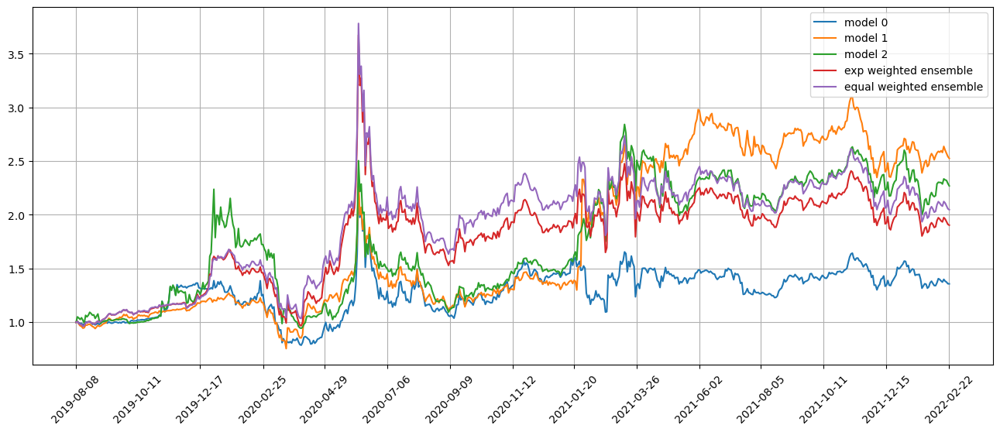

Standardization data are from 2020-07-21 to 2021-05-05
Training data are from 2021-05-06 to 2022-02-17
Testing data are from 2022-01-24 to 2022-03-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 33 out of 67 iterations
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2228692770004272
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.5420856475830078
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2218862771987915
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.5427236557006836
96/96 [==============================] - 1s 4ms/step
Model 2 training loss 1.22058

position on 2022-02-25 market open will be {'FAS': 0.18953426394041048, 'TPX': 0.22366123810007846, 'OKE': 0.2125562840331721, 'HEDJ': 0.18817232462444472, 'KBR': 0.19551738713714742, 'DPST': 0.19703292859626662, 'EXP': 0.19000629057718896, 'TSCO': 0.18971881698531362, 'AAP': 0.19071717214248446, 'DE': 0.1890055276042642}
Total asset on 2022-02-25 will be 1.9659222337407292
It should be the same as 1.965922233740771
Testing data from 2022-01-27 to 2022-02-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-25 are ['URI', 'FTEC', 'VGT', 'TECL', 'PWR', 'JBT', 'EPI', 'UCO', 'BCC', 'COKE']
position on 2022-02-28 market open will be {'JBT': 0.13304098906672376, 'UCO': 0.14153600014464765, 'COKE': 0.14478505267800723, 'URI': 0.13578508673596712, 'FTEC': 0.1345845807305196, 'PWR': 0.1335397355487868, 'VGT': 0.1347114683628053, 'TECL': 0.1335583570821406, 'BCC': 0.13889552070760317, 'EPI': 0.13489225194983018}
Total asset on 2022-02-28 will be 1.3653290430070202
It sh

position on 2022-03-03 market open will be {'MTZ': 0.13698752096470543, 'AIN': 0.1422741926517082, 'EPAM': 0.1564759987758063, 'AZO': 0.14269777963630206, 'FBP': 0.14336811288230888, 'LHX': 0.13952317028163447, 'ING': 0.1408419555284394, 'CAR': 0.1405730732906202, 'AAP': 0.14252620644932937, 'AER': 0.1387683172478367}
Total asset on 2022-03-03 will be 1.4240363277086798
It should be the same as 1.424036327708691
top_stocks by model 1 to buy on 2022-03-02 are ['AER', 'SCHW', 'AIN', 'DFS', 'BBVA', 'FSS', 'ING', 'AZO', 'CAR', 'EPAM']
position on 2022-03-03 market open will be {'AIN': 0.2644185896952211, 'BBVA': 0.2528265541744808, 'AZO': 0.26520583206850057, 'DFS': 0.2595209350222698, 'ING': 0.2617567568414514, 'SCHW': 0.2665566747182079, 'CAR': 0.2612570354176771, 'EPAM': 0.2908128462815289, 'FSS': 0.26484169936083635, 'AER': 0.25790287090841174}
Total asset on 2022-03-03 will be 2.6450997944885604
It should be the same as 2.6450997944885857
top_stocks by model 2 to buy on 2022-03-02 are

top_stocks by model 1 to buy on 2022-03-07 are ['EWQ', 'VGK', 'IEUR', 'ALLY', 'AUPH', 'WK', 'SYF', 'RSPT', 'BURL', 'CAR']
position on 2022-03-08 market open will be {'ALLY': 0.23789244178905128, 'WK': 0.24459243168256128, 'IEUR': 0.25518467531350864, 'AUPH': 0.25046198914658013, 'RSPT': 0.24812099742239196, 'SYF': 0.24613452569431898, 'VGK': 0.2549873305837436, 'BURL': 0.23440561904332677, 'CAR': 0.23929788961713985, 'EWQ': 0.2546744199782466}
Total asset on 2022-03-08 will be 2.465752320270844
It should be the same as 2.465752320270869
top_stocks by model 2 to buy on 2022-03-07 are ['TD', 'GNR', 'EC', 'OLN', 'PVH', 'CNQ', 'BURL', 'WTI', 'WK', 'CAR']
position on 2022-03-08 market open will be {'WK': 0.21950769033537462, 'GNR': 0.23022919222418606, 'TD': 0.23053776407387663, 'OLN': 0.21907802508468976, 'PVH': 0.20131144711857127, 'BURL': 0.21036560977738084, 'EC': 0.2402098264905798, 'WTI': 0.2506685224973232, 'CAR': 0.21475614225120304, 'CNQ': 0.234061090538462}
Total asset on 2022-03-

position on 2022-03-11 market open will be {'HEDJ': 0.26188582181405995, 'DBA': 0.2523045592027871, 'SM': 0.2538711868354085, 'GSG': 0.24482720044201753, 'BNO': 0.24252707246766447, 'USO': 0.24821413377999454, 'STX': 0.255937021056602, 'MTDR': 0.25548747824153534, 'OVV': 0.2578340691840815, 'DBC': 0.2501381308978356}
Total asset on 2022-03-11 will be 2.523026673921961
It should be the same as 2.5230266739219864
top_stocks by model 2 to buy on 2022-03-10 are ['STX', 'LNG', 'DBA', 'MTDR', 'USO', 'BNO', 'HEDJ', 'UCO', 'GSG', 'DBC']
position on 2022-03-11 market open will be {'UCO': 0.21099080144271895, 'HEDJ': 0.236777260389405, 'DBA': 0.22811461077953282, 'LNG': 0.22887165755616523, 'USO': 0.22441635892791617, 'BNO': 0.21927455022719103, 'STX': 0.2313988067709675, 'GSG': 0.2213541511637359, 'MTDR': 0.2309923643166112, 'DBC': 0.22615589092473792}
Total asset on 2022-03-11 will be 2.2583464524989503
It should be the same as 2.258346452498982
top_stocks by return weighted ensemble to buy on

top_stocks by model 1 to buy on 2022-03-15 are ['GWW', 'SHW', 'APO', 'MORN', 'YUMC', 'TXRH', 'HYMB', 'SBUX', 'ARCC', 'CACC']
position on 2022-03-16 market open will be {'YUMC': 0.31302251300360123, 'SBUX': 0.26640571076672065, 'HYMB': 0.24376057371615342, 'GWW': 0.2494178209404001, 'MORN': 0.2483604499768299, 'CACC': 0.25656097652844706, 'SHW': 0.24900933255469493, 'APO': 0.24941610730476899, 'TXRH': 0.24419403868363088, 'ARCC': 0.24490988234367642}
Total asset on 2022-03-16 will be 2.5650574058188993
It should be the same as 2.5650574058189237
top_stocks by model 2 to buy on 2022-03-15 are ['SRLN', 'XLP', 'ETN', 'SBUX', 'GWW', 'CACC', 'HYMB', 'VDC', 'UCO', 'YUMC']
position on 2022-03-16 market open will be {'YUMC': 0.2808135415287263, 'SBUX': 0.2426125354827932, 'VDC': 0.22559341188135762, 'HYMB': 0.2219898765300942, 'UCO': 0.23057298497350853, 'GWW': 0.2271418647850657, 'CACC': 0.23364705224360963, 'XLP': 0.22540089599770116, 'ETN': 0.22456984257267884, 'SRLN': 0.22180912301543373}
T

top_stocks by model 1 to buy on 2022-03-18 are ['WAL', 'FBP', 'REET', 'DPST', 'NAIL', 'NDSN', 'EXP', 'OXM', 'YANG', 'CAR']
position on 2022-03-21 market open will be {'YANG': 0.252443615188973, 'CAR': 0.2730369686500932, 'NDSN': 0.2686198042444819, 'NAIL': 0.281378623610285, 'WAL': 0.2701072476697974, 'DPST': 0.27034852991285935, 'FBP': 0.2702102898202438, 'EXP': 0.2684193105477068, 'REET': 0.26716820586906725, 'OXM': 0.26851523981745407}
Total asset on 2022-03-21 will be 2.6902478353309376
It should be the same as 2.690247835330962
top_stocks by model 2 to buy on 2022-03-18 are ['MGPI', 'GEN', 'FAS', 'EXP', 'TDY', 'ALLY', 'EXTR', 'OXM', 'CAR', 'YANG']
position on 2022-03-21 market open will be {'YANG': 0.2287607598744792, 'CAR': 0.247422159500701, 'ALLY': 0.2480955324479291, 'EXTR': 0.2553157883722545, 'GEN': 0.2502341908580556, 'FAS': 0.2482802170605173, 'EXP': 0.2436814057443086, 'MGPI': 0.2460315452270914, 'OXM': 0.24376849403634074, 'TDY': 0.24270364464850075}
Total asset on 2022-

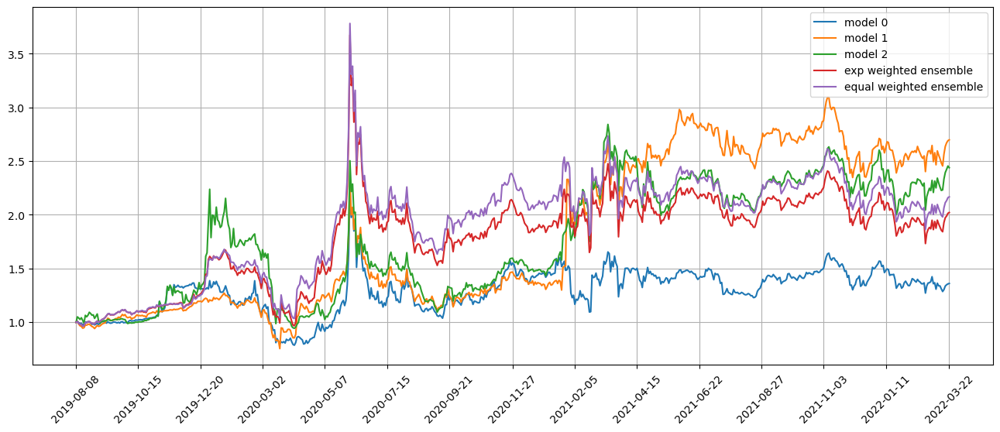

Standardization data are from 2020-08-18 to 2021-06-03
Training data are from 2021-06-04 to 2022-03-18
Testing data are from 2022-02-22 to 2022-04-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 34 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.263831377029419
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3337225914001465
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2618823051452637
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3324389457702637
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.2600324

position on 2022-03-25 market open will be {'ODP': 0.20635413629212027, 'KEY': 0.20394576496397632, 'DPST': 0.20521559595643057, 'BOKF': 0.2047198770082894, 'PPBI': 0.20613018661309498, 'CMA': 0.20452723865998262, 'CBU': 0.20554317716941878, 'CAR': 0.20845995733979264, 'CFG': 0.20392146474139627, 'SFNC': 0.20304167917161478}
Total asset on 2022-03-25 will be 2.05185907791609
It should be the same as 2.0518590779161165
top_stocks by equal weighted ensemble to buy on 2022-03-24 are ['CMA', 'ODP', 'PPBI', 'KEY', 'SFNC', 'CBU', 'CFG', 'BOKF', 'DPST', 'CAR']
position on 2022-03-25 market open will be {'ODP': 0.22126312152685917, 'KEY': 0.21868074655034522, 'DPST': 0.22004232220979425, 'BOKF': 0.21951078781054936, 'PPBI': 0.2210229915932584, 'CMA': 0.21930423143596914, 'CBU': 0.22039357100490792, 'CAR': 0.22352108711338536, 'CFG': 0.21865469064859075, 'SFNC': 0.21771134100248252}
Total asset on 2022-03-25 will be 2.2001048908961014
It should be the same as 2.2001048908961423
Testing data fro

Testing data from 2022-03-02 to 2022-03-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-03-30 are ['SNV', 'FBP', 'EXP', 'WD', 'RF', 'CMA', 'KEY', 'FITB', 'DPST', 'CFG']
position on 2022-03-31 market open will be {'FBP': 0.12580808445212685, 'FITB': 0.12350306386210778, 'CFG': 0.12515591123500425, 'KEY': 0.1278476116504453, 'DPST': 0.1185051652116044, 'SNV': 0.12884536144122907, 'EXP': 0.12698155216492638, 'CMA': 0.12760609694750955, 'WD': 0.1256590748341379, 'RF': 0.12800580397076097}
Total asset on 2022-03-31 will be 1.2579177257698408
It should be the same as 1.2579177257698524
top_stocks by model 1 to buy on 2022-03-30 are ['IEP', 'ASB', 'WSFS', 'WD', 'CMA', 'HI', 'FITB', 'DPST', 'KEY', 'CFG']
position on 2022-03-31 market open will be {'DPST': 0.24336597033061336, 'CFG': 0.25387592543856213, 'WSFS': 0.2533917342562836, 'KEY': 0.25793398654295707, 'IEP': 0.2667084433406708, 'FITB': 0.2551227977724689, 'CMA': 0.2574467279283239, 'WD': 0.2535185890362002, 'A

position on 2022-04-05 market open will be {'MLKN': 0.12161826089092401, 'KEY': 0.121350420167574, 'UCO': 0.12420479419436126, 'ANGL': 0.12293406267317347, 'STX': 0.12330758751120996, 'FALN': 0.12281130906009202, 'BCRX': 0.12163205525550591, 'CFG': 0.11985420755484034, 'SMFG': 0.12236922203880878, 'SRLN': 0.1227780216513059}
Total asset on 2022-04-05 will be 1.2228599409977843
It should be the same as 1.2228599409977956
top_stocks by model 1 to buy on 2022-04-04 are ['DINO', 'BLKB', 'SM', 'FALN', 'SMFG', 'WERN', 'HYMB', 'MLKN', 'UCO', 'CWEB']
position on 2022-04-05 market open will be {'DINO': 0.24838273141610484, 'HYMB': 0.2518517590715785, 'WERN': 0.2512552670519477, 'SM': 0.24727702404596816, 'MLKN': 0.2503061834526601, 'UCO': 0.2556296050738362, 'CWEB': 0.2592197782913756, 'FALN': 0.25276163160421244, 'BLKB': 0.25544606163634104, 'SMFG': 0.2518517590715785}
Total asset on 2022-04-05 will be 2.5239818007155796
It should be the same as 2.5239818007156027
top_stocks by model 2 to buy 

top_stocks by model 0 to buy on 2022-04-07 are ['PCH', 'MTZ', 'HUN', 'CBU', 'TFIN', 'AX', 'GMS', 'CBOE', 'ENOV', 'UCO']
position on 2022-04-08 market open will be {'AX': 0.11982957017015598, 'UCO': 0.11926970041693065, 'ENOV': 0.11640360758077577, 'HUN': 0.11841081737834017, 'CBOE': 0.12444914700117997, 'PCH': 0.12174320846001664, 'GMS': 0.12475625934805233, 'CBU': 0.11937704194327682, 'MTZ': 0.12113597431450362, 'TFIN': 0.11927866224323845}
Total asset on 2022-04-08 will be 1.2046539888564591
It should be the same as 1.2046539888564705
top_stocks by model 1 to buy on 2022-04-07 are ['TFIN', 'FIBK', 'WKC', 'AX', 'COOP', 'GPRE', 'FCNCA', 'HUN', 'ENOV', 'UCO']
position on 2022-04-08 market open will be {'WKC': 0.24514533203505165, 'AX': 0.2406401935702668, 'UCO': 0.23951587037025054, 'COOP': 0.23597593173111325, 'HUN': 0.23779107255642926, 'ENOV': 0.23376021979165543, 'GPRE': 0.23676397129312596, 'FIBK': 0.2391538541450853, 'TFIN': 0.23953386739397678, 'FCNCA': 0.24033523149534144}
Total

position on 2022-04-13 market open will be {'HWC': 0.11896281099790196, 'WSFS': 0.11742236195626443, 'UMBF': 0.11822742786657112, 'LXP': 0.11843055844250436, 'CATY': 0.11873635947292545, 'USB': 0.1175532247364586, 'INDB': 0.11979596776067424, 'FULT': 0.11781236333827015, 'ORI': 0.11843344412825041, 'SFNC': 0.11852843577267926}
Total asset on 2022-04-13 will be 1.1839029544724888
It should be the same as 1.1839029544725
top_stocks by model 1 to buy on 2022-04-12 are ['WSFS', 'USB', 'CBU', 'CVBF', 'FULT', 'MCY', 'ORI', 'CAR', 'LXP', 'CWEB']
position on 2022-04-13 market open will be {'CWEB': 0.22724233363234642, 'WSFS': 0.23508257895465298, 'CVBF': 0.2409964298745395, 'LXP': 0.2371010141669048, 'FULT': 0.2358633717197647, 'ORI': 0.23710679138374774, 'CBU': 0.24081898772106522, 'MCY': 0.2370138274211767, 'CAR': 0.24254236035669713, 'USB': 0.23534456959548747}
Total asset on 2022-04-13 will be 2.3691122648263576
It should be the same as 2.3691122648263825
top_stocks by model 2 to buy on 20

Testing data from 2022-03-18 to 2022-04-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-04-18 are ['BPOP', 'CADE', 'WGO', 'DORM', 'WTFC', 'BFH', 'MTG', 'ABCB', 'SNA', 'NMIH']
position on 2022-04-19 market open will be {'WTFC': 0.12161195187504084, 'BFH': 0.12434479522457108, 'BPOP': 0.12058911736875937, 'ABCB': 0.12079662802132125, 'CADE': 0.12118772229538843, 'SNA': 0.12377543377711585, 'MTG': 0.12291517614908064, 'WGO': 0.12151835945738046, 'NMIH': 0.12270988510199034, 'DORM': 0.1207443802059384}
Total asset on 2022-04-19 will be 1.220193449476576
It should be the same as 1.2201934494765867
top_stocks by model 1 to buy on 2022-04-18 are ['NMIH', 'EWBC', 'SHOO', 'GS', 'BPOP', 'SGH', 'CZR', 'MORN', 'KWEB', 'CWEB']
position on 2022-04-19 market open will be {'CWEB': 0.2120058348632601, 'BPOP': 0.24041369525151118, 'MORN': 0.23754971629238658, 'EWBC': 0.24080213203862363, 'GS': 0.24536104556767013, 'KWEB': 0.2341573181748502, 'SGH': 0.24583212133989227, 'SHOO':

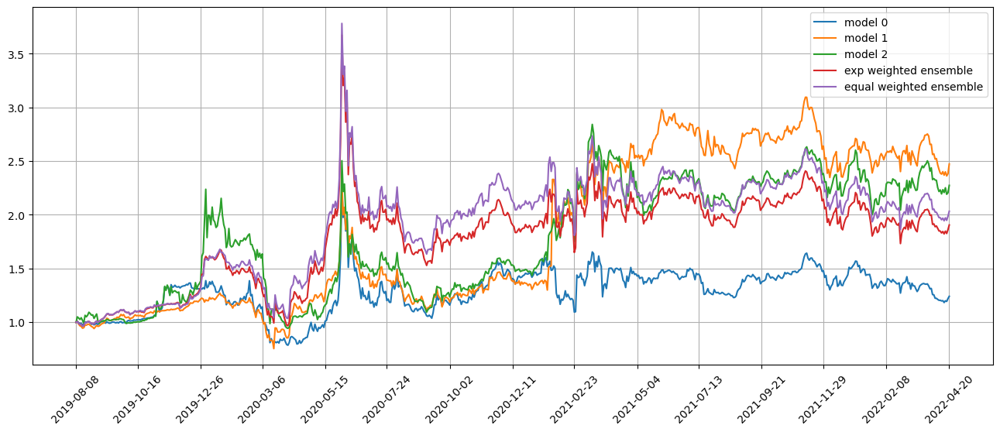

Standardization data are from 2020-09-16 to 2021-07-01
Training data are from 2021-07-02 to 2022-04-18
Testing data are from 2022-03-22 to 2022-05-16
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 35 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2630443572998047
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.5247279405593872
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 1.264478087425232
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.5217843055725098
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.2700974

position on 2022-04-25 market open will be {'CWEB': 0.17133350130774982, 'BLMN': 0.18371746151376328, 'TT': 0.18170077847860452, 'JEF': 0.1802321059240869, 'NAVI': 0.18331591161798402, 'MFA': 0.17944721487660192, 'ARR': 0.18254192859573834, 'AA': 0.16880437726547606, 'VRNT': 0.18901166831770128, 'CAKE': 0.1845750870534008}
Total asset on 2022-04-25 will be 1.8046800349510772
It should be the same as 1.804680034951107
top_stocks by equal weighted ensemble to buy on 2022-04-22 are ['BLMN', 'CAKE', 'ARR', 'VRNT', 'TT', 'CWEB', 'AA', 'MFA', 'JEF', 'NAVI']
position on 2022-04-25 market open will be {'CWEB': 0.18284184781107854, 'BLMN': 0.19605762960508513, 'TT': 0.19390548743917355, 'JEF': 0.19233816521878022, 'NAVI': 0.19562910789524893, 'MFA': 0.1915005536112596, 'ARR': 0.19480313699707874, 'AA': 0.1801428443488068, 'VRNT': 0.20170744442435554, 'CAKE': 0.19697286122762483}
Total asset on 2022-04-25 will be 1.9258990785784496
It should be the same as 1.9258990785784922
Testing data from 20

position on 2022-04-28 market open will be {'DINO': 0.1833727671314667, 'MFC': 0.180276628259403, 'AVY': 0.18662887669615427, 'IBTX': 0.1827976508211353, 'NTRS': 0.18190455343317338, 'BOKF': 0.1727696398771302, 'BMO': 0.18160320856741427, 'EXP': 0.1836768929415829, 'CMA': 0.18581114356963235, 'FHB': 0.17895080738521946}
Total asset on 2022-04-28 will be 1.817792168682282
It should be the same as 1.8177921686823117
top_stocks by equal weighted ensemble to buy on 2022-04-27 are ['IBTX', 'NTRS', 'MFC', 'FHB', 'BMO', 'EXP', 'CMA', 'DINO', 'AVY', 'BOKF']
position on 2022-04-28 market open will be {'DINO': 0.19568978235216536, 'MFC': 0.1923856780869347, 'AVY': 0.19916460242493927, 'IBTX': 0.19507603589811723, 'NTRS': 0.1941229498090348, 'BOKF': 0.18437445076224704, 'BMO': 0.1938013638281074, 'EXP': 0.196014336071457, 'CMA': 0.19829194275985113, 'FHB': 0.19097080279020692}
Total asset on 2022-04-28 will be 1.939891944783017
It should be the same as 1.9398919447830605
Testing data from 2022-03

position on 2022-05-03 market open will be {'FCX': 0.1895977251686084, 'IYZ': 0.18929879914954065, 'ARES': 0.1914028939872678, 'SWK': 0.19267955458648378, 'TROW': 0.18980179098398914, 'ALGN': 0.19512423840973392, 'EC': 0.18958904833678436, 'CMCSA': 0.19095099494472345, 'LBRDK': 0.18907593718135263, 'TDOC': 0.20463023847360337}
Total asset on 2022-05-03 will be 1.922151221222044
It should be the same as 1.9221512212220877
Testing data from 2022-04-04 to 2022-05-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-03 are ['BOKF', 'DE', 'AIT', 'BMO', 'VRSN', 'PNFP', 'DFS', 'RILY', 'WU', 'KOLD']
position on 2022-05-04 market open will be {'RILY': 0.12826420748523804, 'PNFP': 0.11951264469301497, 'DFS': 0.12066363257035984, 'AIT': 0.12575426073459395, 'BOKF': 0.1203644570586002, 'BMO': 0.1207892474788885, 'KOLD': 0.10645772046974927, 'VRSN': 0.12346505304481765, 'WU': 0.11854234239557598, 'DE': 0.12075812942112245}
Total asset on 2022-05-04 will be 1.204571695351949

position on 2022-05-06 market open will be {'CHGG': 0.1964326265845284, 'FN': 0.19286655555187415, 'SLM': 0.19355994909450774, 'ALGN': 0.1874491078604052, 'EL': 0.1915308486589232, 'ACN': 0.19080560070982833, 'CAR': 0.19020033642825396, 'FHLC': 0.19543664173509478, 'ROK': 0.19531047587852327, 'SFNC': 0.20326857379254212}
Total asset on 2022-05-06 will be 1.9368607162944371
It should be the same as 1.9368607162944815
Testing data from 2022-04-07 to 2022-05-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-06 are ['PLCE', 'JHG', 'EOG', 'ICE', 'EPI', 'IAG', 'INDA', 'IDXX', 'JCI', 'UCO']
position on 2022-05-09 market open will be {'PLCE': 0.11641669201462085, 'UCO': 0.11384195589992406, 'IDXX': 0.1131983092726704, 'JHG': 0.1189177803849088, 'ICE': 0.11448327334268434, 'JCI': 0.11589807666133034, 'IAG': 0.11799566570845188, 'EPI': 0.11701783499016133, 'INDA': 0.11724204481123841, 'EOG': 0.12143801038663501}
Total asset on 2022-05-09 will be 1.1664496434726128
It 

Testing data from 2022-04-12 to 2022-05-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-11 are ['SLG', 'WK', 'ALGN', 'AYI', 'PR', 'SRLN', 'MUR', 'AIV', 'BHC', 'GKOS']
position on 2022-05-12 market open will be {'WK': 0.11015551442935627, 'PR': 0.11421180334171874, 'SLG': 0.11603131215658055, 'SRLN': 0.11532166091045667, 'ALGN': 0.11475160941138869, 'GKOS': 0.11008913288411971, 'AIV': 0.11571786436085123, 'BHC': 0.12630834644163175, 'MUR': 0.1132837828416057, 'AYI': 0.11400872039089732}
Total asset on 2022-05-12 will be 1.1498797471685935
It should be the same as 1.1498797471686066
top_stocks by model 1 to buy on 2022-05-11 are ['JCI', 'MTDR', 'BHC', 'PR', 'TRGP', 'ERX', 'WK', 'AIV', 'SRLN', 'GUSH']
position on 2022-05-12 market open will be {'WK': 0.2173715252048192, 'GUSH': 0.21781630054981269, 'PR': 0.22537586082178085, 'TRGP': 0.22689119485955728, 'MTDR': 0.21772755015861966, 'JCI': 0.22877691051660923, 'BHC': 0.24924615035703795, 'AIV': 0.2283477935704

top_stocks by model 0 to buy on 2022-05-16 are ['PRKS', 'CYBR', 'UUUU', 'HASI', 'TYL', 'HHH', 'CMA', 'AXSM', 'ASND', 'ZLAB']
position on 2022-05-17 market open will be {'ASND': 0.12712546826844706, 'AXSM': 0.13514950318285035, 'HHH': 0.12342573307024718, 'ZLAB': 0.12431551565857613, 'CMA': 0.12293688882154988, 'PRKS': 0.12429227312140913, 'UUUU': 0.12940518126192038, 'HASI': 0.12762615843581443, 'CYBR': 0.12329134903911572, 'TYL': 0.1213728222840068}
Total asset on 2022-05-17 will be 1.258940893143924
It should be the same as 1.2589408931439368
top_stocks by model 1 to buy on 2022-05-16 are ['RRR', 'CIBR', 'FCX', 'CMP', 'CMG', 'CYBR', 'GLOB', 'TYL', 'HHH', 'PRKS']
position on 2022-05-17 market open will be {'HHH': 0.25450940530129335, 'FCX': 0.2524629895046508, 'GLOB': 0.23841796859061468, 'PRKS': 0.24438002550191482, 'CMP': 0.25131154448750864, 'CMG': 0.24294090415431246, 'CYBR': 0.2424120362889618, 'TYL': 0.23863988211102952, 'RRR': 0.24416143143650915, 'CIBR': 0.24036222106222102}
T

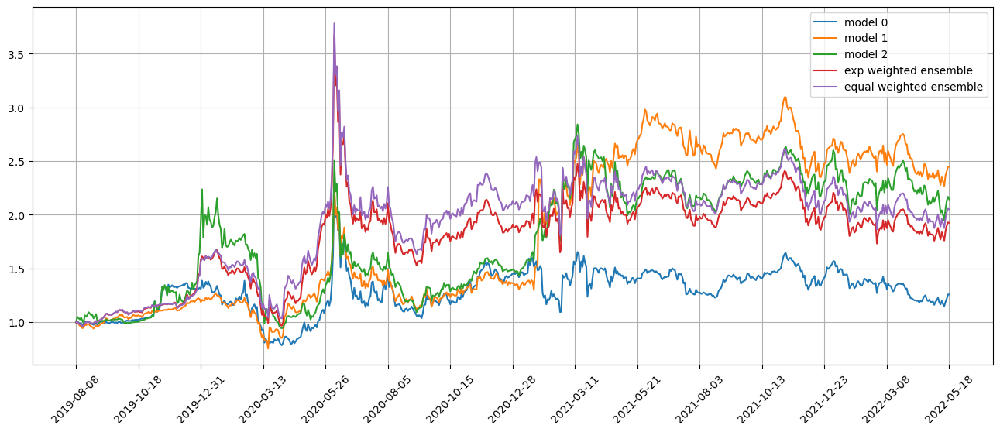

Standardization data are from 2020-10-14 to 2021-07-30
Training data are from 2021-08-02 to 2022-05-16
Testing data are from 2022-04-20 to 2022-06-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 36 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.300699234008789
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4812021255493164
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3045567274093628
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.485565423965454
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3004790544

position on 2022-05-23 market open will be {'TGT': 0.1912442979238839, 'HYMB': 0.1903351015794746, 'KOLD': 0.1848149681766415, 'DKS': 0.18316889662600397, 'TGI': 0.18796980952821013, 'IBN': 0.1906994647115005, 'TSCO': 0.18442159214519238, 'BBWI': 0.18453442294116457, 'DLTR': 0.17985429823744642, 'CAR': 0.1844091045515116}
Total asset on 2022-05-23 will be 1.8614519564210004
It should be the same as 1.8614519564210297
top_stocks by equal weighted ensemble to buy on 2022-05-20 are ['LOW', 'HYMB', 'TSCO', 'BBWI', 'DLTR', 'DKS', 'TGI', 'CAR', 'KOLD', 'TGT']
position on 2022-05-23 market open will be {'TGT': 0.20384018788986144, 'HYMB': 0.20287110930459076, 'KOLD': 0.19698740431455522, 'DKS': 0.19523291783937857, 'TGI': 0.200350032433917, 'LOW': 0.1994397828737283, 'TSCO': 0.19656811942589478, 'BBWI': 0.19668838157697804, 'DLTR': 0.191700010633058, 'CAR': 0.19655480936400108}
Total asset on 2022-05-23 will be 1.9802327556559192
It should be the same as 1.9802327556559631
Testing data from 2

position on 2022-05-26 market open will be {'KOLD': 0.1589473697189197, 'SIGA': 0.1655112633763768, 'M': 0.24430623665612905, 'PLCE': 0.2274244948299133, 'WK': 0.20712877063523147, 'DKS': 0.2406182439259475, 'CALX': 0.21278459050168688, 'KSS': 0.21940922597370666, 'RH': 0.21565350999999996, 'HTGC': 0.20041609509775893}
Total asset on 2022-05-26 will be 2.092199800715626
It should be the same as 2.09219980071567
Testing data from 2022-04-28 to 2022-05-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-26 are ['PAGP', 'DKS', 'MGM', 'CAL', 'BBWI', 'AR', 'GUSH', 'CAR', 'ANF', 'BOIL']
position on 2022-05-27 market open will be {'DKS': 0.15873965712523316, 'CAL': 0.13136324363086946, 'GUSH': 0.13208281209113182, 'PAGP': 0.12919533167091318, 'AR': 0.13143206121562884, 'BBWI': 0.1379263019655116, 'CAR': 0.13807819486879133, 'MGM': 0.13800412858723932, 'BOIL': 0.11197954221171061, 'ANF': 0.12334146529481461}
Total asset on 2022-05-27 will be 1.3321427386618312
It shou

Testing data from 2022-05-03 to 2022-05-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-01 are ['IOVA', 'RRC', 'CARG', 'VET', 'BOOT', 'BHC', 'AR', 'AEO', 'DKS', 'ANF']
position on 2022-06-02 market open will be {'IOVA': 0.12770911347887612, 'CARG': 0.13427396151067209, 'AR': 0.1368082324676779, 'DKS': 0.13324353099894856, 'BHC': 0.1316305718364466, 'BOOT': 0.1338193745686724, 'VET': 0.1367586275225002, 'AEO': 0.1360275274829369, 'RRC': 0.137587160723426, 'ANF': 0.13363467546217234}
Total asset on 2022-06-02 will be 1.341492776052317
It should be the same as 1.3414927760523292
top_stocks by model 1 to buy on 2022-06-01 are ['CVNA', 'BOIL', 'SUN', 'RRC', 'UCO', 'AEO', 'AR', 'ANF', 'KOLD', 'SIGA']
position on 2022-06-02 market open will be {'CVNA': 0.15925220765220005, 'KOLD': 0.18990359842150006, 'SIGA': 0.2792258722073031, 'UCO': 0.25356912937770215, 'AR': 0.26069283786885494, 'SUN': 0.25385613694980724, 'AEO': 0.2592051774091046, 'RRC': 0.2621771127098093,

top_stocks by model 0 to buy on 2022-06-06 are ['IYW', 'DXCM', 'TDY', 'NSIT', 'CLM', 'R', 'CIEN', 'RSPT', 'KOLD', 'SIGA']
position on 2022-06-07 market open will be {'KOLD': 0.11250791246924037, 'R': 0.1382067930690555, 'IYW': 0.13663826069751886, 'RSPT': 0.13638960697500413, 'NSIT': 0.14072084129995413, 'CLM': 0.13703631156400303, 'DXCM': 0.13566707463863859, 'SIGA': 0.13220904933774574, 'CIEN': 0.13932749622394625, 'TDY': 0.1376113073895618}
Total asset on 2022-06-07 will be 1.3463146536646557
It should be the same as 1.3463146536646684
top_stocks by model 1 to buy on 2022-06-06 are ['FTEC', 'VGT', 'CVNA', 'IWY', 'CIEN', 'XLG', 'TDY', 'CLM', 'KOLD', 'SIGA']
position on 2022-06-07 market open will be {'CVNA': 0.14713320721621634, 'KOLD': 0.1711699994551884, 'SIGA': 0.24853410551106428, 'FTEC': 0.26785959387730496, 'CLM': 0.2686602223621768, 'VGT': 0.2674780331790846, 'XLG': 0.26918805576139665, 'IWY': 0.268155795166589, 'CIEN': 0.27315209880855695, 'TDY': 0.2697875039168893}
Total ass

top_stocks by model 0 to buy on 2022-06-09 are ['MXL', 'ZROZ', 'TVTX', 'VIRT', 'PTCT', 'HDV', 'EEMV', 'TGT', 'UNG', 'BOIL']
position on 2022-06-10 market open will be {'EEMV': 0.13542552403405958, 'TVTX': 0.13145367422763715, 'TGT': 0.1321648866925284, 'HDV': 0.13278020327648354, 'UNG': 0.14816376441700232, 'MXL': 0.1338907894076934, 'BOIL': 0.1609634394305225, 'PTCT': 0.1328249126423955, 'ZROZ': 0.1378477223204667, 'VIRT': 0.13650545427124872}
Total asset on 2022-06-10 will be 1.3820203707200254
It should be the same as 1.3820203707200378
top_stocks by model 1 to buy on 2022-06-09 are ['FFIN', 'WSFS', 'CVNA', 'ZROZ', 'LYG', 'TGT', 'EEMV', 'UNG', 'BOIL', 'SIGA']
position on 2022-06-10 market open will be {'SIGA': 0.2416111458185519, 'EEMV': 0.24922561990755251, 'CVNA': 0.2324265353481142, 'WSFS': 0.24144677903286765, 'TGT': 0.24097502927570869, 'UNG': 0.27014563672307645, 'LYG': 0.237066351213987, 'FFIN': 0.23859478434373738, 'ZROZ': 0.25133649150733245, 'BOIL': 0.29348316712385686}
To

top_stocks by model 0 to buy on 2022-06-14 are ['IHI', 'IYH', 'LH', 'ERJ', 'AFG', 'BXP', 'XLV', 'CAR', 'VHT', 'KOLD']
position on 2022-06-15 market open will be {'IYH': 0.1342345714516028, 'CAR': 0.14225655171820767, 'ERJ': 0.13513342578395984, 'LH': 0.1340566829329446, 'BXP': 0.1352230763667507, 'KOLD': 0.13968912475995787, 'IHI': 0.13305749042006584, 'VHT': 0.13411923910503043, 'XLV': 0.1341317075845666, 'AFG': 0.13655854927336417}
Total asset on 2022-06-15 will be 1.3584604193964376
It should be the same as 1.3584604193964505
top_stocks by model 1 to buy on 2022-06-14 are ['BXP', 'RWR', 'FFIN', 'MCO', 'CVNA', 'AMH', 'VHT', 'FHLC', 'KOLD', 'SIGA']
position on 2022-06-15 market open will be {'SIGA': 0.23676507623454146, 'KOLD': 0.30385056165079766, 'FHLC': 0.245846821817558, 'BXP': 0.24782089574508176, 'MCO': 0.24141529984659002, 'CVNA': 0.2528846083786922, 'VHT': 0.2457979130833474, 'FFIN': 0.24610583527426366, 'RWR': 0.2477027187056873, 'AMH': 0.2455184706755782}
Total asset on 2022

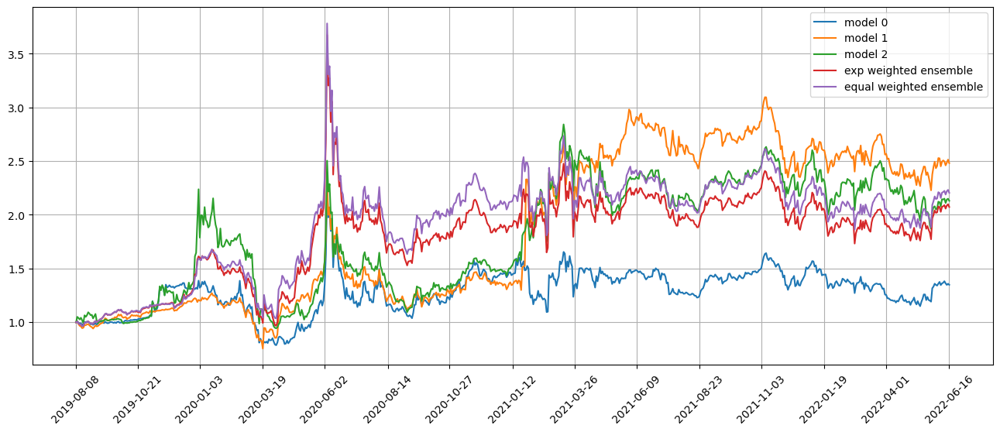

Standardization data are from 2020-11-11 to 2021-08-27
Training data are from 2021-08-30 to 2022-06-14
Testing data are from 2022-05-18 to 2022-07-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 37 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.331235408782959
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4404804706573486
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 1.326849102973938
11/11 [==============================] - 0s 4ms/step
Model 1 test loss 1.4328529834747314
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.3339239358

position on 2022-06-22 market open will be {'SIGA': 0.21359119337909238, 'FBP': 0.20883175960092326, 'KR': 0.22457034164881387, 'AR': 0.20233817166061258, 'NAVI': 0.211190300681412, 'UBS': 0.21357319441517084, 'VYMI': 0.21243502649137821, 'UNG': 0.21594175541486252, 'IXJ': 0.21591047861179125, 'BOIL': 0.21705730468109818}
Total asset on 2022-06-22 will be 2.1354395265851234
It should be the same as 2.135439526585155
top_stocks by equal weighted ensemble to buy on 2022-06-21 are ['BRK-B', 'VYMI', 'KR', 'UBS', 'FBP', 'NAVI', 'IXJ', 'SIGA', 'AR', 'BOIL']
position on 2022-06-22 market open will be {'SIGA': 0.22717231299993956, 'FBP': 0.22244902903298336, 'KR': 0.23921387505831815, 'AR': 0.2155320144226443, 'BRK-B': 0.2238000851724051, 'UBS': 0.2274996380623194, 'VYMI': 0.2262872537487074, 'NAVI': 0.22496136324063332, 'IXJ': 0.2299893292908276, 'BOIL': 0.2312109363206901}
Total asset on 2022-06-22 will be 2.2681158373494252
It should be the same as 2.2681158373494683
Testing data from 2022-

position on 2022-06-27 market open will be {'KOLD': 0.27433873086414734, 'GUSH': 0.23786552747004217, 'UCO': 0.23914662147021587, 'GSG': 0.2354445993478675, 'DBO': 0.2361550323473317, 'AR': 0.24463967242193987, 'USO': 0.23667113852907137, 'VET': 0.24906898746157782, 'DBC': 0.2336378018648542, 'ERX': 0.2381527236977103}
Total asset on 2022-06-27 will be 2.425120835474714
It should be the same as 2.425120835474758
Testing data from 2022-05-26 to 2022-06-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-27 are ['CLM', 'DE', 'SPYD', 'AMAT', 'PFG', 'SFBS', 'EMN', 'RHI', 'CNH', 'MTZ']
position on 2022-06-28 market open will be {'RHI': 0.13902279803599382, 'AMAT': 0.13945312037644556, 'EMN': 0.13949405810103616, 'CLM': 0.13941567727349966, 'SPYD': 0.1408029262668504, 'CNH': 0.14324257621633607, 'MTZ': 0.1425557750757983, 'PFG': 0.14593814729631094, 'SFBS': 0.1400858656926134, 'DE': 0.13958732642419255}
Total asset on 2022-06-28 will be 1.4095982707590633
It should 

position on 2022-06-30 market open will be {'SIGA': 0.22870723153730993, 'UCO': 0.23093556054756287, 'KOLD': 0.251904905169171, 'BECN': 0.2532003942198011, 'NKE': 0.2502704022226306, 'SSRM': 0.2485062468079031, 'CLM': 0.25314604595082474, 'SQ': 0.24496258520042005, 'AEHR': 0.24523629663130447, 'SYK': 0.25100315461576433}
Total asset on 2022-06-30 will be 2.4578728229026483
It should be the same as 2.4578728229026923
Testing data from 2022-06-01 to 2022-06-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-30 are ['GOLD', 'NOK', 'GFI', 'CENX', 'WAB', 'CSTM', 'CMC', 'EPI', 'FCX', 'SWBI']
position on 2022-07-01 market open will be {'CSTM': 0.13886015595536344, 'CMC': 0.1369583301457766, 'CENX': 0.13796009471883058, 'GFI': 0.13344910091970497, 'FCX': 0.13560564254971663, 'NOK': 0.1398048180336594, 'WAB': 0.1411156753382903, 'EPI': 0.1393118735168242, 'SWBI': 0.1352835716184439, 'GOLD': 0.133399775856448}
Total asset on 2022-07-01 will be 1.371749038653044
It shou

position on 2022-07-06 market open will be {'SIGA': 0.25837734920632804, 'UNG': 0.23797750950005553, 'GTN': 0.25262017616373217, 'UCO': 0.21215316090027495, 'IRWD': 0.2542173194256622, 'KOLD': 0.24558092114202035, 'MUFG': 0.24251036722617095, 'MCY': 0.24505944981126182, 'BOIL': 0.24283235682903218, 'BMA': 0.24742239253710094}
Total asset on 2022-07-06 will be 2.4387510027415953
It should be the same as 2.438751002741639
Testing data from 2022-06-06 to 2022-07-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-06 are ['FEZ', 'NUE', 'STLD', 'PICK', 'IDV', 'DDS', 'DEM', 'ASML', 'CEIX', 'CAR']
position on 2022-07-07 market open will be {'IDV': 0.13438909319179387, 'CEIX': 0.134523922053349, 'NUE': 0.1420699005238573, 'PICK': 0.13675908438207465, 'STLD': 0.13959177779207602, 'DEM': 0.1344303773737061, 'ASML': 0.13460322052226878, 'FEZ': 0.1346224735199935, 'CAR': 0.13028074852473845, 'DDS': 0.1300756940485652}
Total asset on 2022-07-07 will be 1.3513462919324086
I

position on 2022-07-11 market open will be {'SIGA': 0.2600256879851764, 'UHS': 0.25241636344574936, 'FMX': 0.25567471763169697, 'CIG': 0.25491938843947737, 'WPM': 0.25583231279669044, 'MUFG': 0.25836102710552306, 'PHYS': 0.2580805024529629, 'ASR': 0.25928894750003606, 'HCA': 0.25446790227923144, 'KRNT': 0.25531825331172286}
Total asset on 2022-07-11 will be 2.564385102948221
It should be the same as 2.5643851029482665
Testing data from 2022-06-09 to 2022-07-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-11 are ['IRM', 'GGAL', 'PM', 'MCY', 'ELME', 'EGP', 'EQR', 'SGH', 'MO', 'AVB']
position on 2022-07-12 market open will be {'PM': 0.13716177412123517, 'ELME': 0.1380764558853054, 'MO': 0.13938054376658832, 'AVB': 0.1379233401496635, 'GGAL': 0.1357697662810356, 'IRM': 0.13654351546550592, 'MCY': 0.1409340592541646, 'SGH': 0.13693098475050247, 'EQR': 0.13739550043467247, 'EGP': 0.13796605554420505}
Total asset on 2022-07-12 will be 1.3780819956528647
It should

Testing data from 2022-06-14 to 2022-07-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-14 are ['EPI', 'PDBC', 'AXP', 'BOIL', 'CRK', 'DBO', 'KRNT', 'DBC', 'COMT', 'GSG']
position on 2022-07-15 market open will be {'KRNT': 0.1309863578713068, 'AXP': 0.13945363719259543, 'CRK': 0.14128051346968204, 'GSG': 0.13881978534051057, 'DBO': 0.1401332374573765, 'COMT': 0.13919834957572533, 'EPI': 0.13807261635502655, 'DBC': 0.13827403593324525, 'BOIL': 0.12990876384114053, 'PDBC': 0.13831722742285402}
Total asset on 2022-07-15 will be 1.374444524459449
It should be the same as 1.374444524459463
top_stocks by model 1 to buy on 2022-07-14 are ['EPI', 'KRNT', 'UCO', 'DBC', 'COMT', 'DBO', 'USO', 'BNO', 'GSG', 'SIGA']
position on 2022-07-15 market open will be {'SIGA': 0.31522522739639625, 'KRNT': 0.2525418004327605, 'UCO': 0.27822214911046284, 'GSG': 0.2649670554188802, 'DBO': 0.26747405785362677, 'BNO': 0.272304160795306, 'USO': 0.26967644729997275, 'COMT': 0.2656896256

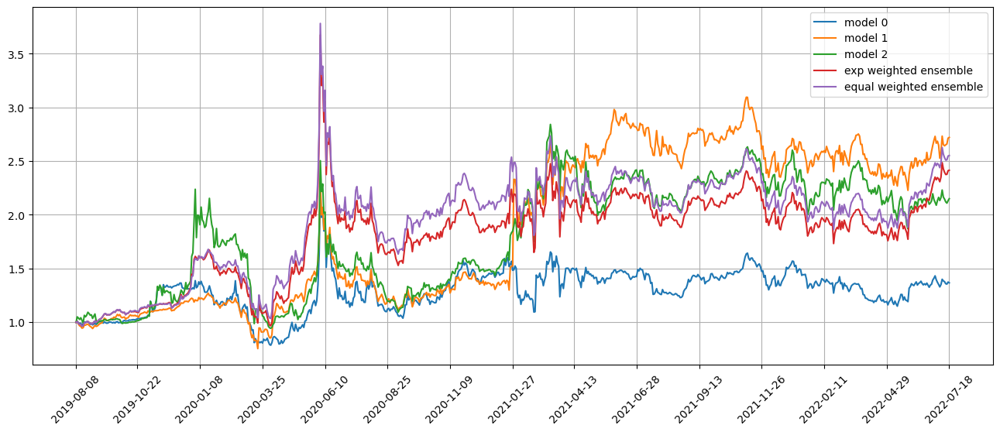

Standardization data are from 2020-12-10 to 2021-09-27
Training data are from 2021-09-28 to 2022-07-14
Testing data are from 2022-06-16 to 2022-08-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 38 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3508083820343018
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.346960186958313
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3473892211914062
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3542661666870117
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.352831721

position on 2022-07-21 market open will be {'SIGA': 0.29649522767912934, 'VET': 0.2554068495351845, 'SXT': 0.2513790566129099, 'POR': 0.24294391449214092, 'SCO': 0.2588292141868265, 'KOLD': 0.2209898835899027, 'FAF': 0.24954205356089493, 'BCPC': 0.24897016399950672, 'FUL': 0.24891607251349065, 'BCC': 0.25111138777126313}
Total asset on 2022-07-21 will be 2.524583823941202
It should be the same as 2.5245838239412492
Testing data from 2022-06-22 to 2022-07-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-21 are ['CEIX', 'CSTM', 'PAYX', 'GMS', 'GNTX', 'LMT', 'FAST', 'THRM', 'FCFS', 'KALU']
position on 2022-07-22 market open will be {'CSTM': 0.14244406582935315, 'CEIX': 0.14244802956569688, 'FCFS': 0.139156369581491, 'GNTX': 0.13635575670000463, 'FAST': 0.13907497099954574, 'GMS': 0.13984334162045287, 'KALU': 0.1370129675130824, 'PAYX': 0.14057281750431813, 'THRM': 0.14367754115203787, 'LMT': 0.1400230241909157}
Total asset on 2022-07-22 will be 1.4006088846568

Testing data from 2022-06-27 to 2022-07-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-26 are ['CVNA', 'SCO', 'MAT', 'AR', 'COKE', 'RHI', 'UNG', 'SNAP', 'CEIX', 'UCO']
position on 2022-07-27 market open will be {'RHI': 0.13687594198857111, 'CEIX': 0.1420155663545663, 'SCO': 0.1434473536315012, 'UCO': 0.13787009981861528, 'COKE': 0.1412336047293609, 'AR': 0.13835508285028886, 'UNG': 0.13349873458653008, 'CVNA': 0.15097812349074693, 'MAT': 0.1431074769813602, 'SNAP': 0.13959387048494867}
Total asset on 2022-07-27 will be 1.406975854916475
It should be the same as 1.4069758549164897
top_stocks by model 1 to buy on 2022-07-26 are ['AR', 'BTU', 'BNO', 'ARCH', 'RHI', 'CEIX', 'USO', 'XENE', 'SIGA', 'UCO']
position on 2022-07-27 market open will be {'SIGA': 0.38883933098172285, 'XENE': 0.2667039467946346, 'RHI': 0.2704621005475992, 'CEIX': 0.2806178195282858, 'ARCH': 0.2672317935284186, 'UCO': 0.2724265218409485, 'AR': 0.2733848314428458, 'BNO': 0.275460028857366

top_stocks by model 0 to buy on 2022-07-29 are ['REGN', 'LNTH', 'MUFG', 'JDST', 'JNPR', 'SHW', 'RNR', 'CEIX', 'BTU', 'UCO']
position on 2022-08-01 market open will be {'CEIX': 0.1388195935081661, 'JDST': 0.1379382757983618, 'LNTH': 0.1489220538371798, 'REGN': 0.14390115557289299, 'UCO': 0.12972238819964965, 'JNPR': 0.1442815232932741, 'SHW': 0.1431867909622112, 'MUFG': 0.1470946866962497, 'BTU': 0.1337925245089522, 'RNR': 0.1448595232997913}
Total asset on 2022-08-01 will be 1.4125185156767142
It should be the same as 1.412518515676729
top_stocks by model 1 to buy on 2022-07-29 are ['SHW', 'UCO', 'LNTH', 'GLNG', 'CEIX', 'MUFG', 'JNPR', 'BTU', 'XENE', 'SIGA']
position on 2022-08-01 market open will be {'SIGA': 0.4294540073041454, 'XENE': 0.26897240976804443, 'CEIX': 0.27430268834619204, 'GLNG': 0.2664488384395619, 'LNTH': 0.2885911009988544, 'UCO': 0.2520687628641129, 'JNPR': 0.2803592007935567, 'SHW': 0.27823198259947235, 'MUFG': 0.2858255711600296, 'BTU': 0.25997760757791205}
Total as

position on 2022-08-04 market open will be {'NEM': 0.1401632491905073, 'KOLD': 0.12676040037210268, 'GSK': 0.13908862662431315, 'ATRA': 0.14923284204432036, 'UCO': 0.12750062873517223, 'RYTM': 0.1723200496733879, 'SNAP': 0.1452972763510537, 'GRMN': 0.14108553737164317, 'ZWS': 0.14007102521486603, 'TRU': 0.1428762302167815}
Total asset on 2022-08-04 will be 1.4243958657941331
It should be the same as 1.4243958657941478
top_stocks by model 1 to buy on 2022-08-03 are ['AR', 'JNPR', 'KOS', 'BNO', 'UCO', 'XENE', 'RYTM', 'KOLD', 'GSK', 'SIGA']
position on 2022-08-04 market open will be {'SIGA': 0.4079928388596018, 'XENE': 0.2755346685100501, 'RYTM': 0.38226073759722257, 'KOLD': 0.2517356777264888, 'KOS': 0.2672886182193285, 'GSK': 0.2659932291297815, 'UCO': 0.24383233033819846, 'JNPR': 0.2716407725871939, 'BNO': 0.25360221318760967, 'AR': 0.2619290872050237}
Total asset on 2022-08-04 will be 2.881810173360465
It should be the same as 2.881810173360499
top_stocks by model 2 to buy on 2022-08-

top_stocks by model 1 to buy on 2022-08-08 are ['FLR', 'AGO', 'RYTM', 'GUSH', 'UCO', 'XENE', 'WMB', 'KOLD', 'GSK', 'SIGA']
position on 2022-08-09 market open will be {'SIGA': 0.5122987091411672, 'KOLD': 0.2712473686584172, 'UCO': 0.30676878659238027, 'GUSH': 0.3112997023843475, 'XENE': 0.2926469900615995, 'GSK': 0.2841873776036145, 'FLR': 0.29679861185388995, 'RYTM': 0.2745154953843645, 'WMB': 0.2915543847330614, 'AGO': 0.28910923121905974}
Total asset on 2022-08-09 will be 3.1304266576318667
It should be the same as 3.130426657631902
top_stocks by model 2 to buy on 2022-08-08 are ['KR', 'CAR', 'SIGI', 'FLR', 'FTNT', 'AGO', 'UNM', 'ECPG', 'WMB', 'GSK']
position on 2022-08-09 market open will be {'GSK': 0.21605595382732837, 'FLR': 0.22656286351293958, 'WMB': 0.2225596537068504, 'KR': 0.2177142104381022, 'FTNT': 0.21633022092445656, 'SIGI': 0.218345536017959, 'UNM': 0.21973554476979712, 'CAR': 0.2153758522633358, 'AGO': 0.22069313223493175, 'ECPG': 0.2155740364128359}
Total asset on 2022

position on 2022-08-12 market open will be {'SIGA': 0.5681438835826278, 'KOLD': 0.20487277970640927, 'XENE': 0.2802316604768381, 'GSK': 0.2714777572453195, 'CEIX': 0.3140173909341122, 'RYTM': 0.26233112504385286, 'AZPN': 0.2974089340957699, 'UCO': 0.29060674268847914, 'ISTB': 0.2938665137957132, 'VTNR': 0.27055007453560037}
Total asset on 2022-08-12 will be 3.0535068621046872
It should be the same as 3.0535068621047223
top_stocks by model 2 to buy on 2022-08-11 are ['MWA', 'LNTH', 'BDN', 'VRNT', 'SEM', 'KOLD', 'KN', 'AZPN', 'GSK', 'ISTB']
position on 2022-08-12 market open will be {'KOLD': 0.1653308784449351, 'GSK': 0.2013312417840318, 'LNTH': 0.2251596955236332, 'AZPN': 0.21926476079436594, 'BDN': 0.21928523935713337, 'KN': 0.2140714531650307, 'SEM': 0.21506769339137063, 'VRNT': 0.21957215226337462, 'MWA': 0.21925899847520341, 'ISTB': 0.2166531111407112}
Total asset on 2022-08-12 will be 2.1149952243397534
It should be the same as 2.1149952243397903
top_stocks by return weighted ensem

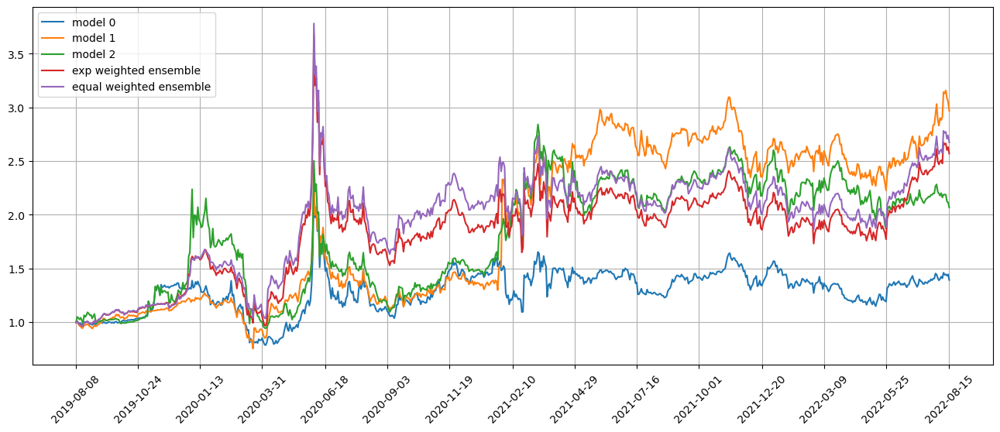

Standardization data are from 2021-01-11 to 2021-10-25
Training data are from 2021-10-26 to 2022-08-11
Testing data are from 2022-07-18 to 2022-09-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 39 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3474966287612915
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3898569345474243
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3538987636566162
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3933407068252563
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.36075842

Testing data from 2022-07-21 to 2022-08-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-18 are ['TRP', 'SNY', 'FCN', 'LRCX', 'MCY', 'MTZ', 'FORM', 'SLM', 'AFG', 'ISTB']
position on 2022-08-19 market open will be {'SNY': 0.13468760053758624, 'SLM': 0.1349721860996674, 'FORM': 0.13913966761638719, 'LRCX': 0.1350348406312308, 'MCY': 0.13752014390870032, 'MTZ': 0.13626428664853818, 'FCN': 0.13577990833607714, 'AFG': 0.13555420221027417, 'ISTB': 0.1361429691318262, 'TRP': 0.13593713073075678}
Total asset on 2022-08-19 will be 1.3610329358510291
It should be the same as 1.3610329358510445
top_stocks by model 1 to buy on 2022-08-18 are ['CYH', 'UFPI', 'KOLD', 'NVO', 'KRYS', 'VET', 'NFG', 'SCO', 'TDW', 'SIGA']
position on 2022-08-19 market open will be {'SIGA': 0.5272984368020421, 'SCO': 0.2439076505906413, 'TDW': 0.2826940259700786, 'NFG': 0.2640546367663385, 'KOLD': 0.269969651677806, 'CYH': 0.26256648050419196, 'KRYS': 0.278726617803033, 'UFPI': 0.2642165375914

top_stocks by model 0 to buy on 2022-08-23 are ['DK', 'RGR', 'ISTB', 'TS', 'TRP', 'SEM', 'WTI', 'PBR-A', 'FORM', 'AZPN']
position on 2022-08-24 market open will be {'AZPN': 0.14214076236446016, 'PBR-A': 0.14433697682390012, 'TS': 0.14403045757112512, 'RGR': 0.13993417926885113, 'FORM': 0.14146129510268685, 'SEM': 0.14061800389717052, 'DK': 0.14280398187429752, 'WTI': 0.14966820186736415, 'ISTB': 0.14143140551008201, 'TRP': 0.14281337306451403}
Total asset on 2022-08-24 will be 1.4292386373444348
It should be the same as 1.4292386373444517
top_stocks by model 1 to buy on 2022-08-23 are ['FORM', 'NOV', 'ENPH', 'TS', 'VTNR', 'PBR-A', 'TRP', 'SCO', 'PBR', 'SIGA']
position on 2022-08-24 market open will be {'SIGA': 0.49060677023846055, 'VTNR': 0.2701223206342979, 'NOV': 0.2814675000748953, 'SCO': 0.2683255804495257, 'ENPH': 0.2790930898430473, 'PBR-A': 0.28156426893303954, 'TS': 0.28096632881249234, 'FORM': 0.27595455450410705, 'PBR': 0.280806076116662, 'TRP': 0.278592110390613}
Total asset

position on 2022-08-29 market open will be {'GUSH': 0.1432210511059806, 'UCO': 0.15294556658408356, 'SM': 0.14446002025732105, 'GSG': 0.14863471590121202, 'DBO': 0.15013495398343793, 'USO': 0.1506589498367739, 'BNO': 0.15105017154280606, 'NXE': 0.13870305137949457, 'DBC': 0.14849831355952997, 'ISTB': 0.14717119034659054}
Total asset on 2022-08-29 will be 1.4754779844972128
It should be the same as 1.47547798449723
top_stocks by model 1 to buy on 2022-08-26 are ['GSG', 'GUSH', 'NXE', 'DBO', 'USO', 'ISTB', 'SM', 'SIGA', 'BNO', 'UCO']
position on 2022-08-29 market open will be {'SIGA': 0.35699373400215173, 'GUSH': 0.277466060583513, 'UCO': 0.2963056304648707, 'SM': 0.2798663494164203, 'GSG': 0.28795410149965583, 'DBO': 0.2908605537802257, 'USO': 0.2918757052824978, 'BNO': 0.29263362979673124, 'NXE': 0.2687132161088705, 'ISTB': 0.28511877340320424}
Total asset on 2022-08-29 will be 2.9277877543381017
It should be the same as 2.9277877543381408
top_stocks by model 2 to buy on 2022-08-26 are

top_stocks by model 1 to buy on 2022-08-31 are ['PACB', 'SWX', 'NFG', 'SLF', 'DG', 'SNY', 'SPB', 'CVNA', 'SIGA', 'ISTB']
position on 2022-09-01 market open will be {'SIGA': 0.3436093555334528, 'NFG': 0.2805336838604651, 'SWX': 0.2782380246369004, 'SNY': 0.26994366766706746, 'SPB': 0.2683007451608715, 'CVNA': 0.26662755346818845, 'DG': 0.2775583237334569, 'SLF': 0.27366260475385024, 'ISTB': 0.2771642452197508, 'PACB': 0.27768171865915353}
Total asset on 2022-09-01 will be 2.813319922693117
It should be the same as 2.813319922693157
top_stocks by model 2 to buy on 2022-08-31 are ['MMM', 'BRK-A', 'IVZ', 'SNY', 'SLF', 'SPB', 'DG', 'PACB', 'CVNA', 'ISTB']
position on 2022-09-01 market open will be {'IVZ': 0.20658944523443956, 'PACB': 0.21288176238399387, 'MMM': 0.2123138263787877, 'BRK-A': 0.2079459602181708, 'SNY': 0.20694946716280757, 'SPB': 0.20568993794256157, 'CVNA': 0.20440720316958275, 'DG': 0.21278716296499578, 'SLF': 0.20980055107662218, 'ISTB': 0.2124850468267044}
Total asset on 2

top_stocks by model 1 to buy on 2022-09-06 are ['CEIX', 'DBO', 'KT', 'ARCH', 'SMTC', 'BHP', 'BNO', 'USO', 'UCO', 'SIGA']
position on 2022-09-07 market open will be {'SIGA': 0.3094560979872166, 'ARCH': 0.25894989805971114, 'CEIX': 0.2647080317879125, 'KT': 0.2737894028512539, 'UCO': 0.25575197257549365, 'DBO': 0.2646948609750947, 'BNO': 0.2641059110898826, 'USO': 0.264757655624147, 'BHP': 0.26663806322727046, 'SMTC': 0.2721697008552545}
Total asset on 2022-09-07 will be 2.6950215950331966
It should be the same as 2.695021595033237
top_stocks by model 2 to buy on 2022-09-06 are ['WSM', 'VRTX', 'JNJ', 'CAR', 'KT', 'UCO', 'CME', 'FOXF', 'BNO', 'SMTC']
position on 2022-09-07 market open will be {'KT': 0.20727198718366366, 'UCO': 0.19361676905612069, 'FOXF': 0.21013061018541787, 'BNO': 0.19994110965752904, 'WSM': 0.20257719670107255, 'JNJ': 0.2083032461378632, 'CAR': 0.19832808635752258, 'SMTC': 0.20604579344548404, 'VRTX': 0.20827337791014844, 'CME': 0.21114303683632873}
Total asset on 2022

position on 2022-09-12 market open will be {'SIGA': 0.32237895754707196, 'UCO': 0.2982450731223596, 'GSG': 0.2778812856236999, 'LPG': 0.28760711399956634, 'ORI': 0.2773224162081919, 'CNX': 0.27974667359117855, 'BTU': 0.28052705246632414, 'SQM': 0.2731777854743792, 'ENB': 0.2781958712101398, 'DBC': 0.2806794198446531}
Total asset on 2022-09-12 will be 2.8557616490875244
It should be the same as 2.855761649087565
top_stocks by model 2 to buy on 2022-09-09 are ['DBC', 'MWA', 'HUN', 'AM', 'ORI', 'KFY', 'RH', 'TRP', 'LPG', 'ENB']
position on 2022-09-12 market open will be {'AM': 0.22027880558853355, 'LPG': 0.2239534074129917, 'HUN': 0.22040271773552636, 'ORI': 0.21594493682072863, 'KFY': 0.21636790292269578, 'RH': 0.2202154289791538, 'ENB': 0.2166250772428061, 'DBC': 0.21855896257491922, 'MWA': 0.21701847215596679, 'TRP': 0.2172204298726315}
Total asset on 2022-09-12 will be 2.186586141305913
It should be the same as 2.1865861413059533
top_stocks by return weighted ensemble to buy on 2022-0

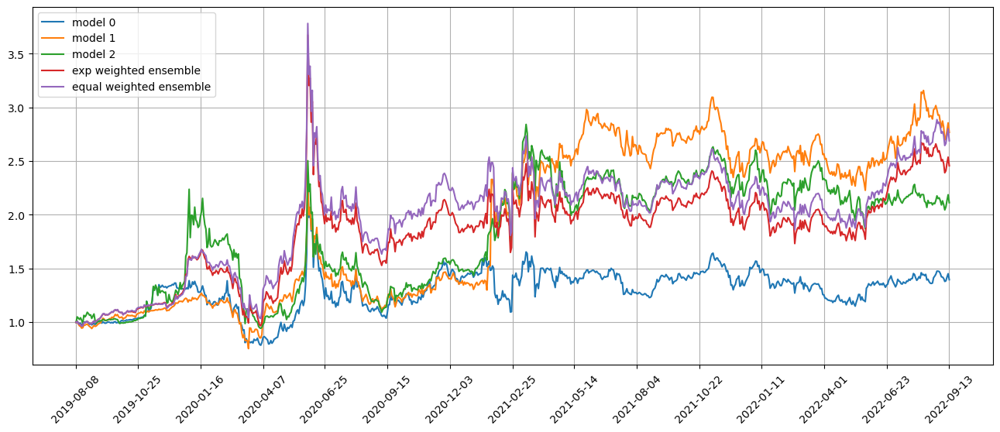

Standardization data are from 2021-02-09 to 2021-11-22
Training data are from 2021-11-23 to 2022-09-09
Testing data are from 2022-08-15 to 2022-10-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 40 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3336299657821655
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4121638536453247
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.354051947593689
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4242022037506104
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.357616543

position on 2022-09-16 market open will be {'AVT': 0.19949586269798467, 'VRNT': 0.2028850144413641, 'TPL': 0.19941904385230153, 'PARR': 0.20114467096706812, 'LPG': 0.20626857112092764, 'HUN': 0.20003314761217914, 'KSA': 0.2065975787322701, 'INGR': 0.206909489669142, 'EVRI': 0.20696611998935718, 'LIT': 0.20108515422704082}
Total asset on 2022-09-16 will be 2.0308046533095943
It should be the same as 2.0308046533096347
top_stocks by return weighted ensemble to buy on 2022-09-15 are ['BPOP', 'KFY', 'LPG', 'SIGA', 'PARR', 'MT', 'ENLC', 'HUN', 'TPL', 'VRNT']
position on 2022-09-16 market open will be {'SIGA': 0.2273248210504621, 'VRNT': 0.23149190007433634, 'TPL': 0.22775509911596675, 'PARR': 0.22972592580818552, 'BPOP': 0.23662386045766437, 'HUN': 0.22845646273699585, 'LPG': 0.2355778964367626, 'ENLC': 0.2349648978118709, 'KFY': 0.2331629413679327, 'MT': 0.23713000138389767}
Total asset on 2022-09-16 will be 2.3222138062440414
It should be the same as 2.3222138062440743
top_stocks by equal

position on 2022-09-21 market open will be {'PKG': 0.2510309949104874, 'SSD': 0.2601002659412218, 'NUE': 0.2507975594496157, 'FDX': 0.2488139084875037, 'RS': 0.259451689635087, 'BCC': 0.2554432855123242, 'CE': 0.25133848885514004, 'PAVE': 0.2548377520162264, 'VRNT': 0.25288395092616034, 'AYI': 0.25846437168003406}
Total asset on 2022-09-21 will be 2.5431622674137553
It should be the same as 2.5431622674138
Testing data from 2022-08-23 to 2022-09-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-21 are ['WY', 'OMCL', 'TX', 'MT', 'HESM', 'NSA', 'EMN', 'SIGA', 'MHK', 'PBF']
position on 2022-09-22 market open will be {'SIGA': 0.11066660443683513, 'TX': 0.13477498451862144, 'MT': 0.13136977327731475, 'NSA': 0.12788632387499796, 'PBF': 0.1297002893516386, 'HESM': 0.12986776418219742, 'EMN': 0.12723693823855983, 'WY': 0.12967552453240164, 'OMCL': 0.13035968398100306, 'MHK': 0.12598164015496152}
Total asset on 2022-09-22 will be 1.2775195265485133
It should be the s

Testing data from 2022-08-26 to 2022-09-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-26 are ['NUE', 'DLR', 'RPD', 'AA', 'BNO', 'VOX', 'UCO', 'TRU', 'XLRE', 'ORCL']
position on 2022-09-27 market open will be {'TRU': 0.12636478807337598, 'UCO': 0.11750560605350703, 'NUE': 0.12212588692931668, 'BNO': 0.12042305832914894, 'RPD': 0.11945449905433345, 'VOX': 0.12166074707652474, 'XLRE': 0.12024759327556851, 'ORCL': 0.12139676182541681, 'AA': 0.12154497953129195, 'DLR': 0.12139888529168331}
Total asset on 2022-09-27 will be 1.2121228054401496
It should be the same as 1.2121228054401676
top_stocks by model 1 to buy on 2022-09-26 are ['MMC', 'FDX', 'PAVE', 'SSD', 'KOLD', 'NUE', 'ORCL', 'TRU', 'XLRE', 'NEOG']
position on 2022-09-27 market open will be {'NEOG': 0.24966466024863448, 'XLRE': 0.26070123733096995, 'FDX': 0.2548793386297188, 'PAVE': 0.2618293227931756, 'SSD': 0.2597071993806433, 'NUE': 0.2634797033375885, 'KOLD': 0.25835289479548107, 'MMC': 0.262026781

top_stocks by model 0 to buy on 2022-09-29 are ['UNG', 'TECH', 'TNDM', 'RWT', 'ROK', 'HPP', 'SPXL', 'SIGA', 'UPRO', 'CIM']
position on 2022-09-30 market open will be {'SIGA': 0.12178586226699872, 'HPP': 0.12272981002937186, 'CIM': 0.10588181467250857, 'TECH': 0.12119979981342176, 'SPXL': 0.11601603606822039, 'RWT': 0.11665016621043231, 'UNG': 0.12068916928159351, 'UPRO': 0.11610475265550328, 'ROK': 0.12150157275225013, 'TNDM': 0.12093008742820366}
Total asset on 2022-09-30 will be 1.183489071178486
It should be the same as 1.1834890711785042
top_stocks by model 1 to buy on 2022-09-29 are ['FSK', 'BCS', 'MPLX', 'NLY', 'TTE', 'OKE', 'SIGA', 'CIM', 'FDX', 'HPP']
position on 2022-09-30 market open will be {'SIGA': 0.2610342336861598, 'HPP': 0.26466687408621625, 'OKE': 0.2671875102796532, 'FSK': 0.257168872566125, 'NLY': 0.25935117688365783, 'CIM': 0.24789130159395306, 'FDX': 0.2759601492603182, 'MPLX': 0.26632849685464344, 'BCS': 0.2703842677470771, 'TTE': 0.2762505802870858}
Total asset o

position on 2022-10-05 market open will be {'CIM': 0.11969249057778904, 'UDOW': 0.1313861486136363, 'SIGA': 0.11679255812581817, 'SPXL': 0.12419459259128501, 'BDN': 0.12153683451712174, 'RWT': 0.1326030937619593, 'UPRO': 0.12417283392336498, 'HLNE': 0.12469989688815805, 'AGNC': 0.12717870392619582, 'NOMD': 0.12135397148396912}
Total asset on 2022-10-05 will be 1.2436111244092798
It should be the same as 1.2436111244092976
top_stocks by model 1 to buy on 2022-10-04 are ['CIM', 'QUAL', 'OEF', 'BCE', 'XLG', 'NOC', 'MCD', 'AGNC', 'NKE', 'LHX']
position on 2022-10-05 market open will be {'QUAL': 0.2768968614089931, 'OEF': 0.2757595333893698, 'NKE': 0.274887587402362, 'LHX': 0.27862031226413353, 'CIM': 0.30289953547987497, 'MCD': 0.2757802009204569, 'XLG': 0.2751828957384944, 'BCE': 0.2767316172093557, 'AGNC': 0.28380109052760816, 'NOC': 0.2747462743494534}
Total asset on 2022-10-05 will be 2.7953059086900596
It should be the same as 2.7953059086901013
top_stocks by model 2 to buy on 2022-10

top_stocks by model 1 to buy on 2022-10-07 are ['HOG', 'COP', 'KMX', 'RPD', 'CVNA', 'SIGA', 'MTZ', 'VFC', 'NKE', 'CRK']
position on 2022-10-10 market open will be {'KMX': 0.2627234870250423, 'COP': 0.27129285632408406, 'NKE': 0.26783733632530077, 'CRK': 0.2678225569943858, 'RPD': 0.2554830522774395, 'VFC': 0.2623474077573086, 'CVNA': 0.2544859705257173, 'MTZ': 0.2646409609997766, 'SIGA': 0.2652995236362463, 'HOG': 0.2688553924227582}
Total asset on 2022-10-10 will be 2.6407885442880183
It should be the same as 2.640788544288059
top_stocks by model 2 to buy on 2022-10-07 are ['PG', 'BCE', 'VLO', 'VPU', 'BXMT', 'PLD', 'WOR', 'TRNO', 'BNO', 'MTZ']
position on 2022-10-10 market open will be {'BNO': 0.21136197516422275, 'BXMT': 0.19559476319174374, 'TRNO': 0.19645743370629928, 'PLD': 0.1984572958155955, 'VLO': 0.19060509565337255, 'BCE': 0.19776424197822395, 'MTZ': 0.19478602840480522, 'WOR': 0.19963889227049458, 'VPU': 0.1958467895363948, 'PG': 0.1939696583232923}
Total asset on 2022-10-10

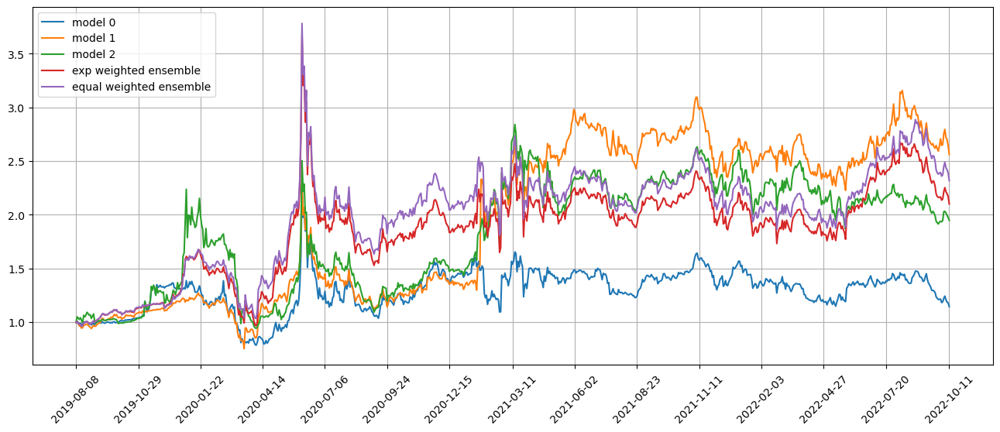

Standardization data are from 2021-03-10 to 2021-12-21
Training data are from 2021-12-22 to 2022-10-07
Testing data are from 2022-09-13 to 2022-11-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 41 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3349623680114746
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4911085367202759
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3633668422698975
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4892820119857788
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.342014

position on 2022-10-14 market open will be {'NTRS': 0.24514213703769988, 'RPD': 0.24367680153234167, 'EXPE': 0.23634399328845856, 'SHOO': 0.23793687662065566, 'TSLA': 0.24647598918726407, 'BOOT': 0.24249666382092894, 'WIT': 0.23437573946907933, 'PDM': 0.24395349068876818, 'USB': 0.2503336972089943, 'NAT': 0.24956292446451667}
Total asset on 2022-10-14 will be 2.4302983133186618
It should be the same as 2.430298313318707
Testing data from 2022-09-16 to 2022-10-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-10-14 are ['XLY', 'SWK', 'IYW', 'MGK', 'UA', 'XLG', 'BN', 'QQQ', 'TRU', 'QLD']
position on 2022-10-17 market open will be {'UA': 0.11761908832710158, 'IYW': 0.11765392818596007, 'QLD': 0.11542460062133089, 'SWK': 0.12193410246254745, 'MGK': 0.11736256213146107, 'XLG': 0.11812551937809297, 'BN': 0.11700021424010103, 'QQQ': 0.11754777849150058, 'XLY': 0.11630327488140266, 'TRU': 0.11553869858734216}
Total asset on 2022-10-17 will be 1.1745097673068228
It shou

Testing data from 2022-09-21 to 2022-10-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-10-19 are ['WIT', 'AEO', 'SYNA', 'LRCX', 'ACLS', 'CEIX', 'TRU', 'CRK', 'MRVL', 'NVMI']
position on 2022-10-20 market open will be {'TRU': 0.11624213493729467, 'CEIX': 0.11201724302913775, 'MRVL': 0.12295726699315193, 'CRK': 0.12163381613163814, 'LRCX': 0.12645057570328774, 'NVMI': 0.11977489360622723, 'ACLS': 0.12188760025006727, 'WIT': 0.12074956805500633, 'AEO': 0.11945382595903117, 'SYNA': 0.12482717247706264}
Total asset on 2022-10-20 will be 1.2059940971418874
It should be the same as 1.205994097141905
top_stocks by model 1 to buy on 2022-10-19 are ['VGT', 'MXL', 'LRCX', 'SGH', 'ASML', 'MRVL', 'NVMI', 'SOXX', 'SMH', 'QTEC']
position on 2022-10-20 market open will be {'MRVL': 0.2823150787268904, 'SOXX': 0.28009552609115435, 'QTEC': 0.27632514712435285, 'VGT': 0.27622937841326867, 'LRCX': 0.2903358630825987, 'MXL': 0.27936553737436093, 'ASML': 0.28496378453262317, 'NVMI

Testing data from 2022-09-26 to 2022-10-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-10-24 are ['NVR', 'SSNC', 'EFX', 'DELL', 'MTN', 'RSPT', 'SSTK', 'WAL', 'BN', 'FUN']
position on 2022-10-25 market open will be {'SSNC': 0.12432936197677998, 'DELL': 0.12452258369940385, 'WAL': 0.13089485301747014, 'FUN': 0.12314726055549384, 'RSPT': 0.1247852025458133, 'MTN': 0.12425010308928401, 'EFX': 0.12681352389511327, 'SSTK': 0.12545911195794365, 'BN': 0.12379112884757476, 'NVR': 0.12452284356344129}
Total asset on 2022-10-25 will be 1.2525159731483004
It should be the same as 1.252515973148318
top_stocks by model 1 to buy on 2022-10-24 are ['SSTK', 'GBX', 'QTWO', 'LEG', 'WB', 'CFG', 'VSAT', 'LGIH', 'NVR', 'HELE']
position on 2022-10-25 market open will be {'GBX': 0.2798415015581032, 'WB': 0.2734402586007392, 'QTWO': 0.27518829474330275, 'VSAT': 0.27310736095365, 'LGIH': 0.28832055252554156, 'LEG': 0.27878266113540784, 'HELE': 0.2698196532879741, 'SSTK': 0.2786057045

top_stocks by model 0 to buy on 2022-10-27 are ['ALGN', 'SSNC', 'RH', 'TRU', 'TFIN', 'SHOO', 'PNR', 'EPAM', 'SGH', 'UNG']
position on 2022-10-28 market open will be {'TFIN': 0.1292547832996046, 'SSNC': 0.13273287437859155, 'PNR': 0.12831758035409824, 'SHOO': 0.13162321983297542, 'UNG': 0.12332963333345534, 'ALGN': 0.1245333479013775, 'RH': 0.12539983620970005, 'EPAM': 0.12938412817711462, 'SGH': 0.12724017488645284, 'TRU': 0.1296123407019177}
Total asset on 2022-10-28 will be 1.28142791907527
It should be the same as 1.281427919075288
top_stocks by model 1 to buy on 2022-10-27 are ['XPO', 'FFIN', 'CMPR', 'RH', 'CVNA', 'KNX', 'UNG', 'SGH', 'ACMR', 'RHI']
position on 2022-10-28 market open will be {'RHI': 0.28630397687912185, 'KNX': 0.275516055756948, 'CMPR': 0.24374915892556545, 'SGH': 0.2783336442709393, 'UNG': 0.2697794648815285, 'CVNA': 0.26975661551371954, 'RH': 0.2743079647161095, 'XPO': 0.2771460334636126, 'FFIN': 0.2862659058553134, 'ACMR': 0.2758089449377413}
Total asset on 2022

position on 2022-11-02 market open will be {'ZTO': 0.13610444129900284, 'EWH': 0.13489321761348275, 'FXI': 0.1349186600606146, 'FFIN': 0.1258617033749036, 'NSP': 0.12995733433707388, 'SXT': 0.12683506065506517, 'FELE': 0.1270825095727972, 'GXC': 0.1301579958371728, 'TFIN': 0.12838897164384622, 'DORM': 0.12815721979393738}
Total asset on 2022-11-02 will be 1.3023571141878787
It should be the same as 1.3023571141878965
top_stocks by model 1 to buy on 2022-11-01 are ['NTES', 'EW', 'FELE', 'CRI', 'GDS', 'ZTO', 'EWH', 'TFIN', 'FFIN', 'DORM']
position on 2022-11-02 market open will be {'EWH': 0.28532552803670397, 'NTES': 0.2974799826431449, 'GDS': 0.27173669667590106, 'FFIN': 0.2692320321610135, 'EW': 0.2767146630975159, 'FELE': 0.2728711754921707, 'ZTO': 0.28106310520181743, 'CRI': 0.2703568083877341, 'TFIN': 0.27567640685139927, 'DORM': 0.27517878998878226}
Total asset on 2022-11-02 will be 2.7756351885361448
It should be the same as 2.7756351885361834
top_stocks by model 2 to buy on 2022-

top_stocks by model 1 to buy on 2022-11-04 are ['CLF', 'GDS', 'AWI', 'CSTM', 'JBT', 'OMCL', 'META', 'AMZN', 'EW', 'ROG']
position on 2022-11-07 market open will be {'META': 0.2788217446155129, 'CSTM': 0.2964238904246746, 'EW': 0.27475325263108363, 'AWI': 0.27422001597705553, 'AMZN': 0.2794548578926734, 'GDS': 0.28879365708683036, 'CLF': 0.29201505999454647, 'JBT': 0.2829978582313557, 'OMCL': 0.2691952725219709, 'ROG': 0.2680643470524592}
Total asset on 2022-11-07 will be 2.804739956428125
It should be the same as 2.804739956428163
top_stocks by model 2 to buy on 2022-11-04 are ['AWI', 'META', 'KRNT', 'JBT', 'NEOG', 'UA', 'ASGN', 'ALGN', 'BBWI', 'HBI']
position on 2022-11-07 market open will be {'JBT': 0.22419893568506177, 'META': 0.22557427981244477, 'UA': 0.23440490736212272, 'NEOG': 0.2326552681617141, 'AWI': 0.22144684946871085, 'ASGN': 0.2269717556625725, 'BBWI': 0.21551531187200962, 'ALGN': 0.2248651145304307, 'KRNT': 0.22558967491939227, 'HBI': 0.23046302037209235}
Total asset on

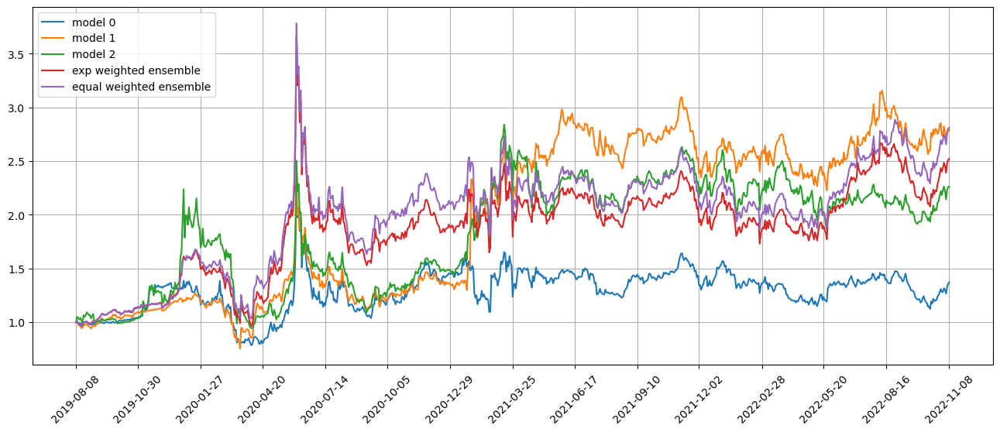

Standardization data are from 2021-04-08 to 2022-01-20
Training data are from 2022-01-21 to 2022-11-04
Testing data are from 2022-10-11 to 2022-12-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 42 out of 67 iterations
Restoring model weights from the end of the best epoch: 26.
Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 100.
Epoch 120: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3255627155303955
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.385793924331665
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3279410600662231
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.383478045463562
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.353244

position on 2022-11-11 market open will be {'SPXL': 0.24393217751753987, 'RPD': 0.24242147235928901, 'EXPE': 0.24431828564053154, 'UPRO': 0.24433761284274086, 'NWL': 0.24061806168190664, 'WM': 0.23122853318748288, 'GWRE': 0.24512992273796164, 'TRU': 0.24844743800978641, 'ECL': 0.2388713211518853, 'TYL': 0.23345332811509795}
Total asset on 2022-11-11 will be 2.4127581532441753
It should be the same as 2.412758153244222
top_stocks by return weighted ensemble to buy on 2022-11-10 are ['QTWO', 'BBWI', 'QTEC', 'ECL', 'VOX', 'EXPE', 'GWRE', 'TYL', 'TRU', 'RPD']
position on 2022-11-11 market open will be {'QTWO': 0.2663322755585501, 'VOX': 0.2604548521814837, 'EXPE': 0.27017848906419417, 'RPD': 0.2680809049843967, 'QTEC': 0.26557542793192096, 'BBWI': 0.27409125930077666, 'GWRE': 0.27107603500136057, 'TRU': 0.27474469721892286, 'ECL': 0.26415498316216757, 'TYL': 0.25816351523498476}
Total asset on 2022-11-11 will be 2.672852439638727
It should be the same as 2.672852439638758
top_stocks by equ

position on 2022-11-16 market open will be {'GUSH': 0.28452513114111905, 'RPD': 0.26607317656524654, 'AR': 0.2853891068059701, 'QLYS': 0.2807257010194404, 'LNC': 0.29084550554539307, 'JKHY': 0.2889648563529042, 'TSLA': 0.27741332907764255, 'WMS': 0.2802185786956845, 'SIGA': 0.2713818594366411, 'COMM': 0.27471670107361285}
Total asset on 2022-11-16 will be 2.800253945713623
It should be the same as 2.8002539457136546
top_stocks by equal weighted ensemble to buy on 2022-11-15 are ['TSLA', 'GUSH', 'SIGA', 'JKHY', 'RPD', 'COMM', 'QLYS', 'AR', 'WMS', 'LNC']
position on 2022-11-16 market open will be {'GUSH': 0.3170144641297662, 'RPD': 0.2964555192360171, 'AR': 0.31797709537894775, 'QLYS': 0.31278118498429397, 'LNC': 0.3240565489425719, 'JKHY': 0.32196115233004124, 'TSLA': 0.3090905801793121, 'WMS': 0.3122161554170675, 'SIGA': 0.30237038956385226, 'COMM': 0.3060860298317689}
Total asset on 2022-11-16 will be 3.120009119993594
It should be the same as 3.1200091199936386
Testing data from 2022

position on 2022-11-21 market open will be {'BDN': 0.31135660299822654, 'HPP': 0.30374466582836235, 'LITE': 0.3111357763033088, 'ALLY': 0.30174166141619485, 'NEOG': 0.3068188556650423, 'NTRS': 0.3128218915986618, 'CIM': 0.30520348272680287, 'ANET': 0.3156214915887524, 'NTRA': 0.30214635842927995, 'DEI': 0.3139634354428884}
Total asset on 2022-11-21 will be 3.084554221997476
It should be the same as 3.0845542219975206
Testing data from 2022-10-24 to 2022-11-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-21 are ['COP', 'NOW', 'ERX', 'WWW', 'PRG', 'TMV', 'MAT', 'GUSH', 'GTLS', 'SIGA']
position on 2022-11-22 market open will be {'SIGA': 0.1375178152209595, 'COP': 0.14773414843120675, 'NOW': 0.14259344424781537, 'GUSH': 0.14916291182878935, 'GTLS': 0.14504950371224548, 'WWW': 0.14341339249788465, 'TMV': 0.14425413027967712, 'PRG': 0.14579836872117566, 'MAT': 0.14397602294405296, 'ERX': 0.1506410108167222}
Total asset on 2022-11-22 will be 1.4501407487005114
It

Testing data from 2022-10-27 to 2022-11-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-25 are ['DEI', 'BDN', 'RHI', 'BRFS', 'CF', 'TEAM', 'NFG', 'CVNA', 'SIGA', 'AQN']
position on 2022-11-28 market open will be {'SIGA': 0.13211318999265917, 'AQN': 0.15291462169080983, 'TEAM': 0.15823031323805106, 'CVNA': 0.15994418743318012, 'BDN': 0.15467345138621388, 'CF': 0.15233443589046802, 'RHI': 0.15093796961161005, 'NFG': 0.14916156134494668, 'BRFS': 0.14562068818054041, 'DEI': 0.15194540635528478}
Total asset on 2022-11-28 will be 1.5078758251237463
It should be the same as 1.5078758251237638
top_stocks by model 1 to buy on 2022-11-25 are ['HPP', 'KTOS', 'NFG', 'MTCH', 'SIGA', 'FFIN', 'TEAM', 'BHC', 'CVNA', 'AQN']
position on 2022-11-28 market open will be {'AQN': 0.30823084503250336, 'TEAM': 0.3277604669763711, 'CVNA': 0.33131060977163396, 'HPP': 0.3208701033440058, 'NFG': 0.31188321365071586, 'KTOS': 0.31394152897312655, 'BHC': 0.32129176108228846, 'SIGA': 0.30

top_stocks by model 0 to buy on 2022-11-30 are ['PBR', 'WB', 'BXP', 'FXI', 'HOUS', 'NTES', 'RILY', 'CARG', 'SIGA', 'ACMR']
position on 2022-12-01 market open will be {'SIGA': 0.13706743336461308, 'CARG': 0.16374012699288576, 'PBR': 0.16135345337486276, 'HOUS': 0.16688767532409085, 'WB': 0.15314398208980912, 'BXP': 0.15800051786393524, 'RILY': 0.15777507230823484, 'NTES': 0.14947808207824662, 'FXI': 0.15353042881291304, 'ACMR': 0.16075692566652125}
Total asset on 2022-12-01 will be 1.5617336978760945
It should be the same as 1.5617336978761127
top_stocks by model 1 to buy on 2022-11-30 are ['BIO', 'SFBS', 'NVMI', 'WB', 'FXI', 'GDS', 'BXP', 'CMPR', 'ACMR', 'CARG']
position on 2022-12-01 market open will be {'CARG': 0.3482010434662384, 'NVMI': 0.3390018908090469, 'SFBS': 0.33951541072272434, 'WB': 0.328207130760565, 'BXP': 0.3386153077591703, 'BIO': 0.34178638959509466, 'CMPR': 0.3547002441941872, 'FXI': 0.329035335489546, 'GDS': 0.353179416639989, 'ACMR': 0.34452264204516436}
Total asset

position on 2022-12-06 market open will be {'SIGA': 0.12400624499151824, 'KOLD': 0.20446591236625514, 'QTWO': 0.15116366976765924, 'PYPL': 0.15411071062265908, 'ICUI': 0.15254457380707073, 'NICE': 0.15303445987351774, 'FIVN': 0.15172916893178076, 'NKTR': 0.14626068243908788, 'JACK': 0.1537431181849776, 'ROG': 0.15732695280160525}
Total asset on 2022-12-06 will be 1.5483854937861126
It should be the same as 1.5483854937861317
top_stocks by model 1 to buy on 2022-12-05 are ['OMCL', 'AQN', 'ACB', 'CWH', 'NKTR', 'PYPL', 'QTWO', 'ICUI', 'NICE', 'ROG']
position on 2022-12-06 market open will be {'PYPL': 0.3267606635326221, 'QTWO': 0.3364981388727679, 'AQN': 0.33820258750079074, 'ICUI': 0.33957210260980913, 'NICE': 0.34066261430400446, 'CWH': 0.32095654233671167, 'NKTR': 0.325583835763318, 'OMCL': 0.33607489453541056, 'ROG': 0.3502179253363845, 'ACB': 0.3363650522932366}
Total asset on 2022-12-06 will be 3.350894357085016
It should be the same as 3.350894357085056
top_stocks by model 2 to buy

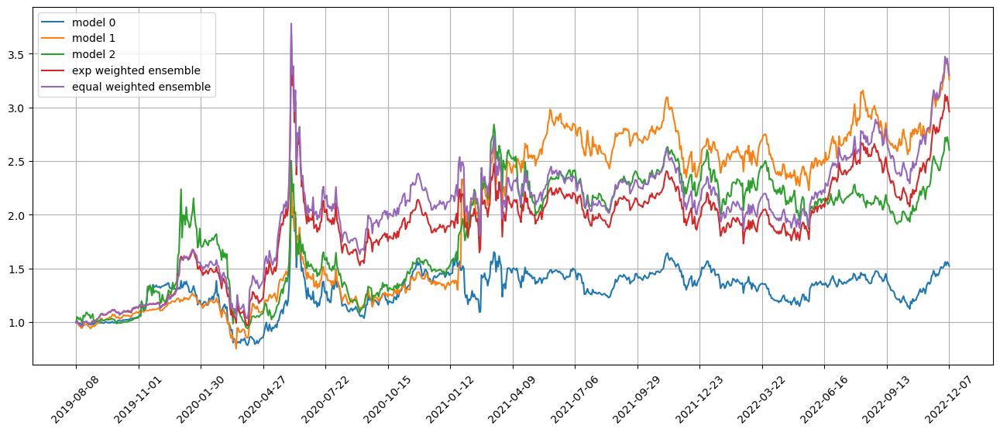

Standardization data are from 2021-05-06 to 2022-02-17
Training data are from 2022-02-18 to 2022-12-05
Testing data are from 2022-11-08 to 2023-01-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 43 out of 67 iterations
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.3081185817718506
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3535228967666626
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3109033107757568
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.352070689201355
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.3432683

position on 2022-12-12 market open will be {'VIAV': 0.2956019675855367, 'VRRM': 0.29577009701113416, 'UMBF': 0.297138477055552, 'NTES': 0.29253728850031113, 'BCPC': 0.2945703834917069, 'SFNC': 0.30062157997360867, 'AVB': 0.29693106113476125, 'SFBS': 0.30152467527280147, 'RRX': 0.2988868568050928, 'TRP': 0.29637270760762124}
Total asset on 2022-12-12 will be 2.9699550944380944
It should be the same as 2.9699550944381263
top_stocks by equal weighted ensemble to buy on 2022-12-09 are ['YELP', 'VRRM', 'BCPC', 'NTES', 'SFBS', 'TRP', 'SFNC', 'AVB', 'VIAV', 'UMBF']
position on 2022-12-12 market open will be {'YELP': 0.3207580049867, 'VIAV': 0.32935614149090753, 'SFBS': 0.33706924058409626, 'UMBF': 0.33216598515134615, 'NTES': 0.3270223957230644, 'BCPC': 0.3292951575929348, 'TRP': 0.33130994467624075, 'AVB': 0.33193411846633025, 'VRRM': 0.33063629667067684, 'SFNC': 0.336059685905367}
Total asset on 2022-12-12 will be 3.305606971247619
It should be the same as 3.3056069712476637
Testing data fr

position on 2022-12-15 market open will be {'HEFA': 0.32635193496829745, 'RRX': 0.31003207528950577, 'CWH': 0.3378490108186881, 'LCII': 0.33562638221452934, 'GT': 0.3315770046622531, 'ESGU': 0.3323424237705679, 'SFNC': 0.3306599340938488, 'PDM': 0.3384072210728728, 'UNIT': 0.32355031996422146, 'AZUL': 0.336635443132375}
Total asset on 2022-12-15 will be 3.303031749987116
It should be the same as 3.3030317499871598
Testing data from 2022-11-16 to 2022-12-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-15 are ['SQQQ', 'SPXU', 'BR', 'RRC', 'SPDN', 'APPF', 'QID', 'PSQ', 'PNFP', 'KOLD']
position on 2022-12-16 market open will be {'BR': 0.14382674068395918, 'SPXU': 0.1604639850336889, 'SPDN': 0.15485317843427016, 'KOLD': 0.16607619766196943, 'PNFP': 0.15005495768681207, 'APPF': 0.1441849763478703, 'QID': 0.15838137736689115, 'PSQ': 0.15531371928053525, 'RRC': 0.15141951877295082, 'SQQQ': 0.16142203126819007}
Total asset on 2022-12-16 will be 1.5459966825371176
I

position on 2022-12-20 market open will be {'MJ': 0.3138565138894629, 'JELD': 0.32074881246711945, 'CLM': 0.31803134176368675, 'RYAAY': 0.3258089865042778, 'JETS': 0.3218643102119245, 'AAL': 0.31708329790531475, 'CUK': 0.3063640583448806, 'JBLU': 0.3112989815085106, 'VRRM': 0.3154793368560455, 'DBEF': 0.32464078004921804}
Total asset on 2022-12-20 will be 3.175176419500396
It should be the same as 3.1751764195004415
Testing data from 2022-11-21 to 2022-12-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-20 are ['TNK', 'BBD', 'KOLD', 'VIAV', 'TMV', 'BNO', 'TBT', 'TFIN', 'VRRM', 'AAP']
position on 2022-12-21 market open will be {'VRRM': 0.15216054770151902, 'KOLD': 0.14252914261343014, 'BNO': 0.1524325077050814, 'TNK': 0.15015799451760597, 'TMV': 0.14514682394928793, 'BBD': 0.15234416981919077, 'TBT': 0.14663585167941245, 'VIAV': 0.15357142586719758, 'TFIN': 0.15655795662558591, 'AAP': 0.14935841818158221}
Total asset on 2022-12-21 will be 1.5008948386598737


position on 2022-12-23 market open will be {'MRVL': 0.3145084045477981, 'BNO': 0.32524605476577795, 'KODK': 0.3210843132283068, 'CTLT': 0.323804134993978, 'UNG': 0.30140446932488557, 'LIT': 0.3164642449770118, 'ERX': 0.3165532468463242, 'AVB': 0.3253678303609276, 'APAM': 0.3202770913856293, 'ILF': 0.32684686703176874}
Total asset on 2022-12-23 will be 3.1915566574623626
It should be the same as 3.191556657462408
Testing data from 2022-11-25 to 2022-12-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-23 are ['LUV', 'CHH', 'EVTC', 'EWT', 'ROG', 'AVB', 'JELD', 'VOD', 'TFIN', 'MDGL']
position on 2022-12-27 market open will be {'EVTC': 0.15406010090802644, 'CHH': 0.15248314497286353, 'TFIN': 0.15427484432640629, 'JELD': 0.15330721554630916, 'MDGL': 0.14864881531467916, 'LUV': 0.14834324605084084, 'EWT': 0.15245707243935974, 'VOD': 0.15261033019496467, 'ROG': 0.15265590051361627, 'AVB': 0.1530750157076845}
Total asset on 2022-12-27 will be 1.521915685974731
It sh

Testing data from 2022-11-30 to 2022-12-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-29 are ['COP', 'DEA', 'BHC', 'WGO', 'KOLD', 'FNKO', 'CAL', 'ERX', 'ATSG', 'ROG']
position on 2022-12-30 market open will be {'KOLD': 0.1817717070456782, 'DEA': 0.15722735085177983, 'CAL': 0.15532453463010396, 'COP': 0.1556130459253776, 'ATSG': 0.15305449248128175, 'ROG': 0.15954552332223865, 'BHC': 0.15482023178829818, 'WGO': 0.15317344892388499, 'ERX': 0.1572728165252666, 'FNKO': 0.15695564951593738}
Total asset on 2022-12-30 will be 1.5847588010098268
It should be the same as 1.584758801009847
top_stocks by model 1 to buy on 2022-12-29 are ['LCII', 'FNKO', 'ATSG', 'COP', 'BGC', 'GUSH', 'ROG', 'WGO', 'IYE', 'ERX']
position on 2022-12-30 market open will be {'BGC': 0.31612599636594774, 'FNKO': 0.32864582539346704, 'COP': 0.324313394081871, 'GUSH': 0.333344982942892, 'ATSG': 0.31898110881966685, 'LCII': 0.31829817175389796, 'ROG': 0.33250907641777117, 'WGO': 0.3192290261

top_stocks by model 0 to buy on 2023-01-04 are ['PSQ', 'TFLO', 'SPXU', 'COMT', 'UNG', 'SDS', 'QID', 'MFA', 'LYV', 'MDGL']
position on 2023-01-05 market open will be {'UNG': 0.15316269665029994, 'LYV': 0.16060718166638627, 'TFLO': 0.160603089544318, 'SPXU': 0.16267646374192699, 'COMT': 0.15914815980638686, 'MFA': 0.16276226282668046, 'MDGL': 0.1570321987471439, 'QID': 0.16391520121617792, 'PSQ': 0.1620994454348445, 'SDS': 0.16193825088413025}
Total asset on 2023-01-05 will be 1.6039449505182746
It should be the same as 1.6039449505182952
top_stocks by model 1 to buy on 2023-01-04 are ['LYV', 'JD', 'SPXU', 'JKS', 'TFLO', 'SDS', 'QID', 'UNG', 'EWT', 'COMT']
position on 2023-01-05 market open will be {'TFLO': 0.33301844026959476, 'SPXU': 0.33731768409698343, 'COMT': 0.33000157158168586, 'QID': 0.33988626744584055, 'UNG': 0.3124314720172581, 'SDS': 0.33578696326721635, 'LYV': 0.3390514710215566, 'EWT': 0.3327889062681411, 'JD': 0.342776871799708, 'JKS': 0.3307908900749288}
Total asset on 20

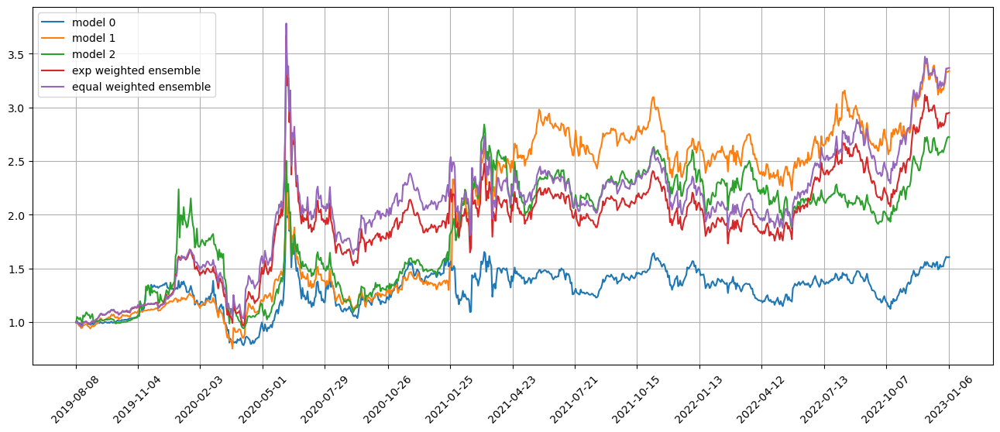

Standardization data are from 2021-06-04 to 2022-03-18
Training data are from 2022-03-21 to 2023-01-04
Testing data are from 2022-12-07 to 2023-02-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 44 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.293716549873352
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3781359195709229
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.3156139850616455
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.378028392791748
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.340291857

position on 2023-01-11 market open will be {'PDBC': 0.3106748410605286, 'YANG': 0.2968342371616415, 'BXP': 0.320193100785328, 'CRK': 0.3188918351749266, 'AR': 0.31065662788623694, 'AQN': 0.3085284036853368, 'ESS': 0.31350974284037386, 'UNG': 0.30504881398786193, 'TDS': 0.31473521498257745, 'DBEF': 0.310802599188132}
Total asset on 2023-01-11 will be 3.1098754167529097
It should be the same as 3.109875416752943
top_stocks by equal weighted ensemble to buy on 2023-01-10 are ['BKD', 'PDBC', 'AR', 'YANG', 'ESS', 'AQN', 'BXP', 'DBEF', 'TDS', 'UNG']
position on 2023-01-11 market open will be {'PDBC': 0.3545362114977162, 'YANG': 0.338772010563962, 'BXP': 0.3654310956814798, 'BKD': 0.3523535831800603, 'AR': 0.35454727672378145, 'AQN': 0.3521183696059101, 'ESS': 0.35780348968164427, 'UNG': 0.34814717137411955, 'TDS': 0.3592021007902354, 'DBEF': 0.3547138713588898}
Total asset on 2023-01-11 will be 3.537625180457751
It should be the same as 3.5376251804577987
Testing data from 2022-12-12 to 2023

position on 2023-01-17 market open will be {'YANG': 0.35770059124735065, 'CTAS': 0.3584078361753937, 'OSK': 0.35727929657898405, 'DOG': 0.35372911954112546, 'QLYS': 0.3624786187150774, 'HTH': 0.3611587403584697, 'VLY': 0.3613843656037383, 'DXD': 0.35042333914025336, 'AAP': 0.3565944529217293, 'SFNC': 0.3616406995448225}
Total asset on 2023-01-17 will be 3.5807970598268954
It should be the same as 3.580797059826944
Testing data from 2022-12-15 to 2023-01-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-17 are ['IDCC', 'PBR', 'COMT', 'MLKN', 'HBI', 'PBR-A', 'PPBI', 'EBS', 'MDGL', 'TGI']
position on 2023-01-18 market open will be {'MLKN': 0.1813654363640053, 'PBR-A': 0.1859137266301277, 'COMT': 0.17648651897443038, 'PPBI': 0.17136896641929264, 'EBS': 0.17506552190841823, 'IDCC': 0.1752607308776812, 'MDGL': 0.17566989568030683, 'TGI': 0.17199885511438076, 'PBR': 0.18666204231777625, 'HBI': 0.17797690703483837}
Total asset on 2023-01-18 will be 1.777768601321236

position on 2023-01-20 market open will be {'AAP': 0.34257456017831667, 'FTGC': 0.34755128317893685, 'WAL': 0.35135840269945967, 'AQN': 0.35036564931578595, 'PAR': 0.35395256904557143, 'MDGL': 0.34901226043203504, 'FFIN': 0.35489379395118537, 'VKTX': 0.329807768706431, 'VIRT': 0.3436031026528921, 'DORM': 0.3539051971254781}
Total asset on 2023-01-20 will be 3.4770245872860435
It should be the same as 3.477024587286092
Testing data from 2022-12-20 to 2023-01-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-20 are ['ELME', 'AWI', 'KMT', 'SPSC', 'BRK-A', 'ENOV', 'MSM', 'COF', 'SHOO', 'JBHT']
position on 2023-01-23 market open will be {'SPSC': 0.1706125039678498, 'ENOV': 0.17271498130760926, 'AWI': 0.17189298223306781, 'ELME': 0.17136528551046173, 'MSM': 0.17439089577982103, 'COF': 0.17954551487385867, 'KMT': 0.17732976812179946, 'SHOO': 0.1747978721750423, 'JBHT': 0.17283540381379744, 'BRK-A': 0.1731764136894506}
Total asset on 2023-01-23 will be 1.73866162147

Testing data from 2022-12-23 to 2023-01-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-25 are ['LUMN', 'SRNE', 'KOLD', 'BBD', 'YANG', 'FFIN', 'KNDI', 'VXRT', 'BRFS', 'LULU']
position on 2023-01-26 market open will be {'LUMN': 0.17756600500071082, 'VXRT': 0.18274623369496373, 'YANG': 0.16507261164881737, 'LULU': 0.17721295958591987, 'KOLD': 0.20271186097430585, 'SRNE': 0.17798403026617957, 'BRFS': 0.17936920416689942, 'BBD': 0.17464455977863358, 'FFIN': 0.1740793176631885, 'KNDI': 0.176605918501336}
Total asset on 2023-01-26 will be 1.7879927012809336
It should be the same as 1.7879927012809549
top_stocks by model 1 to buy on 2023-01-25 are ['PPBI', 'YANG', 'MDGL', 'LULU', 'TGI', 'PZZA', 'VXRT', 'GIII', 'CVNA', 'FFIN']
position on 2023-01-26 market open will be {'GIII': 0.36134353212087167, 'YANG': 0.33211911395386384, 'VXRT': 0.3703393330927391, 'LULU': 0.3565449806054441, 'TGI': 0.36215140912232663, 'MDGL': 0.35102947546650454, 'PPBI': 0.3639270706973661

Testing data from 2022-12-29 to 2023-01-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-30 are ['NTAP', 'AQN', 'CME', 'WIT', 'GBX', 'KBWB', 'FATE', 'CHRS', 'VIRT', 'KNDI']
position on 2023-01-31 market open will be {'GBX': 0.17855445353600904, 'KBWB': 0.17774571391766092, 'KNDI': 0.1736115378711246, 'FATE': 0.17570989694076095, 'AQN': 0.1760522866208232, 'NTAP': 0.1785898060283348, 'WIT': 0.17573073901089528, 'CME': 0.1774367702524743, 'VIRT': 0.17725791541195704, 'CHRS': 0.1773121327026231}
Total asset on 2023-01-31 will be 1.768001252292642
It should be the same as 1.7680012522926634
top_stocks by model 1 to buy on 2023-01-30 are ['FATE', 'KRNT', 'KNDI', 'VNO', 'CME', 'MMM', 'SFNC', 'GIII', 'CM', 'VIRT']
position on 2023-01-31 market open will be {'GIII': 0.36764343501459956, 'FATE': 0.3842133099196385, 'KRNT': 0.34351366243365034, 'KNDI': 0.35857473759616565, 'MMM': 0.3624347549565485, 'VNO': 0.3690274255282558, 'CM': 0.3674051154250967, 'CME': 0.366475

Testing data from 2023-01-04 to 2023-02-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-02 are ['GOOGL', 'MSFT', 'SIGA', 'UDR', 'DBI', 'SNDR', 'EVRI', 'PLUG', 'EQR', 'SHOO']
position on 2023-02-03 market open will be {'SHOO': 0.1855678567781743, 'GOOGL': 0.17790445755977094, 'UDR': 0.18387783663649065, 'DBI': 0.1913743763424059, 'EVRI': 0.1817615810440357, 'SNDR': 0.1986542538347429, 'SIGA': 0.18877179286865065, 'MSFT': 0.18337368204238128, 'PLUG': 0.1727503185165389, 'EQR': 0.183712760356297}
Total asset on 2023-02-03 will be 1.847748915979467
It should be the same as 1.8477489159794882
top_stocks by model 1 to buy on 2023-02-02 are ['LNC', 'ACN', 'PLUG', 'EVRI', 'SHOO', 'PDM', 'FFIN', 'DBI', 'EQR', 'SFNC']
position on 2023-02-03 market open will be {'FFIN': 0.3897897380276307, 'SHOO': 0.3815979459144033, 'LNC': 0.38273994459207256, 'DBI': 0.39648954367842654, 'EVRI': 0.3765737488151391, 'ACN': 0.37728891232147227, 'EQR': 0.38061620324367296, 'PLUG': 0.35

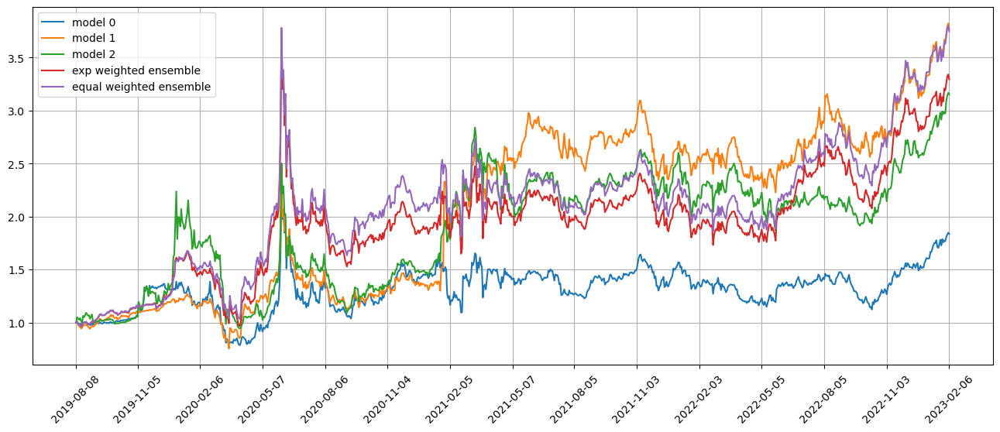

Standardization data are from 2021-07-02 to 2022-04-18
Training data are from 2022-04-19 to 2023-02-02
Testing data are from 2023-01-06 to 2023-03-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 45 out of 67 iterations
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.268469214439392
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3153440952301025
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2949872016906738
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.3086817264556885
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2991358

position on 2023-02-09 market open will be {'IYW': 0.33938970012210656, 'WCN': 0.3428279028546114, 'RPD': 0.33311040502699313, 'WDAY': 0.34147108924781766, 'TEAM': 0.33881121347901316, 'QLYS': 0.3383945985442234, 'OKTA': 0.33765370635215547, 'ARKQ': 0.34230497746638683, 'MSFT': 0.34063655737797194, 'CPT': 0.34440095198771165}
Total asset on 2023-02-09 will be 3.3990011024589517
It should be the same as 3.3990011024589912
top_stocks by equal weighted ensemble to buy on 2023-02-08 are ['CPT', 'WDAY', 'TEAM', 'WCN', 'IYW', 'RPD', 'QLYS', 'ARKQ', 'MSFT', 'OKTA']
position on 2023-02-09 market open will be {'IYW': 0.3859432061843085, 'WCN': 0.3898530213189963, 'RPD': 0.3788025908954133, 'WDAY': 0.38831009590490134, 'TEAM': 0.3852853695154587, 'QLYS': 0.3848116082209374, 'OKTA': 0.38396908911107425, 'ARKQ': 0.38925836714754103, 'MSFT': 0.38736109272243774, 'CPT': 0.39164184291757675}
Total asset on 2023-02-09 will be 3.865236283938595
It should be the same as 3.8652362839386454
Testing data f

position on 2023-02-14 market open will be {'CSL': 0.3830891657770172, 'COLM': 0.3888774460066826, 'SWX': 0.3816167716928075, 'RVTY': 0.3990397553873197, 'FWRD': 0.39411448303468893, 'XPO': 0.39463330653289114, 'MAS': 0.3912179406625473, 'ARCB': 0.3795973993892283, 'UPS': 0.38736369815066446, 'BIP': 0.3843471772624585}
Total asset on 2023-02-14 will be 3.883897143896255
It should be the same as 3.8838971438963057
Testing data from 2023-01-17 to 2023-02-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-14 are ['TXT', 'ERX', 'LSTR', 'NSC', 'CNI', 'ENR', 'IHI', 'BALL', 'CCK', 'UNP']
position on 2023-02-15 market open will be {'TXT': 0.18508060137321536, 'UNP': 0.1821404467492287, 'CNI': 0.182556507864523, 'NSC': 0.18077436599331162, 'ENR': 0.1828760327452966, 'IHI': 0.18409068256893912, 'LSTR': 0.18565492859884883, 'BALL': 0.18857834229173887, 'CCK': 0.18400749938545594, 'ERX': 0.18472579831869737}
Total asset on 2023-02-15 will be 1.8404852058892338
It should 

position on 2023-02-17 market open will be {'PKG': 0.38756977368812057, 'TOON': 0.39364816097406685, 'FAST': 0.38994415028573853, 'CWST': 0.39611232936921026, 'CLM': 0.3883881357684656, 'CMP': 0.39990515771135904, 'SIRI': 0.380809895077121, 'URBN': 0.39589498317201527, 'MHK': 0.3869622008415174, 'VSH': 0.39106029540246334}
Total asset on 2023-02-17 will be 3.9102950822900278
It should be the same as 3.910295082290078
Testing data from 2023-01-20 to 2023-02-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-17 are ['CSCO', 'BMI', 'JBGS', 'QCLN', 'MSI', 'HD', 'EYE', 'FWRD', 'PPBI', 'EMR']
position on 2023-02-21 market open will be {'CSCO': 0.188579409188744, 'QCLN': 0.1844465940987284, 'EYE': 0.1846997870540714, 'EMR': 0.18669808574168528, 'HD': 0.18065727893368283, 'BMI': 0.18577806930494734, 'MSI': 0.18944865912879638, 'FWRD': 0.19007528951242672, 'PPBI': 0.18618530454029966, 'JBGS': 0.1844557753687838}
Total asset on 2023-02-21 will be 1.8610242528721437
It 

position on 2023-02-23 market open will be {'MMM': 0.37877984156045563, 'CVNA': 0.36168192909002994, 'GBX': 0.3927815276995873, 'BAX': 0.3794776547745636, 'CIM': 0.3880885799947887, 'MAT': 0.3826030116609161, 'WHR': 0.37869189568217615, 'VIAV': 0.38917911566634483, 'HTGC': 0.38286435948900516, 'PG': 0.38183915227432247}
Total asset on 2023-02-23 will be 3.8159870678921397
It should be the same as 3.81598706789219
Testing data from 2023-01-25 to 2023-02-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-23 are ['PKG', 'GBX', 'GEO', 'ROIC', 'ERX', 'IYE', 'SIGA', 'WMS', 'ENB', 'XYL']
position on 2023-02-24 market open will be {'GBX': 0.1946758713798096, 'SIGA': 0.18473049785330317, 'PKG': 0.18574045818238455, 'ROIC': 0.18359867410355718, 'XYL': 0.18244200532778024, 'GEO': 0.18549131690546053, 'WMS': 0.18106113005241242, 'ENB': 0.18137140272902935, 'ERX': 0.1818392622009195, 'IYE': 0.18305413674670049}
Total asset on 2023-02-24 will be 1.8440047554813344
It shoul

top_stocks by model 0 to buy on 2023-02-28 are ['INTC', 'VNO', 'CRI', 'NFG', 'BXP', 'NSC', 'CBU', 'CE', 'MMM', 'BOH']
position on 2023-03-01 market open will be {'MMM': 0.19183917182424443, 'NFG': 0.18531330554164377, 'NSC': 0.1875591964449756, 'BXP': 0.1840696698916522, 'INTC': 0.18842917161886477, 'BOH': 0.1866224262037468, 'VNO': 0.18342687212010833, 'CBU': 0.18725682325701765, 'CRI': 0.1906630897994612, 'CE': 0.18697998497690743}
Total asset on 2023-03-01 will be 1.8721597116785995
It should be the same as 1.8721597116786222
top_stocks by model 1 to buy on 2023-02-28 are ['CBU', 'CRI', 'NFG', 'KRNT', 'VNO', 'BOH', 'NSC', 'INTC', 'CE', 'MMM']
position on 2023-03-01 market open will be {'MMM': 0.39997095611961725, 'KRNT': 0.38169179154314375, 'NFG': 0.384121961988262, 'NSC': 0.3887772997022911, 'INTC': 0.3905806055669112, 'BOH': 0.38683553938485854, 'VNO': 0.38021171655325414, 'CBU': 0.3881505331467458, 'CRI': 0.39521112592778795, 'CE': 0.3875766959740799}
Total asset on 2023-03-01 w

Testing data from 2023-02-02 to 2023-03-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-03 are ['ICF', 'REET', 'FAS', 'CPT', 'UDOW', 'RWR', 'SCHH', 'IYR', 'VNQ', 'XLRE']
position on 2023-03-06 market open will be {'UDOW': 0.19163835389616743, 'SCHH': 0.18877169308440905, 'FAS': 0.19450697247494222, 'XLRE': 0.18926361474404657, 'VNQ': 0.18874775683788084, 'REET': 0.18835278781618892, 'IYR': 0.18908048780270112, 'ICF': 0.1886473208312507, 'RWR': 0.1884983179645118, 'CPT': 0.18982216491952092}
Total asset on 2023-03-06 will be 1.8973294703715968
It should be the same as 1.8973294703716193
top_stocks by model 1 to buy on 2023-03-03 are ['CHTR', 'VOX', 'UDOW', 'CPT', 'SCHH', 'IYR', 'VNQ', 'XLRE', 'PDM', 'TREE']
position on 2023-03-06 market open will be {'UDOW': 0.395245629195268, 'VOX': 0.3911521850270657, 'SCHH': 0.3893332680567104, 'XLRE': 0.39034783472316986, 'CHTR': 0.3906204155170699, 'VNQ': 0.38928390060689005, 'IYR': 0.3899701435059206, 'PDM': 0.3826774

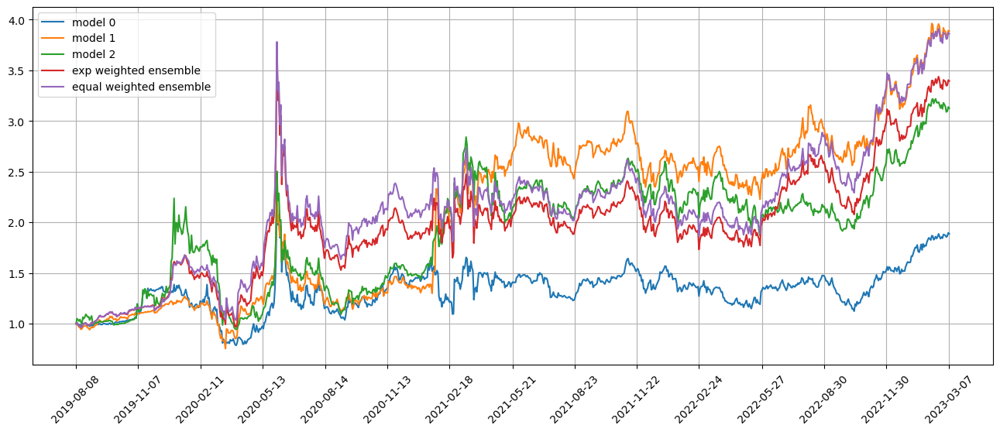

Standardization data are from 2021-08-02 to 2022-05-16
Training data are from 2022-05-17 to 2023-03-03
Testing data are from 2023-02-06 to 2023-03-31
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 46 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2534698247909546
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.4460300207138062
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2697752714157104
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.4398778676986694
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2781602

position on 2023-03-10 market open will be {'EYE': 0.35765112095617446, 'PLCE': 0.3672181150669962, 'UNP': 0.3652609409661778, 'CRM': 0.36671979284955725, 'TGNA': 0.36698994414451463, 'XLP': 0.37196230693199445, 'FXN': 0.3658986731518941, 'PPC': 0.37082785000708207, 'TRIP': 0.3618830679797709, 'MKC': 0.36851118765914975}
Total asset on 2023-03-10 will be 3.662922999713261
It should be the same as 3.6629229997133117
Testing data from 2023-02-09 to 2023-03-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-10 are ['SFNC', 'CGNX', 'TRIP', 'PLUG', 'LEG', 'VSAT', 'BL', 'DORM', 'RH', 'FORM']
position on 2023-03-13 market open will be {'VSAT': 0.17311856401279827, 'LEG': 0.17487387390823056, 'CGNX': 0.1756165699528185, 'FORM': 0.1726314700945279, 'RH': 0.17272955191283376, 'PLUG': 0.1656752696299672, 'DORM': 0.17494174049903222, 'TRIP': 0.17346545658317775, 'BL': 0.1697204324032257, 'SFNC': 0.17199413467840508}
Total asset on 2023-03-13 will be 1.7247670636749948
It

position on 2023-03-15 market open will be {'INFN': 0.36933648794709467, 'MMM': 0.3454855800654744, 'HD': 0.3500405783482422, 'BKE': 0.3410420019988262, 'IFF': 0.3472550168255615, 'CMP': 0.3346361763237514, 'MAT': 0.3443676909544312, 'ANY': 0.31524055819741986, 'FNKO': 0.33437503154944825, 'VSH': 0.35302010112152055}
Total asset on 2023-03-15 will be 3.4347992233317193
It should be the same as 3.4347992233317703
Testing data from 2023-02-14 to 2023-03-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-15 are ['GSK', 'GIS', 'ANY', 'TECK', 'FCX', 'EXPRQ', 'XELA', 'HON', 'RIO', 'SPR']
position on 2023-03-16 market open will be {'GSK': 0.16847827434226006, 'FCX': 0.16414011005789922, 'HON': 0.16668385823979262, 'TECK': 0.15897739189983973, 'RIO': 0.16291828752496296, 'SPR': 0.16739660698979067, 'GIS': 0.17145267675008397, 'XELA': 0.15851791436979729, 'EXPRQ': 0.16991605794752654, 'ANY': 0.1753482105188465}
Total asset on 2023-03-16 will be 1.6638293886407773
It s

Testing data from 2023-02-17 to 2023-03-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-20 are ['FNKO', 'PLNT', 'EDU', 'MAT', 'AY', 'CNH', 'SATS', 'AFG', 'GBX', 'BBWI']
position on 2023-03-21 market open will be {'AFG': 0.17382282243980032, 'CNH': 0.17780109698799193, 'GBX': 0.17733033986859287, 'SATS': 0.17052706253902253, 'PLNT': 0.1704959955247334, 'AY': 0.16895592236034634, 'EDU': 0.17556403703404777, 'BBWI': 0.1722760737529973, 'MAT': 0.16871396378738376, 'FNKO': 0.1663462732393171}
Total asset on 2023-03-21 will be 1.7218335875342123
It should be the same as 1.7218335875342332
top_stocks by model 1 to buy on 2023-03-20 are ['CNH', 'HIG', 'EDU', 'ESPR', 'MET', 'GBX', 'AMCX', 'UNFI', 'FNKO', 'SIGA']
position on 2023-03-21 market open will be {'SIGA': 0.358243928543549, 'CNH': 0.3566685400671334, 'GBX': 0.3594373886313526, 'AMCX': 0.34392097784636727, 'EDU': 0.3558572044459982, 'MET': 0.35899895971814366, 'ESPR': 0.3474875930516231, 'HIG': 0.34940635832

Testing data from 2023-02-23 to 2023-03-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-23 are ['M', 'CSTM', 'GNRC', 'GGB', 'GES', 'MTZ', 'SEDG', 'ATSG', 'AMRC', 'WAL']
position on 2023-03-24 market open will be {'CSTM': 0.16178738466870676, 'M': 0.15758212009643138, 'GNRC': 0.1606509372212514, 'SEDG': 0.16619128906513653, 'WAL': 0.1512762679082782, 'GGB': 0.16359164918089455, 'ATSG': 0.1669259430912935, 'AMRC': 0.1655694278361825, 'MTZ': 0.16743335596798553, 'GES': 0.16263285036915567}
Total asset on 2023-03-24 will be 1.6236412254052954
It should be the same as 1.6236412254053159
top_stocks by model 1 to buy on 2023-03-23 are ['CSTM', 'BGS', 'GES', 'KEY', 'BOH', 'RF', 'WAL', 'CMA', 'SIGA', 'CUBI']
position on 2023-03-24 market open will be {'SIGA': 0.35376589888323906, 'CSTM': 0.32688257423747913, 'KEY': 0.30908353300076863, 'WAL': 0.304970029969933, 'BOH': 0.3279505752295732, 'CMA': 0.30493603209157666, 'CUBI': 0.31443044264921505, 'RF': 0.3291301707603

Testing data from 2023-02-28 to 2023-03-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-28 are ['ECPG', 'ADSK', 'CLDX', 'ATSG', 'CIEN', 'FWONK', 'AZUL', 'AMT', 'PINC', 'TECK']
position on 2023-03-29 market open will be {'ECPG': 0.17482376446132136, 'AMT': 0.16661895350493053, 'PINC': 0.16451399063682415, 'FWONK': 0.16332837882967982, 'TECK': 0.16596689549251092, 'ATSG': 0.1655756273795522, 'CLDX': 0.16556776555500963, 'CIEN': 0.1611887596920342, 'ADSK': 0.16612497571431376, 'AZUL': 0.17107282842567942}
Total asset on 2023-03-29 will be 1.6647819396918355
It should be the same as 1.664781939691856
top_stocks by model 1 to buy on 2023-03-28 are ['NSA', 'ECPG', 'EVRI', 'TECK', 'M', 'AMT', 'FWONK', 'ESPR', 'SIGA', 'AZUL']
position on 2023-03-29 market open will be {'SIGA': 0.370398637129499, 'ECPG': 0.3471265292750816, 'NSA': 0.32604563597568226, 'M': 0.32287637204504693, 'AMT': 0.3296925562114312, 'FWONK': 0.323181424354779, 'TECK': 0.32840231480497317, 'EVRI

Testing data from 2023-03-03 to 2023-03-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-31 are ['ILF', 'NRG', 'RRR', 'BG', 'VONE', 'YANG', 'SATS', 'INTU', 'VIAV', 'SAVE']
position on 2023-04-03 market open will be {'SAVE': 0.1657958581289109, 'YANG': 0.17201683469147463, 'SATS': 0.17104619608825444, 'BG': 0.16903224223856853, 'INTU': 0.16886071173827216, 'VONE': 0.17083455768924685, 'VIAV': 0.17189918157496567, 'NRG': 0.1725845574886875, 'RRR': 0.17059687701824958, 'ILF': 0.1661977150469761}
Total asset on 2023-04-03 will be 1.6988647317035859
It should be the same as 1.6988647317036065
top_stocks by model 1 to buy on 2023-03-31 are ['GNTX', 'EWJ', 'MRIN', 'AZUL', 'RRR', 'SATS', 'YANG', 'SAVE', 'VKTX', 'SIGA']
position on 2023-04-03 market open will be {'SIGA': 0.36783975432238214, 'SAVE': 0.3360839688207593, 'YANG': 0.3431031528256124, 'EWJ': 0.339352296637537, 'SATS': 0.3411671262406772, 'GNTX': 0.3411607284057794, 'MRIN': 0.3441672259950278, 'VKTX': 0.3

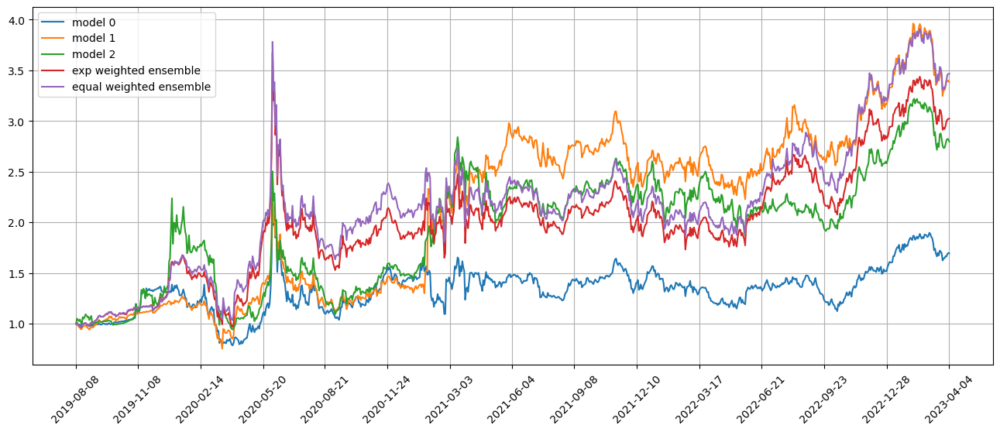

Standardization data are from 2021-08-30 to 2022-06-14
Training data are from 2022-06-15 to 2023-03-31
Testing data are from 2023-03-07 to 2023-05-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 47 out of 67 iterations
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 20.
Epoch 40: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2515588998794556
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2858959436416626
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2602510452270508
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2927460670471191
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.287915

position on 2023-04-10 market open will be {'VKTX': 0.3360853083693949, 'UDOW': 0.3443162861547645, 'AGQ': 0.3467658595012043, 'EWH': 0.345324149715195, 'JCI': 0.3462954914071794, 'EWU': 0.3446769217049995, 'KSS': 0.3468320841537943, 'SLF': 0.342563842041105, 'EWA': 0.3437876677386698, 'CIB': 0.3425992393207469}
Total asset on 2023-04-10 will be 3.4392468501069997
It should be the same as 3.439246850107054
Testing data from 2023-03-10 to 2023-04-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-10 are ['ERX', 'CX', 'TROX', 'LHX', 'EOG', 'RF', 'EXPE', 'PKX', 'MAT', 'SIMO']
position on 2023-04-11 market open will be {'LHX': 0.16810727778922244, 'PKX': 0.16425845730783623, 'EXPE': 0.16498909635907938, 'SIMO': 0.17080000579557789, 'RF': 0.16711438740867496, 'MAT': 0.16936529210905368, 'TROX': 0.1673081885605885, 'EOG': 0.16751396258873122, 'ERX': 0.1689040078492235, 'CX': 0.17246260007960806}
Total asset on 2023-04-11 will be 1.680823275847576
It should be the s

position on 2023-04-13 market open will be {'DBI': 0.35102180782661985, 'RCL': 0.3330834138781229, 'OSK': 0.3450801605408393, 'FL': 0.327990348534018, 'NYCB': 0.3355164686838248, 'INDB': 0.3371721114556487, 'BANC': 0.3378206870727451, 'TBT': 0.3430646504844918, 'VKTX': 0.3436454730283493, 'JBLU': 0.3368790133710863}
Total asset on 2023-04-13 will be 3.3912741348756903
It should be the same as 3.391274134875746
Testing data from 2023-03-15 to 2023-04-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-13 are ['ALRM', 'ALLE', 'IYF', 'CIB', 'BKR', 'TS', 'EXPE', 'EXPO', 'IYE', 'WW']
position on 2023-04-14 market open will be {'EXPO': 0.16805320804387008, 'BKR': 0.16780529956576004, 'ALRM': 0.16538702891702445, 'ALLE': 0.16662472516426674, 'WW': 0.18501146816957106, 'TS': 0.1657602755850009, 'EXPE': 0.16649486855635973, 'CIB': 0.1704894359599354, 'IYE': 0.1672194385508452, 'IYF': 0.16845178252074078}
Total asset on 2023-04-14 will be 1.691297531033354
It should be 

Testing data from 2023-03-20 to 2023-04-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-18 are ['ARCH', 'GGB', 'KALU', 'ONB', 'CADE', 'FFIN', 'GBCI', 'FXO', 'VKTX', 'EXPO']
position on 2023-04-19 market open will be {'ARCH': 0.16661980693106285, 'EXPO': 0.16492395588840836, 'CADE': 0.16181483009601055, 'GGB': 0.1648471658543311, 'FXO': 0.16784109502712755, 'KALU': 0.16521908923435977, 'FFIN': 0.1638968388690408, 'VKTX': 0.1716780847986228, 'GBCI': 0.16092248799222836, 'ONB': 0.1643369283231979}
Total asset on 2023-04-19 will be 1.65210028301437
It should be the same as 1.65210028301439
top_stocks by model 1 to buy on 2023-04-18 are ['ONB', 'MCY', 'MKSI', 'PPBI', 'AVNT', 'CADE', 'GBCI', 'KALU', 'VKTX', 'EXPO']
position on 2023-04-19 market open will be {'VKTX': 0.40017604565975085, 'EXPO': 0.3196446127715898, 'MKSI': 0.31706491124358205, 'CADE': 0.3136187125037015, 'PPBI': 0.3138832064182609, 'AVNT': 0.31897083426214246, 'KALU': 0.32021662054071254, 'MCY': 

Testing data from 2023-03-23 to 2023-04-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-21 are ['EPR', 'MCY', 'LYB', 'FAST', 'EBS', 'VRNT', 'EQNR', 'BURL', 'HR', 'CCI']
position on 2023-04-24 market open will be {'FAST': 0.16530148256551233, 'CCI': 0.16459774049879958, 'BURL': 0.16674488608987875, 'EBS': 0.1623387343326802, 'EPR': 0.1632735829582776, 'HR': 0.1625030348018562, 'MCY': 0.1654668232453529, 'EQNR': 0.16459414096781083, 'LYB': 0.16351898221865893, 'VRNT': 0.16429304906043374}
Total asset on 2023-04-24 will be 1.642632456739241
It should be the same as 1.6426324567392612
top_stocks by model 1 to buy on 2023-04-21 are ['WLK', 'VRNT', 'NCLH', 'FAST', 'BURL', 'DBI', 'HR', 'PETS', 'EBS', 'VKTX']
position on 2023-04-24 market open will be {'FAST': 0.32987892791722984, 'BURL': 0.3327594127125264, 'DBI': 0.3245431199222622, 'EBS': 0.3239664085885057, 'NCLH': 0.33792326089808344, 'VKTX': 0.34637394164031765, 'PETS': 0.3273523759000627, 'HR': 0.3242942898

Testing data from 2023-03-28 to 2023-04-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-26 are ['HMC', 'NTAP', 'EMN', 'MMM', 'HUN', 'WU', 'UI', 'JELD', 'MMYT', 'SATS']
position on 2023-04-27 market open will be {'MMM': 0.15849115420710708, 'SATS': 0.16180254978641795, 'HUN': 0.15935025264084335, 'EMN': 0.16212270190793968, 'JELD': 0.15990569598794258, 'HMC': 0.16107784751368082, 'NTAP': 0.16378283152715478, 'UI': 0.15647711175879556, 'WU': 0.158414032723049, 'MMYT': 0.1618237151206286}
Total asset on 2023-04-27 will be 1.6032478931735394
It should be the same as 1.6032478931735592
top_stocks by model 1 to buy on 2023-04-26 are ['AWI', 'MMYT', 'NTAP', 'FCNCA', 'MMM', 'PRKS', 'OSK', 'FLS', 'JELD', 'SATS']
position on 2023-04-27 market open will be {'MMM': 0.3177214984495737, 'SATS': 0.32435973369166876, 'AWI': 0.31516410114400745, 'OSK': 0.3381293847612538, 'MMYT': 0.3244021630735118, 'JELD': 0.32055717932069216, 'PRKS': 0.3166494516857947, 'NTAP': 0.3283295

Testing data from 2023-03-31 to 2023-04-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-01 are ['UE', 'DEA', 'FSK', 'INDB', 'VKTX', 'UNF', 'OVV', 'CIEN', 'VRE', 'VNET']
position on 2023-05-02 market open will be {'DEA': 0.16270123602122952, 'UE': 0.16150558947789964, 'FSK': 0.16047084040953888, 'UNF': 0.1647330378097444, 'INDB': 0.15865551183158613, 'VNET': 0.1621872138059028, 'OVV': 0.16293191156647013, 'CIEN': 0.16063868610025694, 'VKTX': 0.16868540249372432, 'VRE': 0.16325608776841494}
Total asset on 2023-05-02 will be 1.625765517284748
It should be the same as 1.6257655172847678
top_stocks by model 1 to buy on 2023-05-01 are ['CXW', 'RPM', 'FFIN', 'UE', 'ROIC', 'AGNC', 'IRWD', 'VNET', 'UNF', 'INDB']
position on 2023-05-02 market open will be {'UE': 0.32886807670543206, 'IRWD': 0.3326400198480402, 'RPM': 0.3237390997004591, 'UNF': 0.3290455415766775, 'ROIC': 0.323259447995404, 'INDB': 0.31690600445942335, 'VNET': 0.3239603926032794, 'AGNC': 0.3167100690

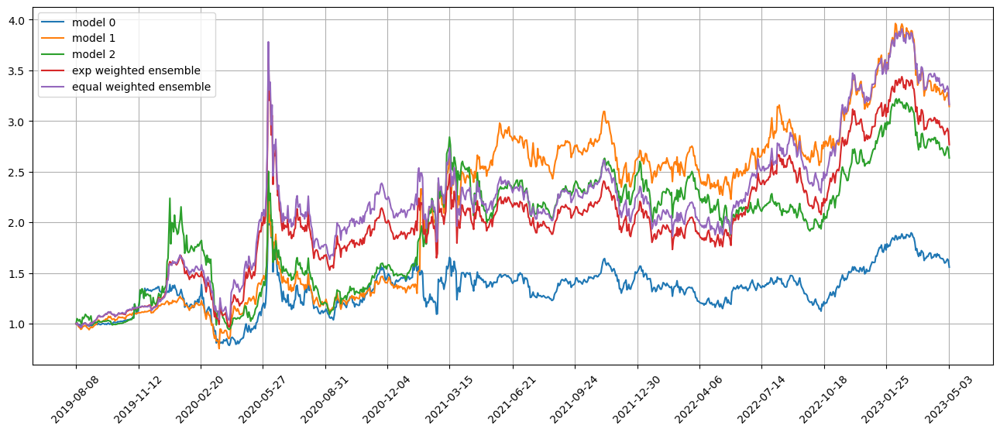

Standardization data are from 2021-09-28 to 2022-07-14
Training data are from 2022-07-15 to 2023-05-01
Testing data are from 2023-04-04 to 2023-05-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 48 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2496671676635742
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.300930142402649
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2596077919006348
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2973034381866455
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.271111

position on 2023-05-08 market open will be {'SSB': 0.27421864257434964, 'BXMT': 0.27489765897088814, 'AZPN': 0.27307035663007073, 'CSGS': 0.2663086547908591, 'FSK': 0.2820914143320557, 'TNET': 0.27086615891374255, 'CUBI': 0.2995334136665624, 'SIRI': 0.27775584984029533, 'ROG': 0.26998814879603056, 'STAG': 0.27075618452193906}
Total asset on 2023-05-08 will be 2.7594864830367376
It should be the same as 2.759486483036793
top_stocks by return weighted ensemble to buy on 2023-05-05 are ['SIRI', 'ELME', 'CUBI', 'IBTX', 'ROG', 'AZPN', 'SSB', 'FFIN', 'TNET', 'CSGS']
position on 2023-05-08 market open will be {'AZPN': 0.28159219259964124, 'SSB': 0.2827763136473128, 'IBTX': 0.27738337705411026, 'CSGS': 0.27461947512819473, 'ELME': 0.27804819003110254, 'TNET': 0.2793192074410771, 'CUBI': 0.3088810947923096, 'SIRI': 0.2864239082159404, 'FFIN': 0.2796623706751483, 'ROG': 0.2784137968457186}
Total asset on 2023-05-08 will be 2.827119926430516
It should be the same as 2.827119926430556
top_stocks b

position on 2023-05-11 market open will be {'EMR': 0.27025179350310174, 'ERJ': 0.28113568000966954, 'WW': 0.2371478479100772, 'PINC': 0.28216247280572776, 'UMBF': 0.268206112229178, 'MOS': 0.26291820005044747, 'SATS': 0.2745495183530642, 'SPR': 0.27298554365814837, 'VKTX': 0.28442910863342563, 'VRNT': 0.2780763042066421}
Total asset on 2023-05-11 will be 2.7118625813594415
It should be the same as 2.7118625813594823
top_stocks by equal weighted ensemble to buy on 2023-05-10 are ['PINC', 'WW', 'EMR', 'SPR', 'UMBF', 'ERJ', 'VRNT', 'MOS', 'VKTX', 'SATS']
position on 2023-05-11 market open will be {'EMR': 0.3087492115756184, 'ERJ': 0.3211835097322475, 'WW': 0.27092960279743955, 'PINC': 0.3223565693524082, 'UMBF': 0.3064121226250812, 'MOS': 0.300370946376438, 'SATS': 0.31365914812699086, 'SPR': 0.31187238494691993, 'VKTX': 0.32494608787385604, 'VRNT': 0.3176883252790593}
Total asset on 2023-05-11 will be 3.0981679086860026
It should be the same as 3.098167908686059
Testing data from 2023-04

position on 2023-05-16 market open will be {'LITE': 0.326888099895229, 'GBX': 0.3049019249707902, 'WW': 0.3356762533483664, 'BIO': 0.3153135393290405, 'ENTG': 0.31161866010410805, 'BJRI': 0.31498529416643845, 'YEXT': 0.30636206627657264, 'CRI': 0.3014198478472409, 'SIRI': 0.31422850071433733, 'WIT': 0.31205807105355404}
Total asset on 2023-05-16 will be 3.1434522577056216
It should be the same as 3.1434522577056776
Testing data from 2023-04-18 to 2023-05-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-16 are ['CUBI', 'ALK', 'WHR', 'SATS', 'ECPG', 'VKTX', 'BKU', 'SFNC', 'RYN', 'MPW']
position on 2023-05-17 market open will be {'SATS': 0.1508668523136164, 'BKU': 0.1522345100452282, 'RYN': 0.14894797570136853, 'MPW': 0.14923665442410053, 'CUBI': 0.16224343615521664, 'ALK': 0.1506426661394364, 'WHR': 0.1496032990963802, 'VKTX': 0.15755124085148306, 'ECPG': 0.14955013409362133, 'SFNC': 0.15048414403817578}
Total asset on 2023-05-17 will be 1.5213609128586072
It

Testing data from 2023-04-21 to 2023-05-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-19 are ['CMPR', 'JELD', 'CRI', 'INTC', 'TM', 'SIRI', 'FAST', 'SHOO', 'DPZ', 'SNBR']
position on 2023-05-22 market open will be {'DPZ': 0.15472440024182352, 'INTC': 0.152430315061639, 'SNBR': 0.14777938123224163, 'FAST': 0.15028122017462256, 'CMPR': 0.15168394058055945, 'JELD': 0.14747185928803558, 'SIRI': 0.1470124825809951, 'CRI': 0.14727374898682377, 'TM': 0.15071746079767706, 'SHOO': 0.14419447747875175}
Total asset on 2023-05-22 will be 1.4935692864231491
It should be the same as 1.4935692864231696
top_stocks by model 1 to buy on 2023-05-19 are ['TSLA', 'THRM', 'SIRI', 'MLKN', 'TM', 'KSS', 'LEA', 'SHOO', 'WW', 'SNBR']
position on 2023-05-22 market open will be {'WW': 0.29114279545128313, 'THRM': 0.3180317651173611, 'MLKN': 0.2965091712562323, 'TM': 0.31207864426326537, 'LEA': 0.3135565409651064, 'SIRI': 0.30440704090179965, 'TSLA': 0.319217850836693, 'KSS': 0.291983

top_stocks by model 0 to buy on 2023-05-24 are ['TT', 'VKTX', 'JNJ', 'HLF', 'AVNT', 'ASGN', 'MRCY', 'AB', 'IBM', 'FLS']
position on 2023-05-25 market open will be {'MRCY': 0.14846417478464072, 'TT': 0.15003765303032962, 'ASGN': 0.14866787996390876, 'AB': 0.15342319457607315, 'IBM': 0.14786685538979366, 'AVNT': 0.15019458220613172, 'JNJ': 0.1494817988051386, 'VKTX': 0.14423758932315345, 'HLF': 0.14240762884583932, 'FLS': 0.14813319820677764}
Total asset on 2023-05-25 will be 1.4829145551317662
It should be the same as 1.4829145551317868
top_stocks by model 1 to buy on 2023-05-24 are ['IBM', 'WRB', 'PENN', 'PBI', 'THG', 'IDEX', 'ASGN', 'FLS', 'VKTX', 'WW']
position on 2023-05-25 market open will be {'WW': 0.2842043226019249, 'ASGN': 0.3013017675663535, 'IDEX': 0.3079628028485939, 'THG': 0.2975869849566311, 'IBM': 0.29967834951462935, 'PBI': 0.3049509303190675, 'WRB': 0.2967646863491478, 'VKTX': 0.2923229995821978, 'FLS': 0.30021814036626027, 'PENN': 0.30324999306343897}
Total asset on 20

top_stocks by model 0 to buy on 2023-05-30 are ['GBX', 'SIRI', 'UNP', 'VTLE', 'POWI', 'WAL', 'PRLB', 'UPS', 'NDAQ', 'XELA']
position on 2023-05-31 market open will be {'GBX': 0.1472155577251774, 'UNP': 0.1500128744187747, 'PRLB': 0.14532529959652957, 'WAL': 0.1442499370985213, 'XELA': 0.14734918678860112, 'POWI': 0.1428798810491603, 'VTLE': 0.14645864948057663, 'SIRI': 0.15180408696882022, 'NDAQ': 0.15063839656743186, 'UPS': 0.14698044049322317}
Total asset on 2023-05-31 will be 1.4729143101867959
It should be the same as 1.4729143101868163
top_stocks by model 1 to buy on 2023-05-30 are ['ZBRA', 'UNP', 'SMG', 'EW', 'WW', 'MED', 'ARKK', 'ARKW', 'PRLB', 'XELA']
position on 2023-05-31 market open will be {'XELA': 0.338430927581375, 'EW': 0.3010391141928829, 'UNP': 0.30372570063817433, 'PRLB': 0.2942349355775318, 'WW': 0.2824325789465511, 'ARKK': 0.29806728017460943, 'ARKW': 0.2984737536926877, 'ZBRA': 0.29881018181815777, 'MED': 0.2987849825475008, 'SMG': 0.2957727408622223}
Total asset o

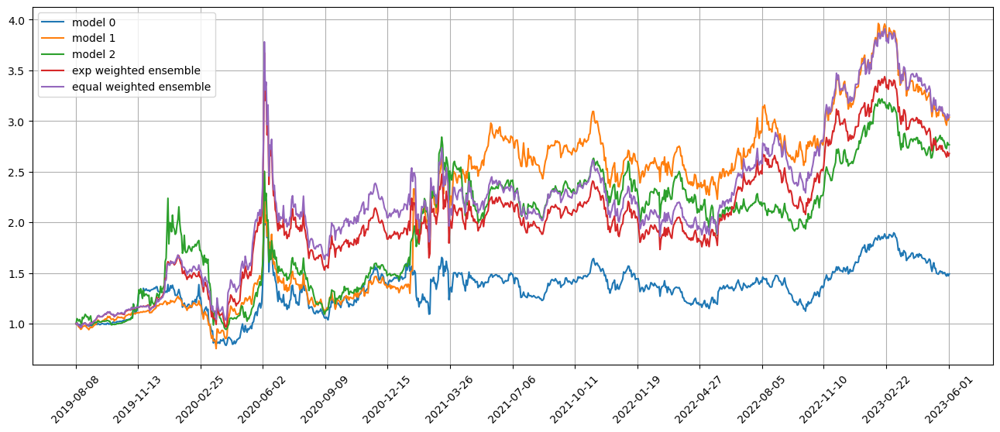

Standardization data are from 2021-10-26 to 2022-08-11
Training data are from 2022-08-12 to 2023-05-30
Testing data are from 2023-05-03 to 2023-06-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 49 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 1.2521321773529053
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3287248611450195
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.244960069656372
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.322008728981018
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.269320607

position on 2023-06-06 market open will be {'RILY': 0.27562992549726734, 'ALRM': 0.277565292580466, 'TTEK': 0.27895479003748785, 'AVAV': 0.2715133722275957, 'TNK': 0.2683739082711852, 'XELA': 0.26490614878334445, 'SIRI': 0.28173955576793075, 'EGHT': 0.2609141930960399, 'SMG': 0.2666166319415695, 'JKS': 0.27697106231657975}
Total asset on 2023-06-06 will be 2.7231848805194288
It should be the same as 2.723184880519466
top_stocks by equal weighted ensemble to buy on 2023-06-05 are ['TNK', 'SIRI', 'JKS', 'ALRM', 'TTEK', 'AVAV', 'RILY', 'SMG', 'EGHT', 'XELA']
position on 2023-06-06 market open will be {'RILY': 0.3146170251736262, 'ALRM': 0.3168261446414649, 'TTEK': 0.31841218271634314, 'AVAV': 0.30991819669433, 'TNK': 0.3063346641413109, 'XELA': 0.30237639955115886, 'SIRI': 0.3215908459487072, 'EGHT': 0.2978197926417355, 'SMG': 0.3043288258774348, 'JKS': 0.3161478621307587}
Total asset on 2023-06-06 will be 3.108371939516812
It should be the same as 3.10837193951687
Testing data from 2023-

position on 2023-06-09 market open will be {'XELA': 0.30672888995461517, 'SPLB': 0.3214749146199436, 'TLH': 0.3214734881100383, 'LQD': 0.32089079248851454, 'SPTL': 0.32195310913565167, 'VGLT': 0.3219302023491628, 'TLT': 0.3220934515237934, 'BLV': 0.3216992932705787, 'ZROZ': 0.3235404716929371, 'VEEV': 0.32011617015156196}
Total asset on 2023-06-09 will be 3.201900783296738
It should be the same as 3.201900783296797
Testing data from 2023-05-11 to 2023-06-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-06-09 are ['MC', 'SBH', 'WDFC', 'PII', 'IJS', 'FOXF', 'VRNT', 'GSK', 'PKX', 'MORN']
position on 2023-06-12 market open will be {'GSK': 0.15567896898179107, 'SBH': 0.15472840794989684, 'FOXF': 0.15277564963227513, 'IJS': 0.15418743155181946, 'PKX': 0.1548658833725039, 'MORN': 0.15429178507775074, 'WDFC': 0.15571861612798782, 'MC': 0.15695995046197692, 'PII': 0.1551157096331683, 'VRNT': 0.15322606559178498}
Total asset on 2023-06-12 will be 1.547548468380935
It sh

top_stocks by model 0 to buy on 2023-06-14 are ['LIVN', 'STM', 'LUV', 'HL', 'SSB', 'BN', 'OTEX', 'SMCI', 'PPLT', 'VKTX']
position on 2023-06-15 market open will be {'SSB': 0.1540985267343157, 'PPLT': 0.15801773324485027, 'HL': 0.15101140380981115, 'SMCI': 0.15887356140511594, 'STM': 0.15590473685027598, 'LIVN': 0.15810040847808934, 'LUV': 0.16199694672885492, 'BN': 0.15813103668329484, 'VKTX': 0.15226849083524852, 'OTEX': 0.15538321345735806}
Total asset on 2023-06-15 will be 1.563786058227194
It should be the same as 1.5637860582272147
top_stocks by model 1 to buy on 2023-06-14 are ['ZBRA', 'UNFI', 'HIMX', 'HL', 'INTC', 'OTEX', 'BN', 'SMCI', 'PPLT', 'VKTX']
position on 2023-06-15 market open will be {'INTC': 0.3372273327348151, 'HIMX': 0.3251636764198888, 'PPLT': 0.3220604926788344, 'HL': 0.3077806908908762, 'SMCI': 0.32380478069818275, 'OTEX': 0.3166910020317488, 'ZBRA': 0.31486754096383746, 'BN': 0.3222914196796104, 'VKTX': 0.31034279615867666, 'UNFI': 0.3089583544948806}
Total asse

position on 2023-06-21 market open will be {'SMCI': 0.14330832583426373, 'SPTL': 0.1538474836397654, 'MANU': 0.1472027905183691, 'VGLT': 0.1537986344387756, 'TLT': 0.1538102916799539, 'GGB': 0.1522483030617972, 'BURL': 0.15490308615727638, 'XELA': 0.1495560905901273, 'VKTX': 0.15940109143053088, 'ZROZ': 0.15350433324423654}
Total asset on 2023-06-21 will be 1.521580430595075
It should be the same as 1.521580430595096
top_stocks by model 1 to buy on 2023-06-20 are ['CBSH', 'VGLT', 'RMD', 'CBOE', 'LOGI', 'GSK', 'SPTL', 'GGB', 'BURL', 'XELA']
position on 2023-06-21 market open will be {'XELA': 0.30338105359039313, 'GSK': 0.321096569840918, 'LOGI': 0.3111578799533552, 'SPTL': 0.32014772577872674, 'CBSH': 0.3135980276292742, 'VGLT': 0.3200460734134556, 'CBOE': 0.32168184751862305, 'GGB': 0.31681992337966497, 'BURL': 0.3223443736361512, 'RMD': 0.3179715240358877}
Total asset on 2023-06-21 will be 3.1682449987764056
It should be the same as 3.1682449987764496
top_stocks by model 2 to buy on 2

position on 2023-06-26 market open will be {'SMCI': 0.14247182211634518, 'VKTX': 0.14911713920087777, 'XELA': 0.16532291153091494, 'CROX': 0.14878353322853993, 'UNH': 0.1472403695371328, 'MRCY': 0.1181650638235387, 'MDGL': 0.14794644374244056, 'CI': 0.14729887025953456, 'CMCSA': 0.14711621075584905, 'ELV': 0.14782121713117763}
Total asset on 2023-06-26 will be 1.46128358132633
It should be the same as 1.4612835813263512
top_stocks by model 1 to buy on 2023-06-23 are ['XLV', 'CMCSA', 'MCK', 'TSEM', 'ELV', 'CROX', 'PARA', 'VKTX', 'UNH', 'XELA']
position on 2023-06-26 market open will be {'XELA': 0.34395835399148916, 'TSEM': 0.3113280028233473, 'UNH': 0.30956654235493075, 'MCK': 0.30791991461152757, 'CMCSA': 0.30930550385885913, 'CROX': 0.3133312326180645, 'XLV': 0.30830804886765323, 'PARA': 0.3109000396527251, 'VKTX': 0.2909161128915175, 'ELV': 0.31078774943209925}
Total asset on 2023-06-26 will be 3.116321501102169
It should be the same as 3.116321501102214
top_stocks by model 2 to buy 

position on 2023-06-29 market open will be {'XELA': 0.15709105710207177, 'VKTX': 0.12619126745281237, 'GGG': 0.14257540494665638, 'IXJ': 0.14463415166883706, 'TRV': 0.14166942849691153, 'VRTX': 0.1462301939069245, 'EFAV': 0.14435038774086179, 'XLV': 0.14466550145457563, 'EFV': 0.14453203993308253, 'CMCSA': 0.14342173386922072}
Total asset on 2023-06-29 will be 1.4353611665719337
It should be the same as 1.4353611665719543
top_stocks by model 1 to buy on 2023-06-28 are ['TRV', 'ABBV', 'XLV', 'EFV', 'BR', 'IART', 'GGG', 'EWA', 'EFAV', 'XELA']
position on 2023-06-29 market open will be {'XELA': 0.3268317798619683, 'BR': 0.31326347291076506, 'ABBV': 0.3129905968922611, 'GGG': 0.3073759997326254, 'TRV': 0.3054228198200119, 'XLV': 0.31188200484549683, 'EFAV': 0.31120265630835964, 'EWA': 0.3135344608988956, 'IART': 0.3076302867237805, 'EFV': 0.3115942773190688}
Total asset on 2023-06-29 will be 3.1217283553131887
It should be the same as 3.1217283553132336
top_stocks by model 2 to buy on 2023

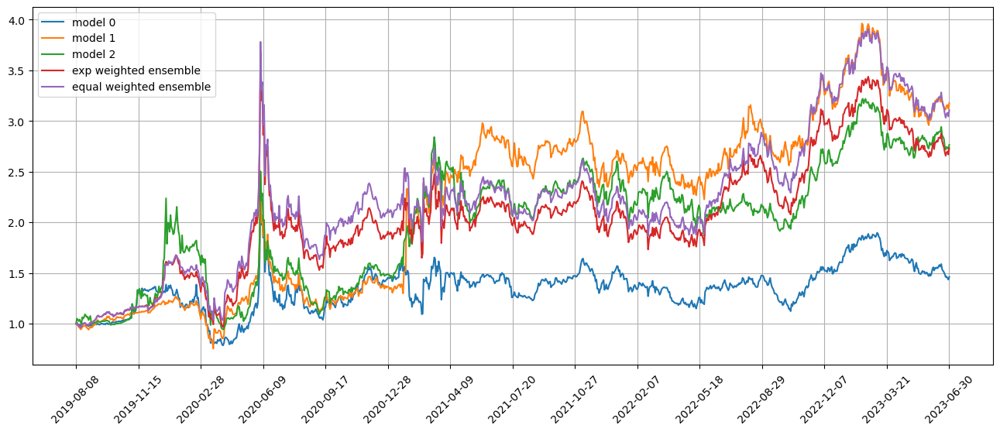

Standardization data are from 2021-11-23 to 2022-09-09
Training data are from 2022-09-12 to 2023-06-28
Testing data are from 2023-06-01 to 2023-07-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 50 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2505239248275757
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2198281288146973
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.237043023109436
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2202513217926025
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.2615858

position on 2023-07-06 market open will be {'MODG': 0.2727210468402667, 'SPTL': 0.27399353195434745, 'FHN': 0.2870467364225184, 'GT': 0.2701101807056613, 'CRI': 0.2717484597031434, 'EPAM': 0.28198795509532665, 'FFIN': 0.27090570896042193, 'MSFT': 0.2805361656567498, 'CYBR': 0.2813440859356019, 'CIB': 0.27265529215279066}
Total asset on 2023-07-06 will be 2.7630491634267673
It should be the same as 2.763049163426828
top_stocks by return weighted ensemble to buy on 2023-07-05 are ['ZROZ', 'VTR', 'CRI', 'SPTL', 'GT', 'VGLT', 'CIB', 'EPAM', 'MODG', 'VKTX']
position on 2023-07-06 market open will be {'VTR': 0.28109605024519657, 'SPTL': 0.2759488401044764, 'MODG': 0.2746672741172206, 'VGLT': 0.27591444791817876, 'VKTX': 0.2848424547126126, 'GT': 0.27203777598135775, 'CRI': 0.27368774627772974, 'EPAM': 0.28400031408388837, 'ZROZ': 0.2748399837444242, 'CIB': 0.2746010501826225}
Total asset on 2023-07-06 will be 2.77163593736767
It should be the same as 2.7716359373677077
top_stocks by equal we

top_stocks by model 2 to buy on 2023-07-10 are ['KTOS', 'AMH', 'AZUL', 'UNP', 'NSC', 'PBR-A', 'PBR', 'CWH', 'TRI', 'TSEM']
position on 2023-07-11 market open will be {'AMH': 0.28010319785430926, 'UNP': 0.28306280414840707, 'NSC': 0.2842702680569462, 'PBR-A': 0.27525664758349083, 'KTOS': 0.28573606979539273, 'TRI': 0.28048692601696484, 'CWH': 0.2974557214599199, 'PBR': 0.27539516475789944, 'TSEM': 0.2787868593301808, 'AZUL': 0.2759013902541116}
Total asset on 2023-07-11 will be 2.8164550492575615
It should be the same as 2.816455049257623
top_stocks by return weighted ensemble to buy on 2023-07-10 are ['TRI', 'CZR', 'PBR-A', 'ZROZ', 'KTOS', 'CHRW', 'AMH', 'PBR', 'AZUL', 'TSEM']
position on 2023-07-11 market open will be {'PBR': 0.27787124586877116, 'AZUL': 0.2783820228442735, 'CHRW': 0.28277032378826955, 'PBR-A': 0.2777314832848457, 'KTOS': 0.28830512610303366, 'TRI': 0.2830087872121954, 'ZROZ': 0.2831249577813388, 'TSEM': 0.2812934352061718, 'CZR': 0.29177073025545613, 'AMH': 0.2826216

position on 2023-07-14 market open will be {'KNX': 0.3369725658849644, 'EWL': 0.34574941551747373, 'NKE': 0.3400743559640069, 'ATUS': 0.3457822241000556, 'ALL': 0.3462765674555525, 'LEG': 0.3429517773102931, 'LUMN': 0.34698703918013296, 'PUK': 0.34303035723865355, 'TRV': 0.34243442110986966, 'CX': 0.3547663337331784}
Total asset on 2023-07-14 will be 3.445025057494119
It should be the same as 3.4450250574941808
Testing data from 2023-06-14 to 2023-07-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-07-14 are ['NNN', 'PK', 'AAT', 'BERY', 'SHO', 'GXC', 'FULT', 'IDEX', 'XELA', 'FNKO']
position on 2023-07-17 market open will be {'XELA': 0.1541073386645477, 'SHO': 0.15687665492257713, 'GXC': 0.15949309770155143, 'IDEX': 0.15427650925891417, 'AAT': 0.1620119972764891, 'FULT': 0.1575911528051905, 'NNN': 0.1615263452008913, 'PK': 0.15701370201607132, 'BERY': 0.1600436050601351, 'FNKO': 0.13618908173092534}
Total asset on 2023-07-17 will be 1.5591294846372714
It should

Testing data from 2023-06-20 to 2023-07-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-07-19 are ['ABR', 'KN', 'KODK', 'TNET', 'JNPR', 'FULT', 'ABM', 'CHH', 'BDN', 'XELA']
position on 2023-07-20 market open will be {'XELA': 0.1681461044826774, 'TNET': 0.1561767360723585, 'BDN': 0.1653716684676851, 'CHH': 0.15823797307398746, 'JNPR': 0.15644569541651807, 'KN': 0.15558545876533644, 'ABM': 0.16134881179896088, 'KODK': 0.15565299028176094, 'FULT': 0.16023356000020544, 'ABR': 0.1611017641822597}
Total asset on 2023-07-20 will be 1.5983007625417278
It should be the same as 1.59830076254175
top_stocks by model 1 to buy on 2023-07-19 are ['GHC', 'PDM', 'TRV', 'ABM', 'XELA', 'JNPR', 'DBRG', 'DPZ', 'CNK', 'BDN']
position on 2023-07-20 market open will be {'XELA': 0.38092219206209427, 'GHC': 0.3784890392086692, 'DPZ': 0.354871899028486, 'BDN': 0.37389439971219257, 'JNPR': 0.3537133652778363, 'ABM': 0.36479898697784774, 'DBRG': 0.3478053937386941, 'TRV': 0.3638293283915

Testing data from 2023-06-23 to 2023-07-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-07-24 are ['CB', 'TRV', 'ASH', 'CMP', 'KNDI', 'CNK', 'IDEX', 'XELA', 'VKTX', 'TBF']
position on 2023-07-25 market open will be {'XELA': 0.16750797945522156, 'IDEX': 0.14283691965633685, 'CB': 0.15779002104989318, 'ASH': 0.15988003696988115, 'TRV': 0.15845458838008356, 'CMP': 0.15959280739384243, 'VKTX': 0.14964908258541815, 'KNDI': 0.15877864601167088, 'CNK': 0.15333522628661564, 'TBF': 0.15936545932490462}
Total asset on 2023-07-25 will be 1.5671907671138463
It should be the same as 1.5671907671138678
top_stocks by model 1 to buy on 2023-07-24 are ['HASI', 'ADSK', 'TVTX', 'ACIW', 'IDEX', 'TRV', 'CMP', 'XELA', 'VKTX', 'TBF']
position on 2023-07-25 market open will be {'IDEX': 0.33006130964135105, 'XELA': 0.3748836138875445, 'TVTX': 0.3418538676859439, 'ACIW': 0.3644137635217009, 'HASI': 0.3548563826619787, 'TRV': 0.36552381224132624, 'CMP': 0.36814946137732185, 'VKTX': 0.3

top_stocks by model 1 to buy on 2023-07-27 are ['UNIT', 'SBSW', 'MNRO', 'CRM', 'VKTX', 'WKHS', 'XELA', 'IBTX', 'HBI', 'SFNC']
position on 2023-07-28 market open will be {'IBTX': 0.36055058167810733, 'CRM': 0.36419217495027156, 'HBI': 0.36190113044248134, 'XELA': 0.3680820018346132, 'SBSW': 0.35869517586344796, 'WKHS': 0.338968199966739, 'MNRO': 0.3612811388420865, 'VKTX': 0.3736897376713655, 'UNIT': 0.3647269093291673, 'SFNC': 0.3663771336496235}
Total asset on 2023-07-28 will be 3.6184641842278573
It should be the same as 3.618464184227903
top_stocks by model 2 to buy on 2023-07-27 are ['MELI', 'JNUG', 'WDFC', 'GIII', 'KGC', 'VRNT', 'SFNC', 'DORM', 'CRM', 'TSEM']
position on 2023-07-28 market open will be {'DORM': 0.28478846045940615, 'CRM': 0.2915801623643281, 'JNUG': 0.2765429712583741, 'WDFC': 0.29535060444654954, 'MELI': 0.29442173325902193, 'GIII': 0.2943551492169366, 'KGC': 0.2911976363971973, 'VRNT': 0.2876964763526984, 'TSEM': 0.29163484301452935, 'SFNC': 0.2933294877374045}
T

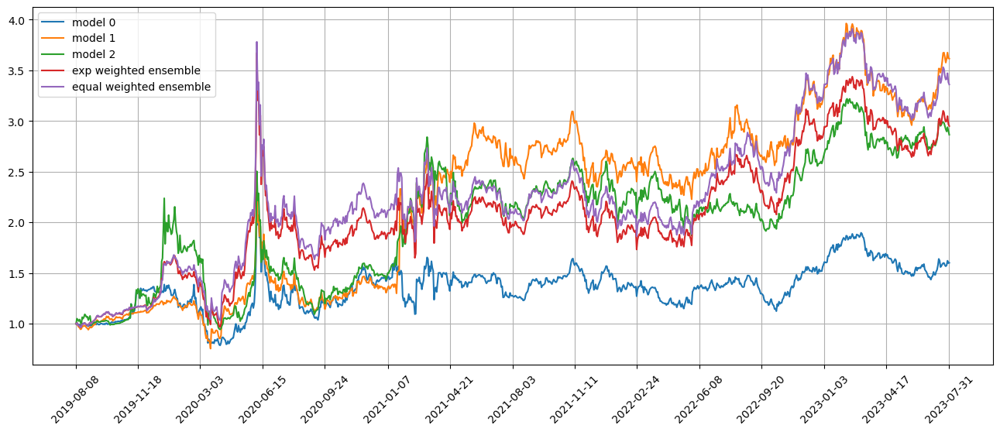

Standardization data are from 2021-12-22 to 2022-10-07
Training data are from 2022-10-10 to 2023-07-27
Testing data are from 2023-06-30 to 2023-08-24
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 51 out of 67 iterations
Restoring model weights from the end of the best epoch: 26.
Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 44.
Epoch 64: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2222318649291992
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2080779075622559
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.220681071281433
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2090344429016113
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.228858

position on 2023-08-03 market open will be {'ERY': 0.30774839503378404, 'RUN': 0.3260718889072918, 'SCO': 0.30648866375266653, 'LHX': 0.296758920731489, 'SIMO': 0.3041876997377645, 'MRIN': 0.3079116409492998, 'KALU': 0.2964058990914001, 'BLDP': 0.3057573888848334, 'TSEM': 0.2937467220603845, 'GD': 0.3008986363716771}
Total asset on 2023-08-03 will be 3.0459758555205507
It should be the same as 3.0459758555205907
top_stocks by equal weighted ensemble to buy on 2023-08-02 are ['DRIP', 'BLDP', 'GD', 'RUN', 'LHX', 'KALU', 'MRIN', 'ERY', 'TSEM', 'SIMO']
position on 2023-08-03 market open will be {'ERY': 0.3505030985685106, 'RUN': 0.37137222894548805, 'LHX': 0.3379868844898943, 'DRIP': 0.34402416540188796, 'SIMO': 0.346447724911156, 'MRIN': 0.3506890238247923, 'KALU': 0.33758481844922716, 'BLDP': 0.34823548698795453, 'TSEM': 0.3345562087016089, 'GD': 0.3427017203184261}
Total asset on 2023-08-03 will be 3.4641013605988853
It should be the same as 3.464101360598946
Testing data from 2023-07-0

position on 2023-08-08 market open will be {'MNRO': 0.29767334112606136, 'CSGS': 0.3031813843077925, 'LEG': 0.2964897512998677, 'FL': 0.3007277310116213, 'TGI': 0.2948098110845532, 'RTX': 0.3061314381490981, 'BCPC': 0.3046957090868568, 'JBT': 0.3037642236928988, 'SHOO': 0.2918747896190272, 'CNK': 0.3129064271498179}
Total asset on 2023-08-08 will be 3.0122546065275544
It should be the same as 3.0122546065275952
top_stocks by equal weighted ensemble to buy on 2023-08-07 are ['RTX', 'JBT', 'TGI', 'FL', 'LEG', 'MNRO', 'CSGS', 'SHOO', 'CNK', 'BCPC']
position on 2023-08-08 market open will be {'MNRO': 0.33931973891173084, 'CSGS': 0.3455983924427102, 'LEG': 0.33797055732468195, 'FL': 0.3428014574108823, 'TGI': 0.33605558276534964, 'RTX': 0.3489611776199808, 'BCPC': 0.3473245809106323, 'JBT': 0.34626277477279593, 'SHOO': 0.3327099330890461, 'CNK': 0.35668403076550503}
Total asset on 2023-08-08 will be 3.433688226013254
It should be the same as 3.433688226013315
Testing data from 2023-07-11 to

Testing data from 2023-07-14 to 2023-08-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-11 are ['EWH', 'AXL', 'PRLB', 'GXC', 'ACMR', 'QLYS', 'TEAM', 'XELA', 'TDS', 'ATSG']
position on 2023-08-14 market open will be {'XELA': 0.13912923008819347, 'PRLB': 0.15824420514664275, 'EWH': 0.15454963234123603, 'GXC': 0.15464018477525512, 'QLYS': 0.161289271652023, 'TEAM': 0.15653897406776263, 'ATSG': 0.1533950082432736, 'AXL': 0.15280570011259778, 'TDS': 0.16050328809422496, 'ACMR': 0.15436965393711236}
Total asset on 2023-08-14 will be 1.5454651484582993
It should be the same as 1.5454651484583217
top_stocks by model 1 to buy on 2023-08-11 are ['EWH', 'PRLB', 'GXC', 'INFY', 'FLR', 'QLYS', 'TEAM', 'ACMR', 'ATSG', 'TDS']
position on 2023-08-14 market open will be {'PRLB': 0.37321797917057453, 'FLR': 0.36615073300783907, 'EWH': 0.36450435205826, 'GXC': 0.3647179194138688, 'QLYS': 0.38039974969117507, 'TEAM': 0.36919620221710736, 'ATSG': 0.36178117826403566, 'TDS': 0.3

Testing data from 2023-07-19 to 2023-08-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-16 are ['MJ', 'NOK', 'SCHW', 'SONY', 'PDM', 'CDE', 'DFEN', 'HL', 'ELS', 'HE']
position on 2023-08-17 market open will be {'MJ': 0.15848511496316262, 'ELS': 0.15265149814288292, 'HE': 0.10462681672180808, 'DFEN': 0.15470972461701243, 'SONY': 0.15575073368034983, 'HL': 0.15533190683381803, 'CDE': 0.15698656731235158, 'NOK': 0.1551266385615591, 'SCHW': 0.1537789118470083, 'PDM': 0.15040484999819487}
Total asset on 2023-08-17 will be 1.497852762678125
It should be the same as 1.4978527626781477
top_stocks by model 1 to buy on 2023-08-16 are ['SONY', 'HL', 'BX', 'QCLN', 'CDE', 'DFEN', 'WPM', 'BALL', 'ELS', 'HE']
position on 2023-08-17 market open will be {'QCLN': 0.3680464222347339, 'BX': 0.3734025726722218, 'ELS': 0.36987309619089026, 'HE': 0.25350975991909197, 'DFEN': 0.37486015893124913, 'HL': 0.3763677003948082, 'SONY': 0.377382513772857, 'CDE': 0.38037692665059675, 'WPM

position on 2023-08-22 market open will be {'HE': 0.14236039953183005, 'COHR': 0.15856257100481505, 'FCX': 0.15218828698347014, 'INTC': 0.1531608076169961, 'ZTO': 0.1537373875525442, 'RIO': 0.15452581765634807, 'XELA': 0.1449343597573019, 'BHP': 0.15105285504424562, 'PUK': 0.15180468050862042, 'LIT': 0.1521985148095025}
Total asset on 2023-08-22 will be 1.5145256804656517
It should be the same as 1.514525680465674
top_stocks by model 1 to buy on 2023-08-21 are ['COHR', 'FCX', 'CQQQ', 'ASX', 'VALE', 'FXI', 'BHP', 'PUK', 'RIO', 'HE']
position on 2023-08-22 market open will be {'COHR': 0.3794270079865914, 'HE': 0.3404931131902396, 'FCX': 0.36417387795124284, 'CQQQ': 0.36637626283793767, 'RIO': 0.36976739389681884, 'FXI': 0.36520473223477956, 'BHP': 0.36145688401791864, 'ASX': 0.3655328408205544, 'PUK': 0.3632559396504562, 'VALE': 0.3690483820609467}
Total asset on 2023-08-22 will be 3.6447364346474407
It should be the same as 3.6447364346474864
top_stocks by model 2 to buy on 2023-08-21 a

top_stocks by model 1 to buy on 2023-08-24 are ['ESRT', 'UBSI', 'TSCO', 'UMBF', 'KMPR', 'CVS', 'HE', 'VICR', 'MSGS', 'PLCE']
position on 2023-08-25 market open will be {'HE': 0.28675364800094816, 'PLCE': 0.3663335571109336, 'UMBF': 0.38113169507592626, 'VICR': 0.35093866412771263, 'ESRT': 0.37053008051368624, 'CVS': 0.3761855969636526, 'KMPR': 0.37597600133378073, 'TSCO': 0.3731603709420918, 'MSGS': 0.37387556381349657, 'UBSI': 0.376811395216119}
Total asset on 2023-08-25 will be 3.6316965730983015
It should be the same as 3.6316965730983473
top_stocks by model 2 to buy on 2023-08-24 are ['ESRT', 'EBAY', 'POOL', 'SBH', 'CHH', 'BKE', 'DBI', 'KMPR', 'MSGS', 'PLCE']
position on 2023-08-25 market open will be {'CHH': 0.27938667943387774, 'PLCE': 0.275087446246473, 'SBH': 0.2862528417288045, 'ESRT': 0.2782387024815855, 'BKE': 0.2775464514135307, 'DBI': 0.27894558284008747, 'KMPR': 0.2823281570832196, 'EBAY': 0.2797270900165141, 'POOL': 0.2798571217929774, 'MSGS': 0.28075089509823503}
Total 

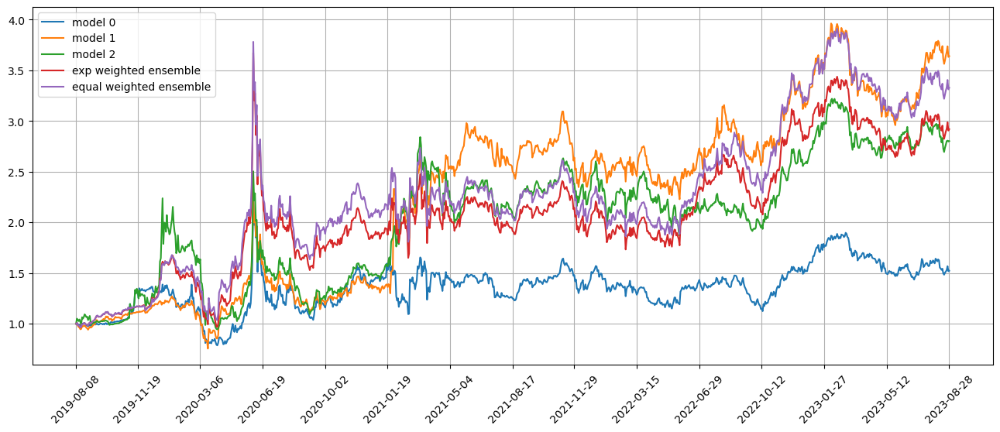

Standardization data are from 2022-01-21 to 2022-11-04
Training data are from 2022-11-07 to 2023-08-24
Testing data are from 2023-07-31 to 2023-09-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 52 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2154587507247925
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1746944189071655
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2112798690795898
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.172391653060913
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.2151120

position on 2023-08-31 market open will be {'CSGS': 0.28758823066637085, 'NSA': 0.28662716929025495, 'EXPO': 0.28760229900269857, 'PSA': 0.289644732830176, 'ADC': 0.28827855694002713, 'COLM': 0.28759022033118986, 'ELME': 0.287576429890473, 'CVS': 0.285999079245272, 'WBA': 0.2876891510860288, 'RDFN': 0.2953266603750828}
Total asset on 2023-08-31 will be 2.8839225296575104
It should be the same as 2.883922529657574
top_stocks by return weighted ensemble to buy on 2023-08-30 are ['ADC', 'HEI', 'EXPO', 'NSA', 'RDFN', 'COLM', 'WBA', 'CVS', 'CSGS', 'HE']
position on 2023-08-31 market open will be {'HE': 0.3056774663426821, 'NSA': 0.2988884526643086, 'ADC': 0.3006104830657237, 'EXPO': 0.2999052962929882, 'COLM': 0.2998927009223315, 'CSGS': 0.3046011331684037, 'CVS': 0.2982334943009976, 'WBA': 0.2999958637184752, 'RDFN': 0.30796008894969523, 'HEI': 0.30476690344540847}
Total asset on 2023-08-31 will be 3.0205318828709706
It should be the same as 3.020531882871014
top_stocks by equal weighted e

position on 2023-09-06 market open will be {'MJ': 0.3841216926889089, 'MMM': 0.34324735837986087, 'HE': 0.30104162672547646, 'TRUP': 0.34426834652627286, 'ENOV': 0.33626553668267867, 'KWR': 0.3325684048688896, 'TDS': 0.3294534260264188, 'MCY': 0.3370025578776677, 'TSN': 0.34067536612703786, 'GMED': 0.3347850175793249}
Total asset on 2023-09-06 will be 3.3834293334824705
It should be the same as 3.383429333482537
Testing data from 2023-08-08 to 2023-09-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-09-06 are ['HOMB', 'WD', 'AYI', 'RYN', 'NSC', 'BKU', 'PENN', 'NGVT', 'HZO', 'FL']
position on 2023-09-07 market open will be {'NSC': 0.15161514048514313, 'HOMB': 0.15161711296989436, 'FL': 0.1514177560028676, 'RYN': 0.15690744168786414, 'BKU': 0.14877926748667444, 'HZO': 0.1520531519014911, 'WD': 0.14891925367579326, 'NGVT': 0.15168786576810556, 'PENN': 0.1513452677174098, 'AYI': 0.154450637929334}
Total asset on 2023-09-07 will be 1.518792895624554
It should be th

Testing data from 2023-08-11 to 2023-09-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-09-11 are ['NNDM', 'SGMO', 'VIAV', 'HSIC', 'CRI', 'MODG', 'IFF', 'GNL', 'KALU', 'PLCE']
position on 2023-09-12 market open will be {'MODG': 0.15054642797530027, 'PLCE': 0.1541622844454589, 'GNL': 0.15219675701627272, 'SGMO': 0.15726998762593153, 'IFF': 0.1484218337108597, 'HSIC': 0.1524435682171218, 'KALU': 0.15400839521476956, 'CRI': 0.1506212685496656, 'VIAV': 0.15173368782473606, 'NNDM': 0.1482654792742273}
Total asset on 2023-09-12 will be 1.5196696898543203
It should be the same as 1.5196696898543434
top_stocks by model 1 to buy on 2023-09-11 are ['WTM', 'GNL', 'PLCE', 'KALU', 'SMG', 'CIEN', 'IFF', 'CPRI', 'SGMO', 'HE']
position on 2023-09-12 market open will be {'CIEN': 0.3763870834144778, 'PLCE': 0.38309620759274177, 'CPRI': 0.3795728416289083, 'HE': 0.39521013194958626, 'SMG': 0.370773892956753, 'WTM': 0.3810923748872889, 'IFF': 0.368831078386798, 'SGMO': 0.3908189

top_stocks by model 1 to buy on 2023-09-14 are ['GIII', 'DG', 'NNDM', 'MEOH', 'AFG', 'HUN', 'MRCY', 'MAN', 'CGC', 'PLCE']
position on 2023-09-15 market open will be {'MRCY': 0.3783526905421677, 'PLCE': 0.4071672222328579, 'HUN': 0.3859613939637144, 'MEOH': 0.381461441382718, 'GIII': 0.3836784287570036, 'DG': 0.37022421974909947, 'CGC': 0.49450767926513034, 'AFG': 0.3827359839123537, 'MAN': 0.3780727910707364, 'NNDM': 0.380807371064884}
Total asset on 2023-09-15 will be 3.9429692219406167
It should be the same as 3.9429692219406656
top_stocks by model 2 to buy on 2023-09-14 are ['CWH', 'CSTM', 'AMRC', 'MEOH', 'DQ', 'DG', 'MAN', 'MRCY', 'HE', 'PLCE']
position on 2023-09-15 market open will be {'MAN': 0.28318497874740495, 'CSTM': 0.28658915353237785, 'MRCY': 0.2808080267970597, 'HE': 0.27424221863303294, 'PLCE': 0.3021937655255181, 'MEOH': 0.28311529779356753, 'CWH': 0.2802507469187258, 'DG': 0.2747751905008298, 'DQ': 0.284886495824162, 'AMRC': 0.2930425551815332}
Total asset on 2023-09-1

top_stocks by model 1 to buy on 2023-09-19 are ['PKG', 'PRLB', 'UI', 'ACB', 'NTRS', 'CABO', 'XRX', 'CSGS', 'MMM', 'CGC']
position on 2023-09-20 market open will be {'PKG': 0.38796903559469514, 'PRLB': 0.39432052786439475, 'MMM': 0.38651954156643636, 'NTRS': 0.3865221841669444, 'CSGS': 0.3934987386919221, 'CGC': 0.35354015546239786, 'UI': 0.3849919858787963, 'CABO': 0.39953191953211337, 'ACB': 0.3748917967614935, 'XRX': 0.3985990950758546}
Total asset on 2023-09-20 will be 3.8603849805950006
It should be the same as 3.860384980595048
top_stocks by model 2 to buy on 2023-09-19 are ['UI', 'CE', 'CABO', 'PRLB', 'XRX', 'ENR', 'MMM', 'SXT', 'ACB', 'MORN']
position on 2023-09-20 market open will be {'PRLB': 0.285466061887681, 'SXT': 0.2816825241371278, 'MMM': 0.2798185830476147, 'MORN': 0.2818131604448291, 'CE': 0.2844458486781375, 'UI': 0.2787127179565264, 'CABO': 0.2892388186964503, 'ENR': 0.2879556202828576, 'ACB': 0.27140074455444985, 'XRX': 0.28856350583510143}
Total asset on 2023-09-20 

top_stocks by model 1 to buy on 2023-09-22 are ['MJ', 'MAN', 'DPZ', 'PLCE', 'KRC', 'KMPR', 'PZZA', 'KALU', 'SWK', 'BDN']
position on 2023-09-25 market open will be {'BDN': 0.3391475262251312, 'PLCE': 0.34653804391071424, 'MJ': 0.37800781444637854, 'DPZ': 0.37507129739262995, 'KRC': 0.37006274916602194, 'PZZA': 0.3687591063053368, 'SWK': 0.37027137171218355, 'KMPR': 0.3685789819137454, 'KALU': 0.3721239570108683, 'MAN': 0.3703427572470548}
Total asset on 2023-09-25 will be 3.658903605330017
It should be the same as 3.6589036053300643
top_stocks by model 2 to buy on 2023-09-22 are ['TGNA', 'SFIX', 'GMED', 'MORN', 'SWK', 'CATY', 'KMPR', 'BDN', 'DPZ', 'PZZA']
position on 2023-09-25 market open will be {'SFIX': 0.2715483118868788, 'BDN': 0.26453671340303475, 'DPZ': 0.2706087756569422, 'TGNA': 0.2648798611579542, 'MORN': 0.2673266243955578, 'CATY': 0.26676293177747273, 'SWK': 0.2671456953821799, 'KMPR': 0.2659246594498829, 'PZZA': 0.26605461671777664, 'GMED': 0.2681590090677128}
Total asset 

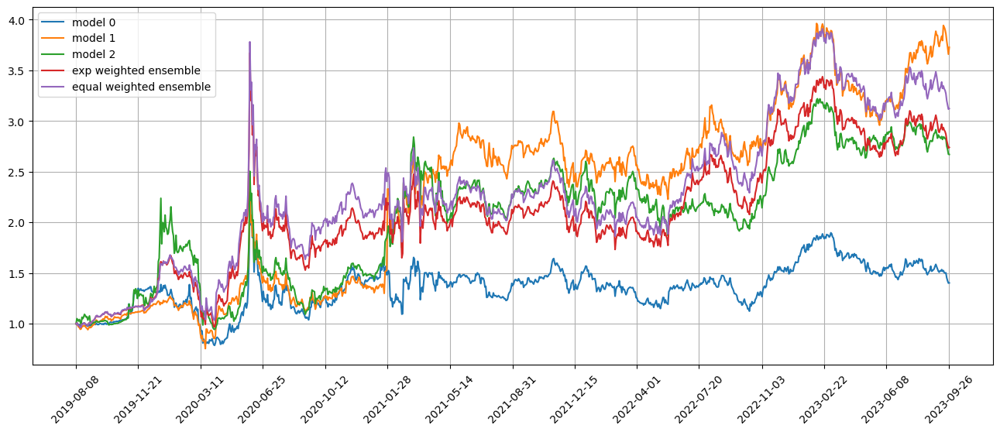

Standardization data are from 2022-02-18 to 2022-12-05
Training data are from 2022-12-06 to 2023-09-22
Testing data are from 2023-08-28 to 2023-10-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 53 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.218437671661377
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2967196702957153
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.2160518169403076
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2961046695709229
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.214832544

position on 2023-09-29 market open will be {'IEP': 0.26993082336540725, 'TFI': 0.26990582846386124, 'CVBF': 0.27638541039157194, 'CSGS': 0.26930726274059813, 'SNV': 0.27328243583511563, 'EWBC': 0.27930917854910947, 'PB': 0.273529521191688, 'SHM': 0.2691044315067923, 'WBS': 0.2773267077197296, 'BKU': 0.2709493257542508}
Total asset on 2023-09-29 will be 2.7290309255180603
It should be the same as 2.729030925518124
top_stocks by return weighted ensemble to buy on 2023-09-28 are ['FLS', 'PB', 'PPBI', 'HRI', 'WBS', 'CVBF', 'TFI', 'BKU', 'SNV', 'CSGS']
position on 2023-09-29 market open will be {'TFI': 0.27375132256171936, 'CVBF': 0.2803232225923825, 'HRI': 0.2765175935619, 'CSGS': 0.2731442287493479, 'SNV': 0.2771760382816924, 'PB': 0.27742664399677563, 'PPBI': 0.2754429444567079, 'WBS': 0.2812779310919119, 'FLS': 0.2770818967262096, 'BKU': 0.27480968712153453}
Total asset on 2023-09-29 will be 2.7669515091401378
It should be the same as 2.7669515091401817
top_stocks by equal weighted ense

top_stocks by model 2 to buy on 2023-10-03 are ['FCPT', 'VTEB', 'MPC', 'IGF', 'SATS', 'PDI', 'VPU', 'XLU', 'XLP', 'IEP']
position on 2023-10-04 market open will be {'IEP': 0.25164175549935935, 'VTEB': 0.2680630882210483, 'MPC': 0.25960855396006927, 'XLU': 0.272499633901004, 'SATS': 0.2473532503890465, 'PDI': 0.26827748835331783, 'IGF': 0.26777640073989895, 'XLP': 0.2654489693788868, 'FCPT': 0.2667660792031504, 'VPU': 0.2721593720666821}
Total asset on 2023-10-04 will be 2.6395945917123997
It should be the same as 2.6395945917124632
top_stocks by return weighted ensemble to buy on 2023-10-03 are ['FCPT', 'PDI', 'DK', 'VTEB', 'VLO', 'VPU', 'SATS', 'XLP', 'MPC', 'XLU']
position on 2023-10-04 market open will be {'VTEB': 0.27231426711689233, 'SATS': 0.25097540376843863, 'MPC': 0.2634101696637909, 'XLU': 0.27649002201300654, 'PDI': 0.27220604886151983, 'VLO': 0.2585076222714855, 'XLP': 0.26933611005716623, 'FCPT': 0.2706725071711399, 'DK': 0.25535889559033703, 'VPU': 0.27614477750491295}
To

position on 2023-10-09 market open will be {'RILY': 0.2671111369280484, 'IGF': 0.26927829518409785, 'XLP': 0.2649812783113312, 'AAT': 0.262932491019953, 'ATSG': 0.2639323994359791, 'ASR': 0.2827486018861367, 'IART': 0.26728540437252923, 'WLY': 0.263055941836158, 'SCCO': 0.2694671727360679, 'DORM': 0.2658406635402674}
Total asset on 2023-10-09 will be 2.6766333852505246
It should be the same as 2.6766333852505686
top_stocks by equal weighted ensemble to buy on 2023-10-06 are ['IEP', 'WLY', 'AAT', 'IART', 'SCCO', 'XLP', 'IGF', 'ATSG', 'RILY', 'DORM']
position on 2023-10-09 market open will be {'RILY': 0.30161247467947117, 'IGF': 0.3040595533454768, 'XLP': 0.2992075134506232, 'IART': 0.30180925133128145, 'AAT': 0.29689409510292286, 'ATSG': 0.2980231564190436, 'IEP': 0.30590938468981005, 'WLY': 0.2970334914104113, 'SCCO': 0.30427282721535825, 'DORM': 0.3001779009402031}
Total asset on 2023-10-09 will be 3.0089996485845307
It should be the same as 3.0089996485846013
Testing data from 2023-0

Testing data from 2023-09-14 to 2023-10-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-12 are ['KSA', 'PB', 'HBAN', 'TBF', 'KRE', 'IAT', 'ATSG', 'IEP', 'DORM', 'TBT']
position on 2023-10-13 market open will be {'IEP': 0.1304830599376846, 'KSA': 0.13930540298581529, 'HBAN': 0.13899236106312832, 'KRE': 0.13937797971749522, 'PB': 0.1378518574791093, 'ATSG': 0.13826681976224497, 'TBT': 0.14010429728747642, 'IAT': 0.13872095401162693, 'DORM': 0.14196443576708392, 'TBF': 0.14028709900470535}
Total asset on 2023-10-13 will be 1.3853542670163461
It should be the same as 1.3853542670163703
top_stocks by model 1 to buy on 2023-10-12 are ['SCI', 'NMRK', 'ABCB', 'TRUP', 'PPBI', 'TBT', 'BXP', 'BDN', 'PB', 'DORM']
position on 2023-10-13 market open will be {'BDN': 0.3773311790798579, 'TRUP': 0.3639656238082903, 'BXP': 0.37686525796461545, 'ABCB': 0.37311091471875835, 'PB': 0.3723950796196149, 'PPBI': 0.3715102783024475, 'TBT': 0.3784798543706724, 'NMRK': 0.364175429320

top_stocks by model 1 to buy on 2023-10-17 are ['AVY', 'PVH', 'RILY', 'FIBK', 'NMRK', 'ZROZ', 'G', 'VMI', 'TFC', 'HPP']
position on 2023-10-18 market open will be {'HPP': 0.3767525142750533, 'AVY': 0.3822983287373701, 'RILY': 0.38028792271562917, 'G': 0.379119237842938, 'PVH': 0.3943518045090016, 'TFC': 0.39012574280986934, 'NMRK': 0.37676404990284135, 'FIBK': 0.39467142641872927, 'ZROZ': 0.37460743562311893, 'VMI': 0.38374054453237955}
Total asset on 2023-10-18 will be 3.832719007366883
It should be the same as 3.832719007366931
top_stocks by model 2 to buy on 2023-10-17 are ['BDN', 'CALM', 'SLG', 'VNO', 'KRC', 'OUT', 'VMI', 'TFC', 'IEP', 'HPP']
position on 2023-10-18 market open will be {'IEP': 0.2364230859055967, 'BDN': 0.27739105250668633, 'HPP': 0.27248764480597565, 'KRC': 0.2742547963963236, 'SLG': 0.27468969469476234, 'VNO': 0.278262198825729, 'CALM': 0.2658416922822216, 'TFC': 0.28215988164271166, 'OUT': 0.2872393970896141, 'VMI': 0.27754176345018877}
Total asset on 2023-10-18 

position on 2023-10-23 market open will be {'NYMT': 0.36827000613485456, 'FN': 0.3655580500571848, 'PNR': 0.3674444048726354, 'ING': 0.3708657359446689, 'KWR': 0.3638875610259393, 'FUL': 0.36977480729656237, 'TBT': 0.3753404941655129, 'IPGP': 0.3753926728419756, 'MT': 0.3758987751311854, 'SAN': 0.3652976575186702}
Total asset on 2023-10-23 will be 3.697730164989141
It should be the same as 3.6977301649891894
top_stocks by model 2 to buy on 2023-10-20 are ['IEX', 'UNF', 'ARE', 'FXO', 'KWR', 'JBGS', 'EFX', 'NYMT', 'ING', 'IEP']
position on 2023-10-23 market open will be {'IEP': 0.23361966218143032, 'UNF': 0.2660757245439787, 'EFX': 0.2686886646969228, 'ARE': 0.27038368604217167, 'IEX': 0.2691589172709257, 'FXO': 0.26632889799861764, 'KWR': 0.2662043300867324, 'ING': 0.2713092596815531, 'JBGS': 0.26634959342657216, 'NYMT': 0.26941033652748986}
Total asset on 2023-10-23 will be 2.6475290724563303
It should be the same as 2.6475290724563947
top_stocks by return weighted ensemble to buy on 2

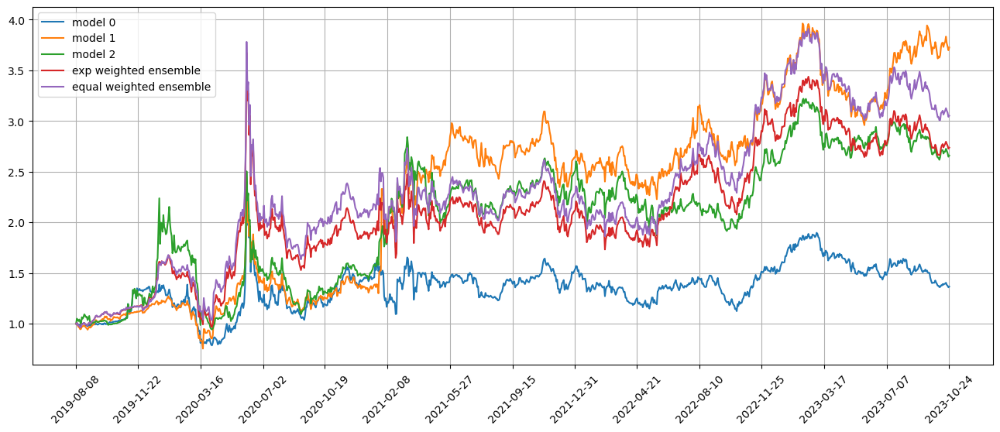

Standardization data are from 2022-03-21 to 2023-01-04
Training data are from 2023-01-05 to 2023-10-20
Testing data are from 2023-09-26 to 2023-11-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 54 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.214252233505249
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2936675548553467
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 1.213215708732605
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.290244698524475
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.21658444

Testing data from 2023-09-29 to 2023-10-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-27 are ['SDS', 'BCS', 'QID', 'RPD', 'INFN', 'SPXU', 'PRG', 'HCA', 'ONB', 'GVI']
position on 2023-10-30 market open will be {'INFN': 0.13183652524731926, 'SPXU': 0.13638301433906536, 'RPD': 0.13457324927757955, 'GVI': 0.13541513913567466, 'QID': 0.13476915554838384, 'PRG': 0.13141058599971672, 'SDS': 0.13624310934398792, 'HCA': 0.13757506082573331, 'BCS': 0.1364068405457212, 'ONB': 0.13676004691269347}
Total asset on 2023-10-30 will be 1.3513727271758522
It should be the same as 1.3513727271758755
top_stocks by model 1 to buy on 2023-10-27 are ['RPD', 'ONB', 'JAZZ', 'INFN', 'HCA', 'SEIC', 'WAFD', 'BCS', 'VMI', 'GVI']
position on 2023-10-30 market open will be {'INFN': 0.36317608535340873, 'RPD': 0.3707150637824746, 'WAFD': 0.37476464246457597, 'HCA': 0.37898429088006386, 'GVI': 0.37303425614883995, 'JAZZ': 0.37166169953295164, 'BCS': 0.37576614122594215, 'VMI': 0.3674274

Testing data from 2023-10-04 to 2023-10-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-01 are ['BCPC', 'FBT', 'SSNC', 'ABBV', 'LPLA', 'CNNE', 'KNSL', 'ERIE', 'HUBG', 'PAR']
position on 2023-11-02 market open will be {'ABBV': 0.13569180691010524, 'SSNC': 0.13464451299900973, 'LPLA': 0.13202456865200948, 'FBT': 0.1383966643116151, 'BCPC': 0.13871572257123757, 'CNNE': 0.1411596962080197, 'KNSL': 0.14358369091721312, 'PAR': 0.14061861903949993, 'ERIE': 0.13599842513771043, 'HUBG': 0.13558874777056826}
Total asset on 2023-11-02 will be 1.376422454516965
It should be the same as 1.3764224545169885
top_stocks by model 1 to buy on 2023-11-01 are ['IGT', 'GPN', 'FBT', 'SSNC', 'LPLA', 'ERIE', 'KNSL', 'CNNE', 'HUBG', 'PAR']
position on 2023-11-02 market open will be {'SSNC': 0.3689243263097267, 'ERIE': 0.37263402908577964, 'IGT': 0.38049401662310867, 'LPLA': 0.361745710696975, 'FBT': 0.37920517522352737, 'CNNE': 0.38677584897954487, 'KNSL': 0.39341756497040814, 'PAR

position on 2023-11-07 market open will be {'EIDO': 0.13909420720879864, 'DPZ': 0.14254190475896927, 'FOXF': 0.1392419374989375, 'KSA': 0.1414490996047729, 'CLH': 0.13834628498097185, 'YUMC': 0.13731391243599814, 'MAT': 0.13834994276154608, 'CCK': 0.1385957826085132, 'BCS': 0.1378570420734701, 'CDW': 0.14161415407151295}
Total asset on 2023-11-07 will be 1.3944042680034672
It should be the same as 1.394404268003491
top_stocks by model 1 to buy on 2023-11-06 are ['KSA', 'CCK', 'CDW', 'BCS', 'MAT', 'ELF', 'BALL', 'DPZ', 'CLH', 'YUMC']
position on 2023-11-07 market open will be {'DPZ': 0.39705556844896833, 'KSA': 0.39401152064816813, 'CLH': 0.3853685196560857, 'YUMC': 0.3824928090474139, 'ELF': 0.4069780044016453, 'MAT': 0.3853787085345605, 'BALL': 0.38473230313974316, 'CCK': 0.3860635042116633, 'BCS': 0.38400571605754946, 'CDW': 0.39447128576234514}
Total asset on 2023-11-07 will be 3.9005579399080923
It should be the same as 3.900557939908143
top_stocks by model 2 to buy on 2023-11-06 a

Testing data from 2023-10-12 to 2023-11-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-09 are ['ERY', 'CATY', 'BCO', 'FAZ', 'SPDN', 'AME', 'DPST', 'HUBG', 'INFY', 'RDFN']
position on 2023-11-10 market open will be {'DPST': 0.13493800174681903, 'SPDN': 0.14122468036368888, 'CATY': 0.13975965639775775, 'BCO': 0.1389155868066328, 'RDFN': 0.12441823792936614, 'FAZ': 0.14220877282641123, 'AME': 0.14029110649236526, 'INFY': 0.13916905660464374, 'ERY': 0.14040591714741518, 'HUBG': 0.13815604231436374}
Total asset on 2023-11-10 will be 1.37948705862944
It should be the same as 1.3794870586294639
top_stocks by model 1 to buy on 2023-11-09 are ['HRL', 'FIBK', 'SXT', 'CATY', 'ECPG', 'DPST', 'INFY', 'FMC', 'HUBG', 'RDFN']
position on 2023-11-10 market open will be {'DPST': 0.3592480501569357, 'SXT': 0.386456504084533, 'CATY': 0.38890027724534426, 'FMC': 0.3676273539982823, 'HRL': 0.3912819738565599, 'FIBK': 0.3827351492696835, 'RDFN': 0.3462106910695295, 'INFY': 0.38

top_stocks by model 0 to buy on 2023-11-14 are ['SLAB', 'BDX', 'QCOM', 'GLOB', 'G', 'FTNT', 'PDI', 'ELS', 'NTCT', 'IVW']
position on 2023-11-15 market open will be {'ELS': 0.14554242110486512, 'NTCT': 0.14665939983707754, 'G': 0.147001363408992, 'PDI': 0.1425156906635304, 'FTNT': 0.14352204059474472, 'GLOB': 0.14679465386469318, 'SLAB': 0.14701001671457667, 'QCOM': 0.14299833946949175, 'BDX': 0.1402968822421664, 'IVW': 0.14328374149161485}
Total asset on 2023-11-15 will be 1.4456245493917292
It should be the same as 1.4456245493917526
top_stocks by model 1 to buy on 2023-11-14 are ['QCOM', 'G', 'GLOB', 'PDI', 'IHI', 'FTNT', 'ELS', 'SLAB', 'NTCT', 'IVW']
position on 2023-11-15 market open will be {'ELS': 0.3889534742032668, 'NTCT': 0.3919385335090492, 'G': 0.3928524108400527, 'PDI': 0.38086471690696144, 'FTNT': 0.38355412731417193, 'IHI': 0.3842075433876395, 'GLOB': 0.3922999918628524, 'QCOM': 0.38215456716830526, 'SLAB': 0.3928755362851631, 'IVW': 0.3829172871176281}
Total asset on 202

top_stocks by model 0 to buy on 2023-11-17 are ['J', 'JDST', 'ESI', 'DUST', 'EBAY', 'TAN', 'SEDG', 'YUMC', 'HZO', 'CSIQ']
position on 2023-11-20 market open will be {'ESI': 0.14529842583300626, 'SEDG': 0.14879795152816777, 'DUST': 0.1517513337076219, 'YUMC': 0.14587479044035484, 'CSIQ': 0.1432762238586788, 'J': 0.1470878329445211, 'EBAY': 0.1438914376102406, 'TAN': 0.14685926141600286, 'JDST': 0.15163359626389203, 'HZO': 0.14560602623156754}
Total asset on 2023-11-20 will be 1.4700768798340305
It should be the same as 1.4700768798340536
top_stocks by model 1 to buy on 2023-11-17 are ['GE', 'SDOW', 'FFIV', 'HTGC', 'DUST', 'ESI', 'JDST', 'CSIQ', 'SEDG', 'HZO']
position on 2023-11-20 market open will be {'ESI': 0.3826945396307734, 'FFIV': 0.3855723815677145, 'SEDG': 0.3919117721448759, 'SDOW': 0.38645713404413373, 'GE': 0.38555913188728713, 'DUST': 0.39969054350485556, 'CSIQ': 0.3773683590533243, 'HTGC': 0.3863335757365511, 'JDST': 0.3993804405111914, 'HZO': 0.38350471353487986}
Total ass

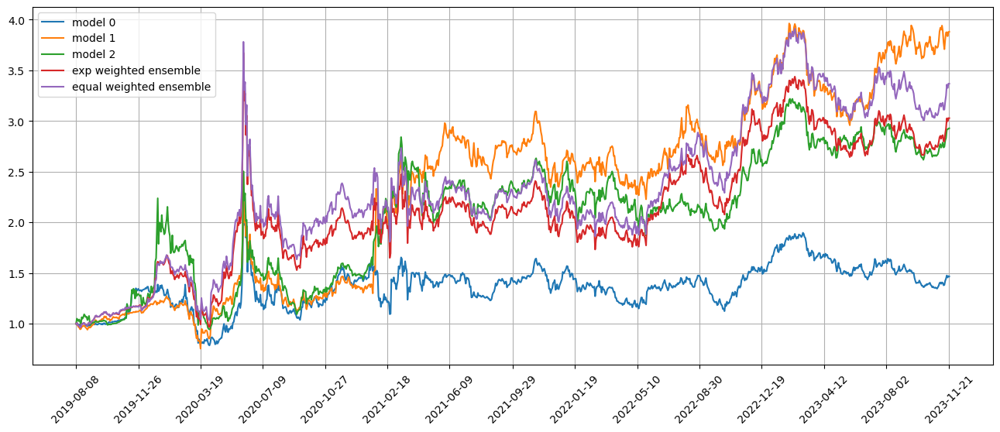

Standardization data are from 2022-04-19 to 2023-02-02
Training data are from 2023-02-03 to 2023-11-17
Testing data are from 2023-10-24 to 2023-12-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 55 out of 67 iterations
Restoring model weights from the end of the best epoch: 32.
Epoch 52: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2136030197143555
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1598010063171387
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.22415030002594
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1510955095291138
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.21391820

position on 2023-11-27 market open will be {'RHI': 0.33233895840046546, 'EW': 0.3380431412654947, 'VUZI': 0.3258270925594355, 'FMC': 0.329877134464868, 'FUN': 0.3335567881717003, 'VFC': 0.33166686668677053, 'WEN': 0.3363102260132754, 'MXL': 0.33659584398450987, 'MAT': 0.33799043958647534, 'HUBG': 0.33469062686446366}
Total asset on 2023-11-27 will be 3.336897117997386
It should be the same as 3.336897117997459
Testing data from 2023-10-27 to 2023-11-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-27 are ['UUP', 'FWRD', 'ONB', 'HUBG', 'TSEM', 'FTSL', 'AVNT', 'AEO', 'WCN', 'XENE']
position on 2023-11-28 market open will be {'HUBG': 0.14702492518959354, 'XENE': 0.17344508746376025, 'FTSL': 0.14632561612321437, 'WCN': 0.14569766193266098, 'FWRD': 0.143059643553092, 'UUP': 0.14563283053772996, 'AVNT': 0.14532073035135046, 'AEO': 0.15150973014706662, 'TSEM': 0.1427287518653129, 'ONB': 0.14553025873222195}
Total asset on 2023-11-28 will be 1.4862752358959794
It s

Testing data from 2023-11-01 to 2023-11-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-30 are ['OI', 'AGCO', 'UUUU', 'EL', 'SBRA', 'FNV', 'GEO', 'SLB', 'YUMC', 'MTZ']
position on 2023-12-01 market open will be {'SBRA': 0.15094162614281567, 'OI': 0.1488832215263354, 'SLB': 0.14778340752889418, 'FNV': 0.1478429057854292, 'YUMC': 0.14997984947349954, 'UUUU': 0.15575879383794203, 'GEO': 0.14491160594130068, 'MTZ': 0.15178134773042604, 'AGCO': 0.14944996010774805, 'EL': 0.14975898867014206}
Total asset on 2023-12-01 will be 1.4970917067445093
It should be the same as 1.4970917067445328
top_stocks by model 1 to buy on 2023-11-30 are ['RLI', 'PAYC', 'SBRA', 'MTZ', 'UUUU', 'HUM', 'OI', 'AGCO', 'SLB', 'YUMC']
position on 2023-12-01 market open will be {'PAYC': 0.3908388512870808, 'RLI': 0.39967745937720023, 'SBRA': 0.3978483417579044, 'OI': 0.392422847914618, 'SLB': 0.38952398438501673, 'YUMC': 0.3953133137288118, 'UUUU': 0.4105453175918764, 'MTZ': 0.4000616599107

Testing data from 2023-11-06 to 2023-12-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-12-05 are ['OHI', 'SRTY', 'SCCO', 'YUMC', 'DXD', 'MNST', 'AAOI', 'LABD', 'ACHC', 'JDST']
position on 2023-12-06 market open will be {'AAOI': 0.15460916989303777, 'YUMC': 0.15313561615064122, 'SRTY': 0.15427345205177692, 'ACHC': 0.15296310068290767, 'MNST': 0.15147766253659273, 'OHI': 0.1510349614082961, 'LABD': 0.14843627730990727, 'DXD': 0.15297958351392832, 'JDST': 0.15296319897927693, 'SCCO': 0.15245929063801403}
Total asset on 2023-12-06 will be 1.5243323131643547
It should be the same as 1.5243323131643791
top_stocks by model 1 to buy on 2023-12-05 are ['JDST', 'FHN', 'NSP', 'TZA', 'SRTY', 'GVI', 'PSTG', 'LABD', 'ACHC', 'IEP']
position on 2023-12-06 market open will be {'NSP': 0.4031231713194844, 'FHN': 0.4079031528865298, 'SRTY': 0.4095457181417417, 'PSTG': 0.40807612625979944, 'ACHC': 0.4060671624651534, 'TZA': 0.41010096403512936, 'GVI': 0.4091503792050854, 'IEP': 

top_stocks by model 0 to buy on 2023-12-08 are ['INSW', 'NYCB', 'CB', 'APA', 'EG', 'LPLA', 'MODG', 'KOLD', 'RNR', 'ACGL']
position on 2023-12-11 market open will be {'EG': 0.15136621038946127, 'MODG': 0.15222770322121662, 'KOLD': 0.17894259748665128, 'NYCB': 0.14905519711744858, 'LPLA': 0.15558226491423138, 'APA': 0.15211708955572734, 'RNR': 0.15079934258392969, 'ACGL': 0.15168100545760974, 'CB': 0.15111985490261298, 'INSW': 0.14868812039182974}
Total asset on 2023-12-11 will be 1.5415793860206943
It should be the same as 1.5415793860207185
top_stocks by model 1 to buy on 2023-12-08 are ['AON', 'AXS', 'APA', 'LPLA', 'MODG', 'ALT', 'ACGL', 'EG', 'IEP', 'RNR']
position on 2023-12-11 market open will be {'IEP': 0.39536894495956937, 'AON': 0.4097662276092077, 'MODG': 0.41047389586031324, 'EG': 0.4081509263125663, 'LPLA': 0.41951929284061545, 'AXS': 0.4070423045961777, 'ALT': 0.41873396698878745, 'APA': 0.4101756320013178, 'ACGL': 0.40899975445150716, 'RNR': 0.4066223974597319}
Total asset 

position on 2023-12-14 market open will be {'FNDE': 0.15752345569401166, 'RGLD': 0.16391514193044018, 'CTRA': 0.15742044179330947, 'FNV': 0.16502586867705651, 'HMY': 0.178154288073143, 'WPM': 0.16370688704927147, 'OXY': 0.16288070070236937, 'ALT': 0.1692426274286495, 'RRC': 0.1560524525883601, 'CVE': 0.16083886101730271}
Total asset on 2023-12-14 will be 1.63476072495389
It should be the same as 1.6347607249539142
top_stocks by model 1 to buy on 2023-12-13 are ['CTRA', 'WPM', 'KODK', 'YUMC', 'NUGT', 'BVN', 'RRC', 'LBTYA', 'IEP', 'ALT']
position on 2023-12-14 market open will be {'IEP': 0.3764842129978819, 'NUGT': 0.47856751107019563, 'CTRA': 0.41994914690853424, 'YUMC': 0.411794954234291, 'KODK': 0.42997931584091476, 'WPM': 0.4367194423813084, 'BVN': 0.4375196275476896, 'ALT': 0.45148708896738055, 'LBTYA': 0.42720812070506015, 'RRC': 0.4162997739741547}
Total asset on 2023-12-14 will be 4.286009194627355
It should be the same as 4.286009194627411
top_stocks by model 2 to buy on 2023-12

top_stocks by model 1 to buy on 2023-12-18 are ['SAH', 'NSP', 'LAD', 'BLDR', 'KODK', 'FHN', 'TGNA', 'PFSI', 'FIX', 'IEP']
position on 2023-12-19 market open will be {'IEP': 0.3711577418483179, 'NSP': 0.4503676656031545, 'BLDR': 0.43917953141473975, 'FHN': 0.44040745194898706, 'LAD': 0.44985262025753914, 'SAH': 0.44347777056877985, 'TGNA': 0.44863614958953535, 'KODK': 0.4517900094552358, 'PFSI': 0.44267944829490036, 'FIX': 0.449352171501645}
Total asset on 2023-12-19 will be 4.386900560482783
It should be the same as 4.386900560482835
top_stocks by model 2 to buy on 2023-12-18 are ['STNG', 'CRUS', 'UHAL', 'TBF', 'PFSI', 'NAIL', 'ABR', 'PII', 'SAH', 'ASR']
position on 2023-12-19 market open will be {'STNG': 0.3401863614131862, 'CRUS': 0.3389861145931917, 'NAIL': 0.33752931026784216, 'SAH': 0.33671085023146863, 'UHAL': 0.34845283665178156, 'PFSI': 0.3361047234097072, 'ASR': 0.34649591914882577, 'PII': 0.3384871279718178, 'ABR': 0.3410499747265719, 'TBF': 0.33800578910746193}
Total asset o

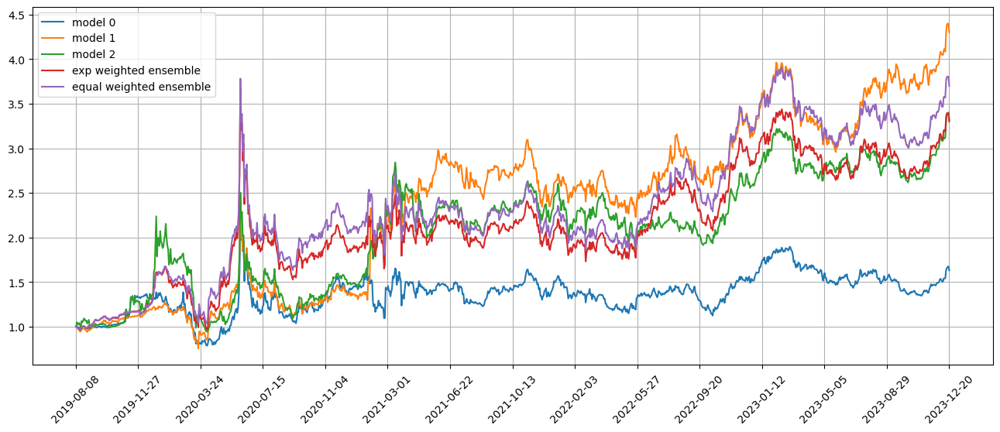

Standardization data are from 2022-05-17 to 2023-03-03
Training data are from 2023-03-06 to 2023-12-18
Testing data are from 2023-11-21 to 2024-01-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 56 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.2024275064468384
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1484323740005493
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.202225923538208
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1464128494262695
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.204572081

position on 2023-12-26 market open will be {'UMBF': 0.3307740826105367, 'CVBF': 0.33021645384563664, 'SAH': 0.3331982421283807, 'VC': 0.331764643008237, 'KALU': 0.3369340443538111, 'TCBI': 0.3336963860919234, 'CFG': 0.33047622817484484, 'JBT': 0.329534050113835, 'MDU': 0.3300434704991485, 'ECPG': 0.32843389911681725}
Total asset on 2023-12-26 will be 3.315071499943123
It should be the same as 3.3150714999431714
top_stocks by equal weighted ensemble to buy on 2023-12-22 are ['SAH', 'KALU', 'ECPG', 'CFG', 'UMBF', 'JBT', 'CVBF', 'VC', 'MDU', 'TCBI']
position on 2023-12-26 market open will be {'UMBF': 0.37088792950794575, 'CVBF': 0.37026267562948095, 'SAH': 0.3736060732551048, 'VC': 0.371998617782118, 'KALU': 0.3777949260863361, 'TCBI': 0.37416462845319387, 'CFG': 0.3705539534779114, 'JBT': 0.3694975149942253, 'MDU': 0.3700687141355453, 'ECPG': 0.3682639457792198}
Total asset on 2023-12-26 will be 3.717098979101006
It should be the same as 3.717098979101081
Testing data from 2023-11-27 to 

Testing data from 2023-11-30 to 2023-12-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-12-29 are ['FSLR', 'PSX', 'DHT', 'TTE', 'DK', 'XOM', 'PARR', 'CVX', 'SRNE', 'MAN']
position on 2024-01-02 market open will be {'CVX': 0.16539737908441393, 'PARR': 0.16489994209763706, 'SRNE': 0.16544148058761468, 'DHT': 0.1674508893434123, 'DK': 0.16297785360439335, 'FSLR': 0.16308552402263257, 'XOM': 0.1663480468375124, 'PSX': 0.16564000498753842, 'MAN': 0.16448661317835336, 'TTE': 0.16580880556435532}
Total asset on 2024-01-02 will be 1.6515365393078392
It should be the same as 1.6515365393078634
top_stocks by model 1 to buy on 2023-12-29 are ['ODFL', 'INSW', 'XOM', 'SIGI', 'EHTH', 'CVX', 'WU', 'DHT', 'MAN', 'SRNE']
position on 2024-01-02 market open will be {'CVX': 0.4324026169687799, 'EHTH': 0.4207885784185541, 'SRNE': 0.43251791266150386, 'ODFL': 0.4254604836574615, 'SIGI': 0.4308283921473091, 'DHT': 0.4377711615906989, 'XOM': 0.4348879720970363, 'WU': 0.4288924344425

position on 2024-01-05 market open will be {'AAOI': 0.1615557275753573, 'TPL': 0.15741329720536873, 'BBY': 0.16184579346428757, 'IRBT': 0.15972441447785765, 'DBI': 0.15889994777616454, 'BTU': 0.1655290858708031, 'MAT': 0.16313853830940048, 'INFY': 0.16196704109249146, 'THRM': 0.15872343993269322, 'VC': 0.16215097949967688}
Total asset on 2024-01-05 will be 1.610948265204077
It should be the same as 1.610948265204101
top_stocks by model 1 to buy on 2024-01-04 are ['AN', 'SANM', 'AAOI', 'MAT', 'ERY', 'VC', 'BBY', 'IVW', 'UHAL', 'DBI']
position on 2024-01-05 market open will be {'IVW': 0.42356442239066977, 'AAOI': 0.4475429537239125, 'BBY': 0.42627044075350023, 'SANM': 0.4306827635209948, 'DBI': 0.41851165436190274, 'UHAL': 0.42115348728058893, 'MAT': 0.4296752800336122, 'AN': 0.4169918640643937, 'ERY': 0.4387612207558775, 'VC': 0.4270742416001742}
Total asset on 2024-01-05 will be 4.280228328485571
It should be the same as 4.280228328485627
top_stocks by model 2 to buy on 2024-01-04 are 

Testing data from 2023-12-08 to 2024-01-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-01-09 are ['THG', 'CCEP', 'ITUB', 'VC', 'AAOI', 'FLR', 'ARW', 'ALK', 'MMS', 'FIX']
position on 2024-01-10 market open will be {'FLR': 0.1578163294509438, 'AAOI': 0.1754591997775992, 'MMS': 0.15824161667624909, 'ITUB': 0.15769116690722232, 'ARW': 0.15713183863596655, 'THG': 0.15725331945436516, 'ALK': 0.1529501189971326, 'FIX': 0.15955136249168095, 'CCEP': 0.15687200079926128, 'VC': 0.15758323994888887}
Total asset on 2024-01-10 will be 1.5905501931392851
It should be the same as 1.5905501931393096
top_stocks by model 1 to buy on 2024-01-09 are ['SANM', 'EXTR', 'ALK', 'FORM', 'ARW', 'VC', 'EHTH', 'APPN', 'SEE', 'FIX']
position on 2024-01-10 market open will be {'APPN': 0.41565003040056936, 'SEE': 0.4159098114588864, 'EXTR': 0.43306488945760513, 'SANM': 0.4138643024437919, 'EHTH': 0.432114594557873, 'ARW': 0.41846831893174435, 'FORM': 0.42770621302406553, 'ALK': 0.4073317014

position on 2024-01-16 market open will be {'ABG': 0.15213432343024583, 'BKR': 0.15903442479499527, 'WES': 0.16187504667427036, 'EXTR': 0.15805906158793334, 'CLB': 0.15729489685377795, 'LNG': 0.15930793562219825, 'GNW': 0.15860342563777002, 'FWRD': 0.15693380057477335, 'DHT': 0.16295930519851962, 'WWD': 0.16083214434632087}
Total asset on 2024-01-16 will be 1.5870343647207803
It should be the same as 1.5870343647208047
top_stocks by model 1 to buy on 2024-01-12 are ['MAN', 'DNN', 'EXTR', 'GNW', 'PBI', 'FTI', 'BKR', 'DHT', 'CEIX', 'CLB']
position on 2024-01-16 market open will be {'EXTR': 0.41023941290555377, 'CEIX': 0.42294380097820167, 'BKR': 0.41966025786271427, 'FTI': 0.42193753591502287, 'CLB': 0.4150699891500649, 'GNW': 0.41852293669660245, 'PBI': 0.4107285361273943, 'DHT': 0.4300172376445858, 'MAN': 0.41977775182509275, 'DNN': 0.4632195626185449}
Total asset on 2024-01-16 will be 4.232117021723722
It should be the same as 4.232117021723777
top_stocks by model 2 to buy on 2024-01-

Testing data from 2023-12-18 to 2024-01-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-01-18 are ['AZUL', 'CHH', 'MAT', 'SAVE', 'CLB', 'MWA', 'ETSY', 'HDB', 'HAS', 'TTD']
position on 2024-01-19 market open will be {'CHH': 0.1637194030458242, 'ETSY': 0.16598770945194255, 'CLB': 0.16626686271116933, 'TTD': 0.16051550178577095, 'HDB': 0.15838277751458693, 'SAVE': 0.19967509756820406, 'MAT': 0.16290450251779925, 'HAS': 0.16182754131069532, 'MWA': 0.16505938683009871, 'AZUL': 0.1627859354683455}
Total asset on 2024-01-19 will be 1.6671247182044118
It should be the same as 1.6671247182044366
top_stocks by model 1 to buy on 2024-01-18 are ['MAT', 'AZUL', 'MOMO', 'OXM', 'AEHR', 'LNTH', 'BIL', 'HDB', 'TTD', 'SAVE']
position on 2024-01-19 market open will be {'BIL': 0.431663605272606, 'TTD': 0.4288790862277985, 'LNTH': 0.4285257840666915, 'HDB': 0.423180690581115, 'SAVE': 0.5335090532364345, 'MAT': 0.4352622233052211, 'OXM': 0.4327800183343999, 'AEHR': 0.4179151912423

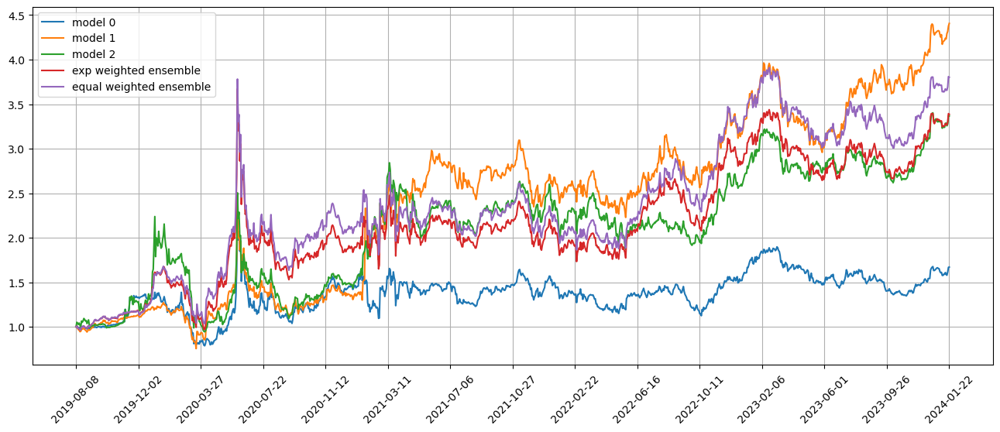

Standardization data are from 2022-06-15 to 2023-03-31
Training data are from 2023-04-03 to 2024-01-18
Testing data are from 2023-12-20 to 2024-02-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 57 out of 67 iterations
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1986874341964722
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1999213695526123
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1989644765853882
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1985487937927246
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.20049

Testing data from 2023-12-26 to 2024-01-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-01-25 are ['EXPO', 'JBL', 'NFG', 'GFI', 'EQNR', 'KNDI', 'GDOT', 'PI', 'AEHR', 'ARKG']
position on 2024-01-26 market open will be {'AEHR': 0.1625896682362975, 'ARKG': 0.17143034125052992, 'GDOT': 0.1727006176503163, 'EXPO': 0.17312837831505948, 'NFG': 0.1745869503415786, 'GFI': 0.17910289555577777, 'PI': 0.1669192346003725, 'EQNR': 0.17521106254957466, 'KNDI': 0.16602875143576, 'JBL': 0.17373071535314435}
Total asset on 2024-01-26 will be 1.7154286152883877
It should be the same as 1.7154286152884113
top_stocks by model 1 to buy on 2024-01-25 are ['RUSHA', 'KW', 'SUSA', 'QID', 'KNDI', 'ECH', 'CLB', 'PI', 'EQNR', 'AEHR']
position on 2024-01-26 market open will be {'AEHR': 0.4287966118697366, 'KW': 0.44660153062861024, 'CLB': 0.44558782881665965, 'RUSHA': 0.4514626982122924, 'PI': 0.4255384253737252, 'QID': 0.4512984027422781, 'ECH': 0.4342868482667771, 'EQNR': 0.446677339756

top_stocks by model 0 to buy on 2024-01-30 are ['MPC', 'WTM', 'VTLE', 'CNQ', 'ACGL', 'INSW', 'AR', 'NAT', 'DHT', 'FRO']
position on 2024-01-31 market open will be {'MPC': 0.17624638124567962, 'AR': 0.17267021963507856, 'WTM': 0.1694859921228954, 'VTLE': 0.1765938235773698, 'DHT': 0.1717549372133548, 'FRO': 0.1717480036190734, 'ACGL': 0.17111604170873126, 'CNQ': 0.17209050612891227, 'INSW': 0.1747881389488826, 'NAT': 0.16860382181973063}
Total asset on 2024-01-31 will be 1.725097866019685
It should be the same as 1.725097866019708
top_stocks by model 1 to buy on 2024-01-30 are ['CNQ', 'FRO', 'EQT', 'LMT', 'NOC', 'KOS', 'ACGL', 'DHT', 'BP', 'XOM']
position on 2024-01-31 market open will be {'KOS': 0.4449223402644681, 'BP': 0.4315181381394127, 'DHT': 0.4392210350046831, 'FRO': 0.43920330404156793, 'XOM': 0.43997257498338227, 'EQT': 0.4396531523558578, 'ACGL': 0.4375872167904678, 'CNQ': 0.4400791700242515, 'NOC': 0.43249632016771367, 'LMT': 0.4312624630238591}
Total asset on 2024-01-31 wil

position on 2024-02-05 market open will be {'PRTA': 0.15828347063466655, 'NTCT': 0.16480401264925915, 'CLB': 0.16692106015725422, 'SDOW': 0.16612901458124024, 'PI': 0.17093446755689207, 'FORM': 0.1709182912550737, 'SNDR': 0.16868973687795769, 'MAN': 0.16838933575595486, 'DXD': 0.1670851819889377, 'EQT': 0.16751081198742163}
Total asset on 2024-02-05 will be 1.6696653834446344
It should be the same as 1.6696653834446578
top_stocks by model 1 to buy on 2024-02-02 are ['LSCC', 'SNDR', 'EQT', 'PI', 'NTCT', 'CLB', 'DXD', 'TKO', 'KOS', 'MAN']
position on 2024-02-05 market open will be {'KOS': 0.4000090210739328, 'LSCC': 0.43957368118492934, 'NTCT': 0.4161444512943636, 'CLB': 0.4214901801963272, 'PI': 0.43162438259404134, 'SNDR': 0.4259562425914261, 'EQT': 0.42297935480937, 'MAN': 0.42519770365736426, 'DXD': 0.42190460208141023, 'TKO': 0.42027910195265705}
Total asset on 2024-02-05 will be 4.2251587214357675
It should be the same as 4.225158721435822
top_stocks by model 2 to buy on 2024-02-02

position on 2024-02-08 market open will be {'VTLE': 0.16913881937870273, 'PRTA': 0.16972618878782772, 'LABU': 0.16047335001849258, 'TFLO': 0.16803342367886598, 'APLS': 0.16685102511642116, 'IMO': 0.1663055532165915, 'RILY': 0.16092648438756435, 'SANM': 0.165578752176449, 'FAZ': 0.16881046486467627, 'ACMR': 0.16820505191536456}
Total asset on 2024-02-08 will be 1.6640491135409325
It should be the same as 1.6640491135409559
top_stocks by model 1 to buy on 2024-02-07 are ['XOM', 'SANM', 'DBC', 'EXTR', 'RILY', 'SU', 'EXPO', 'KOS', 'SRNE', 'FAZ']
position on 2024-02-08 market open will be {'KOS': 0.39579840367413494, 'EXPO': 0.4169266215239411, 'EXTR': 0.4245695728261287, 'SANM': 0.42153205528331267, 'RILY': 0.40968826508076855, 'SRNE': 0.42769652254000284, 'FAZ': 0.4297593820003415, 'XOM': 0.4280729638188014, 'DBC': 0.4300326146313126, 'SU': 0.428896047379731}
Total asset on 2024-02-08 will be 4.21297244875842
It should be the same as 4.212972448758475
top_stocks by model 2 to buy on 2024-

position on 2024-02-13 market open will be {'VOYA': 0.16478038828556513, 'KOS': 0.17555919002463544, 'AR': 0.1687721711488562, 'HSY': 0.17222385958745662, 'IBKR': 0.16845566165096393, 'CNX': 0.16977649125736474, 'UUUU': 0.1703437507967476, 'BTU': 0.1664918573260992, 'XOM': 0.1700843123413068, 'RRC': 0.17023454307869446}
Total asset on 2024-02-13 will be 1.6967222254976668
It should be the same as 1.6967222254976901
top_stocks by model 1 to buy on 2024-02-12 are ['SLB', 'CALX', 'HAE', 'GLNG', 'NAT', 'XOM', 'SBUX', 'RRC', 'KOS', 'BTU']
position on 2024-02-13 market open will be {'KOS': 0.4138365052630177, 'SBUX': 0.40756555402073935, 'HAE': 0.4107353295317625, 'SLB': 0.42092702072274224, 'CALX': 0.40772415013209673, 'GLNG': 0.4178174096551218, 'BTU': 0.4100581852810279, 'XOM': 0.4189061590372125, 'RRC': 0.4192761671837728, 'NAT': 0.4214181150932888}
Total asset on 2024-02-13 will be 4.148264595920728
It should be the same as 4.148264595920782
top_stocks by model 2 to buy on 2024-02-12 ar

top_stocks by model 1 to buy on 2024-02-15 are ['GOGO', 'CSL', 'CAR', 'SBUX', 'YUMC', 'SILJ', 'GNRC', 'NUGT', 'ENR', 'SRNE']
position on 2024-02-16 market open will be {'SBUX': 0.40945855696339406, 'GNRC': 0.4141055391917403, 'CSL': 0.41074246322427327, 'NUGT': 0.4218366307381713, 'SRNE': 0.41354874589114826, 'YUMC': 0.42648174946162454, 'GOGO': 0.4061639342811397, 'SILJ': 0.41455252798522146, 'CAR': 0.4071617515158009, 'ENR': 0.4169744312929823}
Total asset on 2024-02-16 will be 4.141026330545438
It should be the same as 4.141026330545496
top_stocks by model 2 to buy on 2024-02-15 are ['ENS', 'EG', 'LNG', 'SONY', 'CAR', 'CLB', 'SRNE', 'AGI', 'SBUX', 'SLB']
position on 2024-02-16 market open will be {'LNG': 0.33283938822129283, 'SLB': 0.33467377795304504, 'SBUX': 0.3275232813586174, 'EG': 0.33615977634471644, 'CLB': 0.3454196209175083, 'SONY': 0.3269160734024081, 'SRNE': 0.3307949973264791, 'ENS': 0.33133919291965747, 'AGI': 0.3279677057889155, 'CAR': 0.32568608136842325}
Total asset o

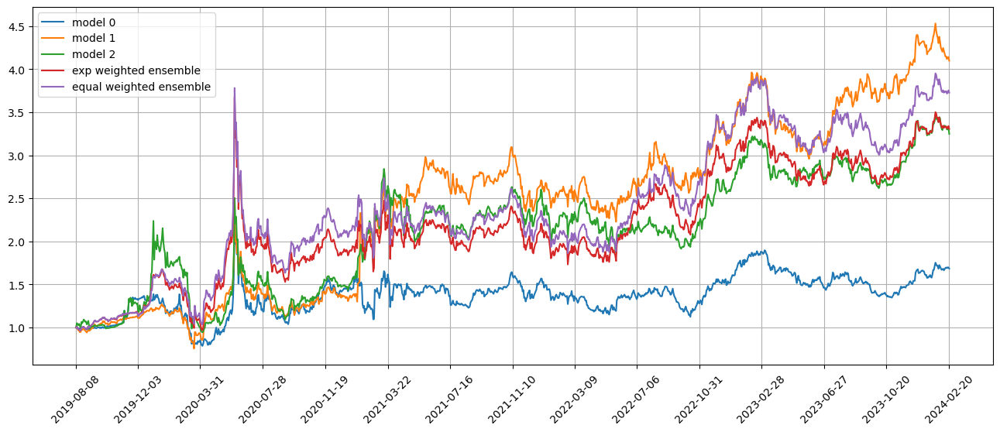

Standardization data are from 2022-07-15 to 2023-05-01
Training data are from 2023-05-02 to 2024-02-15
Testing data are from 2024-01-22 to 2024-03-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 58 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 1.1893818378448486
11/11 [==============================] - 0s 4ms/step
Model 0 test loss 1.1690279245376587
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1914809942245483
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.170503854751587
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.18873679

position on 2024-02-23 market open will be {'EQNR': 0.33166882986773955, 'SBUX': 0.336699322785967, 'EG': 0.339136744238971, 'RILY': 0.29087759140648556, 'HP': 0.3287925244657727, 'RIG': 0.3256806845598748, 'AGI': 0.3289323615292682, 'ASHR': 0.33391958930865995, 'KNDI': 0.3294646248582943, 'ERIE': 0.3321380381970241}
Total asset on 2024-02-23 will be 3.277310311218008
It should be the same as 3.277310311218057
top_stocks by equal weighted ensemble to buy on 2024-02-22 are ['ASHR', 'ERIE', 'HP', 'RIG', 'EQNR', 'AGI', 'KNDI', 'EG', 'RILY', 'SBUX']
position on 2024-02-23 market open will be {'EQNR': 0.37395432060649214, 'SBUX': 0.3796373600478457, 'EG': 0.3823856169735973, 'RILY': 0.3279721502999012, 'HP': 0.3707222365605988, 'RIG': 0.3672135550551192, 'AGI': 0.3708799065350526, 'ASHR': 0.37650313729316465, 'KNDI': 0.37148004746616514, 'ERIE': 0.3744943914625659}
Total asset on 2024-02-23 will be 3.6952427223004216
It should be the same as 3.6952427223005024
Testing data from 2024-01-25 t

position on 2024-02-28 market open will be {'APPN': 0.3633512281874471, 'CORT': 0.3764176200037682, 'TTD': 0.37417075430517954, 'PI': 0.3597309280433869, 'TXRH': 0.36379942068939725, 'ATKR': 0.36844196933532947, 'YEXT': 0.3665704801435948, 'CBRL': 0.3436104662008013, 'JACK': 0.36661538834203994, 'CARS': 0.37620002598549307}
Total asset on 2024-02-28 will be 3.658908281236357
It should be the same as 3.658908281236438
Testing data from 2024-01-30 to 2024-02-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-02-28 are ['WPM', 'GOLD', 'SANM', 'DBC', 'NUGT', 'VSH', 'BBVA', 'MUFG', 'ERJ', 'AGI']
position on 2024-02-29 market open will be {'NUGT': 0.16915444930828072, 'ERJ': 0.16719709966427973, 'BBVA': 0.16237331288139306, 'SANM': 0.1681470475532916, 'VSH': 0.1721610601160493, 'WPM': 0.17097913475126858, 'AGI': 0.1700834749640483, 'MUFG': 0.1675848885261275, 'DBC': 0.163373565318982, 'GOLD': 0.16745842867866823}
Total asset on 2024-02-29 will be 1.6785124617623668
It

top_stocks by model 0 to buy on 2024-03-04 are ['VYX', 'BMRN', 'DOC', 'SCO', 'PIPR', 'KOLD', 'QLYS', 'SQ', 'VKTX', 'META']
position on 2024-03-05 market open will be {'VKTX': 0.16738628427547375, 'META': 0.16806586944634605, 'SCO': 0.1772061761448014, 'KOLD': 0.17297680153934306, 'QLYS': 0.16913178293668532, 'DOC': 0.16946760780395928, 'BMRN': 0.16984596613213174, 'VYX': 0.16885819550648903, 'SQ': 0.16364287014582918, 'PIPR': 0.17180591690968888}
Total asset on 2024-03-05 will be 1.6983874708407252
It should be the same as 1.6983874708407474
top_stocks by model 1 to buy on 2024-03-04 are ['FNV', 'SCO', 'VYX', 'PI', 'HCSG', 'RGNX', 'HUN', 'META', 'HPE', 'KOLD']
position on 2024-03-05 market open will be {'RGNX': 0.5388114388104777, 'SCO': 0.4266034437625397, 'HPE': 0.4423441146745196, 'HUN': 0.4135613911160455, 'KOLD': 0.4164217118900793, 'HCSG': 0.4053475281035179, 'FNV': 0.4187961013520445, 'PI': 0.39984377724206177, 'VYX': 0.40650664258865166, 'META': 0.40459920892469403}
Total asset

Testing data from 2024-02-07 to 2024-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-07 are ['LMT', 'TZA', 'SRTY', 'MMM', 'TWM', 'KOS', 'CRTO', 'OI', 'ULTA', 'XPO']
position on 2024-03-08 market open will be {'KOS': 0.17222526741115693, 'MMM': 0.17365077687910788, 'OI': 0.17968780440078425, 'SRTY': 0.1679515534363015, 'TWM': 0.1693673820065901, 'TZA': 0.16794198413288908, 'CRTO': 0.17423357424287972, 'XPO': 0.17591001023076114, 'ULTA': 0.17268583390126574, 'LMT': 0.1706432140702098}
Total asset on 2024-03-08 will be 1.7242974007119243
It should be the same as 1.7242974007119463
top_stocks by model 1 to buy on 2024-03-07 are ['RSG', 'OTEX', 'KOS', 'ASH', 'NKE', 'VYX', 'HUM', 'LMT', 'ERIE', 'BAND']
position on 2024-03-08 market open will be {'KOS': 0.4323879510103809, 'OTEX': 0.4357519564771218, 'NKE': 0.43810730513492985, 'BAND': 0.4582476373626673, 'RSG': 0.43255744366660787, 'ASH': 0.43847528956469217, 'VYX': 0.4509136329422184, 'HUM': 0.43817337720278

top_stocks by model 0 to buy on 2024-03-12 are ['WKC', 'OII', 'HDB', 'GUNR', 'KRNT', 'PFSI', 'ASHR', 'ASH', 'PKX', 'KOLD']
position on 2024-03-13 market open will be {'ASH': 0.17026400747239828, 'WKC': 0.17225838455064793, 'PKX': 0.17017298134720998, 'KOLD': 0.19393713034663107, 'OII': 0.17106334747196153, 'HDB': 0.1709724650753424, 'PFSI': 0.17129561212474423, 'KRNT': 0.16981211476674987, 'GUNR': 0.17169855670754697, 'ASHR': 0.16974099952963698}
Total asset on 2024-03-13 will be 1.7312155993928473
It should be the same as 1.7312155993928695
top_stocks by model 1 to buy on 2024-03-12 are ['UHAL', 'FTV', 'OXY', 'CMP', 'DBA', 'KRNT', 'AGI', 'CWEB', 'ASH', 'PKX']
position on 2024-03-13 market open will be {'KRNT': 0.43346132997345493, 'DBA': 0.4407133945375457, 'CWEB': 0.4572175880401526, 'PKX': 0.43584902851043855, 'FTV': 0.44533289794751374, 'AGI': 0.4451910070598654, 'UHAL': 0.44448713492597214, 'OXY': 0.44048123306970666, 'ASH': 0.4348940697159779, 'CMP': 0.43419094676557696}
Total as

position on 2024-03-18 market open will be {'CVBF': 0.1677871653579422, 'CBU': 0.16989982446595386, 'HEFA': 0.16741364306921122, 'MFC': 0.16769116893856245, 'BOKF': 0.16988274959800453, 'INDB': 0.17188535572760075, 'FULT': 0.16945804655028135, 'RS': 0.17108429015599502, 'FIBK': 0.1700336759109416, 'COLB': 0.16677639976778663}
Total asset on 2024-03-18 will be 1.6919123195422576
It should be the same as 1.6919123195422794
top_stocks by model 1 to buy on 2024-03-15 are ['COLB', 'YEXT', 'EXPO', 'KRNT', 'BOKF', 'SBUX', 'CATY', 'FULT', 'CVBF', 'GL']
position on 2024-03-18 market open will be {'CVBF': 0.42881942229478875, 'SBUX': 0.42332841583836783, 'EXPO': 0.43912744083944383, 'CATY': 0.4304762735043112, 'BOKF': 0.4335954223500039, 'FULT': 0.4325114435600054, 'YEXT': 0.41876309864275574, 'KRNT': 0.42929484092166054, 'GL': 0.43518001026102693, 'COLB': 0.4256670183785155}
Total asset on 2024-03-18 will be 4.29676338659082
It should be the same as 4.29676338659088
top_stocks by model 2 to buy

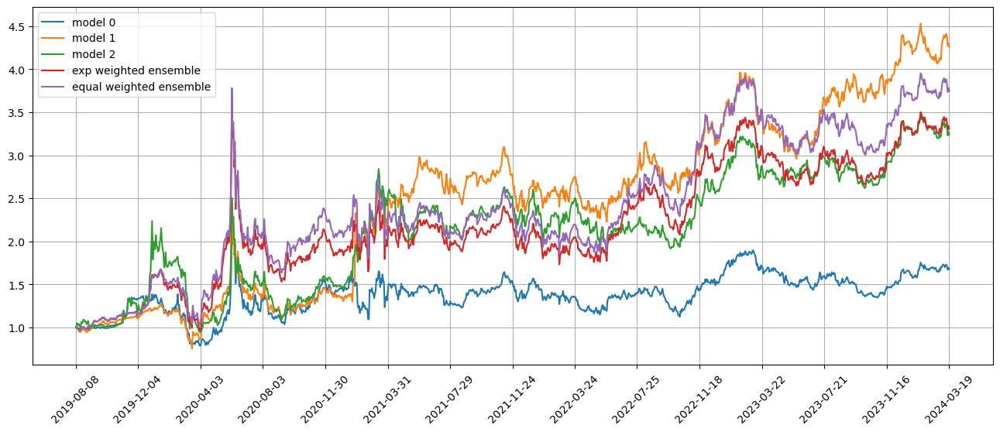

Standardization data are from 2022-08-12 to 2023-05-30
Training data are from 2023-05-31 to 2024-03-15
Testing data are from 2024-02-20 to 2024-04-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 59 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1790896654129028
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2799310684204102
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1742911338806152
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2801151275634766
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.168483

position on 2024-03-22 market open will be {'SAIC': 0.3443496832227318, 'NTCT': 0.3397163116017623, 'W': 0.34563511545609366, 'PB': 0.34646213106895746, 'RWT': 0.34344620813976834, 'FIBK': 0.3475292050178888, 'VLY': 0.3504161422294447, 'VIAV': 0.3447829356504044, 'BERY': 0.3432478989531471, 'HZO': 0.34901006149801567}
Total asset on 2024-03-22 will be 3.4545956928381645
It should be the same as 3.454595692838214
top_stocks by equal weighted ensemble to buy on 2024-03-21 are ['PB', 'W', 'HZO', 'RWT', 'VIAV', 'BERY', 'FIBK', 'NTCT', 'SAIC', 'VLY']
position on 2024-03-22 market open will be {'SAIC': 0.38975614303802514, 'NTCT': 0.3845118081649687, 'W': 0.3912110742716567, 'PB': 0.39214714138949264, 'RWT': 0.38873353439099173, 'FIBK': 0.3933549212915372, 'VLY': 0.39662253432442385, 'VIAV': 0.3902465247732171, 'BERY': 0.38850907586097905, 'HZO': 0.39503104570287806}
Total asset on 2024-03-22 will be 3.910123803208089
It should be the same as 3.9101238032081698
Testing data from 2024-02-23 t

Testing data from 2024-02-28 to 2024-03-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-27 are ['REXR', 'WAFD', 'MFC', 'FIVE', 'O', 'CBU', 'DRI', 'AGO', 'KRC', 'PRKS']
position on 2024-03-28 market open will be {'MFC': 0.1759941009667509, 'KRC': 0.17647622320886203, 'O': 0.17451637918317406, 'WAFD': 0.1804445458130146, 'PRKS': 0.18170365205731312, 'FIVE': 0.17740614988895942, 'REXR': 0.17601885302005182, 'CBU': 0.17760287189661886, 'DRI': 0.17628848457150095, 'AGO': 0.16819849582356558}
Total asset on 2024-03-28 will be 1.764649756429789
It should be the same as 1.7646497564298116
top_stocks by model 1 to buy on 2024-03-27 are ['UPS', 'WAFD', 'VLY', 'CHRW', 'DRI', 'CSGP', 'BTG', 'EQT', 'CBU', 'VNO']
position on 2024-03-28 market open will be {'CHRW': 0.44714733096876724, 'BTG': 0.4382098711569356, 'CSGP': 0.4331995608816014, 'VNO': 0.44906804647550064, 'WAFD': 0.45123339675041324, 'CBU': 0.444127290173598, 'DRI': 0.4408404329583445, 'VLY': 0.44898109014155

top_stocks by model 1 to buy on 2024-04-02 are ['VLY', 'DNLI', 'M', 'GPC', 'PRKS', 'FIBK', 'CARS', 'TDS', 'INFN', 'PK']
position on 2024-04-03 market open will be {'INFN': 0.4679499032562041, 'PRKS': 0.4452781029822505, 'PK': 0.4431566834307831, 'VLY': 0.4279423647602837, 'M': 0.4473811679652083, 'GPC': 0.4462541546027678, 'DNLI': 0.42725886757765275, 'TDS': 0.45646815024054593, 'FIBK': 0.43804043181162333, 'CARS': 0.44442810856539755}
Total asset on 2024-04-03 will be 4.444157935192662
It should be the same as 4.444157935192718
top_stocks by model 2 to buy on 2024-04-02 are ['TDS', 'PK', 'DBA', 'FIBK', 'PRKS', 'CARS', 'RMBS', 'VLY', 'INFN', 'GBIL']
position on 2024-04-03 market open will be {'INFN': 0.3251807227262005, 'PRKS': 0.33158802725469877, 'RMBS': 0.31791644692453225, 'VLY': 0.31867851475110504, 'DBA': 0.3278942777055923, 'GBIL': 0.3314220350788443, 'TDS': 0.33667944577747105, 'FIBK': 0.32308762338126773, 'CARS': 0.327799013361342, 'PK': 0.32944135781215167}
Total asset on 202

position on 2024-04-08 market open will be {'VLY': 0.31993978419703817, 'RMBS': 0.33067308760979774, 'HEFA': 0.3349155463921767, 'TQQQ': 0.34280070945591556, 'DXCM': 0.34847978683285685, 'FAZ': 0.32423091913464863, 'QSR': 0.33258487997418273, 'IGV': 0.3361283617643089, 'FSM': 0.36272251884405093, 'SVXY': 0.33545748143001475}
Total asset on 2024-04-08 will be 3.367933075634915
It should be the same as 3.367933075634991
top_stocks by return weighted ensemble to buy on 2024-04-05 are ['UBS', 'XLK', 'ARKK', 'TQQQ', 'QLD', 'RMBS', 'QTEC', 'CIBR', 'SVXY', 'IGV']
position on 2024-04-08 market open will be {'QTEC': 0.34061432784627005, 'ARKK': 0.3404812151986257, 'IGV': 0.3420382579351975, 'RMBS': 0.3403437781419861, 'XLK': 0.3457442722832598, 'QLD': 0.3503238945265518, 'TQQQ': 0.35373362153862276, 'UBS': 0.34698613856957256, 'SVXY': 0.3461561966041512, 'CIBR': 0.34694866040350314}
Total asset on 2024-04-08 will be 3.4533703630476893
It should be the same as 3.453370363047741
top_stocks by equ

top_stocks by model 2 to buy on 2024-04-10 are ['RILY', 'PKX', 'LIN', 'CCS', 'BGC', 'VLY', 'CHRW', 'AMCX', 'BOX', 'LW']
position on 2024-04-11 market open will be {'RILY': 0.2947206404924231, 'BOX': 0.33051300937640093, 'AMCX': 0.3276931880970851, 'CHRW': 0.3332863195989453, 'PKX': 0.3307248075632514, 'LIN': 0.3296436519189844, 'BGC': 0.3365036265096735, 'VLY': 0.31262928896099784, 'LW': 0.3331924431833548, 'CCS': 0.32730733112994187}
Total asset on 2024-04-11 will be 3.2562143068309815
It should be the same as 3.2562143068310583
top_stocks by return weighted ensemble to buy on 2024-04-10 are ['CHRW', 'FTSL', 'NG', 'ARCH', 'AMCX', 'BGC', 'LIN', 'PKX', 'BOX', 'LW']
position on 2024-04-11 market open will be {'NG': 0.34110293366925504, 'BOX': 0.3410952188882452, 'ARCH': 0.35904515834668954, 'AMCX': 0.3381851139023364, 'FTSL': 0.34300141617355023, 'CHRW': 0.34395732364832277, 'PKX': 0.3413137983294605, 'LIN': 0.34019802675414706, 'BGC': 0.347277640772953, 'LW': 0.3438604415419733}
Total a

position on 2024-04-16 market open will be {'XEL': 0.32388397231457156, 'ADC': 0.31833224090366247, 'CHH': 0.31148656529066426, 'HL': 0.30408965029973595, 'GNL': 0.31755791326813415, 'AG': 0.3062161472565753, 'SVC': 0.3203159593758578, 'LSTR': 0.3148242441843033, 'CBU': 0.31671084911863556, 'VLY': 0.3236776739525384}
Total asset on 2024-04-16 will be 3.157095215964602
It should be the same as 3.157095215964678
top_stocks by return weighted ensemble to buy on 2024-04-15 are ['VYX', 'RMBS', 'WAFD', 'CBU', 'CHH', 'ATSG', 'HR', 'IRBT', 'GNL', 'VLY']
position on 2024-04-16 market open will be {'ATSG': 0.32332711008866516, 'CHH': 0.3275567986438997, 'IRBT': 0.32127173920358015, 'GNL': 0.3339413799663634, 'WAFD': 0.33531262286533386, 'VYX': 0.3355260759770295, 'CBU': 0.3330506140330177, 'RMBS': 0.3295687581086682, 'VLY': 0.34037687170700937, 'HR': 0.3317638673628766}
Total asset on 2024-04-16 will be 3.3116958379563926
It should be the same as 3.311695837956444
top_stocks by equal weighted en

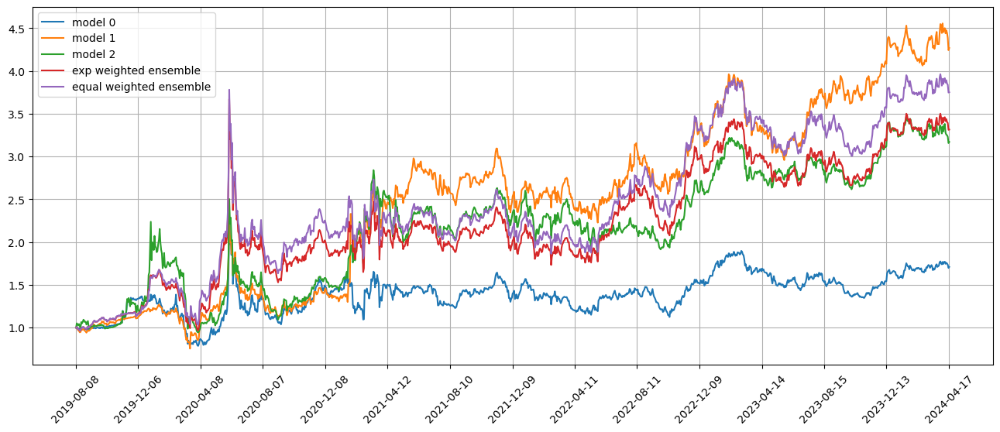

Standardization data are from 2022-09-12 to 2023-06-28
Training data are from 2023-06-29 to 2024-04-15
Testing data are from 2024-03-19 to 2024-05-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 60 out of 67 iterations
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1798365116119385
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2229503393173218
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.184372067451477
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2283045053482056
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.1813445

top_stocks by model 2 to buy on 2024-04-19 are ['PKX', 'BCC', 'VKTX', 'BB', 'NTCT', 'JACK', 'ANF', 'MRIN', 'SCO', 'MSTR']
position on 2024-04-22 market open will be {'SCO': 0.33265091885732995, 'MRIN': 0.3633312675164905, 'MSTR': 0.324768677908067, 'NTCT': 0.3247804528174043, 'PKX': 0.32092273051224884, 'VKTX': 0.314632792299996, 'BCC': 0.31759225753577736, 'BB': 0.31550122147616977, 'JACK': 0.328465144776038, 'ANF': 0.3285054269842336}
Total asset on 2024-04-22 will be 3.27115089068368
It should be the same as 3.271150890683755
top_stocks by return weighted ensemble to buy on 2024-04-19 are ['BB', 'SVXY', 'SPXL', 'FMX', 'AAOI', 'PKX', 'JACK', 'MSTR', 'ANF', 'SMCI']
position on 2024-04-22 market open will be {'AAOI': 0.3330953431453886, 'SVXY': 0.3325627287981301, 'SMCI': 0.2522745202804638, 'SPXL': 0.3362132565036339, 'FMX': 0.3397428752369648, 'PKX': 0.34424685206969, 'MSTR': 0.33196924201720207, 'BB': 0.3384313169215296, 'JACK': 0.3523374362522767, 'ANF': 0.3523806461032699}
Total a

position on 2024-04-25 market open will be {'SMCI': 0.250220255050623, 'WIX': 0.32857177690763023, 'MCK': 0.34830391710756486, 'FTSL': 0.3434672097325108, 'IRWD': 0.33529627237702436, 'VIPS': 0.33822599011908167, 'SVC': 0.3407984830930824, 'RIOT': 0.3251121740269653, 'OTEX': 0.33524273879990135, 'SHOP': 0.32570553565501514}
Total asset on 2024-04-25 will be 3.2709443528693476
It should be the same as 3.270944352869399
top_stocks by equal weighted ensemble to buy on 2024-04-24 are ['SVC', 'MSTR', 'VIPS', 'FTSL', 'MCK', 'SHOP', 'RIOT', 'WIX', 'SMCI', 'IRWD']
position on 2024-04-25 market open will be {'SMCI': 0.2832062706209289, 'WIX': 0.3718867105721546, 'MCK': 0.39422009775642636, 'FTSL': 0.38874577731223736, 'IRWD': 0.37949768228709085, 'VIPS': 0.38281361862298885, 'SVC': 0.3857252379929631, 'MSTR': 0.3597800291554012, 'RIOT': 0.3679710354424001, 'SHOP': 0.36864261869922144}
Total asset on 2024-04-25 will be 3.682489078461731
It should be the same as 3.682489078461812
Testing data fro

position on 2024-04-30 market open will be {'ARKW': 0.33784996641233994, 'WDAY': 0.3245597591745762, 'SPXL': 0.3291097141687775, 'HUBS': 0.33018052968832445, 'SMCI': 0.3468537359206345, 'GDDY': 0.3311936414350277, 'ODFL': 0.3324028162499022, 'MELI': 0.3341456424340209, 'XHB': 0.33143824070823724, 'IGV': 0.32849063796315653}
Total asset on 2024-04-30 will be 3.326224684154946
It should be the same as 3.326224684154997
top_stocks by equal weighted ensemble to buy on 2024-04-29 are ['UPRO', 'XHB', 'SPXL', 'GDDY', 'IGV', 'HUBS', 'ODFL', 'WDAY', 'MELI', 'SMCI']
position on 2024-04-30 market open will be {'SMCI': 0.40739583058677314, 'WDAY': 0.36532918481403365, 'SPXL': 0.3716999811751621, 'HUBS': 0.37290937151316217, 'GDDY': 0.37405359060170845, 'ODFL': 0.375419245386653, 'MELI': 0.3773876116546152, 'XHB': 0.3743298435998221, 'UPRO': 0.371354977344948, 'IGV': 0.37100078998125735}
Total asset on 2024-04-30 will be 3.760880426658054
It should be the same as 3.7608804266581344
Testing data fro

position on 2024-05-03 market open will be {'SMCI': 0.3048828553778901, 'ARKW': 0.3496668759567446, 'MSTR': 0.3887066529994077, 'JNPR': 0.3282075293638328, 'SIG': 0.33361535003683257, 'RS': 0.3360896940196944, 'BSX': 0.32962028143133076, 'DBI': 0.34028214013607483, 'PEN': 0.33352456867699953, 'GWRE': 0.3394382792489705}
Total asset on 2024-05-03 will be 3.384034227247726
It should be the same as 3.3840342272477777
top_stocks by equal weighted ensemble to buy on 2024-05-02 are ['ARKW', 'JNPR', 'DBI', 'GWRE', 'RS', 'PEN', 'SIG', 'BSX', 'MSTR', 'SMCI']
position on 2024-05-03 market open will be {'SMCI': 0.3580990810684631, 'ARKW': 0.3934027895788519, 'MSTR': 0.43732561512844714, 'JNPR': 0.3694595376362392, 'SIG': 0.3755470607632646, 'RS': 0.37833240205519986, 'BSX': 0.37104985680613806, 'DBI': 0.3830517916643446, 'PEN': 0.3754448692038725, 'GWRE': 0.38210186692074366}
Total asset on 2024-05-03 will be 3.823814870825483
It should be the same as 3.8238148708255646
Testing data from 2024-04-

Testing data from 2024-04-10 to 2024-05-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-08 are ['EPI', 'VIPS', 'IRWD', 'KRNT', 'AZPN', 'URA', 'CEIX', 'AMKR', 'GDDY', 'RRC']
position on 2024-05-09 market open will be {'AZPN': 0.1894137389665909, 'CEIX': 0.17747717254650613, 'IRWD': 0.14953540310078237, 'URA': 0.17449461607076994, 'GDDY': 0.1779703182777676, 'VIPS': 0.18446630889229346, 'AMKR': 0.17729595144175556, 'KRNT': 0.1706729139815382, 'EPI': 0.1753910577935541, 'RRC': 0.17730982588400768}
Total asset on 2024-05-09 will be 1.7540273069555428
It should be the same as 1.754027306955566
top_stocks by model 1 to buy on 2024-05-08 are ['DK', 'NXE', 'PSX', 'RRC', 'DELL', 'ST', 'URA', 'CEIX', 'MSTR', 'SMCI']
position on 2024-05-09 market open will be {'SMCI': 0.3550192585413642, 'MSTR': 0.4322455013812923, 'URA': 0.43611437889952614, 'CEIX': 0.441834025301951, 'DELL': 0.4546022999415617, 'ST': 0.45170902430448856, 'NXE': 0.40544830087050354, 'DK': 0.44580688

Testing data from 2024-04-15 to 2024-05-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-13 are ['CVS', 'CHRW', 'IHF', 'LC', 'JACK', 'EQIX', 'WK', 'SBUX', 'PCTY', 'EXTR']
position on 2024-05-14 market open will be {'SBUX': 0.176825673303985, 'EQIX': 0.18088041350216527, 'PCTY': 0.18045550825631196, 'CHRW': 0.18110745939013784, 'WK': 0.18014320120126023, 'EXTR': 0.17761949212156702, 'CVS': 0.17926903815027873, 'LC': 0.17987729474480801, 'IHF': 0.1771675626771138, 'JACK': 0.1814029214901558}
Total asset on 2024-05-14 will be 1.7947485648377606
It should be the same as 1.7947485648377834
top_stocks by model 1 to buy on 2024-05-13 are ['NYCB', 'SAM', 'SNAP', 'AMGN', 'XNCR', 'PCTY', 'AAOI', 'CHRW', 'WK', 'MSTR']
position on 2024-05-14 market open will be {'MSTR': 0.43100851534834245, 'AAOI': 0.4228312118890296, 'NYCB': 0.4684981163551907, 'PCTY': 0.4410212184523117, 'CHRW': 0.44261454351171003, 'WK': 0.4402579608533553, 'SAM': 0.43813827554644047, 'SNAP': 0.4247

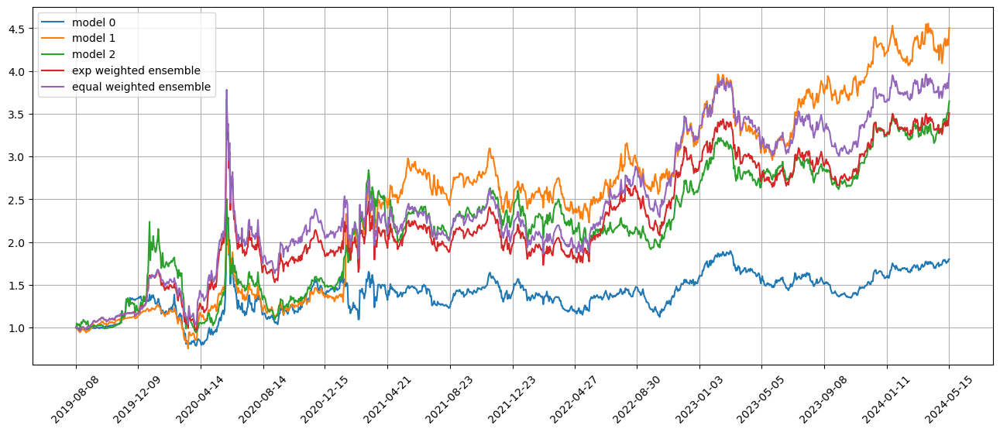

Standardization data are from 2022-10-10 to 2023-07-27
Training data are from 2023-07-28 to 2024-05-13
Testing data are from 2024-04-17 to 2024-06-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 61 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1816070079803467
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2106599807739258
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.192345380783081
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2113354206085205
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.18788659

position on 2024-05-20 market open will be {'KNDI': 0.36794850600043383, 'CHRW': 0.4010740445357951, 'MDB': 0.39918071678947203, 'KOLD': 0.3719291239337323, 'IONS': 0.39418811842073, 'NYCB': 0.4044825027938987, 'PRI': 0.40273952085131765, 'NOK': 0.393777569257225, 'QD': 0.382729556636695, 'ECPG': 0.3984408366260316}
Total asset on 2024-05-20 will be 3.9164904958452498
It should be the same as 3.916490495845331
Testing data from 2024-04-22 to 2024-05-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-20 are ['DRI', 'BJRI', 'ATHM', 'IBTX', 'LVS', 'ZTO', 'JACK', 'RBA', 'HTHT', 'SRNE']
position on 2024-05-21 market open will be {'LVS': 0.17569493574820996, 'IBTX': 0.17624271759549198, 'ATHM': 0.17784898774598945, 'SRNE': 0.178035014680257, 'ZTO': 0.18322770826801188, 'RBA': 0.17846195789923863, 'BJRI': 0.17338177609525277, 'DRI': 0.17590895178348237, 'HTHT': 0.17072333455677047, 'JACK': 0.18024829556526856}
Total asset on 2024-05-21 will be 1.7697736799379502
It 

Testing data from 2024-04-25 to 2024-05-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-23 are ['SAM', 'NOK', 'CHRW', 'ERY', 'SKYW', 'MSCI', 'GL', 'UNH', 'AMN', 'NYCB']
position on 2024-05-24 market open will be {'NYCB': 0.16768500914929463, 'UNH': 0.17775558684458737, 'CHRW': 0.18017420528535028, 'AMN': 0.17748917509484086, 'SAM': 0.17918535176372538, 'SKYW': 0.17693863956863592, 'NOK': 0.1748642257650445, 'MSCI': 0.17402876336442233, 'GL': 0.16987171699015532, 'ERY': 0.18101895319231182}
Total asset on 2024-05-24 will be 1.759011627018345
It should be the same as 1.7590116270183687
top_stocks by model 1 to buy on 2024-05-23 are ['SSD', 'ELF', 'SKYW', 'PRI', 'RYAAY', 'NYCB', 'QD', 'LULU', 'MSTR', 'KOLD']
position on 2024-05-24 market open will be {'RYAAY': 0.4644066985318956, 'ELF': 0.5484770178289509, 'MSTR': 0.44775957758128115, 'NYCB': 0.4349452484098486, 'SSD': 0.4600798532904839, 'LULU': 0.46621954570660706, 'KOLD': 0.5499962305425586, 'PRI': 0.45792

Testing data from 2024-04-30 to 2024-05-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-29 are ['TRU', 'EIDO', 'WST', 'MDB', 'DXCM', 'LULU', 'QSR', 'DGX', 'AON', 'SJM']
position on 2024-05-30 market open will be {'LULU': 0.17480065027014846, 'WST': 0.17167792235105814, 'EIDO': 0.17223872693110628, 'QSR': 0.17435550987731657, 'AON': 0.17166191716646406, 'DGX': 0.17313065683562717, 'MDB': 0.17254356610738447, 'DXCM': 0.1744111712799406, 'SJM': 0.1729462230557351, 'TRU': 0.17385230948688749}
Total asset on 2024-05-30 will be 1.7316186533616444
It should be the same as 1.7316186533616682
top_stocks by model 1 to buy on 2024-05-29 are ['KNSL', 'MDB', 'MSTR', 'CSGP', 'NVR', 'XPO', 'CPAY', 'QD', 'QSR', 'LULU']
position on 2024-05-30 market open will be {'MSTR': 0.4806146723418153, 'LULU': 0.4636064983359798, 'QSR': 0.46531435197872595, 'QD': 0.4821796808549405, 'MDB': 0.47210502910372776, 'CSGP': 0.46123097253978423, 'CPAY': 0.4806174121810405, 'XPO': 0.476711157

Testing data from 2024-05-03 to 2024-05-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-03 are ['IXN', 'LSTR', 'DLB', 'AMT', 'AMKR', 'MCHP', 'LGIH', 'TMHC', 'LW', 'NEAR']
position on 2024-06-04 market open will be {'DLB': 0.17106550302345555, 'AMT': 0.1735193309915805, 'IXN': 0.17123310948813275, 'LGIH': 0.1707514795491652, 'MCHP': 0.16694121276729348, 'TMHC': 0.16867940034974815, 'LSTR': 0.1714367156046162, 'NEAR': 0.1720412785494196, 'AMKR': 0.16702282942325442, 'LW': 0.16933393137047648}
Total asset on 2024-06-04 will be 1.702024791117119
It should be the same as 1.7020247911171424
top_stocks by model 1 to buy on 2024-06-03 are ['SAP', 'DHI', 'DLB', 'EWW', 'LGIH', 'CSGP', 'LW', 'TMHC', 'MGNX', 'NEAR']
position on 2024-06-04 market open will be {'SAP': 0.48138462621851075, 'DLB': 0.48196577577139615, 'EWW': 0.42604585637598935, 'LGIH': 0.4789715423260394, 'DHI': 0.4759185831739739, 'CSGP': 0.4789339140033325, 'TMHC': 0.4731591946228927, 'NEAR': 0.4825895

position on 2024-06-07 market open will be {'GL': 0.1677102584657239, 'CRM': 0.17460774186019165, 'BXMT': 0.16616503503794894, 'LABU': 0.1549031475143573, 'BLMN': 0.16946616108117574, 'SPB': 0.17287013325198383, 'WSM': 0.16738727931585445, 'WRB': 0.16961420680895004, 'ZROZ': 0.16717814421128008, 'EGP': 0.17119719496084057}
Total asset on 2024-06-07 will be 1.6810993025082832
It should be the same as 1.6810993025083065
top_stocks by model 1 to buy on 2024-06-06 are ['SBS', 'PKX', 'SSD', 'XENE', 'SHAK', 'GES', 'CCS', 'BLDR', 'FMX', 'CRM']
position on 2024-06-07 market open will be {'FMX': 0.4778762060861698, 'SSD': 0.4712254643428798, 'CRM': 0.49271847848923717, 'SHAK': 0.4829037042944097, 'GES': 0.47870367377379003, 'SBS': 0.4858879870158293, 'XENE': 0.4538081576280827, 'BLDR': 0.4541092594770145, 'PKX': 0.4604809601294612, 'CCS': 0.4497161739600831}
Total asset on 2024-06-07 will be 4.7074300651969
It should be the same as 4.707430065196958
top_stocks by model 2 to buy on 2024-06-06 ar

Testing data from 2024-05-13 to 2024-06-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-11 are ['ORCL', 'PCH', 'KNSL', 'HAIN', 'PRI', 'AJG', 'FIVE', 'HZO', 'DOX', 'GL']
position on 2024-06-12 market open will be {'GL': 0.16787612727355125, 'KNSL': 0.16819914252461465, 'DOX': 0.16725250737789935, 'PCH': 0.17389421264841948, 'PRI': 0.1672695949692522, 'ORCL': 0.1829944191894262, 'FIVE': 0.1788083451849928, 'AJG': 0.1697350232854833, 'HAIN': 0.17716362260931048, 'HZO': 0.17218505854937505}
Total asset on 2024-06-12 will be 1.7253780536123013
It should be the same as 1.7253780536123249
top_stocks by model 1 to buy on 2024-06-11 are ['XHB', 'ITB', 'HZO', 'RRR', 'KNSL', 'HLX', 'ACMR', 'NVR', 'PRI', 'DOX']
position on 2024-06-12 market open will be {'ITB': 0.48934790163048514, 'KNSL': 0.4658207296587769, 'NVR': 0.4797068771005437, 'DOX': 0.46558638750779957, 'PRI': 0.46563395480621506, 'XHB': 0.48236613632755004, 'RRR': 0.48144190888605426, 'HLX': 0.4885679974648

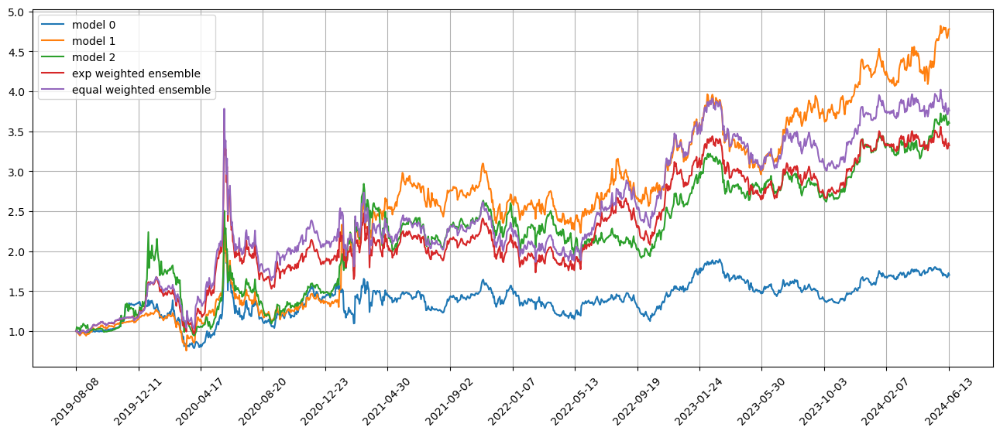

Standardization data are from 2022-11-07 to 2023-08-24
Training data are from 2023-08-25 to 2024-06-11
Testing data are from 2024-05-15 to 2024-07-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 62 out of 67 iterations
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 62.
Epoch 82: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1834105253219604
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2009856700897217
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1867321729660034
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.196574091911316
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.177129

position on 2024-06-18 market open will be {'BRKR': 0.37278660343672804, 'RNR': 0.37992962899744875, 'YANG': 0.3707573331687911, 'RS': 0.3827592202778467, 'KWR': 0.37985327276604985, 'UNIT': 0.3581228763597564, 'ASND': 0.3642414609256453, 'WGO': 0.3768069539726352, 'OTEX': 0.3782432397435462, 'JBL': 0.3907367121737362}
Total asset on 2024-06-18 will be 3.7542373018220996
It should be the same as 3.754237301822184
Testing data from 2024-05-20 to 2024-06-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-18 are ['BC', 'BLMN', 'UNIT', 'MPW', 'ATKR', 'VNO', 'JBLU', 'BYON', 'CLF', 'BLDR']
position on 2024-06-20 market open will be {'UNIT': 0.17032434842140184, 'BYON': 0.17200998869708273, 'BLDR': 0.17078697148735675, 'BLMN': 0.16887833389815407, 'MPW': 0.17196005862942926, 'VNO': 0.17595755524823214, 'ATKR': 0.1711411297119117, 'CLF': 0.17057514669086776, 'JBLU': 0.1753682652531, 'BC': 0.16901230624519215}
Total asset on 2024-06-20 will be 1.7160141042827048
It sh

Testing data from 2024-05-23 to 2024-06-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-24 are ['WGO', 'NEU', 'ODP', 'KNSL', 'EPAM', 'BYON', 'BBVA', 'WLY', 'TNET', 'CPAY']
position on 2024-06-25 market open will be {'BBVA': 0.17287034676674196, 'TNET': 0.1692984006293857, 'ODP': 0.1696229346764991, 'CPAY': 0.17266614896170274, 'NEU': 0.16980317431793354, 'KNSL': 0.16986069038853377, 'EPAM': 0.17010850959737595, 'WGO': 0.16970199240348074, 'WLY': 0.1732997055210763, 'BYON': 0.1670420101708573}
Total asset on 2024-06-25 will be 1.7042739134335634
It should be the same as 1.7042739134335871
top_stocks by model 1 to buy on 2024-06-24 are ['NNDM', 'AVGO', 'SAIA', 'PRO', 'TAP', 'EPAM', 'SBH', 'TNET', 'BLMN', 'CPAY']
position on 2024-06-25 market open will be {'TNET': 0.47912410582015474, 'TAP': 0.4812444401488777, 'SAIA': 0.4849568145302635, 'SBH': 0.4904311520978236, 'BLMN': 0.48159357422943433, 'PRO': 0.48735749556447416, 'CPAY': 0.4882483272723597, 'AVGO': 0.

position on 2024-06-28 market open will be {'BA': 0.175252616791105, 'HUBS': 0.17457902658656588, 'EXTR': 0.17259400409391484, 'PDCO': 0.16903057465688776, 'NEU': 0.16670614388533522, 'RYAAY': 0.17064660514231508, 'ITCI': 0.16670547402353977, 'WEX': 0.16981044682007096, 'SYK': 0.16828360659225047, 'RAMP': 0.17120776015589245}
Total asset on 2024-06-28 will be 1.704816258747854
It should be the same as 1.7048162587478775
top_stocks by model 1 to buy on 2024-06-27 are ['QRVO', 'AAON', 'BA', 'JBL', 'OTEX', 'RAMP', 'NEU', 'RYAAY', 'WEX', 'HUBS']
position on 2024-06-28 market open will be {'JBL': 0.45527041157745013, 'NEU': 0.4732589439309253, 'RYAAY': 0.4805398451140027, 'BA': 0.496111372840215, 'HUBS': 0.4938803562388863, 'AAON': 0.4847093595302425, 'WEX': 0.480390145416441, 'OTEX': 0.4833519716329285, 'RAMP': 0.4843431151492094, 'QRVO': 0.47520563492741585}
Total asset on 2024-06-28 will be 4.807061156357658
It should be the same as 4.807061156357717
top_stocks by model 2 to buy on 2024-

Testing data from 2024-06-03 to 2024-07-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-02 are ['BDX', 'RRR', 'ARGX', 'CPA', 'RYAAY', 'HUBS', 'KSS', 'JELD', 'GPC', 'DG']
position on 2024-07-03 market open will be {'JELD': 0.1638748876715624, 'CPA': 0.16438797781539927, 'HUBS': 0.16471253843324174, 'GPC': 0.16812211980485098, 'RYAAY': 0.16973952183911664, 'DG': 0.16523881779580132, 'KSS': 0.1626421179518305, 'RRR': 0.16767208035340556, 'ARGX': 0.16648915046093601, 'BDX': 0.1657566263650056}
Total asset on 2024-07-03 will be 1.6586358384911264
It should be the same as 1.6586358384911501
top_stocks by model 1 to buy on 2024-07-02 are ['HUBS', 'CVS', 'RYAAY', 'RDN', 'ABT', 'NEU', 'BLDR', 'DG', 'QD', 'JELD']
position on 2024-07-03 market open will be {'BLDR': 0.481039206306024, 'JELD': 0.4787244706834309, 'HUBS': 0.471875917457527, 'RDN': 0.4836582920949407, 'CVS': 0.4731292977282684, 'NEU': 0.47901551830125527, 'RYAAY': 0.486277446504767, 'DG': 0.4733836263387

top_stocks by model 0 to buy on 2024-07-08 are ['XHB', 'FMX', 'NAIL', 'RUSHA', 'AOS', 'TREX', 'FBIN', 'BLDR', 'ITB', 'PHM']
position on 2024-07-09 market open will be {'FMX': 0.17021057781359267, 'BLDR': 0.16580689181115887, 'AOS': 0.16539983777186773, 'NAIL': 0.16670616959223947, 'FBIN': 0.16682492289191655, 'PHM': 0.16485538603995165, 'RUSHA': 0.16487695667526214, 'TREX': 0.1644403748017279, 'XHB': 0.16543895627702299, 'ITB': 0.16572714171053574}
Total asset on 2024-07-09 will be 1.660287215385252
It should be the same as 1.6602872153852757
top_stocks by model 1 to buy on 2024-07-08 are ['TOL', 'SAIA', 'MHO', 'FMX', 'RRR', 'FDX', 'PHM', 'NAIL', 'BLDR', 'ITB']
position on 2024-07-09 market open will be {'FMX': 0.48964777046671515, 'BLDR': 0.4769796092946837, 'SAIA': 0.46544496681378783, 'FDX': 0.4802295491365199, 'NAIL': 0.48140106584772696, 'TOL': 0.4764876366266993, 'PHM': 0.4760565175511397, 'ITB': 0.47857390553986545, 'MHO': 0.4806507706082298, 'RRR': 0.4855450842842045}
Total ass

position on 2024-07-12 market open will be {'FR': 0.17509130283811136, 'IOVA': 0.1739051446006422, 'FMX': 0.16627679434424075, 'BLDR': 0.17342341719676854, 'TOL': 0.1718921687422044, 'PHM': 0.1706903339690616, 'CSGP': 0.16923591081171582, 'SKY': 0.1675038175251912, 'CX': 0.168669086485519, 'CCS': 0.17450551700486802}
Total asset on 2024-07-12 will be 1.7111934935182993
It should be the same as 1.7111934935183228
top_stocks by model 1 to buy on 2024-07-11 are ['RF', 'LULU', 'CUBE', 'RYAAY', 'BLDR', 'NVR', 'CX', 'QD', 'CCS', 'FR']
position on 2024-07-12 market open will be {'RYAAY': 0.4767410863942911, 'FR': 0.5107545569262687, 'QD': 0.4770700144533995, 'BLDR': 0.5056477156067902, 'CUBE': 0.49104011493370514, 'LULU': 0.4860254803738085, 'RF': 0.48693604925507106, 'NVR': 0.49754295682490735, 'CX': 0.49178559420334156, 'CCS': 0.5088027756607807}
Total asset on 2024-07-12 will be 4.9323463446323
It should be the same as 4.932346344632364
top_stocks by model 2 to buy on 2024-07-11 are ['IOVA

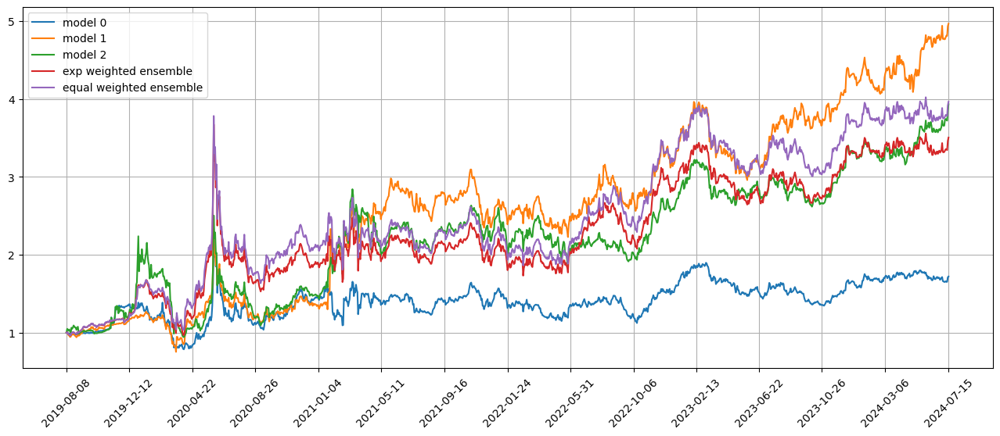

Standardization data are from 2022-12-06 to 2023-09-22
Training data are from 2023-09-25 to 2024-07-11
Testing data are from 2024-06-13 to 2024-08-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 63 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1812824010849
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.3802341222763062
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.17927885055542
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.386842131614685
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.17375874519348

top_stocks by equal weighted ensemble to buy on 2024-07-17 are ['NAIL', 'PHM', 'QD', 'IRTC', 'NEU', 'GPN', 'CX', 'BLMN', 'BLDR', 'FMX']
position on 2024-07-18 market open will be {'QD': 0.4222247847345408, 'FMX': 0.40331712902447125, 'BLDR': 0.40137276446222353, 'NAIL': 0.4085207402099726, 'BLMN': 0.4161480775726017, 'PHM': 0.4034369527346553, 'NEU': 0.3974171168743376, 'CX': 0.38466639427721855, 'GPN': 0.40522475781501954, 'IRTC': 0.3938826394001128}
Total asset on 2024-07-18 will be 4.036211357105069
It should be the same as 4.036211357105154
Testing data from 2024-06-18 to 2024-07-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-18 are ['QD', 'GDXJ', 'TRU', 'JBL', 'ACLS', 'ERX', 'EWW', 'HMC', 'GUSH', 'FMX']
position on 2024-07-19 market open will be {'QD': 0.18223777857163445, 'FMX': 0.1732885927998407, 'HMC': 0.1708881785470299, 'ERX': 0.17761413857573247, 'EWW': 0.17114718499260825, 'GDXJ': 0.1645753271100897, 'GUSH': 0.17136931258692084, 'ACLS': 0.169

Testing data from 2024-06-24 to 2024-07-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-23 are ['FTV', 'ITB', 'SKY', 'LECO', 'TPH', 'TOL', 'BLDR', 'TMHC', 'CX', 'CCS']
position on 2024-07-24 market open will be {'ITB': 0.17375218522420746, 'SKY': 0.17845725362937562, 'TOL': 0.17552914668154626, 'TPH': 0.17927184530821566, 'CX': 0.17927335330166527, 'CCS': 0.17730186598053396, 'FTV': 0.16034005181043315, 'BLDR': 0.17598132225921076, 'LECO': 0.172515862515246, 'TMHC': 0.17441483732343735}
Total asset on 2024-07-24 will be 1.746837724033848
It should be the same as 1.7468377240338715
top_stocks by model 1 to buy on 2024-07-23 are ['RUSHA', 'EXP', 'TMHC', 'TPH', 'LECO', 'WY', 'NAIL', 'CX', 'BLDR', 'CCS']
position on 2024-07-24 market open will be {'NAIL': 0.5222532406953284, 'BLDR': 0.500843203279618, 'CX': 0.5130044702515631, 'CCS': 0.5073629078544857, 'RUSHA': 0.49313038918662605, 'EXP': 0.5006690263260284, 'TMHC': 0.4993920452034665, 'TPH': 0.50826502878917

top_stocks by model 0 to buy on 2024-07-26 are ['VAC', 'WRB', 'APAM', 'CHE', 'CME', 'BLDR', 'CRM', 'THG', 'DXCM', 'CBOE']
position on 2024-07-29 market open will be {'CRM': 0.17595609759437586, 'THG': 0.17504744345896273, 'WRB': 0.17681875137042613, 'BLDR': 0.17697831170135586, 'CHE': 0.17480866167004275, 'CBOE': 0.17176989859101677, 'VAC': 0.17029033764017418, 'DXCM': 0.1708465248695883, 'CME': 0.17480697011583213, 'APAM': 0.17189501591517067}
Total asset on 2024-07-29 will be 1.7392180129269212
It should be the same as 1.7392180129269452
top_stocks by model 1 to buy on 2024-07-26 are ['FCNCA', 'NAIL', 'XPO', 'VAC', 'CX', 'MIDD', 'CBOE', 'LECO', 'BLDR', 'DXCM']
position on 2024-07-29 market open will be {'BLDR': 0.49266781050807884, 'NAIL': 0.507817606616972, 'CBOE': 0.47816875998248454, 'VAC': 0.4740499951058317, 'DXCM': 0.4755982952444972, 'LECO': 0.48179256463160275, 'XPO': 0.48133765792476285, 'CX': 0.4849445000208033, 'FCNCA': 0.49818731538563993, 'MIDD': 0.4812044075620819}
Tota

Testing data from 2024-07-02 to 2024-07-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-31 are ['DXJ', 'ARCH', 'ULTA', 'AMZN', 'DBA', 'MRVL', 'ACLS', 'MELI', 'FSLR', 'TRU']
position on 2024-08-01 market open will be {'TRU': 0.17826223308537573, 'ARCH': 0.18305931459807193, 'DBA': 0.17516082264339028, 'MRVL': 0.17472944953817968, 'AMZN': 0.1813778169034068, 'DXJ': 0.17112310315766513, 'MELI': 0.17896963842129737, 'ACLS': 0.16493142115519432, 'FSLR': 0.17649341493597054, 'ULTA': 0.17485980784003408}
Total asset on 2024-08-01 will be 1.7589670222785618
It should be the same as 1.758967022278586
top_stocks by model 1 to buy on 2024-07-31 are ['FSLR', 'EME', 'META', 'MELI', 'LPG', 'GE', 'VST', 'FIX', 'ETN', 'ANF']
position on 2024-08-01 market open will be {'LPG': 0.5136545338918304, 'ANF': 0.4956665355267638, 'GE': 0.49657330496327956, 'EME': 0.5032602338528869, 'MELI': 0.5015592139262613, 'FSLR': 0.49461964185268625, 'FIX': 0.5239159537702742, 'META': 0.54965

Testing data from 2024-07-08 to 2024-08-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-05 are ['CXW', 'TEAM', 'AAOI', 'TCOM', 'DBA', 'TPR', 'PLAY', 'OKTA', 'ARCH', 'CX']
position on 2024-08-06 market open will be {'CX': 0.16323195998695178, 'TPR': 0.15993866756614647, 'PLAY': 0.15825878658278017, 'ARCH': 0.163379491156622, 'TCOM': 0.1707055286471479, 'DBA': 0.16529394213598553, 'AAOI': 0.1674942308416404, 'TEAM': 0.1693135899709296, 'CXW': 0.15835518146550753, 'OKTA': 0.16792350188544403}
Total asset on 2024-08-06 will be 1.6438948802391307
It should be the same as 1.6438948802391558
top_stocks by model 1 to buy on 2024-08-05 are ['DBA', 'CX', 'RGNX', 'CLDX', 'CMG', 'VST', 'ELF', 'PLAY', 'DECK', 'CELH']
position on 2024-08-06 market open will be {'CX': 0.46758109066177245, 'RGNX': 0.490935083585695, 'CMG': 0.4886316207401781, 'CELH': 0.4809965276873721, 'DBA': 0.46074335265405286, 'ELF': 0.5252440750747716, 'CLDX': 0.4457673989377315, 'DECK': 0.4696555781

top_stocks by model 0 to buy on 2024-08-08 are ['IEV', 'VYMI', 'EZU', 'SIG', 'EWG', 'HSBC', 'VGK', 'TRIP', 'SAN', 'EWQ']
position on 2024-08-09 market open will be {'SIG': 0.16566490948951548, 'SAN': 0.16711652261126897, 'HSBC': 0.1657326300998533, 'IEV': 0.16607121325866323, 'VGK': 0.16619702249860022, 'EZU': 0.16559336961943377, 'VYMI': 0.16597087284107573, 'EWQ': 0.16554306085706694, 'TRIP': 0.1707478689702625, 'EWG': 0.1657421979388605}
Total asset on 2024-08-09 will be 1.6643796681845755
It should be the same as 1.6643796681846006
top_stocks by model 1 to buy on 2024-08-08 are ['BWA', 'EWQ', 'BBVA', 'LULU', 'PLAY', 'CELH', 'BLDR', 'SIG', 'SAN', 'THRM']
position on 2024-08-09 market open will be {'CELH': 0.4367581025453507, 'BLDR': 0.464801072575826, 'BBVA': 0.48017090761310327, 'LULU': 0.4852390493515416, 'BWA': 0.4777674944765971, 'SIG': 0.4734026073354159, 'PLAY': 0.48233654370851264, 'EWQ': 0.4755582633919558, 'THRM': 0.46085940847332535, 'SAN': 0.47178578806710747}
Total asset

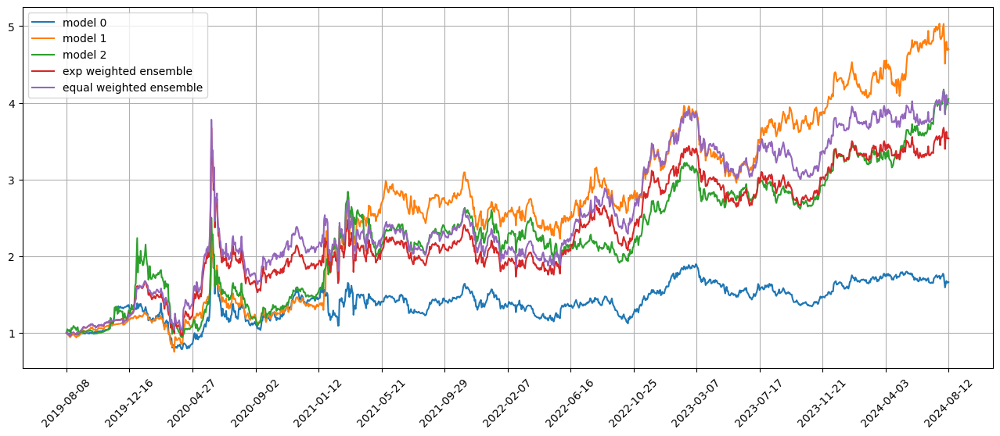

Standardization data are from 2023-01-05 to 2023-10-20
Training data are from 2023-10-23 to 2024-08-08
Testing data are from 2024-07-15 to 2024-09-06
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 64 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 58.
Epoch 78: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1883994340896606
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1470879316329956
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1918302774429321
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1551910638809204
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.17978

position on 2024-08-15 market open will be {'ODP': 0.40541505757693785, 'ABR': 0.4078385666376841, 'BX': 0.4202479575890092, 'HD': 0.422556253227287, 'MKTX': 0.4103819444656552, 'EHTH': 0.4155354194240923, 'WTS': 0.4135410796654986, 'LOW': 0.4186511195073503, 'TPR': 0.43312769178940386, 'MAN': 0.40516898971230125}
Total asset on 2024-08-15 will be 4.152464079595132
It should be the same as 4.1524640795952195
Testing data from 2024-07-18 to 2024-08-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-15 are ['ITB', 'WTS', 'TMHC', 'DHI', 'VRRM', 'HPP', 'BBWI', 'DBI', 'HTH', 'GES']
position on 2024-08-16 market open will be {'WTS': 0.17018481918143297, 'HPP': 0.17316821406335714, 'DHI': 0.1704898358208746, 'DBI': 0.1702766207367999, 'BBWI': 0.17164786526032255, 'ITB': 0.1708019965788763, 'TMHC': 0.1711060669431293, 'HTH': 0.170032979528608, 'GES': 0.17051061184442018, 'VRRM': 0.16794805118211226}
Total asset on 2024-08-16 will be 1.7061670611399071
It should be th

Testing data from 2024-07-23 to 2024-08-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-20 are ['TRIP', 'TSCO', 'QD', 'MRVL', 'MDT', 'CELH', 'UHAL', 'FDS', 'EHTH', 'LMBS']
position on 2024-08-21 market open will be {'FDS': 0.17334398890898445, 'MRVL': 0.1740966536125515, 'EHTH': 0.1721124970016104, 'LMBS': 0.172929425471131, 'UHAL': 0.17557458381207022, 'TSCO': 0.1724522602906861, 'MDT': 0.17733670991738035, 'CELH': 0.17209142061785493, 'QD': 0.16787937935188932, 'TRIP': 0.17071074528954022}
Total asset on 2024-08-21 will be 1.728527664273672
It should be the same as 1.7285276642736986
top_stocks by model 1 to buy on 2024-08-20 are ['FITB', 'MTB', 'UHAL', 'XRT', 'PFSI', 'MDT', 'QD', 'FDS', 'EHTH', 'CSGP']
position on 2024-08-21 market open will be {'FDS': 0.48007318445469926, 'CSGP': 0.48602086461106664, 'EHTH': 0.47551385785379285, 'FITB': 0.4774244559865597, 'UHAL': 0.48507894048373734, 'PFSI': 0.47720479045808206, 'XRT': 0.4827975078755941, 'MTB': 0.477

top_stocks by model 0 to buy on 2024-08-23 are ['ANGI', 'CEIX', 'LULU', 'KRNT', 'TSEM', 'BHC', 'OSIS', 'SBH', 'EEFT', 'FDS']
position on 2024-08-26 market open will be {'FDS': 0.17326817637267103, 'CEIX': 0.17637300375221368, 'SBH': 0.17582948042912433, 'LULU': 0.18009272546228686, 'BHC': 0.17845358167845546, 'KRNT': 0.175346929401832, 'EEFT': 0.17874604739110778, 'ANGI': 0.1794516516552602, 'TSEM': 0.17796415884665098, 'OSIS': 0.16715076597373393}
Total asset on 2024-08-26 will be 1.7626765209633093
It should be the same as 1.7626765209633362
top_stocks by model 1 to buy on 2024-08-23 are ['OSIS', 'GFI', 'ARKW', 'CX', 'YUM', 'PPLT', 'ABR', 'BAP', 'EEFT', 'MSTR']
position on 2024-08-26 market open will be {'PPLT': 0.5012798452826388, 'GFI': 0.47778541403393066, 'BAP': 0.49138811677931443, 'ARKW': 0.49688324310388254, 'MSTR': 0.5221277401614484, 'YUM': 0.47912268533084446, 'EEFT': 0.49348313095089485, 'ABR': 0.4905629543888059, 'CX': 0.49335038445294027, 'OSIS': 0.4614708103339131}
Tota

Testing data from 2024-07-31 to 2024-08-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-28 are ['BEN', 'CPRT', 'FSLR', 'WBS', 'CX', 'SBLK', 'SID', 'COO', 'BBWI', 'BMO']
position on 2024-08-29 market open will be {'BBWI': 0.1624824439438683, 'WBS': 0.17786632323230328, 'CX': 0.16480659172730375, 'CPRT': 0.17482510677213886, 'SID': 0.1702119154254695, 'SBLK': 0.17329576669697822, 'COO': 0.1908907049949504, 'BMO': 0.17208275747833499, 'BEN': 0.16732361950106198, 'FSLR': 0.1703767638575628}
Total asset on 2024-08-29 will be 1.7241619936299455
It should be the same as 1.724161993629972
top_stocks by model 1 to buy on 2024-08-28 are ['ZION', 'FTI', 'ESNT', 'LNC', 'MET', 'CNC', 'APAM', 'BMO', 'YUM', 'BEN']
position on 2024-08-29 market open will be {'CNC': 0.4935984978127404, 'YUM': 0.4951997595979323, 'ZION': 0.5027058391556851, 'FTI': 0.4980783696598949, 'MET': 0.49845947078460234, 'BMO': 0.48758356133976793, 'LNC': 0.49695689679527993, 'BEN': 0.474098901529163

position on 2024-09-04 market open will be {'ZTO': 0.17312811691751576, 'ATHM': 0.17802119930439508, 'FDS': 0.1769092349685216, 'VLO': 0.16841622841729703, 'BBWI': 0.1689041340499263, 'TROW': 0.17050763352938939, 'PLAY': 0.16874644876291103, 'APLE': 0.1711844083231918, 'CX': 0.1653383789413176, 'HUBG': 0.16962684033477654}
Total asset on 2024-09-04 will be 1.7107826235492154
It should be the same as 1.7107826235492423
top_stocks by model 1 to buy on 2024-09-03 are ['PK', 'DINO', 'CX', 'PAVE', 'VIS', 'YUM', 'TROW', 'ZTO', 'VLO', 'LMBS']
position on 2024-09-04 market open will be {'YUM': 0.4883447564115136, 'DINO': 0.48283107036096246, 'ZTO': 0.4889193118421979, 'VLO': 0.4818147832222812, 'LMBS': 0.49278268166992417, 'TROW': 0.4877979946395087, 'VIS': 0.48136002639396186, 'PK': 0.47432561765061443, 'PAVE': 0.4759984746544852, 'CX': 0.4730094953233894}
Total asset on 2024-09-04 will be 4.827184212168767
It should be the same as 4.827184212168839
top_stocks by model 2 to buy on 2024-09-03 

position on 2024-09-09 market open will be {'PEB': 0.1632927991489599, 'MJ': 0.17132637876350928, 'CPRT': 0.17390710501267936, 'RWM': 0.1766094563694186, 'CPAY': 0.17277976151387978, 'BBWI': 0.17017241089669458, 'DG': 0.17545773068876172, 'BHC': 0.17460569910901383, 'CRI': 0.1788191501978447, 'CMCSA': 0.17322669430177343}
Total asset on 2024-09-09 will be 1.7301971860025078
It should be the same as 1.7301971860025354
top_stocks by model 1 to buy on 2024-09-06 are ['CRI', 'BAP', 'OKTA', 'ARGX', 'MA', 'PYPL', 'WRB', 'YUM', 'ANSS', 'CPRT']
position on 2024-09-09 market open will be {'CPRT': 0.4887415435195044, 'BAP': 0.4913763114904601, 'MA': 0.49102863236186906, 'PYPL': 0.4770729324859539, 'WRB': 0.48797738009521724, 'ANSS': 0.48353434902295045, 'YUM': 0.4853517597009782, 'CRI': 0.5025461580317189, 'ARGX': 0.4877781673852594, 'OKTA': 0.47261039879689}
Total asset on 2024-09-09 will be 4.86801763289073
It should be the same as 4.868017632890802
top_stocks by model 2 to buy on 2024-09-06 a

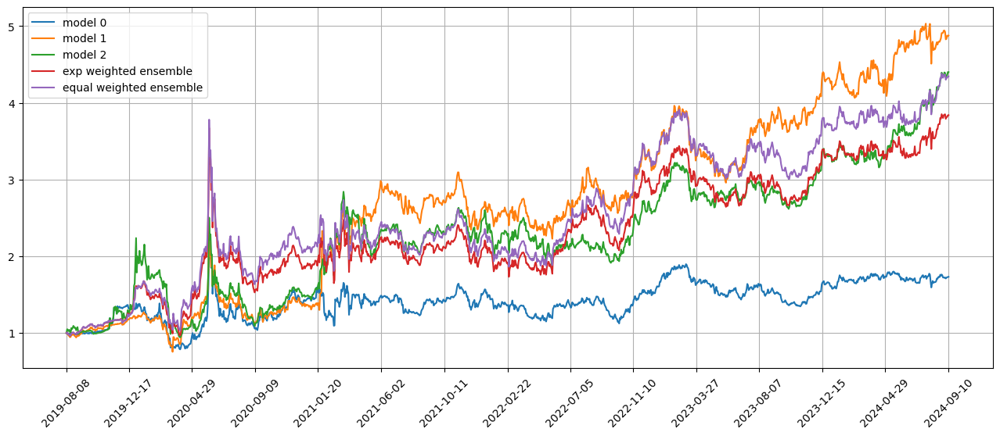

Standardization data are from 2023-02-03 to 2023-11-17
Training data are from 2023-11-20 to 2024-09-06
Testing data are from 2024-08-12 to 2024-10-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 65 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 40.
Epoch 60: early stopping
Restoring model weights from the end of the best epoch: 20.
Epoch 40: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1894543170928955
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.1884126663208008
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.1810275316238403
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1855231523513794
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.178598

position on 2024-09-13 market open will be {'CPRT': 0.4346525233126708, 'MCK': 0.4436064017318505, 'LHX': 0.4484015684394442, 'ZTO': 0.45019427667251505, 'BRK-B': 0.4410757007622218, 'WRB': 0.44930826870610224, 'WTM': 0.4444751475751894, 'BBD': 0.4539881880392949, 'HPQ': 0.44372525786778594, 'BRK-A': 0.44146970209690356}
Total asset on 2024-09-13 will be 4.450897035203894
It should be the same as 4.450897035203979
Testing data from 2024-08-15 to 2024-09-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-13 are ['J', 'IWB', 'IWV', 'DGRW', 'OMF', 'XLY', 'TROW', 'IBB', 'LNC', 'FDS']
position on 2024-09-16 market open will be {'FDS': 0.17951312727960927, 'IWV': 0.17732780764603087, 'DGRW': 0.17759472696677475, 'IBB': 0.18001131386451455, 'LNC': 0.17711841923340407, 'J': 0.1788264311698935, 'TROW': 0.1774522661184626, 'IWB': 0.1771469384528757, 'OMF': 0.18056537882150742, 'XLY': 0.17759086249985415}
Total asset on 2024-09-16 will be 1.7831472720528996
It should be

top_stocks by model 0 to buy on 2024-09-18 are ['CNI', 'AFG', 'ORI', 'AJG', 'ESNT', 'CAL', 'CPRT', 'WTM', 'L', 'WRB']
position on 2024-09-19 market open will be {'CAL': 0.1845901087732807, 'CPRT': 0.18252133840214615, 'CNI': 0.1776103847472361, 'L': 0.18044486626411188, 'WTM': 0.18017337735706593, 'WRB': 0.17804950412090167, 'ORI': 0.18025236024637414, 'AJG': 0.17597104268297795, 'ESNT': 0.1836270199116745, 'AFG': 0.1799024742197917}
Total asset on 2024-09-19 will be 1.8031424767255329
It should be the same as 1.8031424767255606
top_stocks by model 1 to buy on 2024-09-18 are ['SMFG', 'CSX', 'TXT', 'WTM', 'CI', 'LHX', 'AJG', 'ESNT', 'WRB', 'CPRT']
position on 2024-09-19 market open will be {'TXT': 0.5107417351377656, 'CPRT': 0.5194709564703877, 'LHX': 0.5126519362919402, 'CI': 0.512190175977046, 'WTM': 0.512788463450554, 'WRB': 0.5067437430300779, 'CSX': 0.5174501171677434, 'AJG': 0.5008282683760066, 'SMFG': 0.5186215090542059, 'ESNT': 0.5226178182912274}
Total asset on 2024-09-19 will 

position on 2024-09-24 market open will be {'QD': 0.18025806503578823, 'TFIN': 0.17622693533429748, 'CSTM': 0.18169721555189616, 'ALLY': 0.1781662308175316, 'MLKN': 0.1861828917341767, 'LPG': 0.18108493704568496, 'HPE': 0.1813943052030818, 'FDX': 0.18269516875706218, 'DHT': 0.18198645627854154, 'WMT': 0.1833623969096451}
Total asset on 2024-09-24 will be 1.8130546026676775
It should be the same as 1.8130546026677057
top_stocks by model 1 to buy on 2024-09-23 are ['AAPL', 'MLKN', 'WU', 'FDX', 'CPRT', 'DECK', 'HEFA', 'QD', 'HPE', 'DHT']
position on 2024-09-24 market open will be {'QD': 0.5130965970150185, 'HEFA': 0.5100152977998128, 'CPRT': 0.5101957707926768, 'MLKN': 0.5251406122507082, 'HPE': 0.5116341013176574, 'AAPL': 0.51105213738541, 'FDX': 0.515303269181734, 'DHT': 0.5133043008478905, 'DECK': 0.5204240256255426, 'WU': 0.5163197562278589}
Total asset on 2024-09-24 will be 5.146485868444236
It should be the same as 5.14648586844431
top_stocks by model 2 to buy on 2024-09-23 are ['BV

top_stocks by model 1 to buy on 2024-09-26 are ['CALF', 'HLNE', 'INDB', 'EQT', 'IYE', 'HII', 'FDX', 'FHB', 'ZD', 'WSFS']
position on 2024-09-27 market open will be {'CALF': 0.5169285027658049, 'WSFS': 0.5178781875872118, 'INDB': 0.5156657569964311, 'FDX': 0.5125868686653233, 'HII': 0.5186841380340945, 'HLNE': 0.5145319883775594, 'ZD': 0.5147920596085274, 'IYE': 0.515863559222824, 'EQT': 0.5294091902474863, 'FHB': 0.5197176804915544}
Total asset on 2024-09-27 will be 5.176057931996741
It should be the same as 5.176057931996818
top_stocks by model 2 to buy on 2024-09-26 are ['ERIE', 'FN', 'BIO', 'INDB', 'UCTT', 'HLNE', 'KN', 'WSFS', 'GMS', 'ZD']
position on 2024-09-27 market open will be {'WSFS': 0.48026194002905404, 'FN': 0.4837509084474291, 'BIO': 0.496385807861644, 'UCTT': 0.4705415023996567, 'KN': 0.47850960496658174, 'INDB': 0.47821021004085285, 'GMS': 0.4784072189519804, 'HLNE': 0.4771587930677221, 'ZD': 0.47739997394176575, 'ERIE': 0.47397968294245263}
Total asset on 2024-09-27 wi

top_stocks by model 1 to buy on 2024-10-01 are ['COR', 'VCEL', 'NRG', 'CBU', 'OZK', 'WPM', 'ACN', 'VRSK', 'FHB', 'RDY']
position on 2024-10-02 market open will be {'COR': 0.5188763401646516, 'VCEL': 0.4859521765322427, 'RDY': 0.5234917422035688, 'WPM': 0.516439078027631, 'CBU': 0.5085708506801709, 'ACN': 0.5170556900384321, 'NRG': 0.5272175152776613, 'OZK': 0.508298599187973, 'VRSK': 0.5152576485073257, 'FHB': 0.5079048868281032}
Total asset on 2024-10-02 will be 5.129064527447682
It should be the same as 5.129064527447761
top_stocks by model 2 to buy on 2024-10-01 are ['CBU', 'SFIX', 'NRG', 'AEO', 'FHB', 'OZK', 'RITM', 'INFY', 'ACN', 'FCNCA']
position on 2024-10-02 market open will be {'RITM': 0.47140295169358154, 'INFY': 0.4791991749510143, 'SFIX': 0.4511028373636994, 'CBU': 0.469564934820501, 'ACN': 0.4773990114981081, 'AEO': 0.46837560638049663, 'NRG': 0.48678145408154416, 'OZK': 0.4693135642316879, 'FCNCA': 0.4740955337073123, 'FHB': 0.4689500484730613}
Total asset on 2024-10-02 w

position on 2024-10-07 market open will be {'AIN': 0.5159161327604378, 'RVTY': 0.5142436938831213, 'LLY': 0.5264474524058437, 'L': 0.5268669282905803, 'NEU': 0.5168348398375079, 'BBWI': 0.5202515890080646, 'LC': 0.5187573257185772, 'PPC': 0.5368242308592539, 'SMFG': 0.5332353021811566, 'INFY': 0.526507626765513}
Total asset on 2024-10-07 will be 5.235885121709975
It should be the same as 5.235885121710057
top_stocks by model 2 to buy on 2024-10-04 are ['MDRX', 'AIN', 'XPO', 'INFY', 'SAH', 'ERY', 'L', 'DRIP', 'BBWI', 'PPC']
position on 2024-10-07 market open will be {'XPO': 0.46368220025747353, 'AIN': 0.46857365849732857, 'SAH': 0.47953937102762123, 'DRIP': 0.4737409672851447, 'L': 0.47851956636719883, 'BBWI': 0.4725112763894771, 'PPC': 0.4875631480602232, 'MDRX': 0.46217807469839395, 'INFY': 0.47819323574984895, 'ERY': 0.4708507086186901}
Total asset on 2024-10-07 will be 4.735352206951301
It should be the same as 4.735352206951401
top_stocks by return weighted ensemble to buy on 2024-

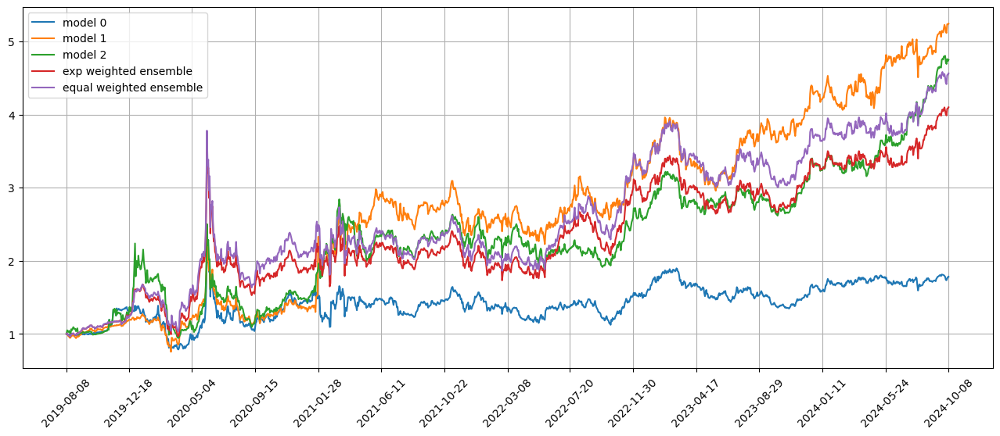

Standardization data are from 2023-03-06 to 2023-12-18
Training data are from 2023-12-19 to 2024-10-04
Testing data are from 2024-09-10 to 2024-11-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 66 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 33.
Epoch 53: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1936802864074707
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.140137791633606
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.182914137840271
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.1397262811660767
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 1.18220520

position on 2024-10-11 market open will be {'KOLD': 0.4922022919678304, 'MPC': 0.47104778182933554, 'LNW': 0.4594321150419213, 'BKD': 0.4701432315263324, 'L': 0.4600447878597396, 'WRB': 0.4579418096397519, 'RSG': 0.4592534664441059, 'PPC': 0.4538953479824872, 'SMFG': 0.46982503468731335, 'SBS': 0.4568549666397758}
Total asset on 2024-10-11 will be 4.650640833618506
It should be the same as 4.650640833618594
Testing data from 2024-09-13 to 2024-10-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-10-11 are ['WSM', 'KOLD', 'MUSA', 'RDY', 'LSTR', 'EXEL', 'RITM', 'GRMN', 'PPC', 'NEAR']
position on 2024-10-14 market open will be {'KOLD': 0.20299237017804128, 'PPC': 0.17678282147789232, 'RITM': 0.18084291161926813, 'RDY': 0.1840179968771172, 'WSM': 0.18498711255988792, 'EXEL': 0.18483341285334076, 'GRMN': 0.18186070031060078, 'LSTR': 0.1857848059058593, 'NEAR': 0.1814858185967377, 'MUSA': 0.18324682037801954}
Total asset on 2024-10-14 will be 1.8468347707567354
It sh

position on 2024-10-17 market open will be {'KOLD': 0.2152958068783137, 'NUGT': 0.19489652583558625, 'SMFG': 0.18625574797498626, 'HMY': 0.20537199418599109, 'EWJ': 0.18346376561557287, 'AEM': 0.18274084447486952, 'RACE': 0.1870230939226912, 'EPI': 0.18144505714911868, 'EWY': 0.18182507322409963, 'NRG': 0.18698901487327746}
Total asset on 2024-10-17 will be 1.9053069241344756
It should be the same as 1.9053069241345066
top_stocks by model 1 to buy on 2024-10-16 are ['MOG-A', 'INSM', 'JNUG', 'EWJ', 'SBS', 'UNH', 'CDNA', 'SMFG', 'AEM', 'KOLD']
position on 2024-10-17 market open will be {'KOLD': 0.5624237468028723, 'SBS': 0.5345506462851518, 'AEM': 0.5551206722847175, 'SMFG': 0.5422149200507008, 'UNH': 0.546614434136156, 'EWJ': 0.5451503871392499, 'INSM': 0.5550304985680651, 'MOG-A': 0.5479808301844696, 'JNUG': 0.5516198160838356, 'CDNA': 0.5396372384670035}
Total asset on 2024-10-17 will be 5.4803431900021335
It should be the same as 5.480343190002222
top_stocks by model 2 to buy on 2024

position on 2024-10-22 market open will be {'NUGT': 0.18813390564087612, 'SIVR': 0.19061325613593955, 'PSLV': 0.19080398307726823, 'HMY': 0.18977898330580514, 'JNUG': 0.18905540877089438, 'PAAS': 0.188323175192143, 'SLV': 0.19063069962746734, 'AEM': 0.19051021021506048, 'SCCO': 0.19149339691034917, 'SBS': 0.18887412693477146}
Total asset on 2024-10-22 will be 1.8982171458105435
It should be the same as 1.898217145810575
top_stocks by model 1 to buy on 2024-10-21 are ['NUGT', 'SLV', 'GDXJ', 'INSM', 'PSLV', 'SBS', 'JNUG', 'AEM', 'HMY', 'PAAS']
position on 2024-10-22 market open will be {'NUGT': 0.537258267725761, 'GDXJ': 0.5392167285468707, 'INSM': 0.5253375276969537, 'PSLV': 0.5448832685106169, 'JNUG': 0.5398898251457327, 'PAAS': 0.5377987690824967, 'SLV': 0.5443884190269556, 'AEM': 0.5440443346750761, 'HMY': 0.5419561533807861, 'SBS': 0.5393721344885712}
Total asset on 2024-10-22 will be 5.394145428279733
It should be the same as 5.3941454282798205
top_stocks by model 2 to buy on 2024-

top_stocks by model 0 to buy on 2024-10-24 are ['CBOE', 'NWSA', 'FUL', 'ERIE', 'ITRI', 'STNG', 'AOS', 'MPLX', 'MDRX', 'GOGL']
position on 2024-10-25 market open will be {'STNG': 0.18670664220681746, 'AOS': 0.18757418733117362, 'NWSA': 0.18781239999016766, 'CBOE': 0.18808913431229082, 'FUL': 0.1882101316857836, 'ITRI': 0.18723492716727227, 'MPLX': 0.18652527249002224, 'MDRX': 0.1900897103302897, 'ERIE': 0.18427104450537848, 'GOGL': 0.19047618424864546}
Total asset on 2024-10-25 will be 1.8769896342678087
It should be the same as 1.8769896342678414
top_stocks by model 1 to buy on 2024-10-24 are ['SUN', 'FCX', 'KO', 'ACMR', 'MMM', 'ITRI', 'FUL', 'MMYT', 'MDRX', 'GOGL']
position on 2024-10-25 market open will be {'FCX': 0.5222249003177956, 'MMM': 0.5272280897299056, 'MMYT': 0.5525026736543527, 'SUN': 0.5423152225227607, 'FUL': 0.536211022222403, 'ITRI': 0.5334326626991236, 'KO': 0.5286533352438398, 'MDRX': 0.5415659453463113, 'GOGL': 0.5426670102728787, 'ACMR': 0.5337761249075849}
Total as

top_stocks by model 0 to buy on 2024-10-29 are ['GRMN', 'FRO', 'KLAC', 'KO', 'MCD', 'AOS', 'UCTT', 'LMT', 'WRB', 'MDRX']
position on 2024-10-30 market open will be {'KLAC': 0.19174908497073273, 'AOS': 0.18864363383334073, 'UCTT': 0.1848023808311959, 'WRB': 0.1875522678415249, 'MCD': 0.18665404654012896, 'GRMN': 0.21330800866743413, 'FRO': 0.18258001356967798, 'KO': 0.1863994535446959, 'MDRX': 0.18530609821773086, 'LMT': 0.18660572526324554}
Total asset on 2024-10-30 will be 1.893600713279675
It should be the same as 1.8936007132797077
top_stocks by model 1 to buy on 2024-10-29 are ['NVMI', 'AIZ', 'AVGO', 'KLAC', 'LC', 'ACGL', 'LUMN', 'MDRX', 'WRB', 'WSM']
position on 2024-10-30 market open will be {'KLAC': 0.544881455293154, 'AIZ': 0.5395130344597736, 'LUMN': 0.5720386883500579, 'WRB': 0.5357439103893586, 'WSM': 0.5399951262541126, 'LC': 0.5399385306457197, 'NVMI': 0.5601073329859624, 'AVGO': 0.5545068322125428, 'ACGL': 0.5322801064707894, 'MDRX': 0.5293277165917661}
Total asset on 202

position on 2024-11-04 market open will be {'INFY': 0.18658439827206905, 'CSL': 0.18811721793674788, 'AFL': 0.18769294531987693, 'ACGL': 0.1835047914469853, 'HII': 0.19224961883124222, 'CVLT': 0.18680326119898494, 'HIG': 0.1867829966505105, 'TDG': 0.18826494366363558, 'EPI': 0.18585135045960777, 'CL': 0.18682205667150892}
Total asset on 2024-11-04 will be 1.8726735804511365
It should be the same as 1.8726735804511692
top_stocks by model 1 to buy on 2024-11-01 are ['HII', 'HUBG', 'UFPI', 'INFY', 'XHB', 'CVLT', 'ITB', 'ECL', 'DHI', 'TDG']
position on 2024-11-04 market open will be {'INFY': 0.5396408499774793, 'DHI': 0.5346262870445456, 'HII': 0.5532511264098431, 'XHB': 0.539210789432203, 'CVLT': 0.5375777351532279, 'ITB': 0.538538694552061, 'ECL': 0.5421790145394231, 'TDG': 0.5417841282526668, 'UFPI': 0.5385007127868043, 'HUBG': 0.5384544446355575}
Total asset on 2024-11-04 will be 5.403763782783723
It should be the same as 5.403763782783812
top_stocks by model 2 to buy on 2024-11-01 are

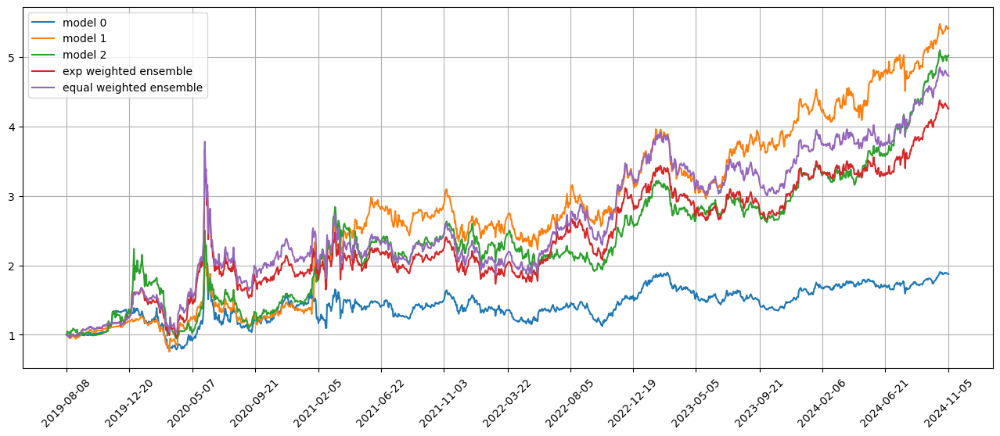

Standardization data are from 2023-04-03 to 2024-01-18
Training data are from 2024-01-19 to 2024-11-01
Testing data are from 2024-10-08 to 2024-12-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 67 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 1.1911170482635498
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 1.2756657600402832
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 1.188889741897583
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 1.2793772220611572
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 1.1911826

position on 2024-11-08 market open will be {'AMT': 0.4931469361078492, 'LEN': 0.5034498470886275, 'FBND': 0.4968360173359356, 'DHI': 0.49904783810990094, 'PHM': 0.5022118497736099, 'XHB': 0.4962266170253615, 'ITB': 0.49777414319078955, 'NNN': 0.4948573862194783, 'NVR': 0.49304220454663383, 'ECL': 0.4926084051819389}
Total asset on 2024-11-08 will be 4.9692012445800335
It should be the same as 4.969201244580126
Testing data from 2024-10-11 to 2024-11-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-11-08 are ['ITB', 'NSIT', 'BCC', 'ESNT', 'CCS', 'RDN', 'FBIN', 'TREE', 'MTG', 'NMIH']
position on 2024-11-11 market open will be {'ITB': 0.2034528593661073, 'CCS': 0.2021838480094989, 'RDN': 0.19867446917142595, 'FBIN': 0.20051496087184856, 'NSIT': 0.1998133946956656, 'BCC': 0.20451373554787694, 'MTG': 0.199962744730302, 'ESNT': 0.20074659767769973, 'TREE': 0.19984873856915336, 'NMIH': 0.20154018389240114}
Total asset on 2024-11-11 will be 2.011251532531947
It should

Testing data from 2024-10-16 to 2024-11-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-11-13 are ['KRYS', 'NNN', 'DY', 'FCPT', 'JBGS', 'DHI', 'NVR', 'NTAP', 'EGO', 'IRM']
position on 2024-11-14 market open will be {'DHI': 0.19299861453712447, 'EGO': 0.1934803407090375, 'KRYS': 0.19006300138827148, 'FCPT': 0.19688673151847857, 'DY': 0.19120267462327337, 'NTAP': 0.19140779777333564, 'NNN': 0.1940854477280649, 'IRM': 0.19822509719326264, 'JBGS': 0.19591742447575858, 'NVR': 0.19620301125019704}
Total asset on 2024-11-14 will be 1.9404701411967724
It should be the same as 1.9404701411968044
top_stocks by model 1 to buy on 2024-11-13 are ['VNQ', 'LEN', 'IRM', 'JBGS', 'MTG', 'DY', 'NTAP', 'NVR', 'EGO', 'DHI']
position on 2024-11-14 market open will be {'DHI': 0.5675398111996767, 'LEN': 0.5711435618492784, 'EGO': 0.5656822012513685, 'DY': 0.5590229450169161, 'VNQ': 0.5748806152781061, 'NTAP': 0.5596226675242757, 'IRM': 0.5795545372342502, 'MTG': 0.5663230291551794, 

top_stocks by model 1 to buy on 2024-11-18 are ['QLD', 'QQQ', 'HII', 'AGI', 'IBB', 'GDX', 'XLK', 'XSD', 'GDXJ', 'AMZN']
position on 2024-11-19 market open will be {'HII': 0.5490368149272337, 'GDXJ': 0.6025812568631902, 'GDX': 0.597175819463433, 'XLK': 0.5668964121521076, 'XSD': 0.5696948088788805, 'AMZN': 0.555211292084658, 'QLD': 0.5667163317096977, 'IBB': 0.5624120123207175, 'AGI': 0.5844060227875961, 'QQQ': 0.5678263518512886}
Total asset on 2024-11-19 will be 5.721957123038711
It should be the same as 5.721957123038804
top_stocks by model 2 to buy on 2024-11-18 are ['TECL', 'IYW', 'QQQ', 'AMZN', 'QLD', 'UPRO', 'XLK', 'SPXL', 'GDX', 'GDXJ']
position on 2024-11-19 market open will be {'GDXJ': 0.5627902945064889, 'GDX': 0.5577418007614594, 'SPXL': 0.5226883860252145, 'XLK': 0.5255462755113376, 'AMZN': 0.5147134827846425, 'IYW': 0.5265497952850314, 'QLD': 0.5253793303626787, 'TECL': 0.5220237636986778, 'UPRO': 0.5227584407545337, 'QQQ': 0.5264083842403369}
Total asset on 2024-11-19 wil

position on 2024-11-22 market open will be {'ROST': 0.6507790319444242, 'RACE': 0.5917399163653949, 'GDXJ': 0.5869464864702004, 'FBT': 0.58722738029284, 'IBB': 0.5845605824128016, 'COPX': 0.5783121693179555, 'CMG': 0.595050372030917, 'AEM': 0.5847348476892529, 'XBI': 0.5851811616242824, 'SCCO': 0.5668547711307202}
Total asset on 2024-11-22 will be 5.9113867192786955
It should be the same as 5.91138671927879
top_stocks by model 2 to buy on 2024-11-21 are ['GDXJ', 'XLP', 'SILJ', 'XSD', 'ARKK', 'SOXL', 'RTX', 'JNUG', 'NUGT', 'LABU']
position on 2024-11-22 market open will be {'NUGT': 0.5477807638150849, 'GDXJ': 0.5445050655961886, 'LABU': 0.5473770861530233, 'XSD': 0.5476177188957381, 'SOXL': 0.5428732341695844, 'RTX': 0.5440776529712014, 'XLP': 0.5472854857728034, 'JNUG': 0.5487410556363672, 'ARKK': 0.529654584494326, 'SILJ': 0.5470684394682748}
Total asset on 2024-11-22 will be 5.4469810869724915
It should be the same as 5.446981086972592
top_stocks by return weighted ensemble to buy on

position on 2024-11-27 market open will be {'KT': 0.6465248279252537, 'SAIC': 0.598144135532208, 'RACE': 0.5984629186050959, 'BVN': 0.6054547495537043, 'HRB': 0.6080335010397026, 'KGC': 0.613395527971102, 'PAAS': 0.6049064079698474, 'NTAP': 0.6118398994965889, 'VST': 0.6282958319518158, 'HMY': 0.6124262761560124}
Total asset on 2024-11-27 will be 6.127484076201235
It should be the same as 6.1274840762013305
top_stocks by model 2 to buy on 2024-11-26 are ['BAH', 'CACI', 'NTAP', 'KT', 'MTUM', 'XHB', 'DB', 'KOLD', 'HRB', 'VST']
position on 2024-11-27 market open will be {'CACI': 0.5448078684517037, 'DB': 0.5333817061905415, 'KT': 0.5750560856248472, 'BAH': 0.5411438046022429, 'KOLD': 0.612107561309591, 'HRB': 0.549633020096938, 'MTUM': 0.5467250635247811, 'NTAP': 0.5530738210988129, 'XHB': 0.5398175671597354, 'VST': 0.5679491920091518}
Total asset on 2024-11-27 will be 5.563695690068242
It should be the same as 5.563695690068345
top_stocks by return weighted ensemble to buy on 2024-11-26 

top_stocks by model 2 to buy on 2024-12-02 are ['KT', 'HRB', 'CACI', 'LBTYA', 'SBH', 'SAN', 'LBTYK', 'CIG', 'MLI', 'IDEX']
position on 2024-12-03 market open will be {'KT': 0.5397279521544394, 'CACI': 0.5539777245774943, 'SBH': 0.5511488406556995, 'IDEX': 0.5567199958305741, 'CIG': 0.5452412101061337, 'HRB': 0.5544679525251341, 'LBTYA': 0.5594838418416631, 'LBTYK': 0.563269645866201, 'MLI': 0.5537010389759063, 'SAN': 0.5627713233424307}
Total asset on 2024-12-03 will be 5.540509525875573
It should be the same as 5.540509525875676
top_stocks by return weighted ensemble to buy on 2024-12-02 are ['BAH', 'LBTYA', 'SBH', 'HRB', 'LBTYK', 'CACI', 'KT', 'MLI', 'CIG', 'IDEX']
position on 2024-12-03 market open will be {'BAH': 0.4689718640224163, 'KT': 0.4526788275370271, 'CACI': 0.4646303491274675, 'SBH': 0.46225771704153473, 'IDEX': 0.46693033772482934, 'CIG': 0.457302888854437, 'HRB': 0.4650415114763466, 'LBTYA': 0.46924842143125683, 'LBTYK': 0.4724236383535451, 'MLI': 0.464398288302707}
Tota

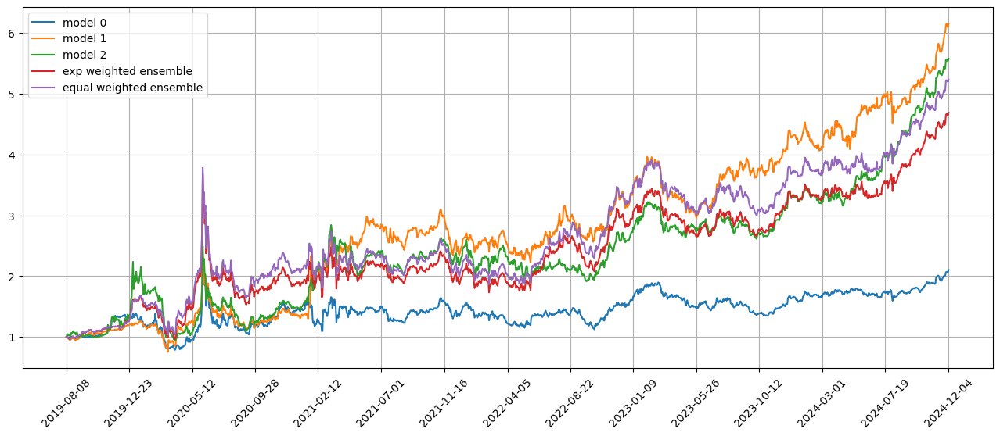

In [17]:
# Retrain all the rest
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\CNN_Class.ipynb
print(f'Running {num_iters} iterations; first iteration already completed.')
first_run = False

for num_iter in range(1, num_iters):
    # Find train and test data
    ftd += seq_length
    ltd += seq_length
    data_train, x_train, y_train, data_test, x_test, y_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)
    print(f'Running iteration {num_iter+1} out of {num_iters} iterations')
    CNN_model.retrain_model(x_train, y_train, sector_train) 
    CNN_model.evaluate_model(x_train, y_train, sector_train, x_test, y_test, sector_test, batch_size)

    if save:
        for i in range(model_params['num_models']):
            CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

    gc.collect()
    
    # Check how much the weights are trained
    print("Correlations between old and new weights")
    for i in range(num_of_models):
        new_weights[i] = CNN_model.model_dict[i].get_weights()
        print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
        x = old_weights[i][-1]
        y = new_weights[i][-1]
        print(np.corrcoef(x.reshape(40, ), y.reshape(40, ))[0, 1])
    old_weights = new_weights.copy()
    
    total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, 
                                                                            position_dict_all, return_dict)

In [18]:
import json

with open('total_asset_dict.json', 'w') as f:
    json.dump(total_asset_dict, f)
    
# with open('total_asset_dict.json', 'r') as fr:
#     test = json.load(fr)

In [19]:
last_simul_day = "2024-12-03"
rfr = list(data[data['datadate'] <= last_simul_day][['datadate', 'TBill1y']].drop_duplicates(subset=['datadate'])['TBill1y'])
rfr = rfr[-(len(total_asset_dict[0])-1):]

def calculate_SR(total_asset, rfr):
    '''
    Calculates the Sharpe Ratio of the simulated strategy
    Inputs:
        total_asset: list of total assets on each day
        rfr: list of risk-free rates on the same days as in total_asset
    Output:
        SR: Sharpe Ratio
    '''
    
    daily_ret = [(total_asset[i] - total_asset[i-1]) / total_asset[i-1] for i in range(1, len(total_asset))]
    assert len(daily_ret) == len(rfr)
    excess_ret = [daily_ret[i] - rfr[i] for i in range(len(rfr))]
    SR = np.mean(excess_ret) / np.std(excess_ret) * np.sqrt(252)
    
    return SR

for key, item in total_asset_dict.items():
    SR = calculate_SR(item, rfr)
    print(f'SR for model {key} is {SR}')

SR for model 0 is 0.47396584096204347
SR for model 1 is 0.8573212667595578
SR for model 2 is 0.8385076449200596
SR for model ensemble_weighted is 0.7863938861290495
SR for model ensemble_equal is 0.8323808594171976
